# Машинное обучение, ФКН ВШЭ

## Практическое задание 5. Решающие деревья

### Общая информация
Дата выдачи: 29.11.2023

Мягий дедлайн: 23:59 12.12.2023

Жестокий дедлайн: 23:59 14.12.2023

### О задании

Задание состоит из двух разделов:
1. В первом разделе вы научитесь применять деревья из sklearn для задачи классификации. Вы посмотрите какие разделяющие поверхности деревья строят для различных датасетов и проанализируете их зависимость от различных гиперпараметров.
2. Во втором разделе вы попробуете реализовать свое решающее дерево и сравните его со стандартное имплиментацией из sklearn. Вы также протестируете деревья на более сложных датасетах и сравните различные подходы к кодированию категориальных признаков.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.


### Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-05-trees-Username.ipynb
* Модуль hw5code.py
* Ссылки на посылки в Яндекс.Контесте для обеих задач

В контест https://contest.yandex.ru/contest/56884/problems/ нужно отправить файл hw5code.py с реализованными функциями и классами.

Username — ваша фамилия и имя на латинице именно в таком порядке

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже:

__Оценка:__ 11

In [744]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from matplotlib.colors import Colormap, ListedColormap
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns
sns.set(style='whitegrid')

import warnings
warnings.filterwarnings('ignore')

# 1. Решающие деревья. Визуализация.

В этой части мы рассмотрим два простых двумерных датасета сделанных с помощью `make_moons`, `make_circles` и посмотрим как ведет себя разделяющая поверхность в зависимости от различных гиперпараметров.

In [745]:
from sklearn.datasets import make_moons, make_circles, make_classification
datasets = [
    make_circles(noise=0.2, factor=0.5, random_state=42),
    make_moons(noise=0.2, random_state=42),
    make_classification(n_classes=3, n_clusters_per_class=1, n_features=2, class_sep=.8, random_state=3,
                        n_redundant=0., )
]

In [746]:
palette = sns.color_palette(n_colors=3)
cmap = ListedColormap(palette)

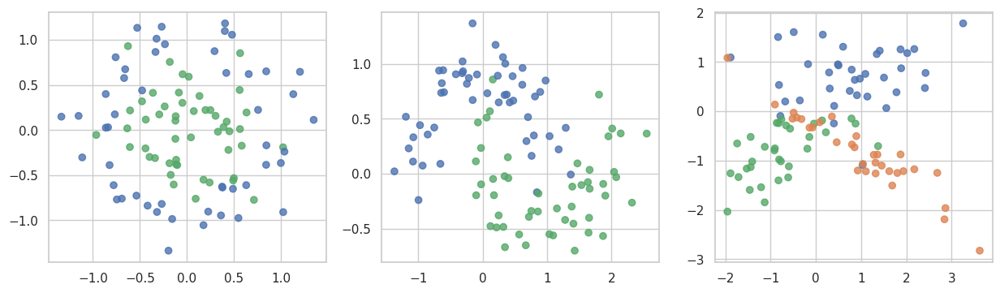

In [747]:
plt.figure(figsize=(15, 4))
for i, (x, y) in enumerate(datasets):
    plt.subplot(1, 3, i + 1)
    plt.scatter(x[:, 0], x[:, 1], c=y, cmap=cmap, alpha=.8)

__Задание 1. (1 балл)__

Для каждого датасета обучите решающее дерево с параметрами по умолчанию, предварительно разбив выборку на обучающую и тестовую. Постройте разделящие поверхности (для этого воспользуйтесь функцией `plot_surface`, пример ниже). Посчитайте accuracy на обучающей и тестовой выборках. Сильно ли деревья переобучились?

In [748]:
def plot_surface(clf, X, y):
    plot_step = 0.01
    palette = sns.color_palette(n_colors=len(np.unique(y)))
    cmap = ListedColormap(palette)
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=cmap, alpha=0.3)

    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap, alpha=.7,
                edgecolors=np.array(palette)[y], linewidths=2)
    plt.show()

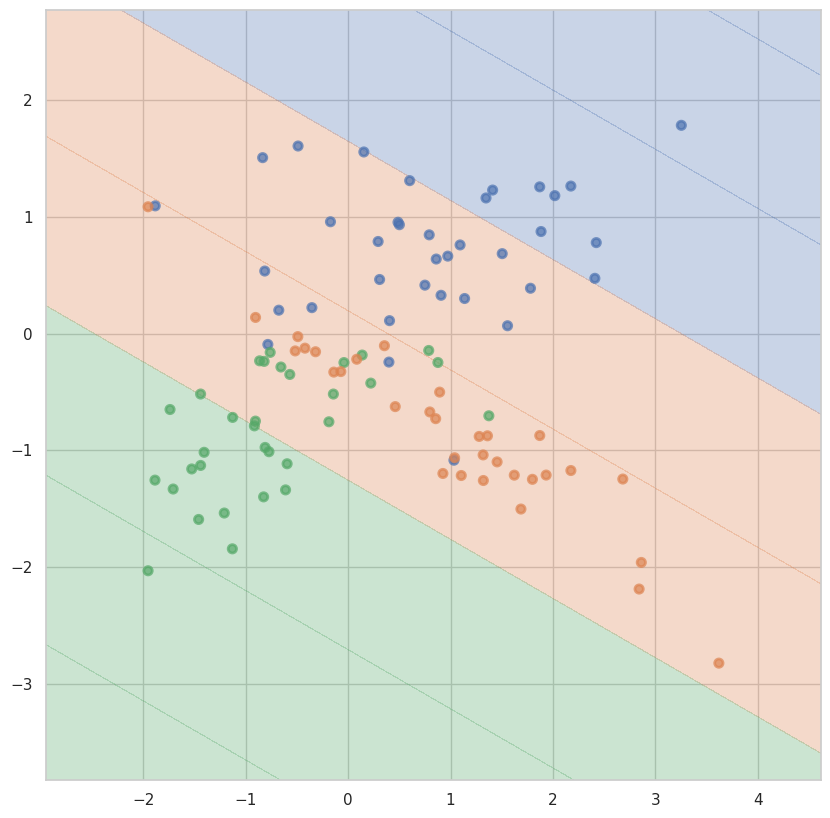

In [749]:
# Пример:
from sklearn.linear_model import LinearRegression
X, y = datasets[2]
lr  = LinearRegression().fit(X, y)
plot_surface(lr, X, y)

In [750]:
### ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

In [751]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

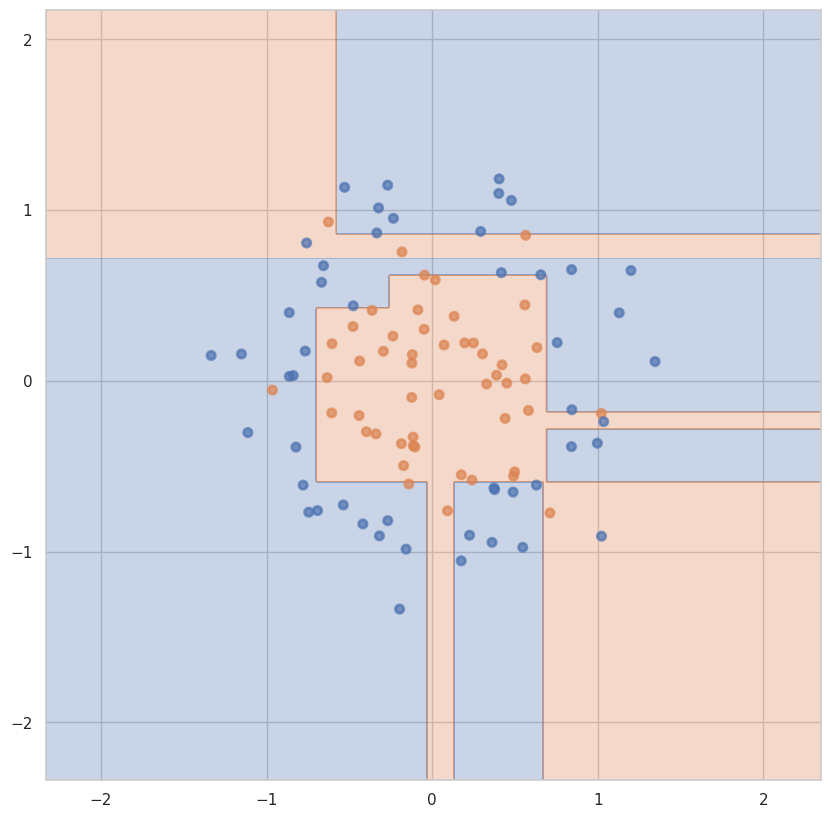

На обучающей: 1.0
На тестовой: 0.75


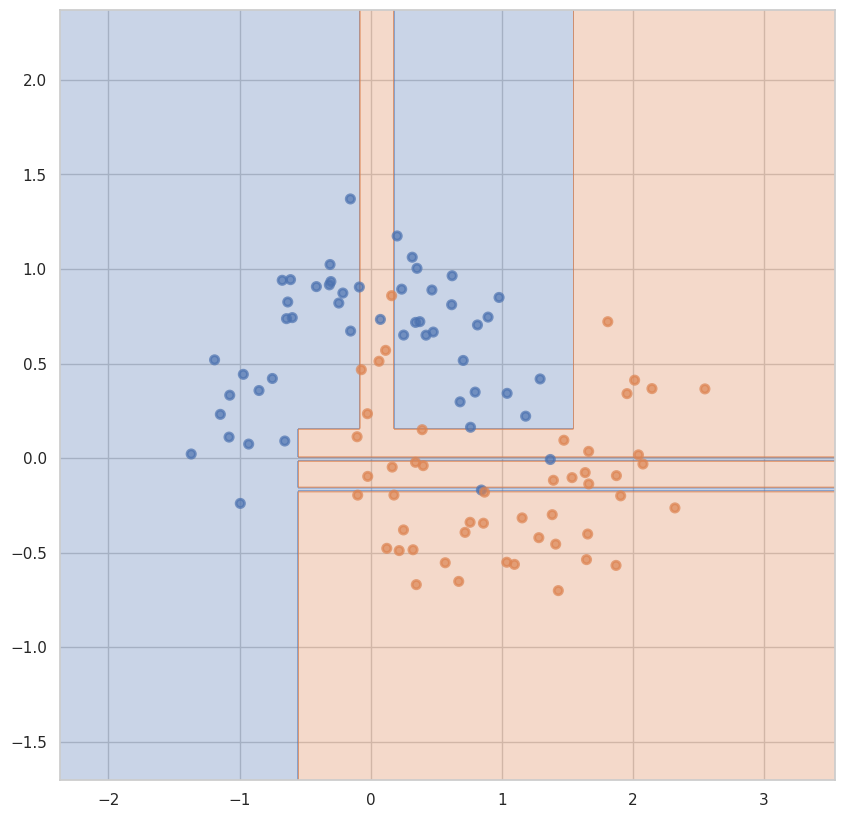

На обучающей: 1.0
На тестовой: 0.95


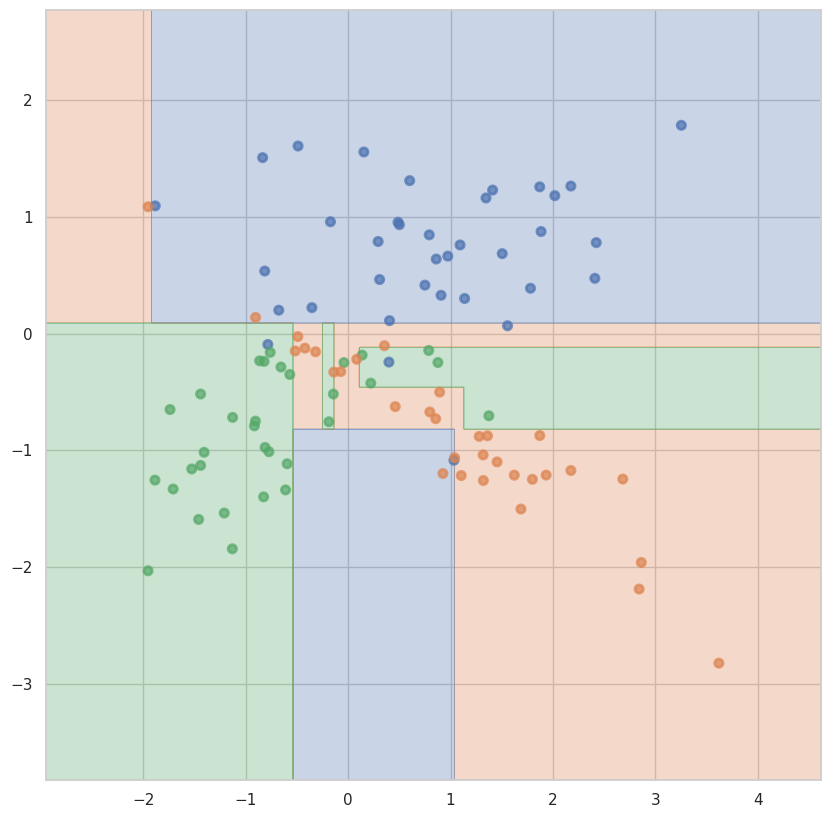

На обучающей: 1.0
На тестовой: 0.7


In [752]:
for i in range(len(datasets)):
    X, y = datasets[i]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    dtc  = DecisionTreeClassifier().fit(X_train, y_train)
    plot_surface(dtc, X, y)

    y_pred_train = dtc.predict(X_train)

    print("На обучающей:", accuracy_score(y_pred_train, y_train))

    y_pred_test = dtc.predict(X_test)

    print("На тестовой:", accuracy_score(y_pred_test, y_test))



__Ответ:__ Деревья склонны к переобучению и на обучающей выборке деревья переобучились, так как на них работает без ошибок с accuracy = 1.
На графиках есть тонкие поверхности, что тоже говорит о переобучении

__Задание 2. (1.5 балла)__

Попробуйте перебрать несколько параметров для регуляризации (напр. `max_depth`, `min_samples_leaf`). Для каждого набора гиперпараметров постройте разделяющую поверхность, выведите обучающую и тестовую ошибки. Можно делать кросс-валидацию или просто разбиение на трейн и тест, главное делайте каждый раз одинаковое разбиение, чтобы можно было корректно сравнивать (помните же, что итоговое дерево сильно зависит от небольшого изменения обучающей выборки?). Проследите как меняется разделяющая поверхность и обобщающая способность. Почему так происходит, одинаково ли изменение для разных датасетов?

Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 1:


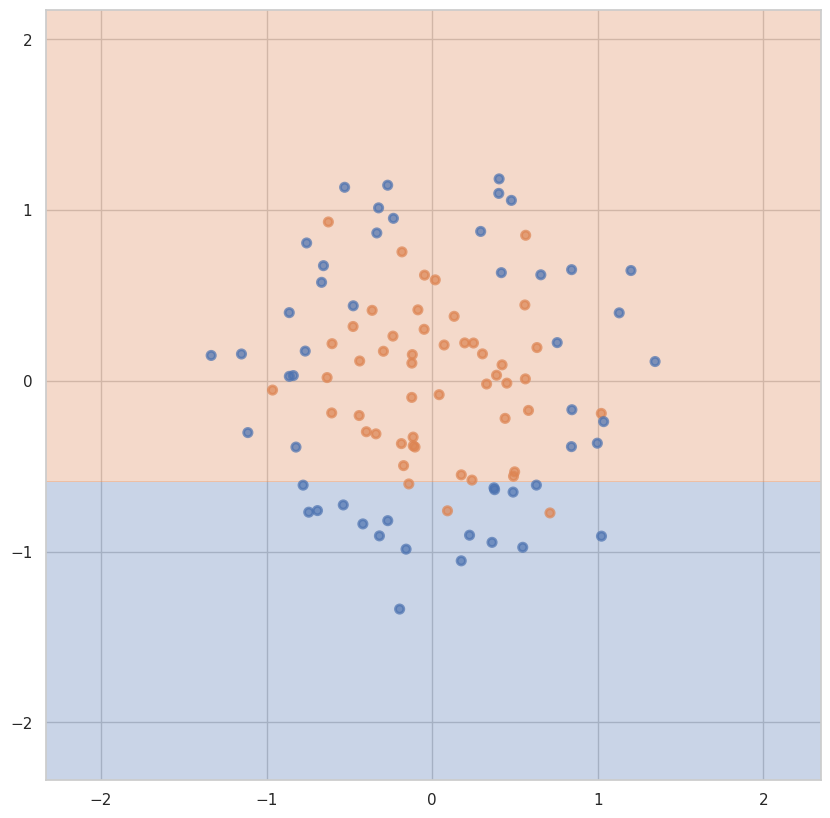

На обучающей для max_depth = 1 и min_samples_leaf = 1: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 1: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 2:


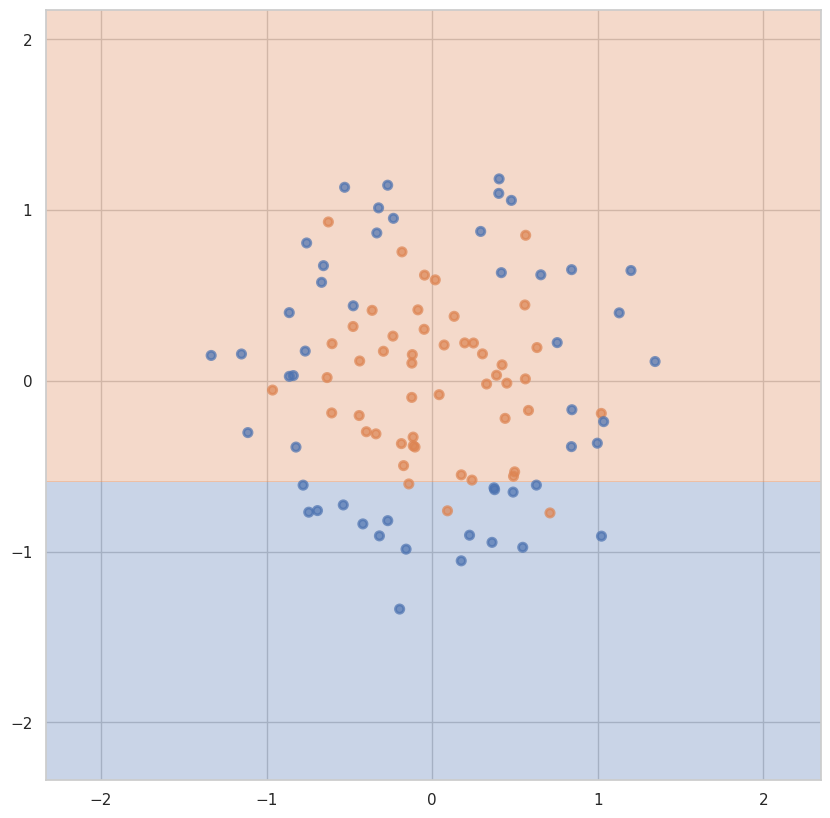

На обучающей для max_depth = 1 и min_samples_leaf = 2: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 2: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 3:


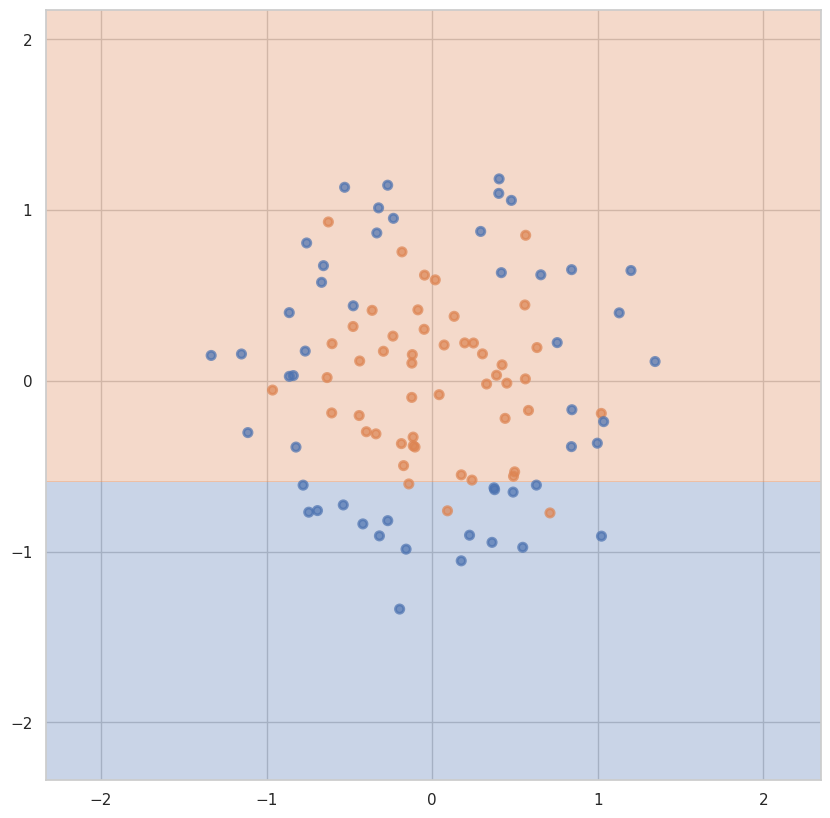

На обучающей для max_depth = 1 и min_samples_leaf = 3: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 3: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 4:


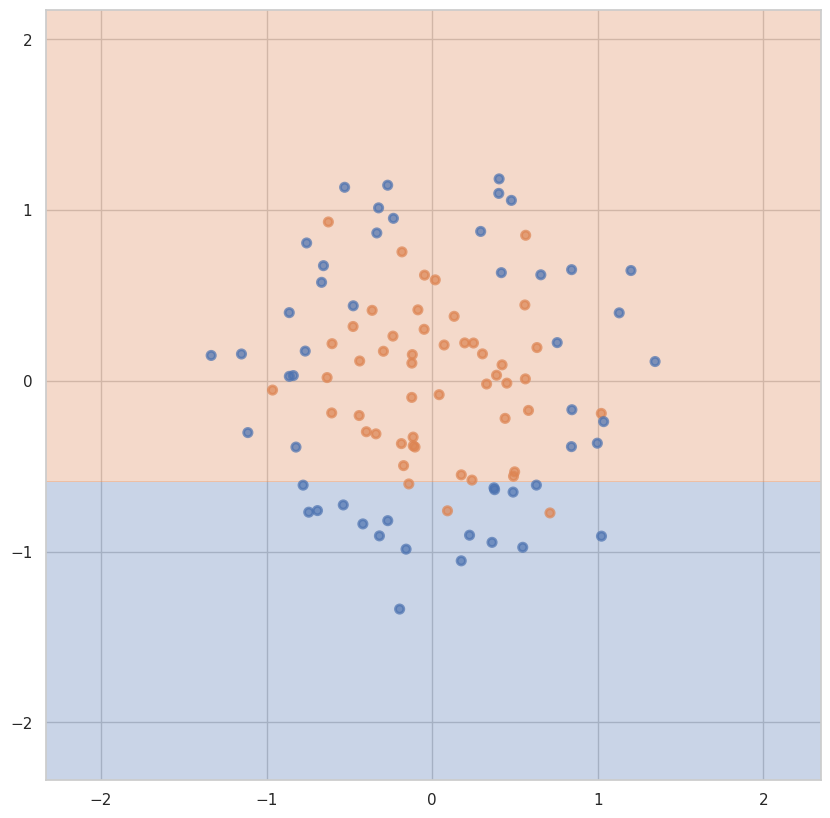

На обучающей для max_depth = 1 и min_samples_leaf = 4: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 4: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 5:


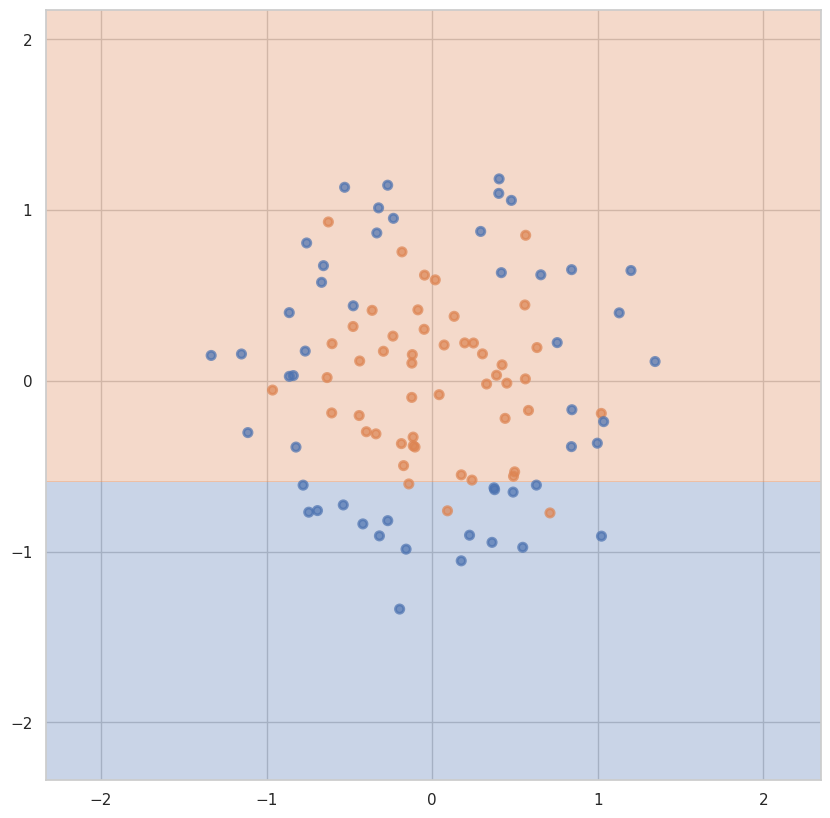

На обучающей для max_depth = 1 и min_samples_leaf = 5: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 5: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 6:


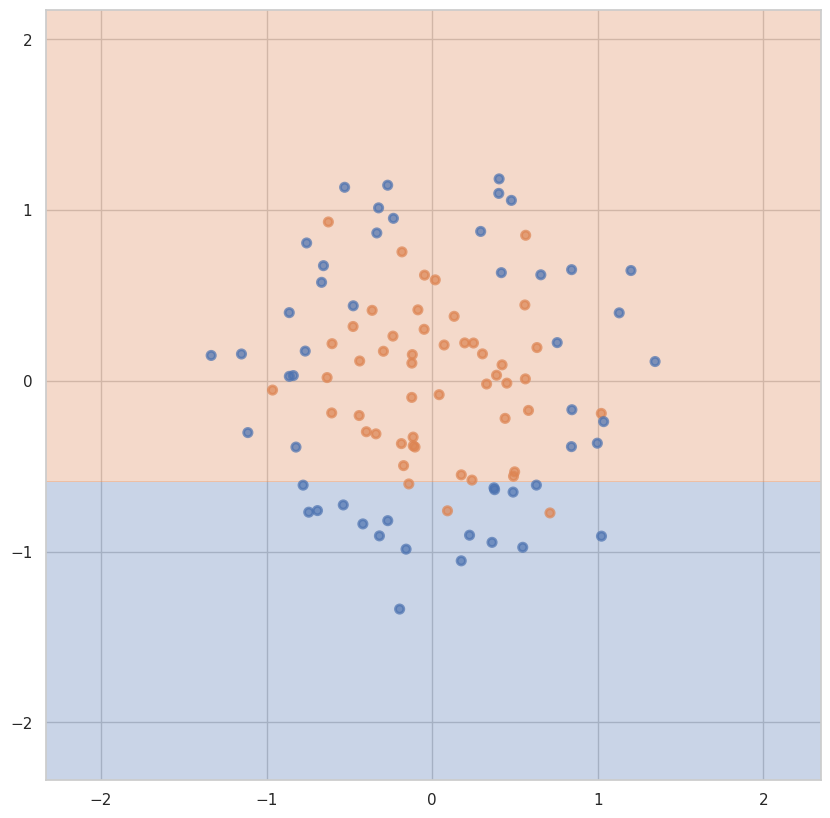

На обучающей для max_depth = 1 и min_samples_leaf = 6: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 6: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 7:


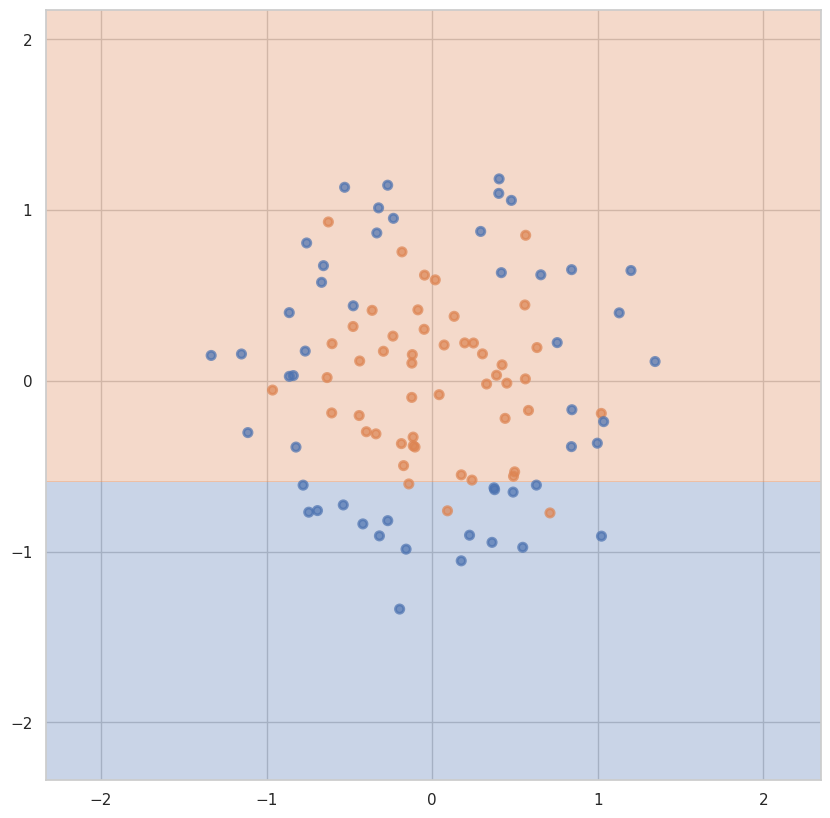

На обучающей для max_depth = 1 и min_samples_leaf = 7: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 7: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 8:


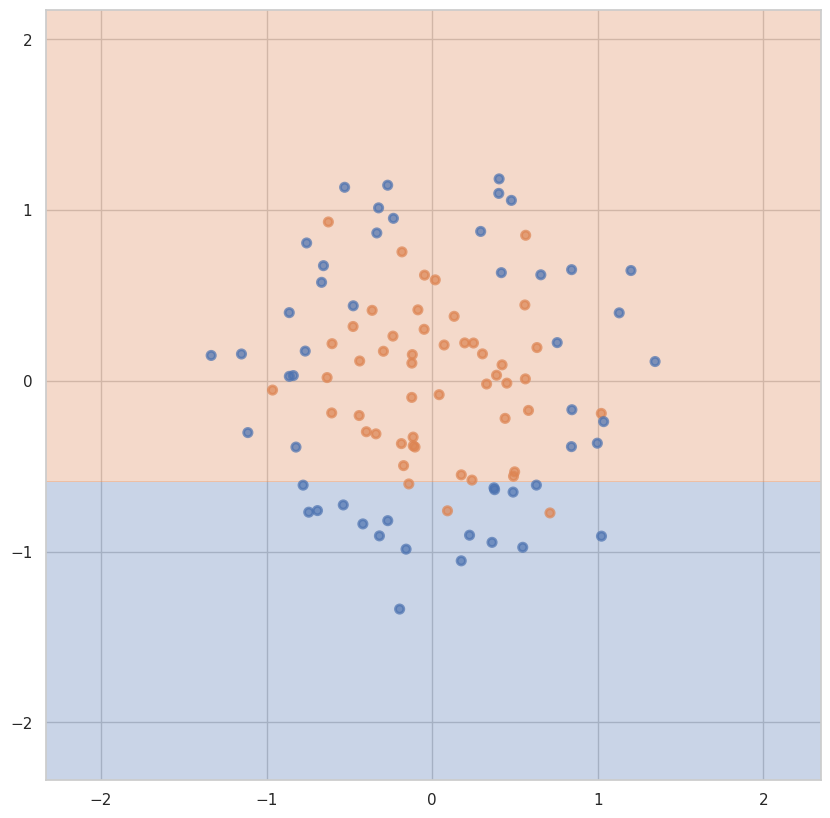

На обучающей для max_depth = 1 и min_samples_leaf = 8: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 8: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 9:


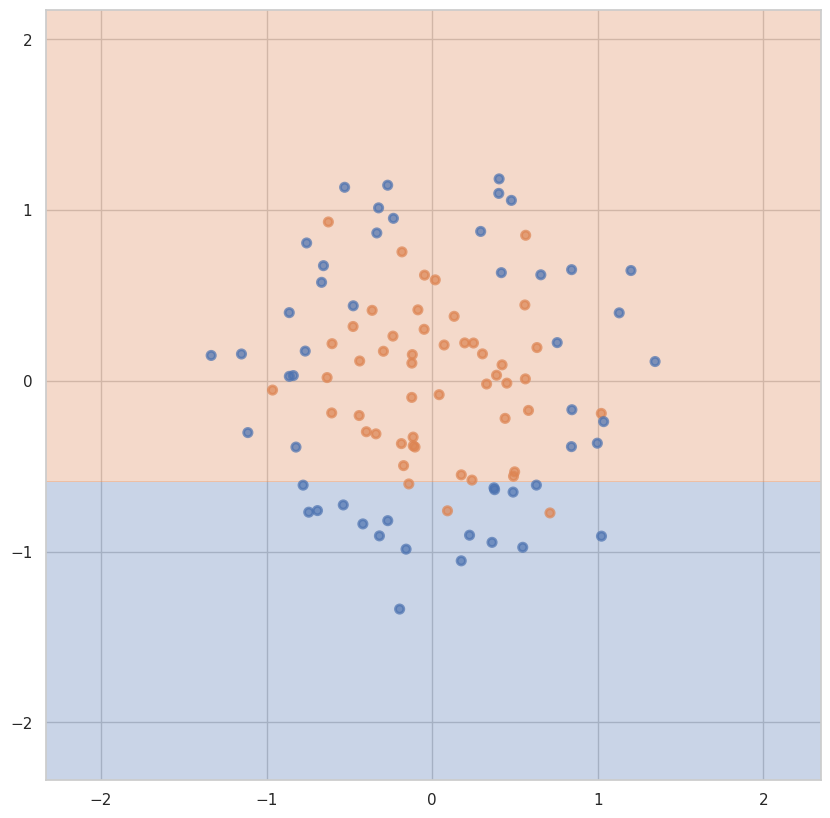

На обучающей для max_depth = 1 и min_samples_leaf = 9: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 9: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 10:


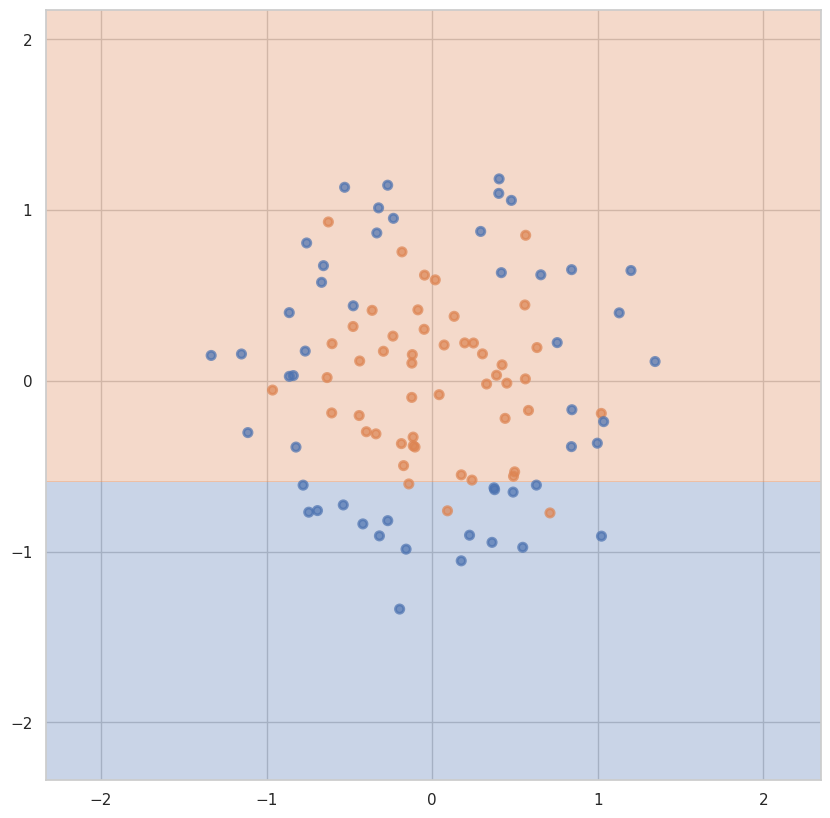

На обучающей для max_depth = 1 и min_samples_leaf = 10: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 10: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 11:


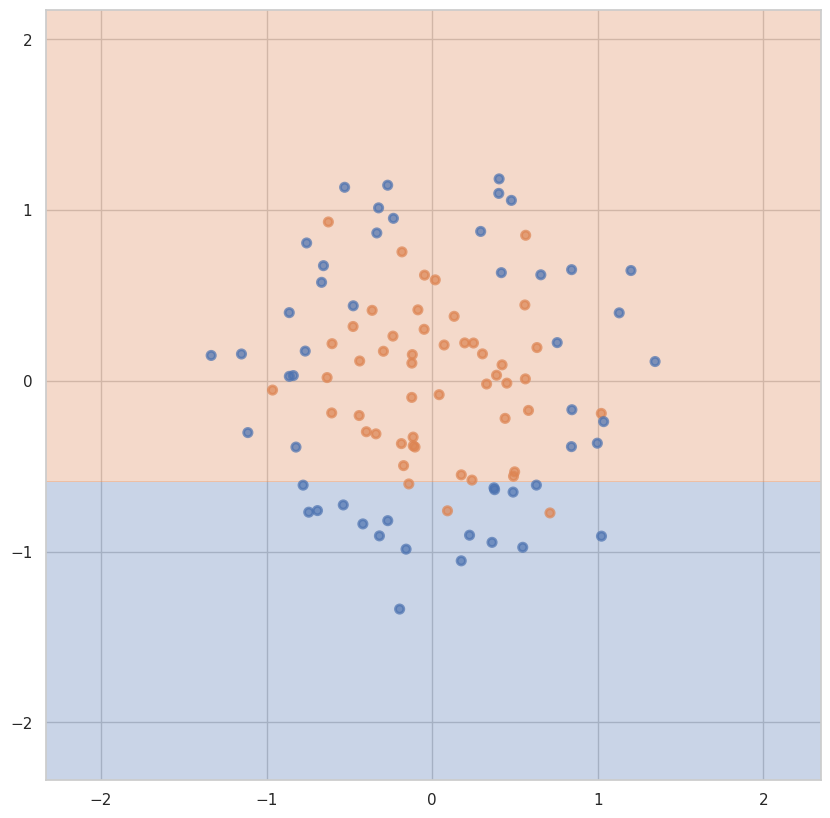

На обучающей для max_depth = 1 и min_samples_leaf = 11: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 11: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 12:


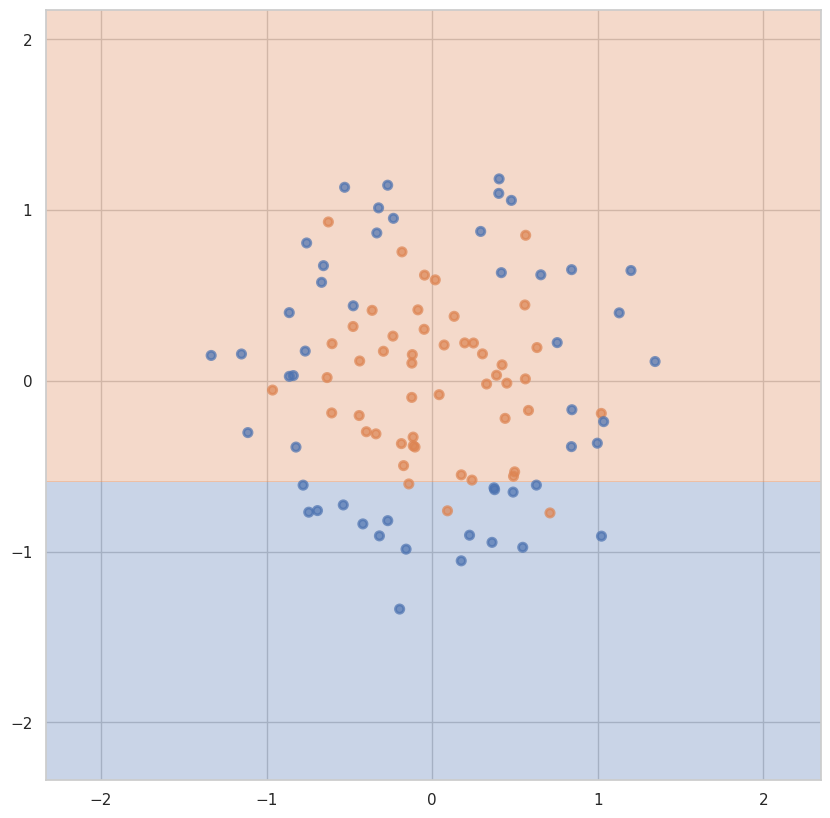

На обучающей для max_depth = 1 и min_samples_leaf = 12: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 12: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 13:


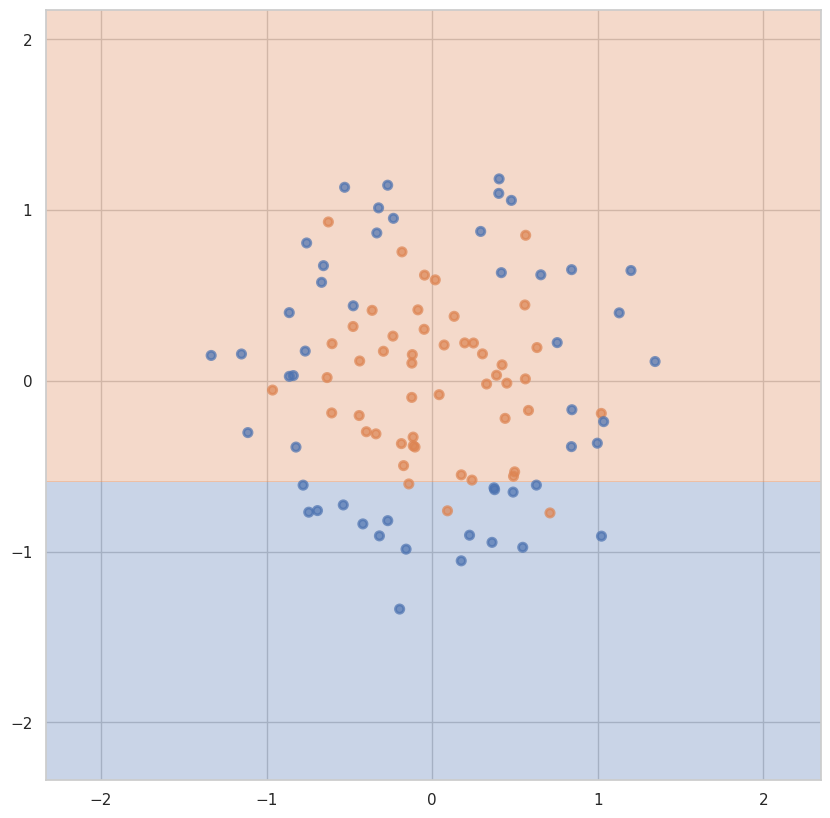

На обучающей для max_depth = 1 и min_samples_leaf = 13: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 13: 0.45
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 14:


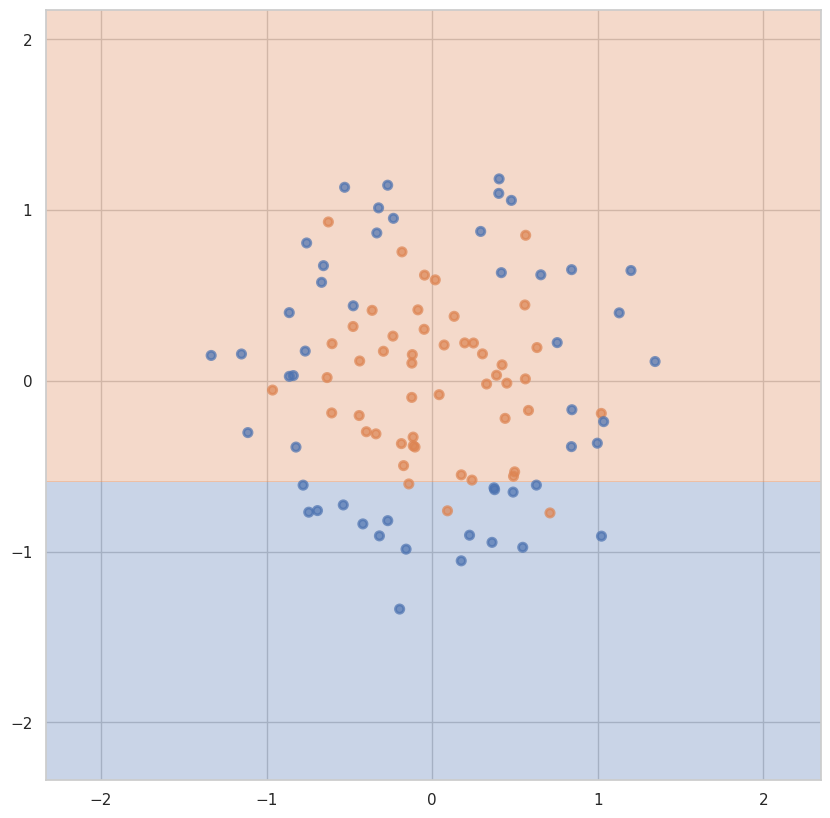

На обучающей для max_depth = 1 и min_samples_leaf = 14: 0.7
На тестовой для max_depth = 1 и min_samples_leaf = 14: 0.45
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 1:


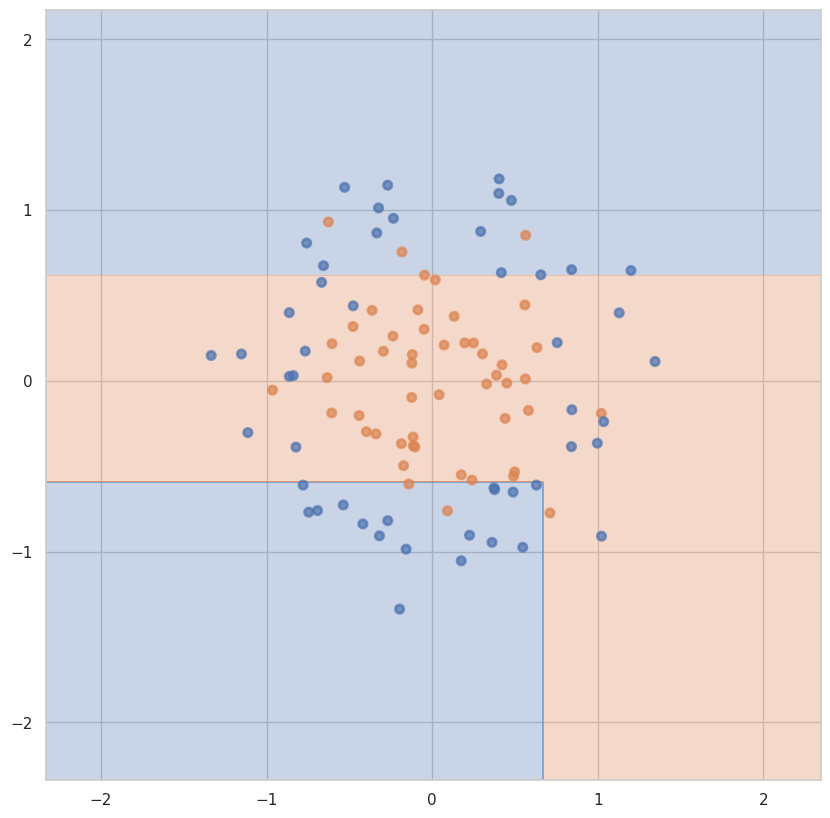

На обучающей для max_depth = 2 и min_samples_leaf = 1: 0.8125
На тестовой для max_depth = 2 и min_samples_leaf = 1: 0.6
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 2:


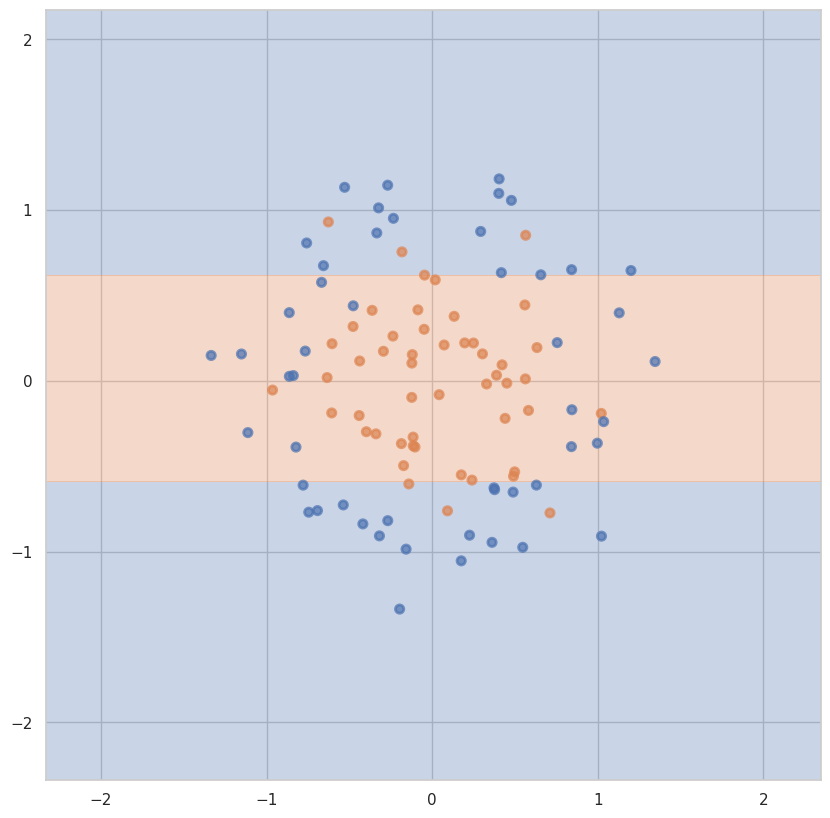

На обучающей для max_depth = 2 и min_samples_leaf = 2: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 2: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 3:


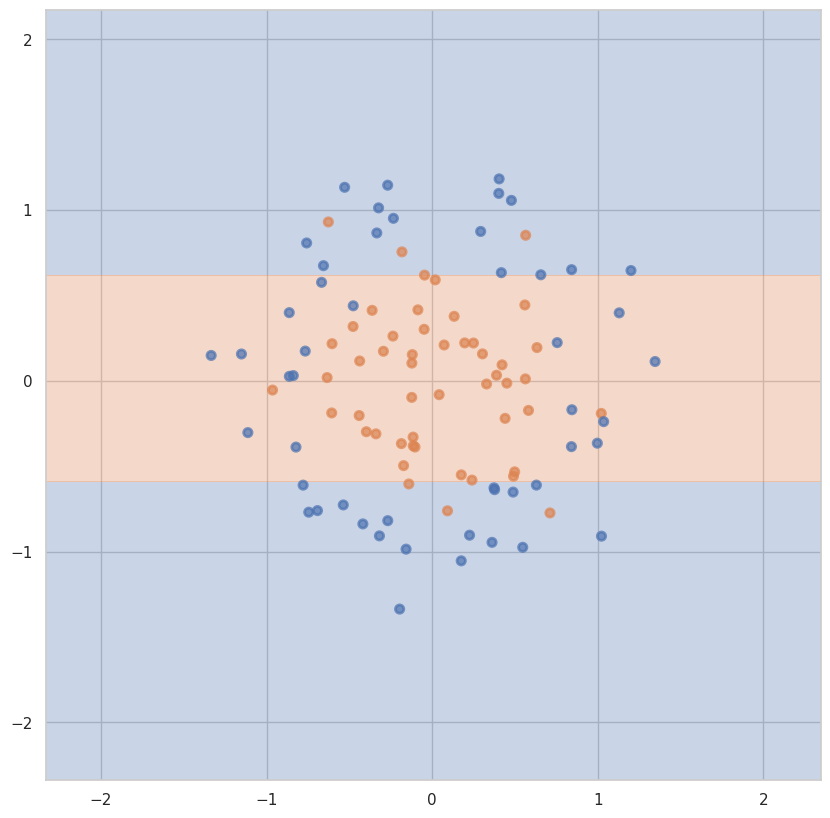

На обучающей для max_depth = 2 и min_samples_leaf = 3: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 3: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 4:


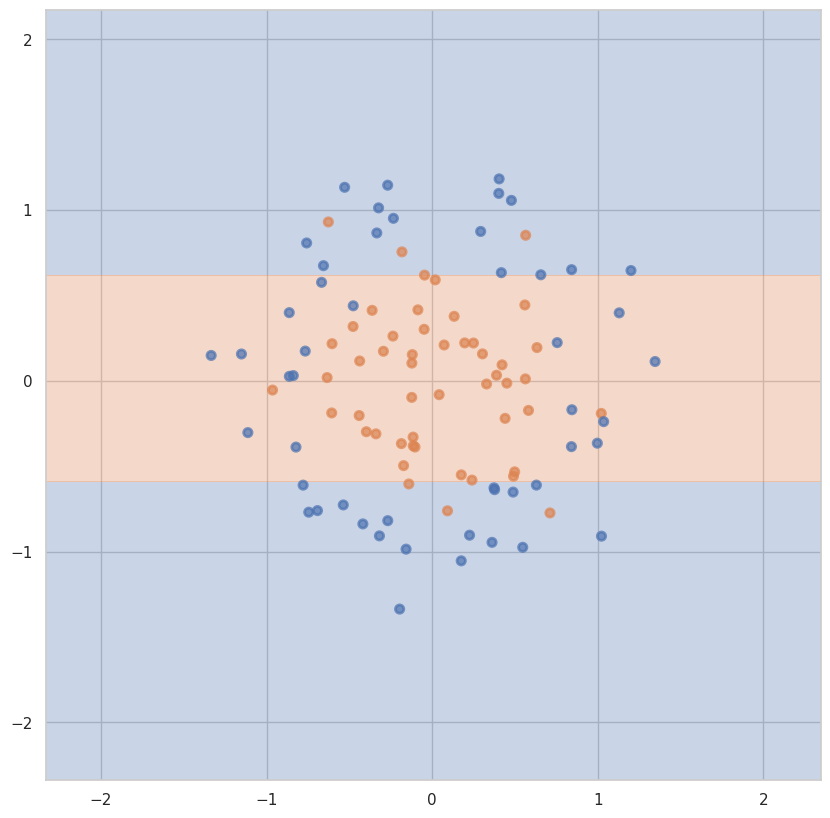

На обучающей для max_depth = 2 и min_samples_leaf = 4: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 4: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 5:


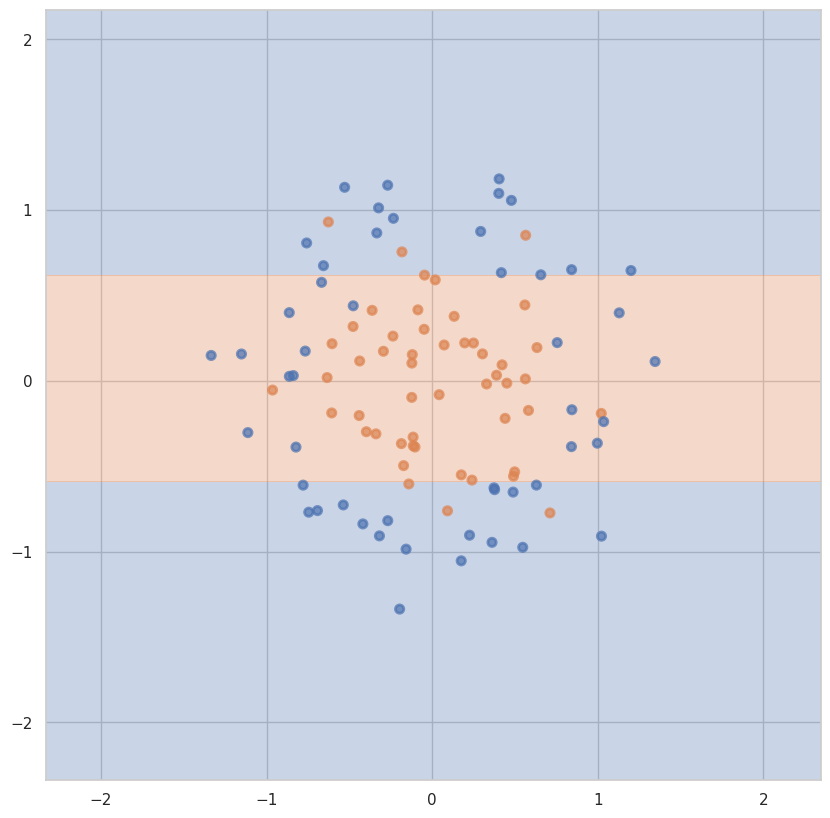

На обучающей для max_depth = 2 и min_samples_leaf = 5: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 5: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 6:


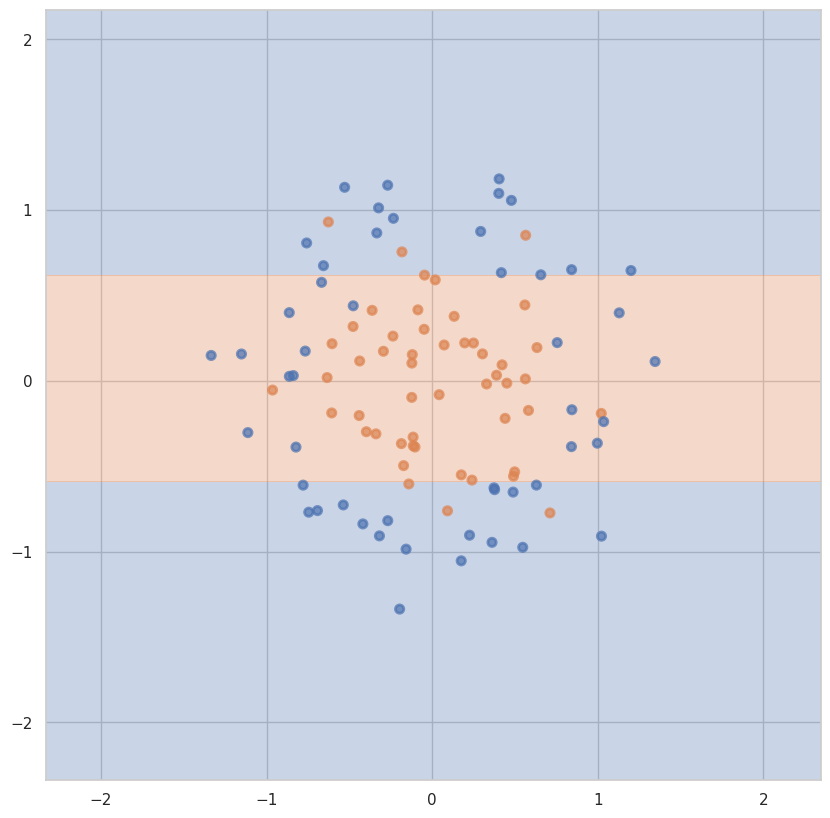

На обучающей для max_depth = 2 и min_samples_leaf = 6: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 6: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 7:


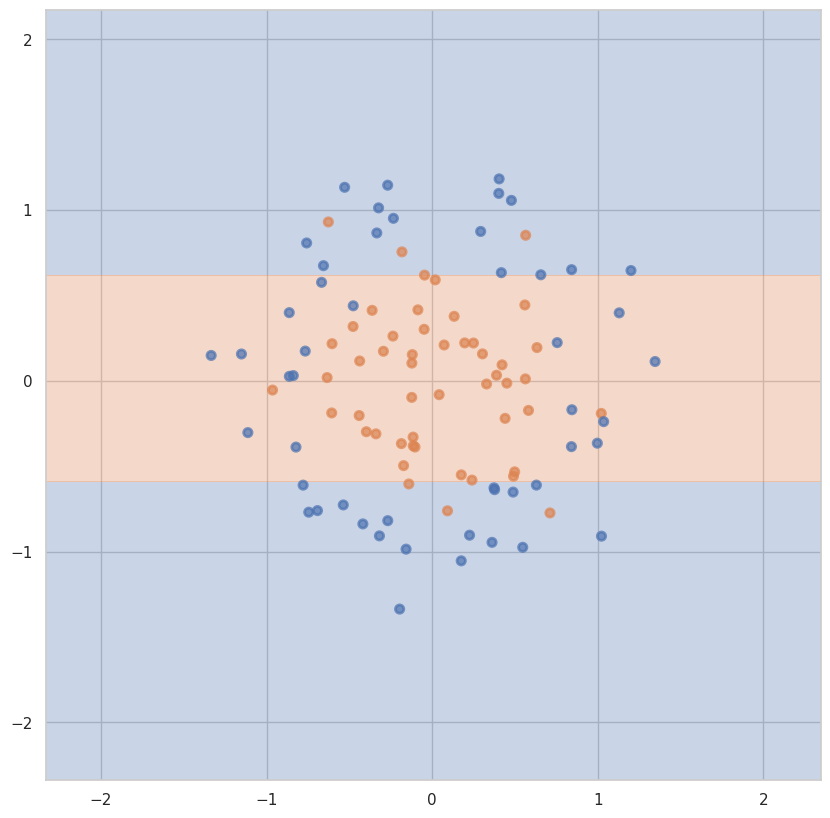

На обучающей для max_depth = 2 и min_samples_leaf = 7: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 7: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 8:


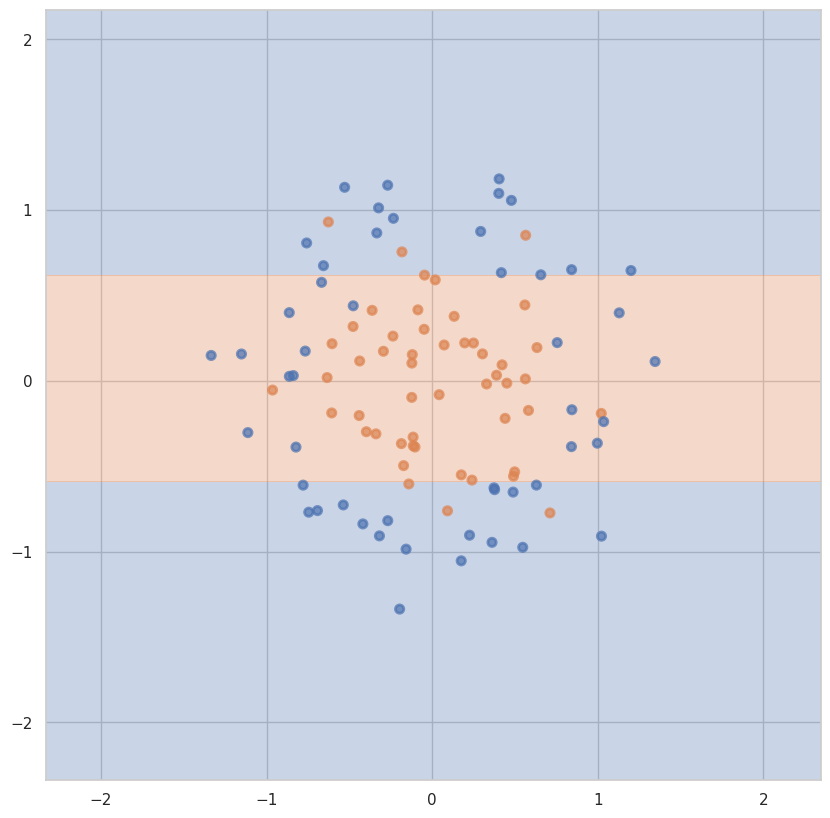

На обучающей для max_depth = 2 и min_samples_leaf = 8: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 8: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 9:


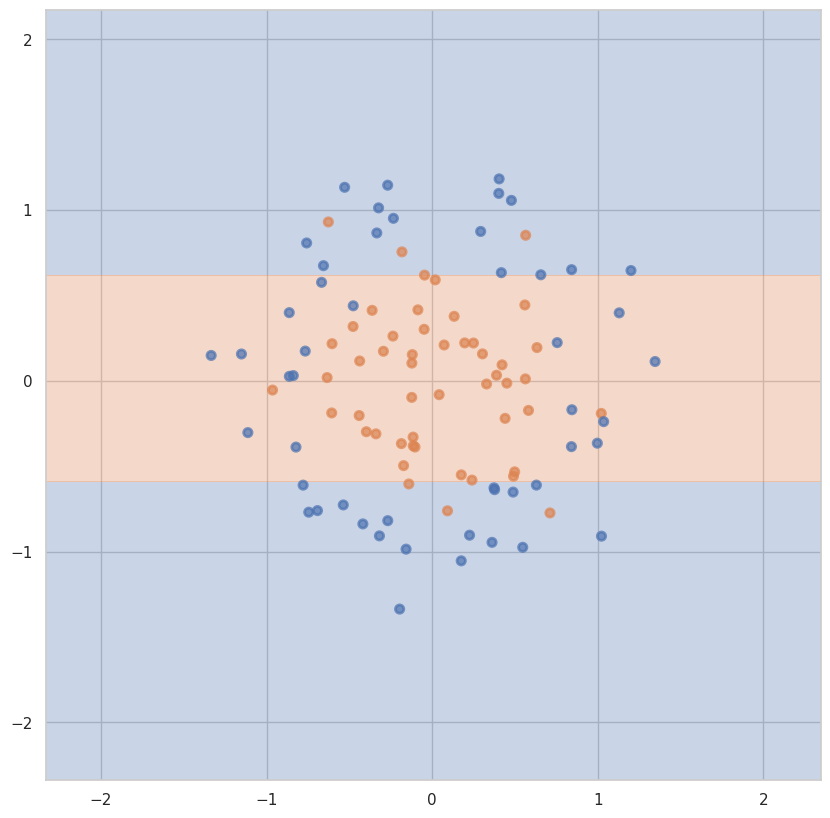

На обучающей для max_depth = 2 и min_samples_leaf = 9: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 9: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 10:


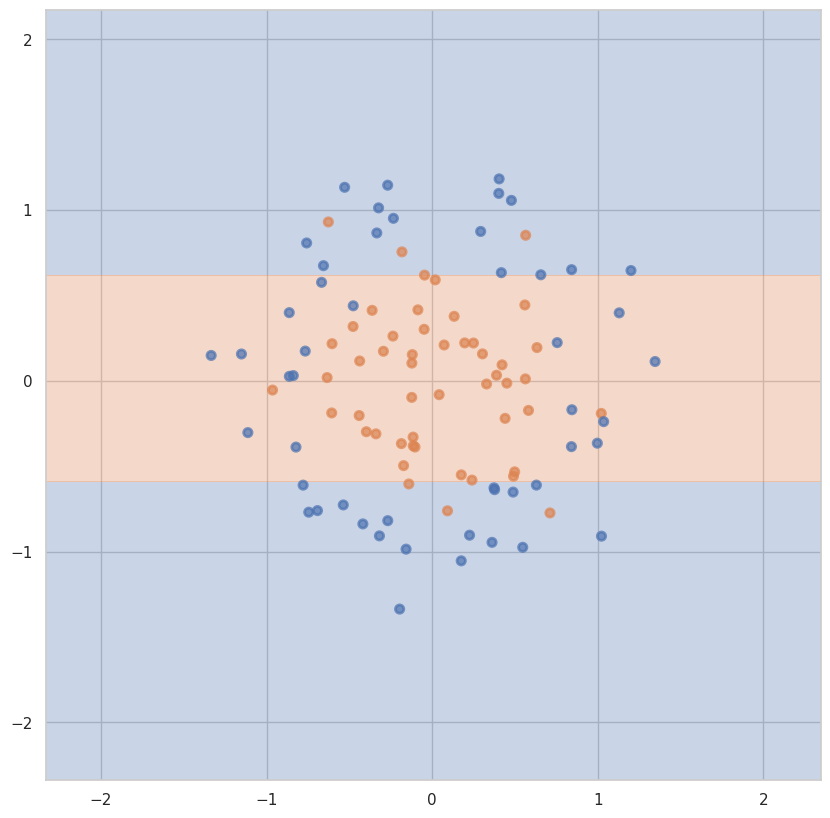

На обучающей для max_depth = 2 и min_samples_leaf = 10: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 10: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 11:


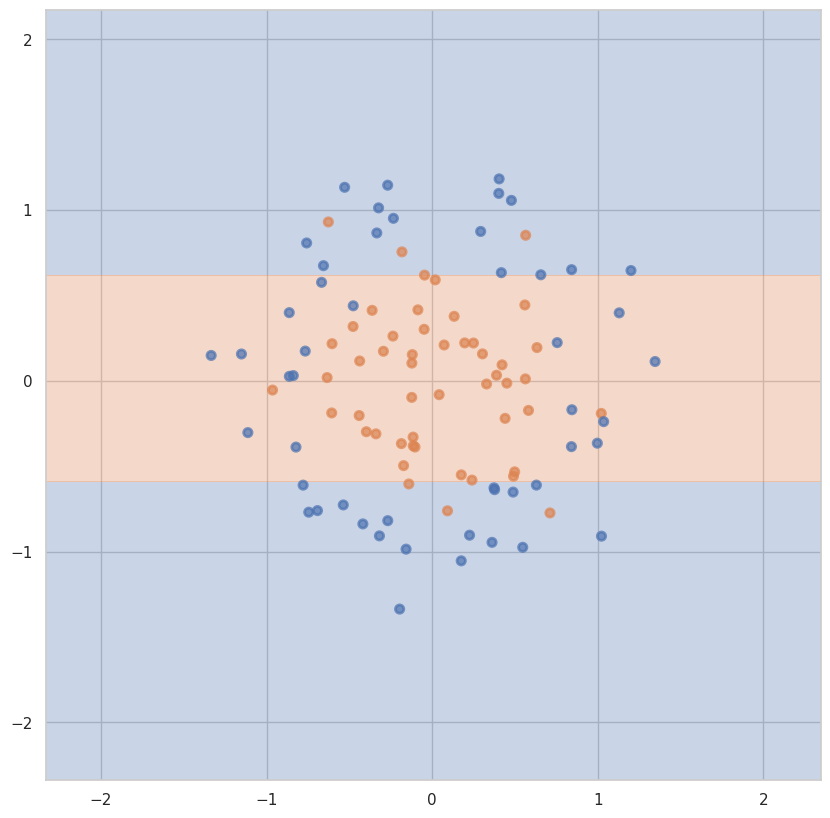

На обучающей для max_depth = 2 и min_samples_leaf = 11: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 11: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 12:


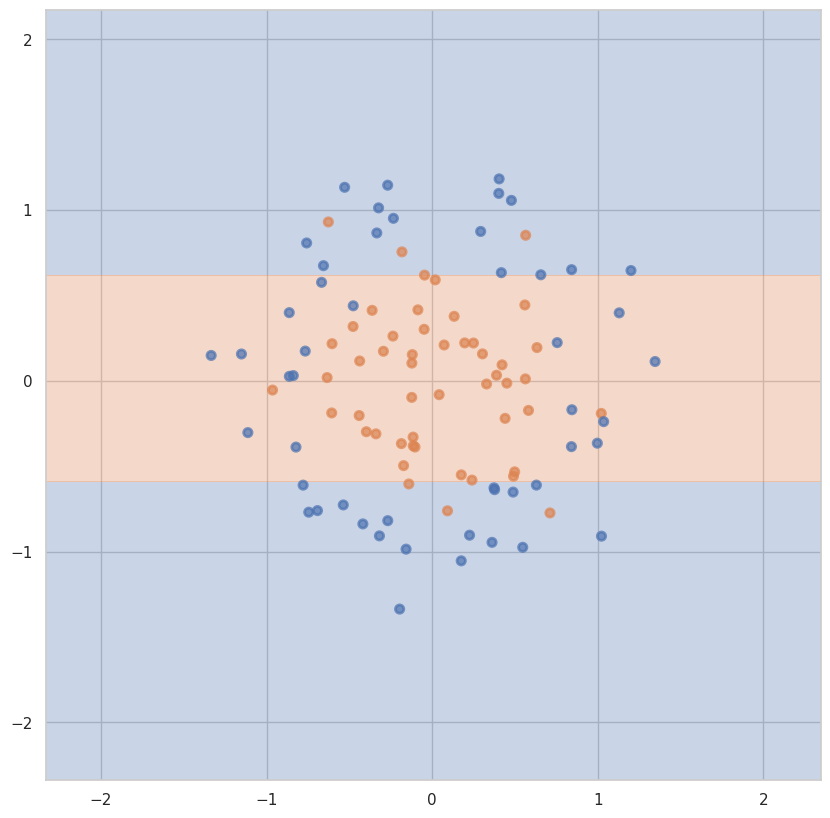

На обучающей для max_depth = 2 и min_samples_leaf = 12: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 12: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 13:


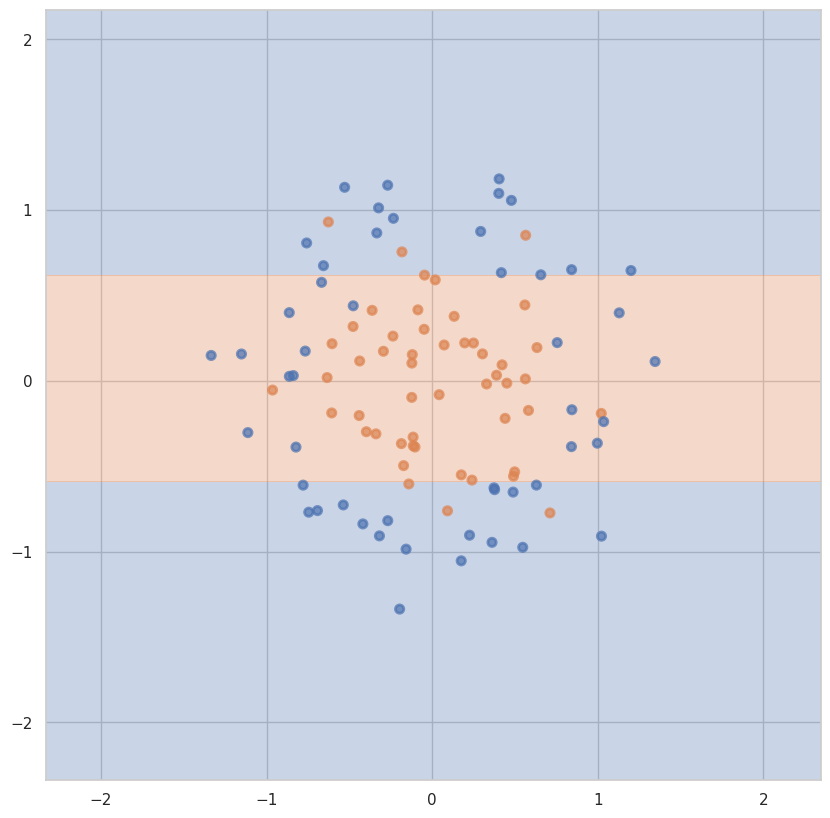

На обучающей для max_depth = 2 и min_samples_leaf = 13: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 13: 0.65
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 14:


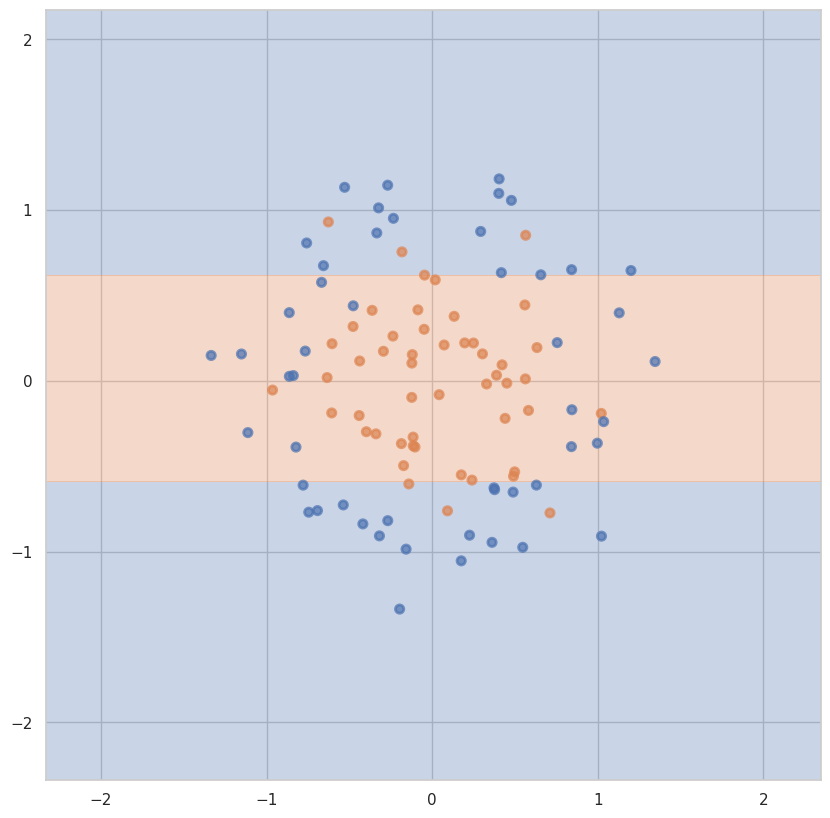

На обучающей для max_depth = 2 и min_samples_leaf = 14: 0.8
На тестовой для max_depth = 2 и min_samples_leaf = 14: 0.65
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 1:


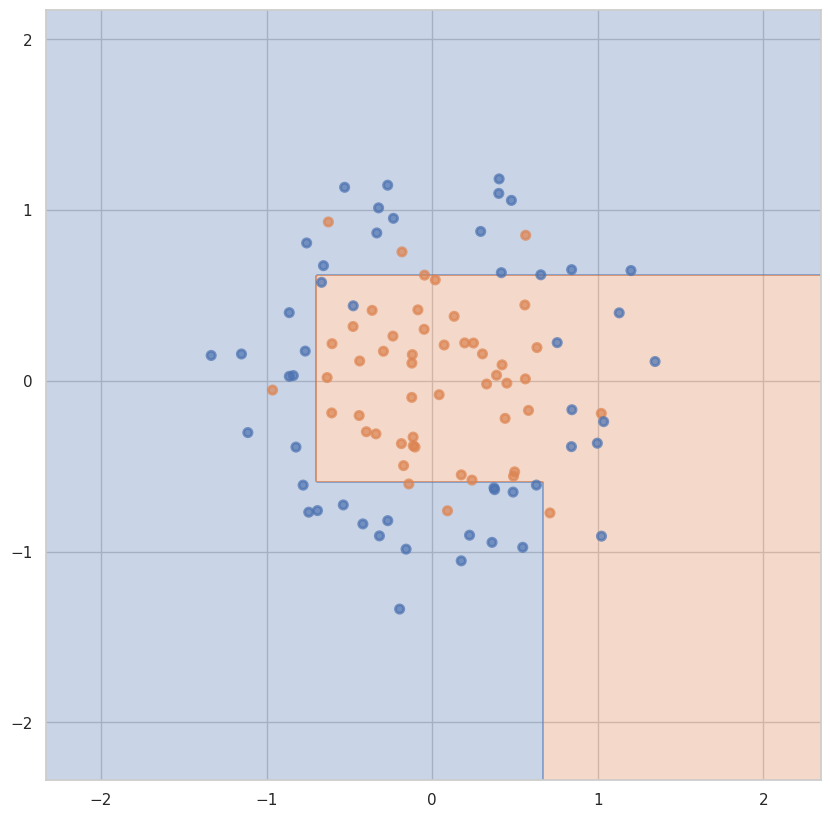

На обучающей для max_depth = 3 и min_samples_leaf = 1: 0.875
На тестовой для max_depth = 3 и min_samples_leaf = 1: 0.7
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 2:


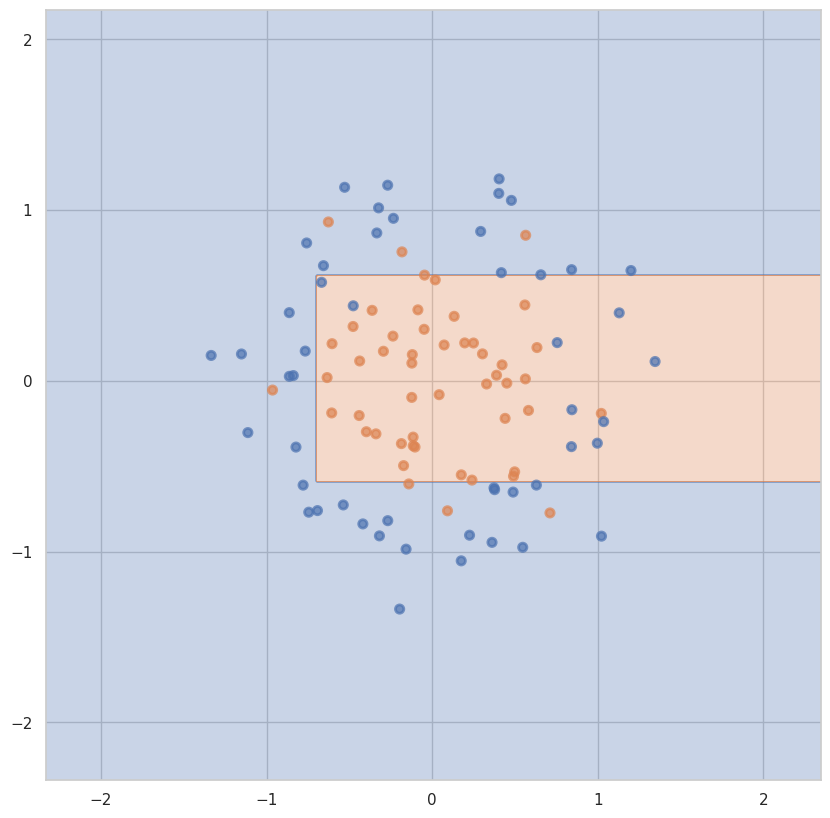

На обучающей для max_depth = 3 и min_samples_leaf = 2: 0.8625
На тестовой для max_depth = 3 и min_samples_leaf = 2: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 3:


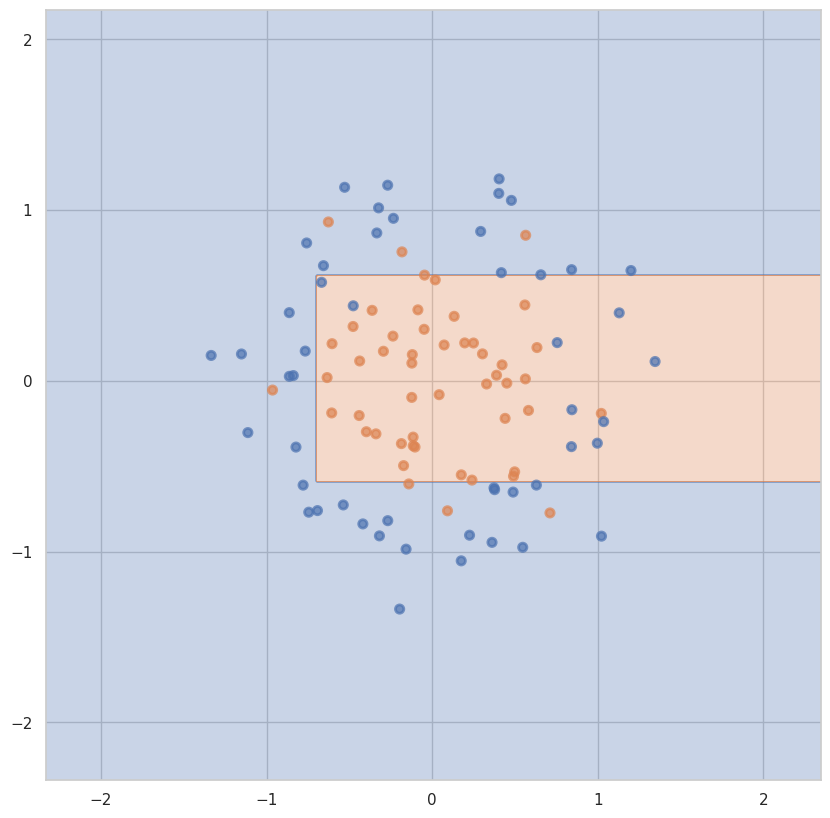

На обучающей для max_depth = 3 и min_samples_leaf = 3: 0.8625
На тестовой для max_depth = 3 и min_samples_leaf = 3: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 4:


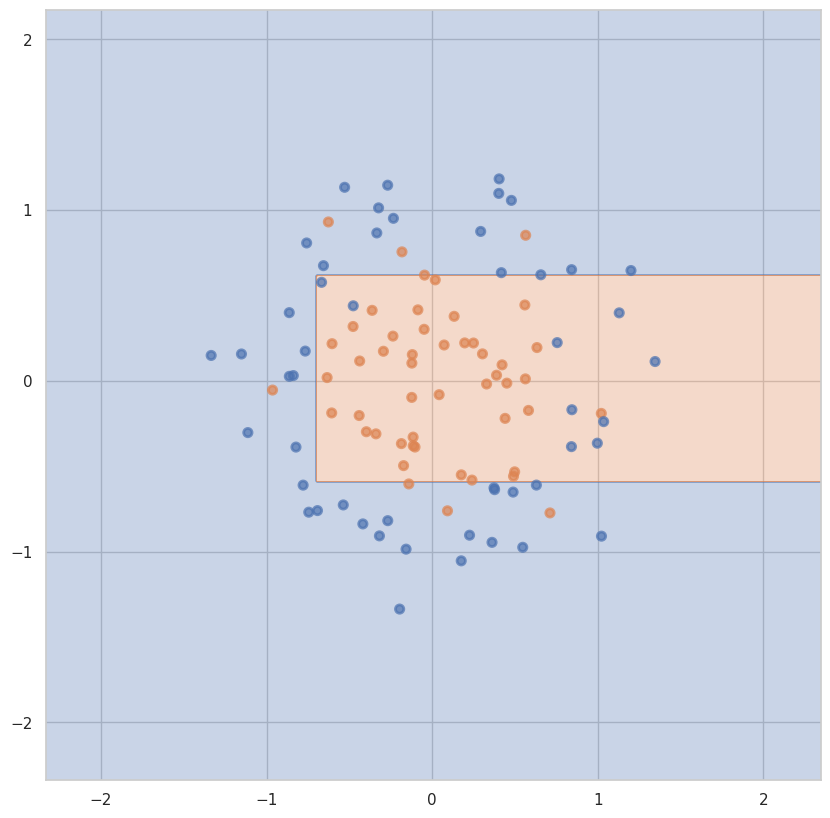

На обучающей для max_depth = 3 и min_samples_leaf = 4: 0.8625
На тестовой для max_depth = 3 и min_samples_leaf = 4: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 5:


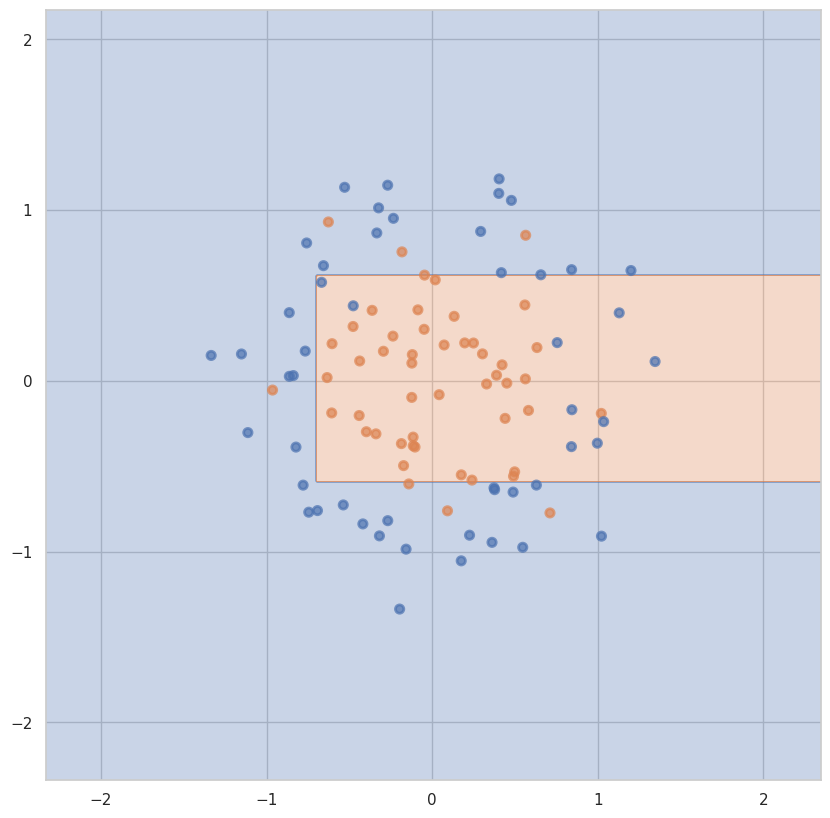

На обучающей для max_depth = 3 и min_samples_leaf = 5: 0.8625
На тестовой для max_depth = 3 и min_samples_leaf = 5: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 6:


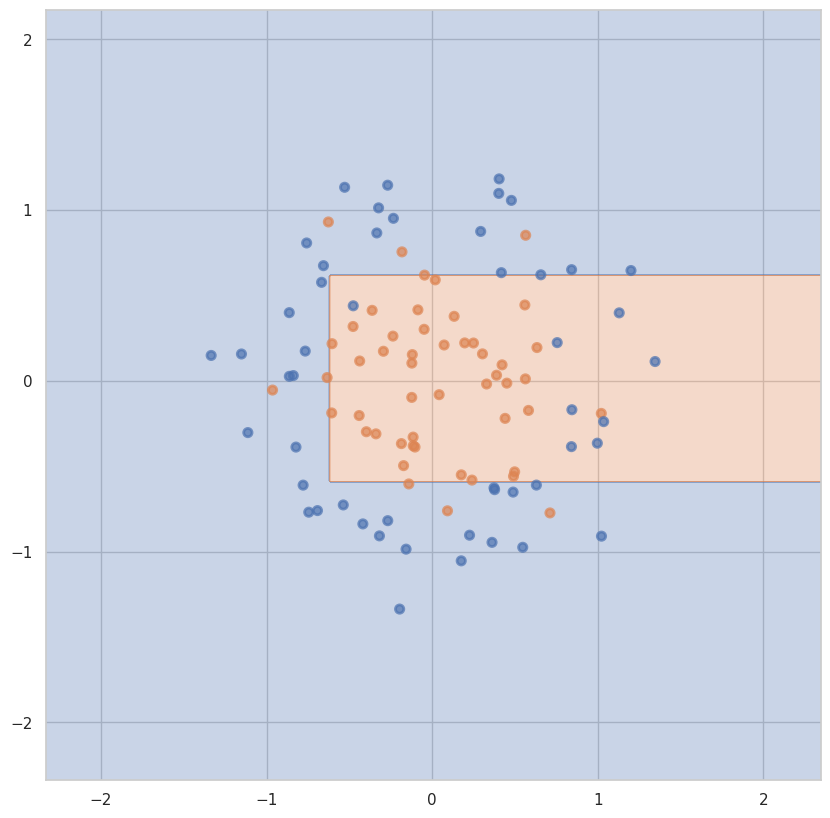

На обучающей для max_depth = 3 и min_samples_leaf = 6: 0.85
На тестовой для max_depth = 3 и min_samples_leaf = 6: 0.8
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 7:


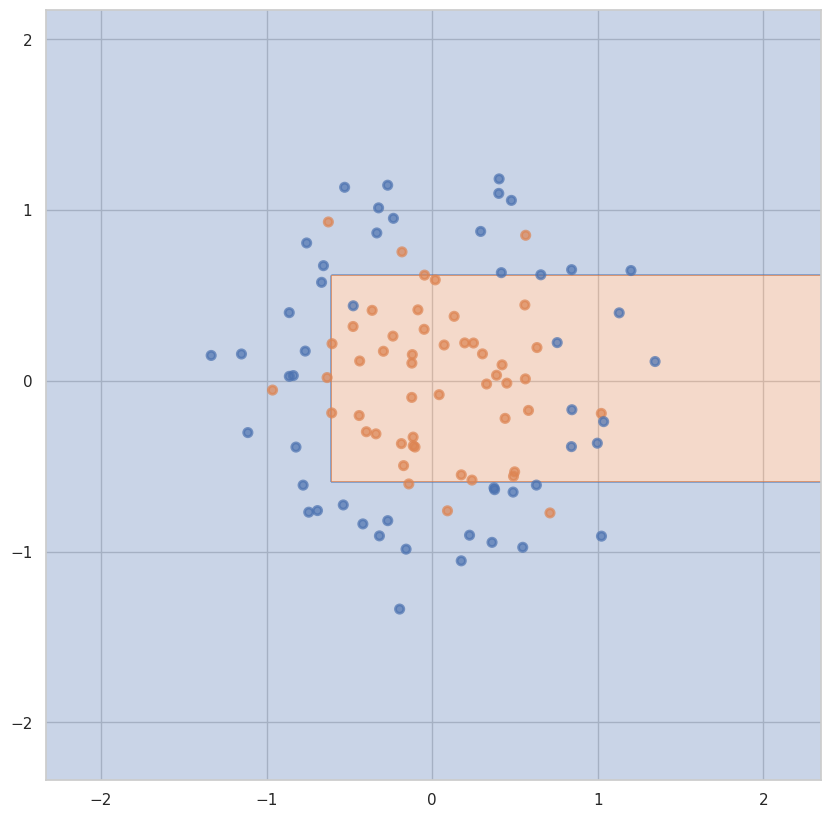

На обучающей для max_depth = 3 и min_samples_leaf = 7: 0.8375
На тестовой для max_depth = 3 и min_samples_leaf = 7: 0.8
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 8:


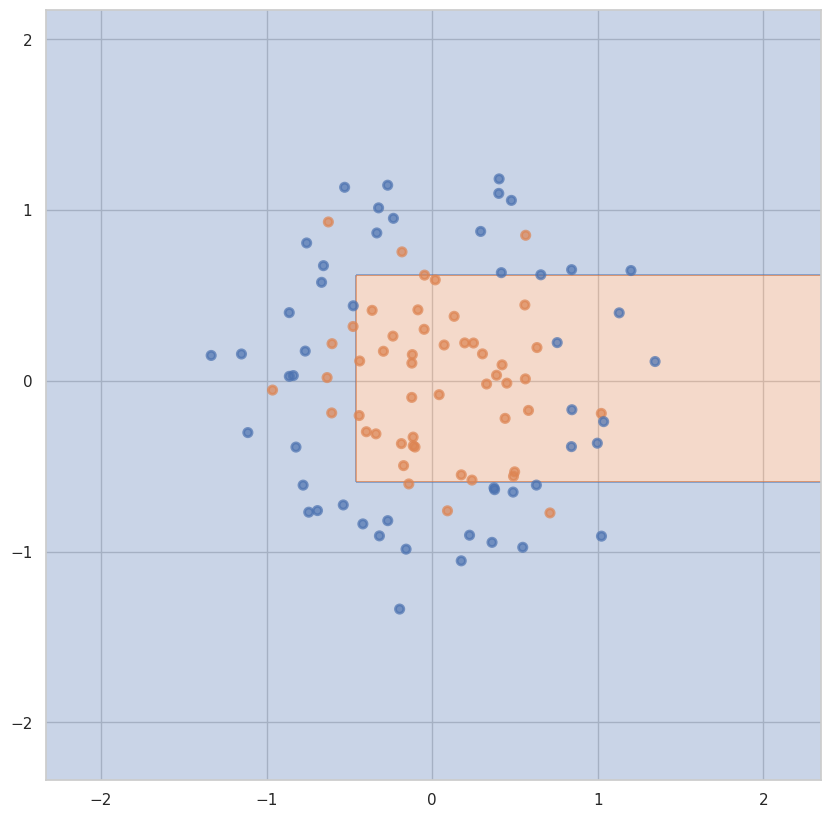

На обучающей для max_depth = 3 и min_samples_leaf = 8: 0.825
На тестовой для max_depth = 3 и min_samples_leaf = 8: 0.8
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 9:


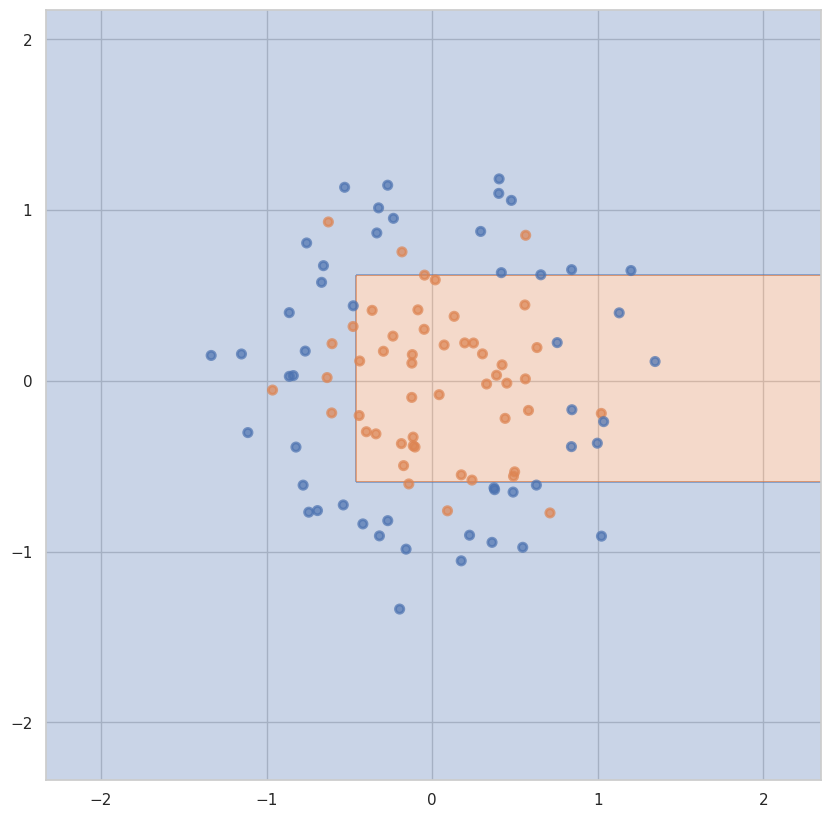

На обучающей для max_depth = 3 и min_samples_leaf = 9: 0.825
На тестовой для max_depth = 3 и min_samples_leaf = 9: 0.8
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 10:


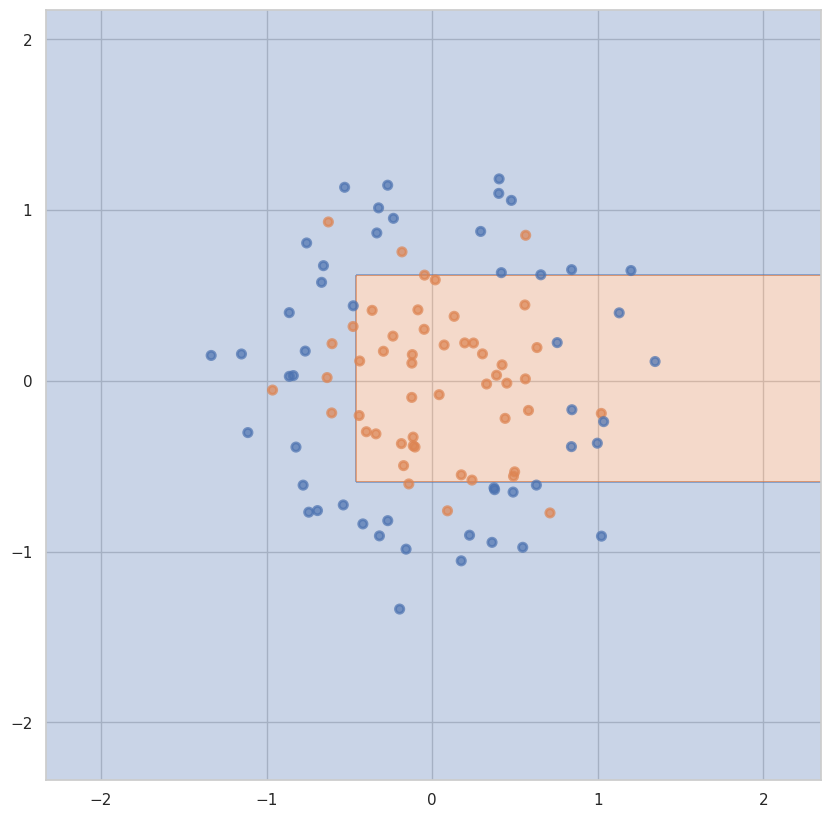

На обучающей для max_depth = 3 и min_samples_leaf = 10: 0.825
На тестовой для max_depth = 3 и min_samples_leaf = 10: 0.8
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 11:


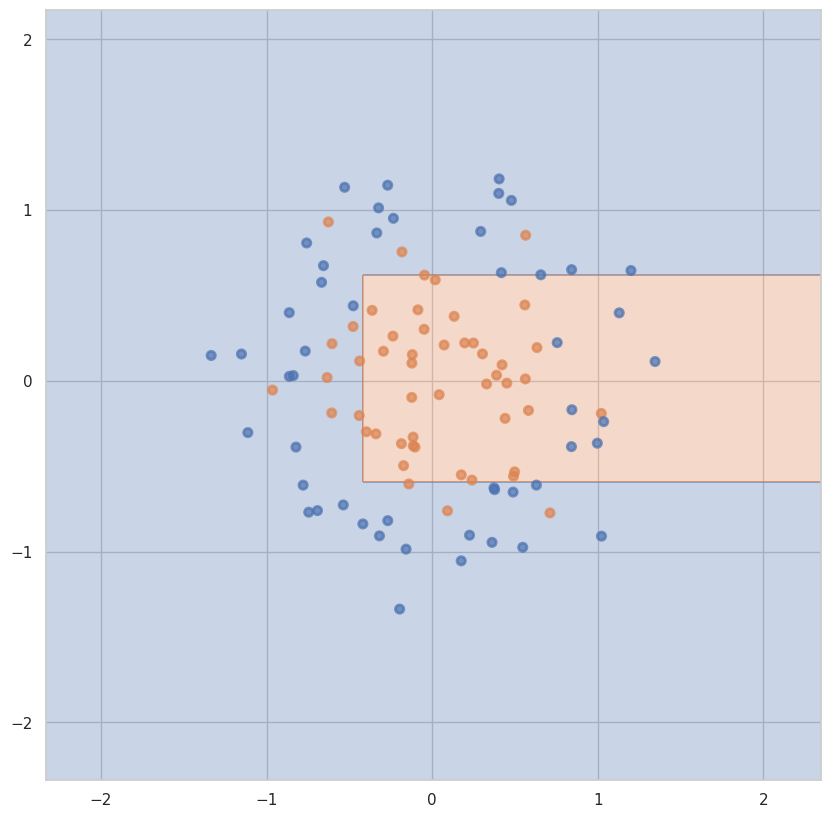

На обучающей для max_depth = 3 и min_samples_leaf = 11: 0.8125
На тестовой для max_depth = 3 и min_samples_leaf = 11: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 12:


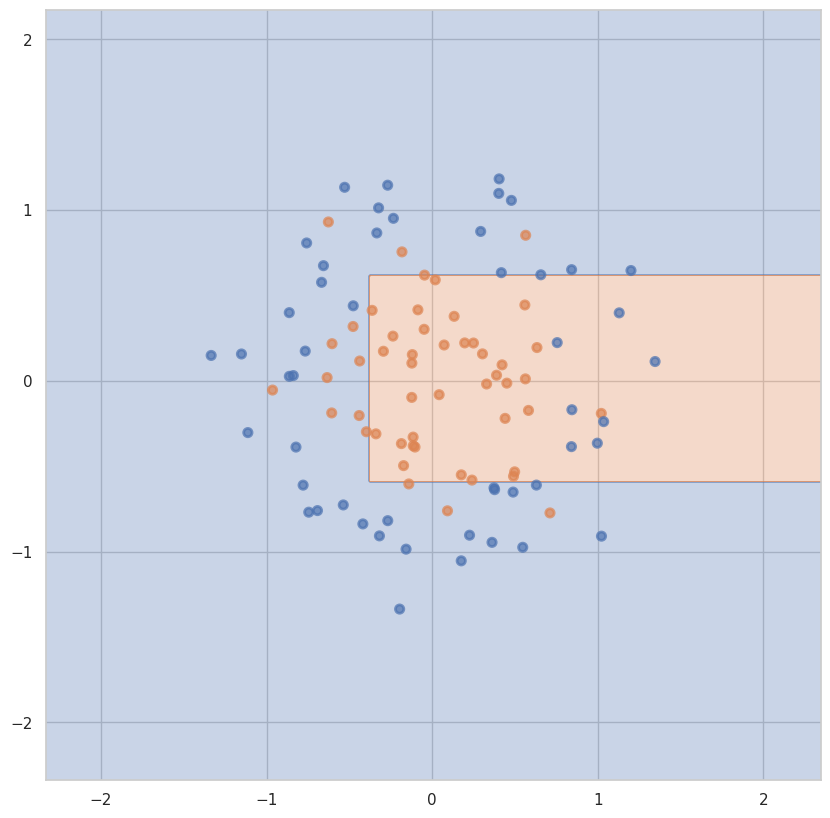

На обучающей для max_depth = 3 и min_samples_leaf = 12: 0.8
На тестовой для max_depth = 3 и min_samples_leaf = 12: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 13:


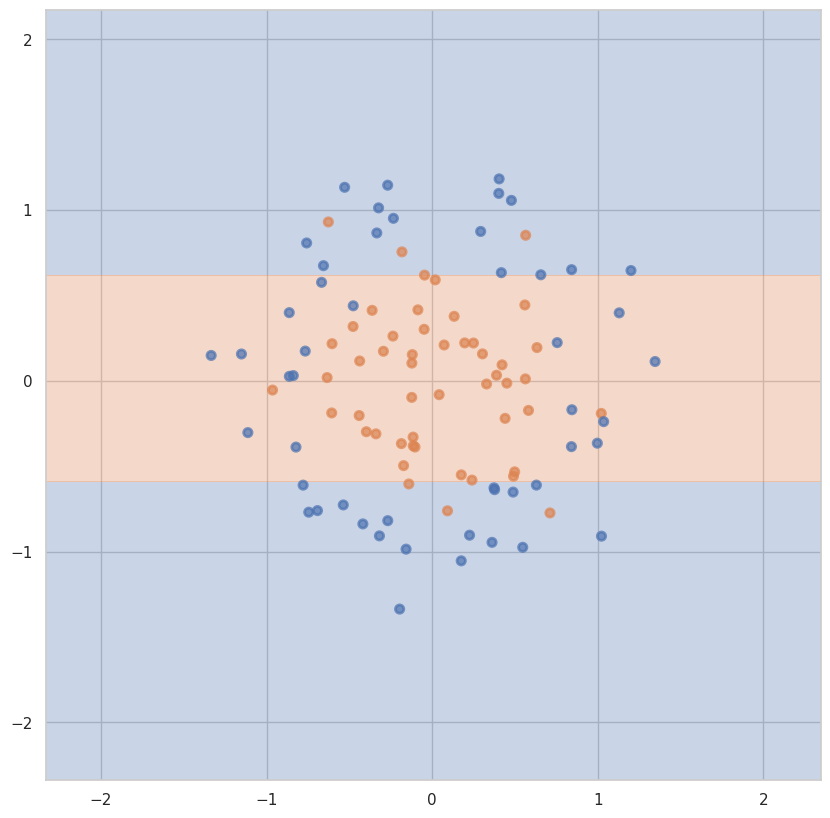

На обучающей для max_depth = 3 и min_samples_leaf = 13: 0.8
На тестовой для max_depth = 3 и min_samples_leaf = 13: 0.65
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 14:


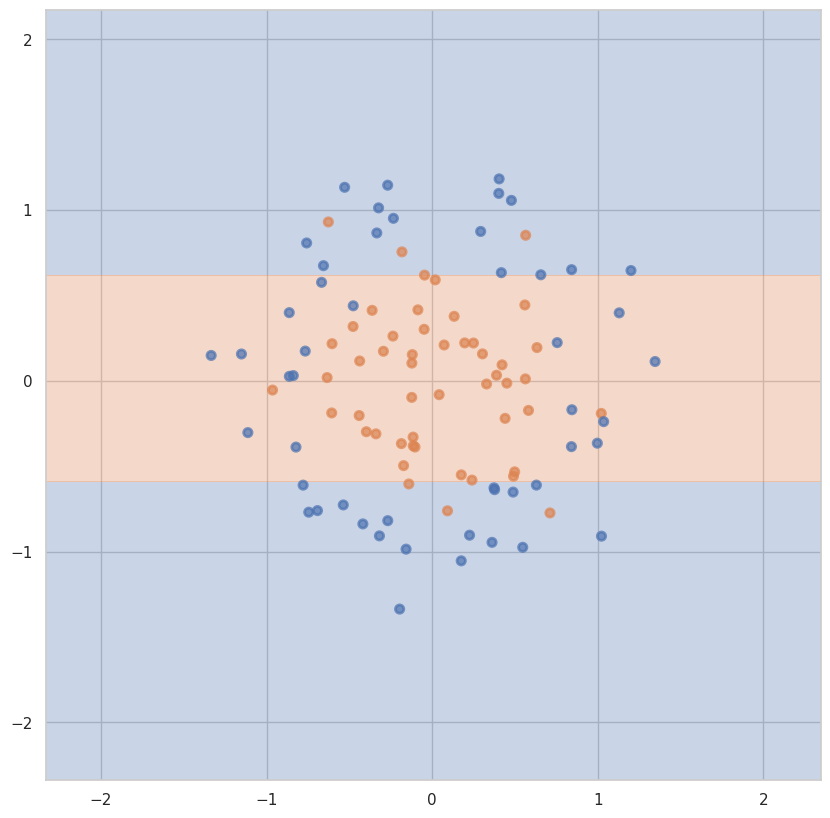

На обучающей для max_depth = 3 и min_samples_leaf = 14: 0.8
На тестовой для max_depth = 3 и min_samples_leaf = 14: 0.65
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 1:


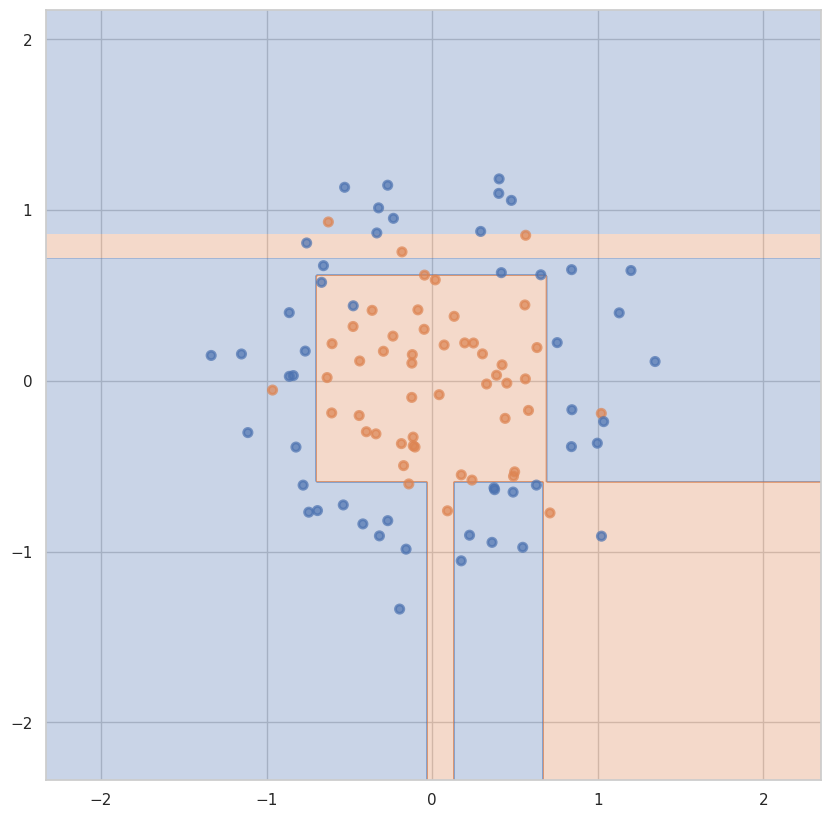

На обучающей для max_depth = 4 и min_samples_leaf = 1: 0.9625
На тестовой для max_depth = 4 и min_samples_leaf = 1: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 2:


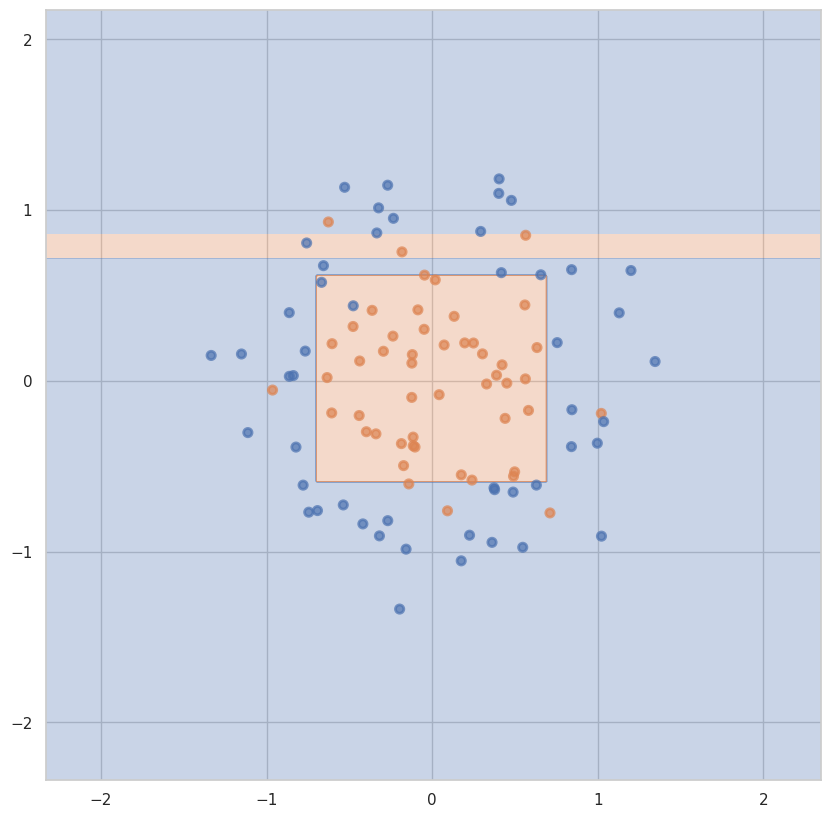

На обучающей для max_depth = 4 и min_samples_leaf = 2: 0.9375
На тестовой для max_depth = 4 и min_samples_leaf = 2: 0.8
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 3:


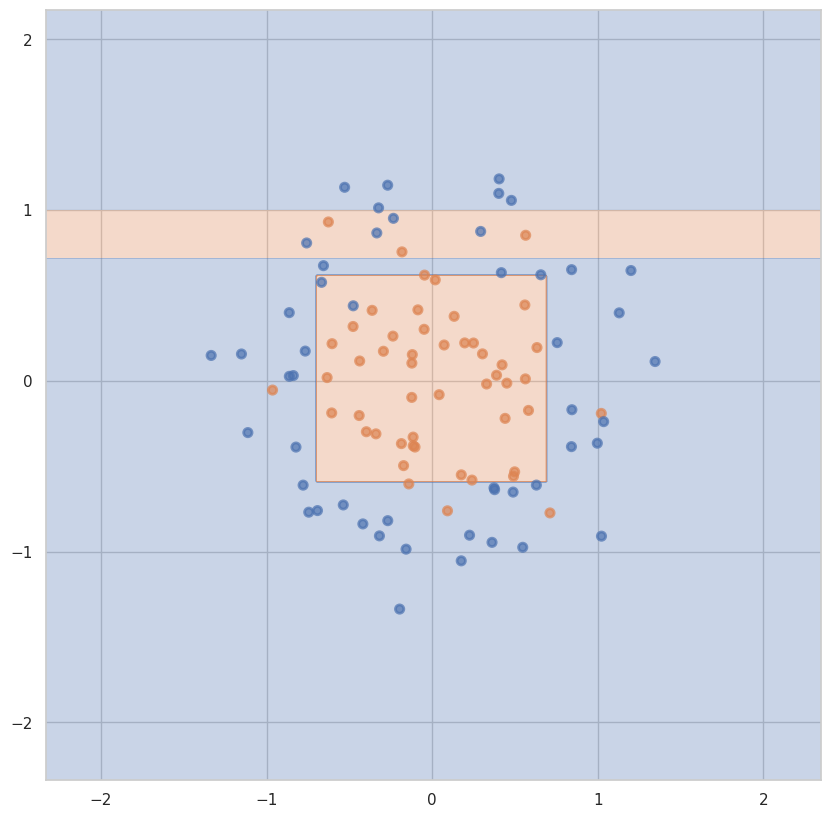

На обучающей для max_depth = 4 и min_samples_leaf = 3: 0.925
На тестовой для max_depth = 4 и min_samples_leaf = 3: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 4:


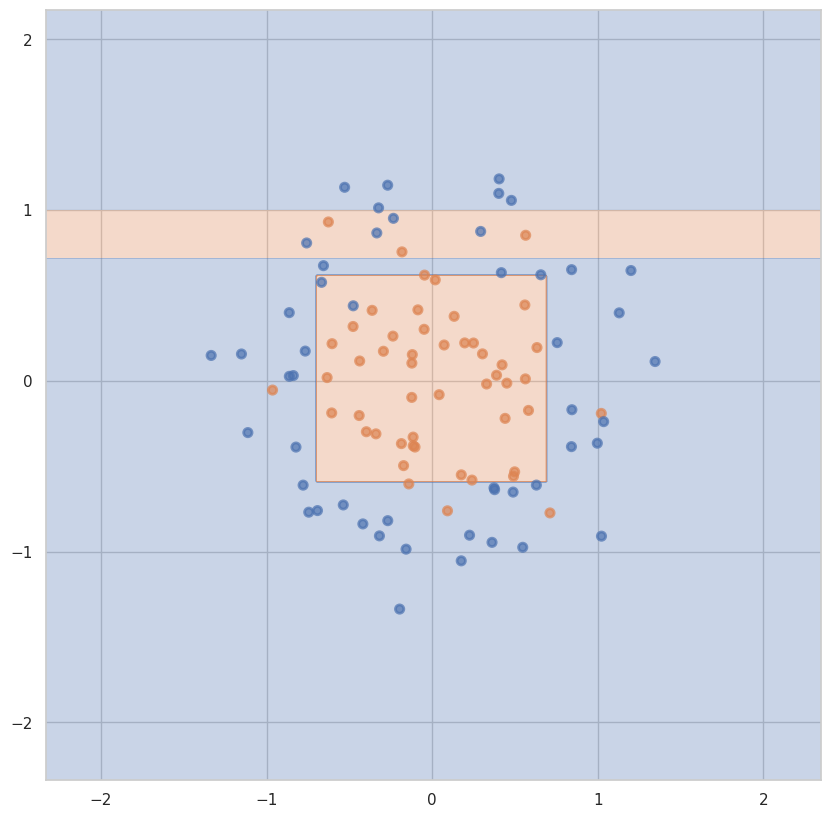

На обучающей для max_depth = 4 и min_samples_leaf = 4: 0.925
На тестовой для max_depth = 4 и min_samples_leaf = 4: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 5:


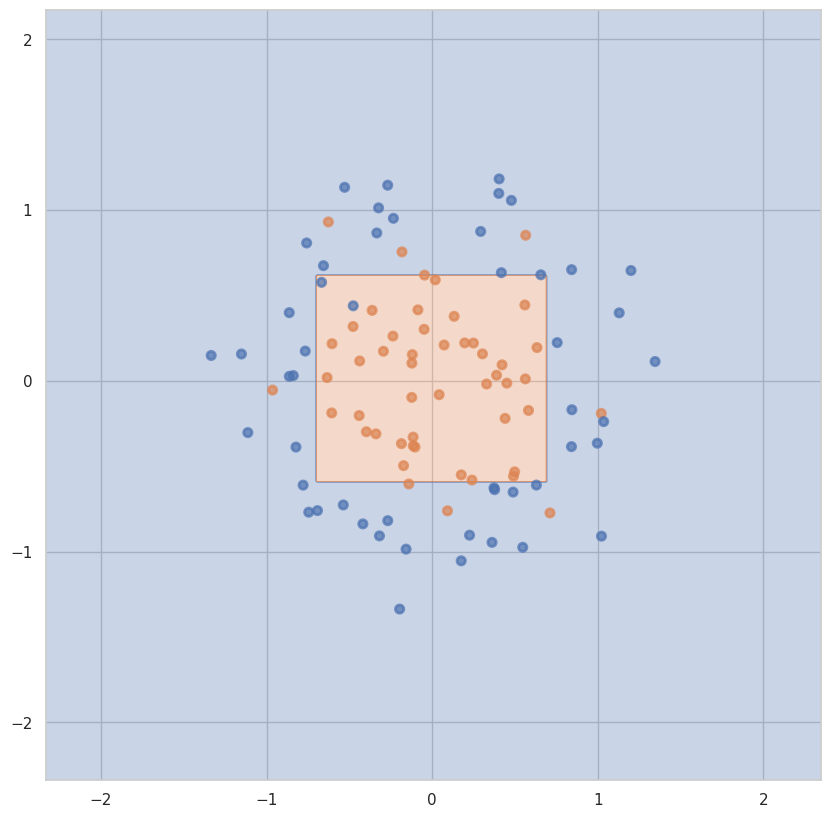

На обучающей для max_depth = 4 и min_samples_leaf = 5: 0.9125
На тестовой для max_depth = 4 и min_samples_leaf = 5: 0.85
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 6:


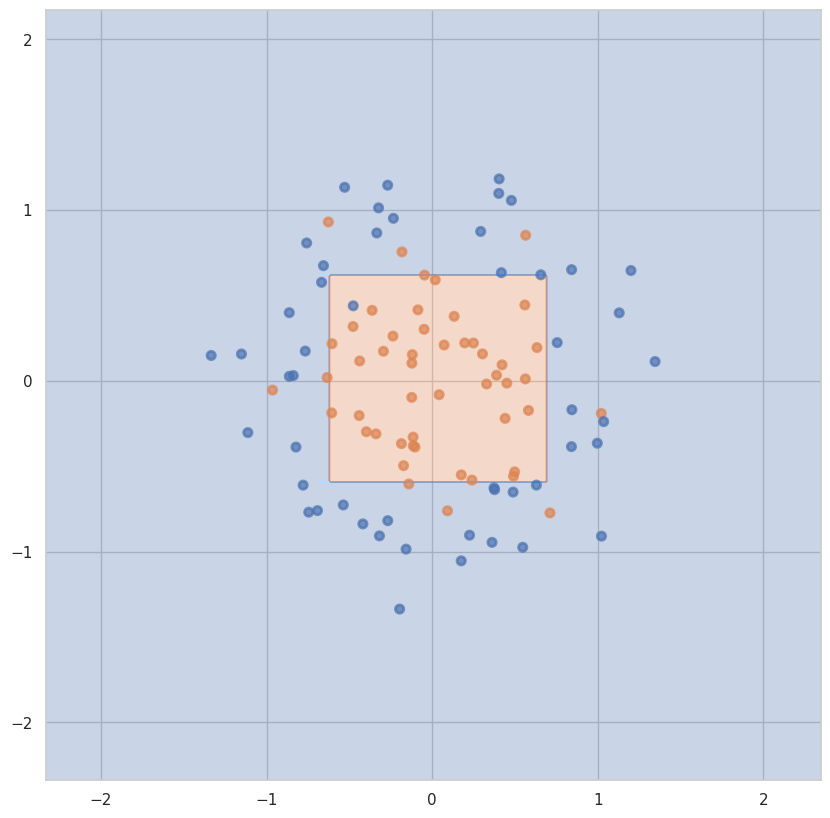

На обучающей для max_depth = 4 и min_samples_leaf = 6: 0.9
На тестовой для max_depth = 4 и min_samples_leaf = 6: 0.9
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 7:


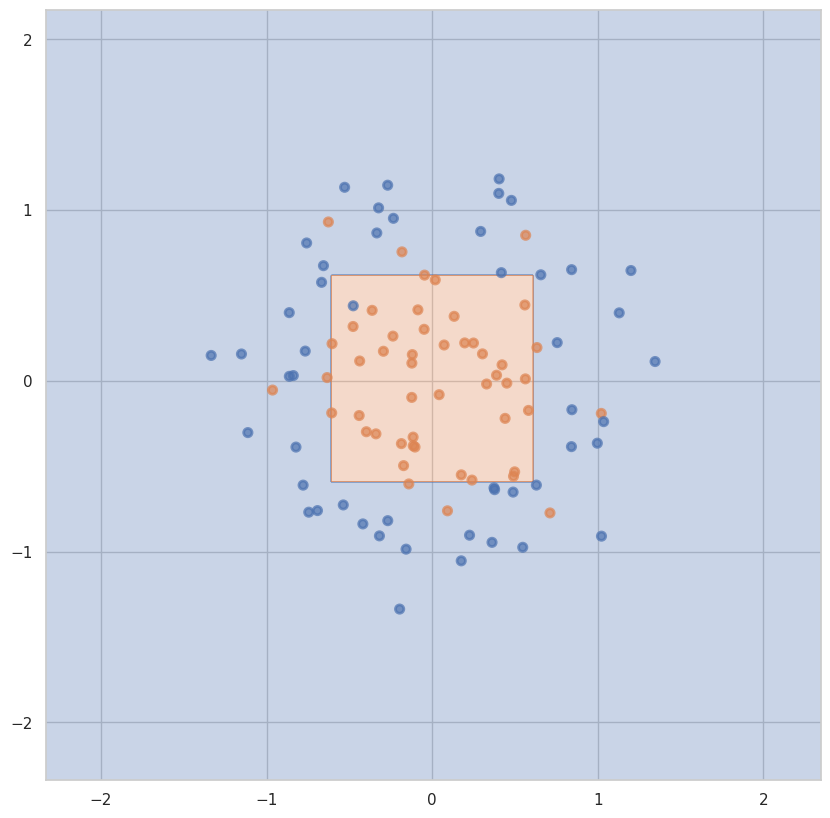

На обучающей для max_depth = 4 и min_samples_leaf = 7: 0.875
На тестовой для max_depth = 4 и min_samples_leaf = 7: 0.9
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 8:


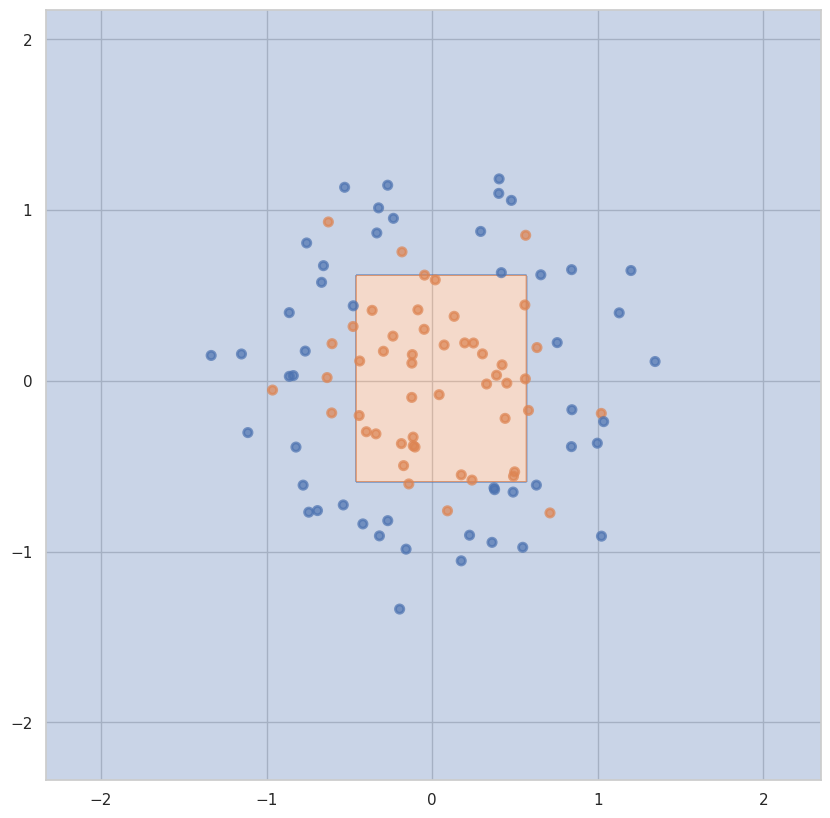

На обучающей для max_depth = 4 и min_samples_leaf = 8: 0.85
На тестовой для max_depth = 4 и min_samples_leaf = 8: 0.9
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 9:


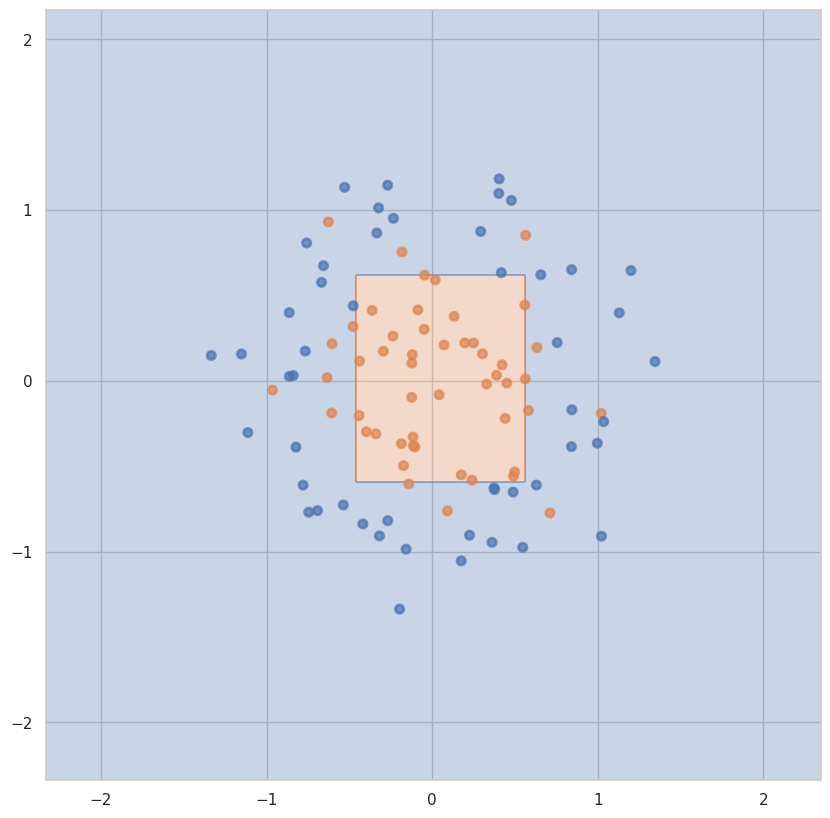

На обучающей для max_depth = 4 и min_samples_leaf = 9: 0.8375
На тестовой для max_depth = 4 и min_samples_leaf = 9: 0.9
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 10:


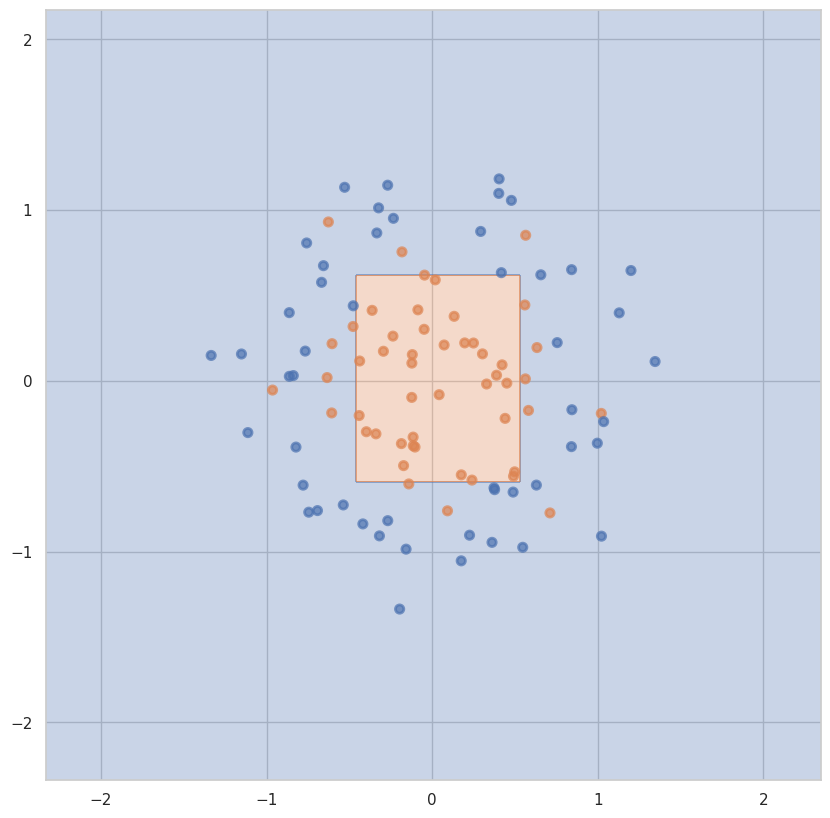

На обучающей для max_depth = 4 и min_samples_leaf = 10: 0.825
На тестовой для max_depth = 4 и min_samples_leaf = 10: 0.9
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 11:


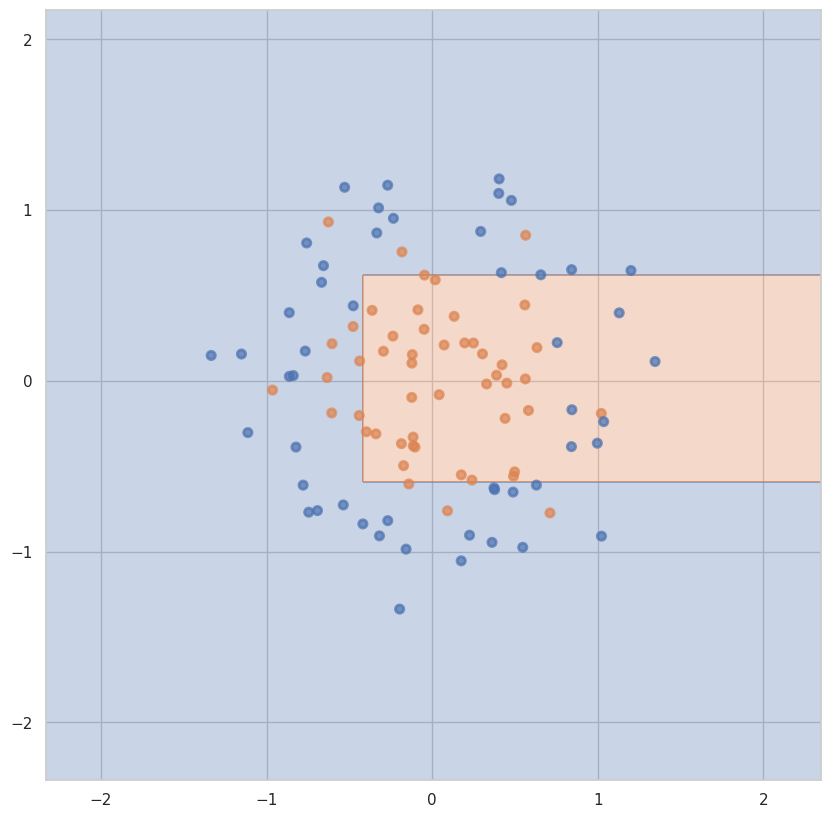

На обучающей для max_depth = 4 и min_samples_leaf = 11: 0.8125
На тестовой для max_depth = 4 и min_samples_leaf = 11: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 12:


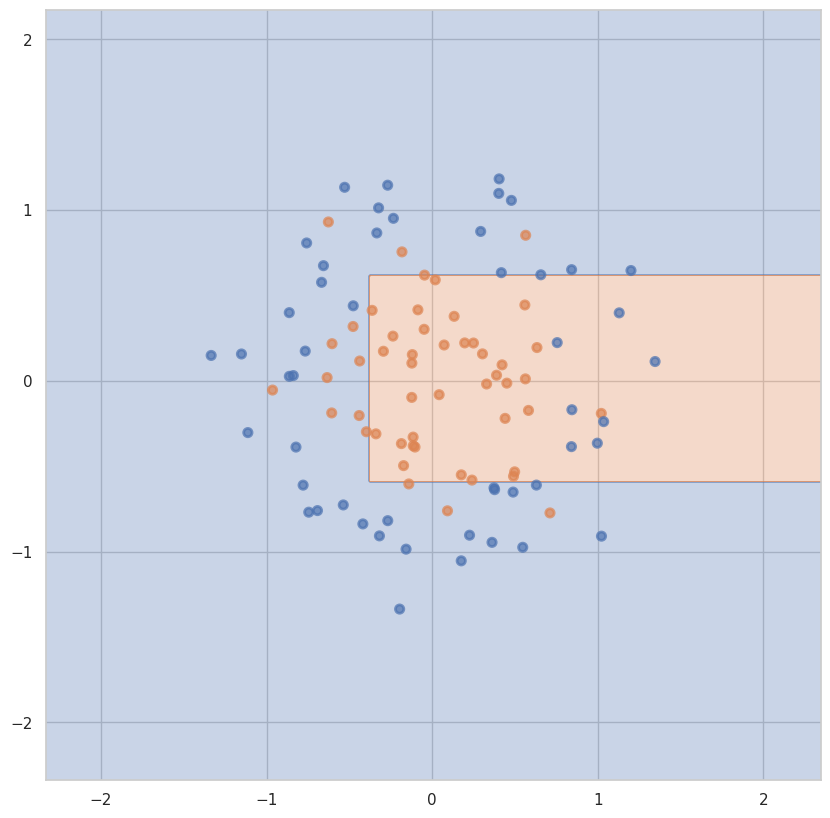

На обучающей для max_depth = 4 и min_samples_leaf = 12: 0.8
На тестовой для max_depth = 4 и min_samples_leaf = 12: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 13:


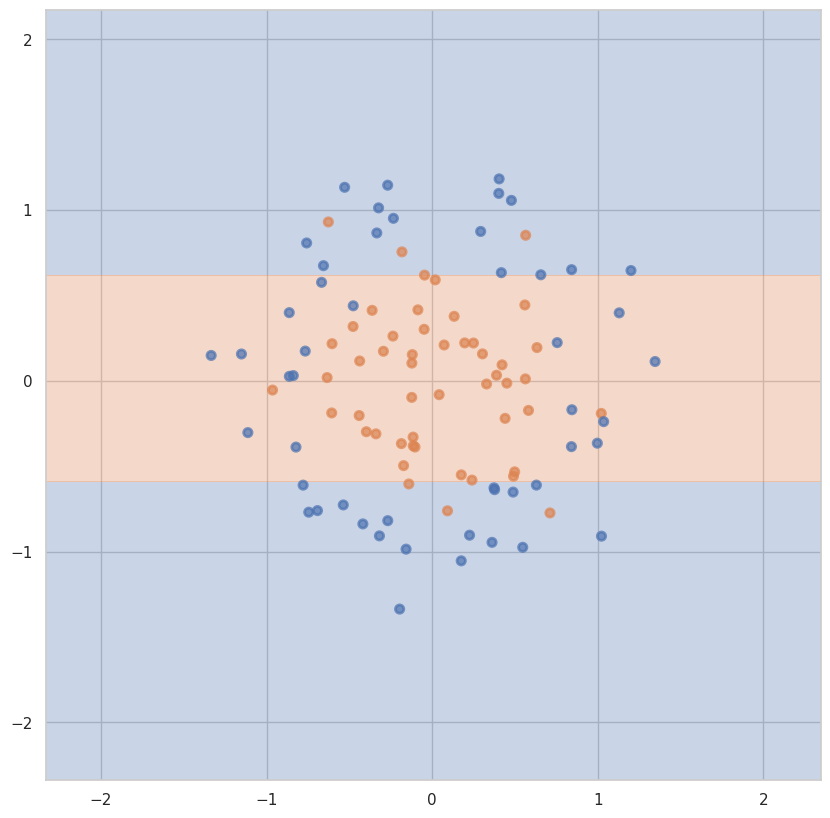

На обучающей для max_depth = 4 и min_samples_leaf = 13: 0.8
На тестовой для max_depth = 4 и min_samples_leaf = 13: 0.65
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 14:


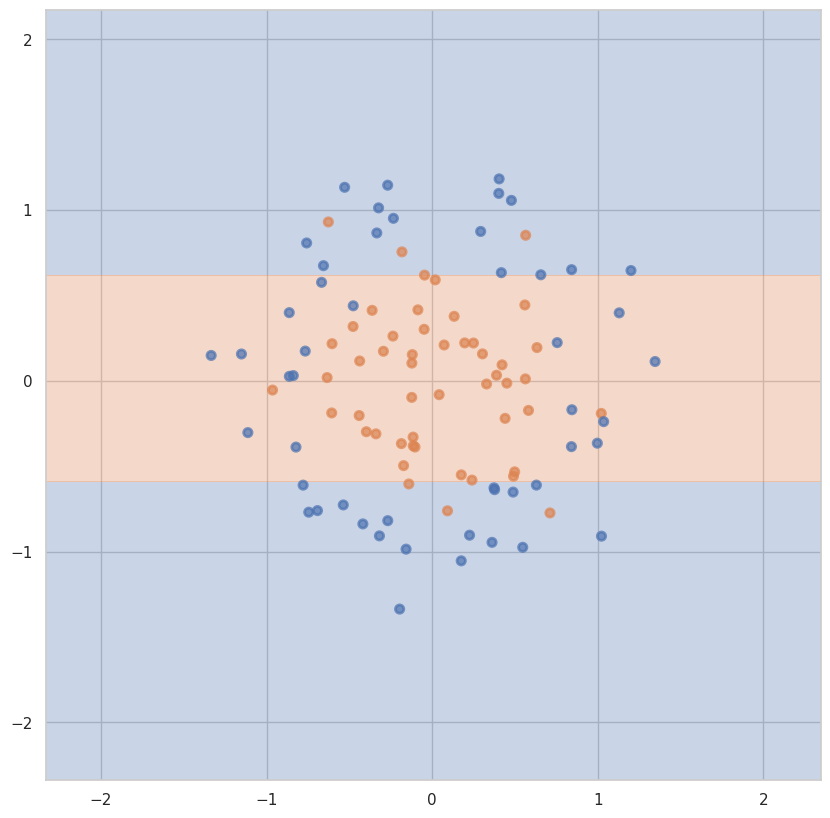

На обучающей для max_depth = 4 и min_samples_leaf = 14: 0.8
На тестовой для max_depth = 4 и min_samples_leaf = 14: 0.65
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 1:


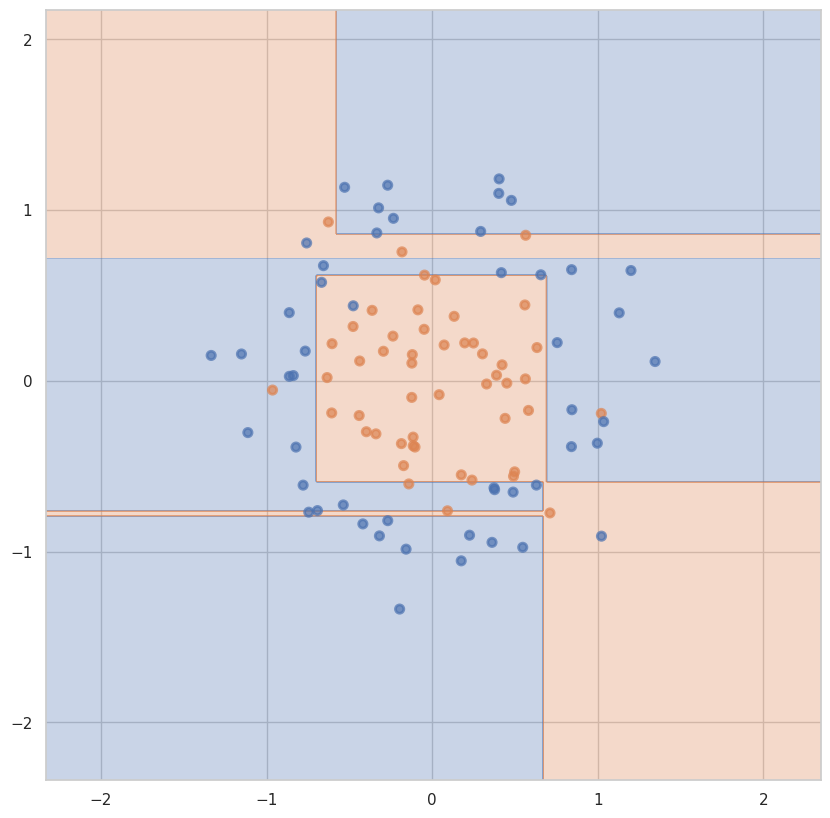

На обучающей для max_depth = 5 и min_samples_leaf = 1: 0.975
На тестовой для max_depth = 5 и min_samples_leaf = 1: 0.7
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 2:


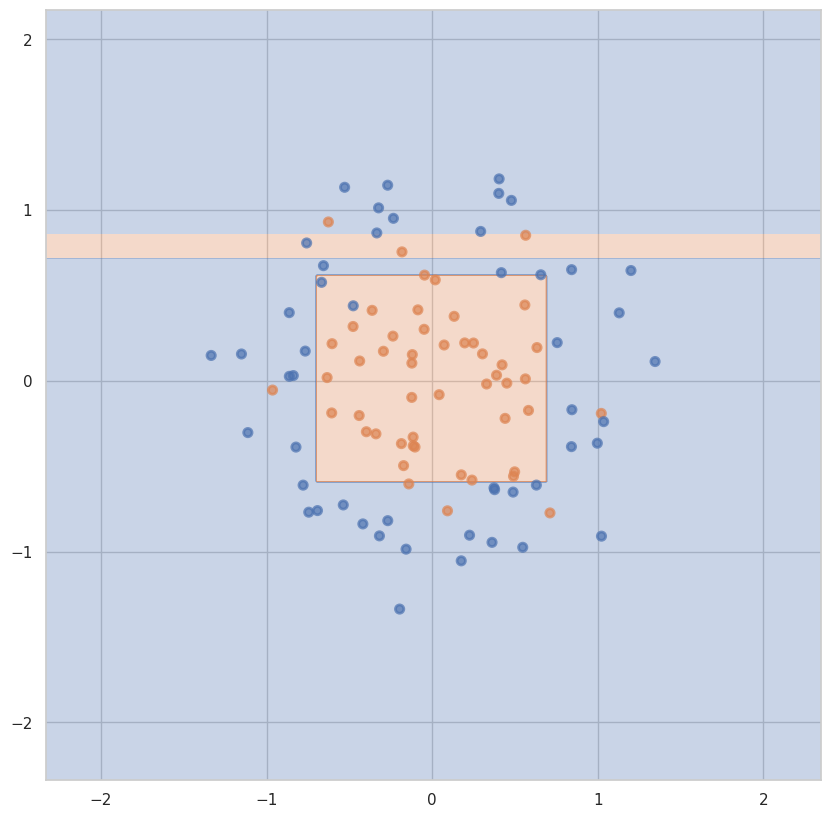

На обучающей для max_depth = 5 и min_samples_leaf = 2: 0.9375
На тестовой для max_depth = 5 и min_samples_leaf = 2: 0.8
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 3:


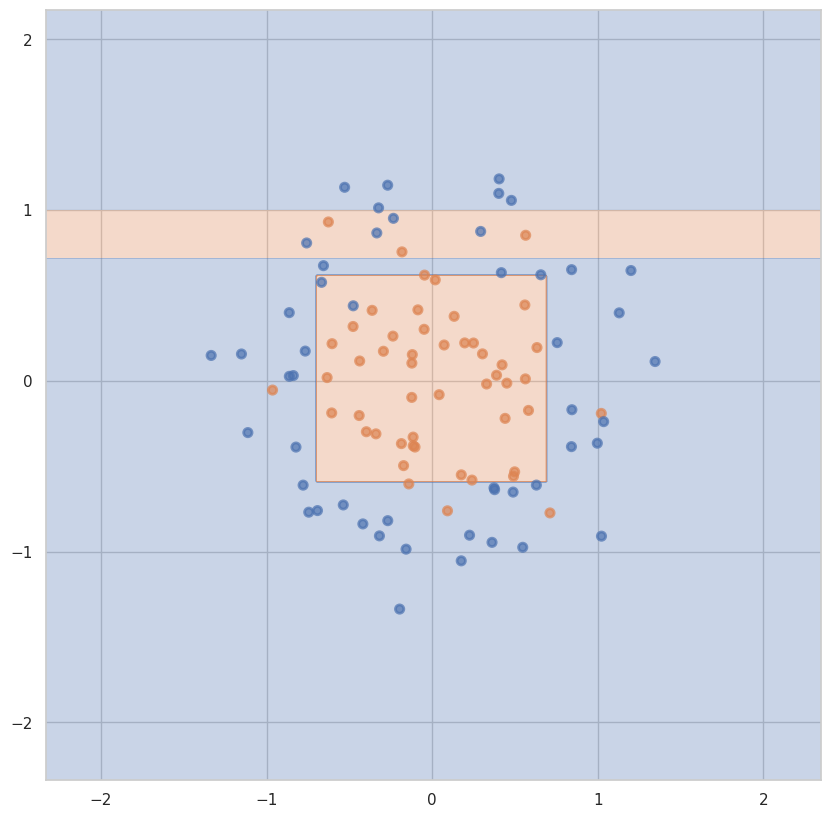

На обучающей для max_depth = 5 и min_samples_leaf = 3: 0.925
На тестовой для max_depth = 5 и min_samples_leaf = 3: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 4:


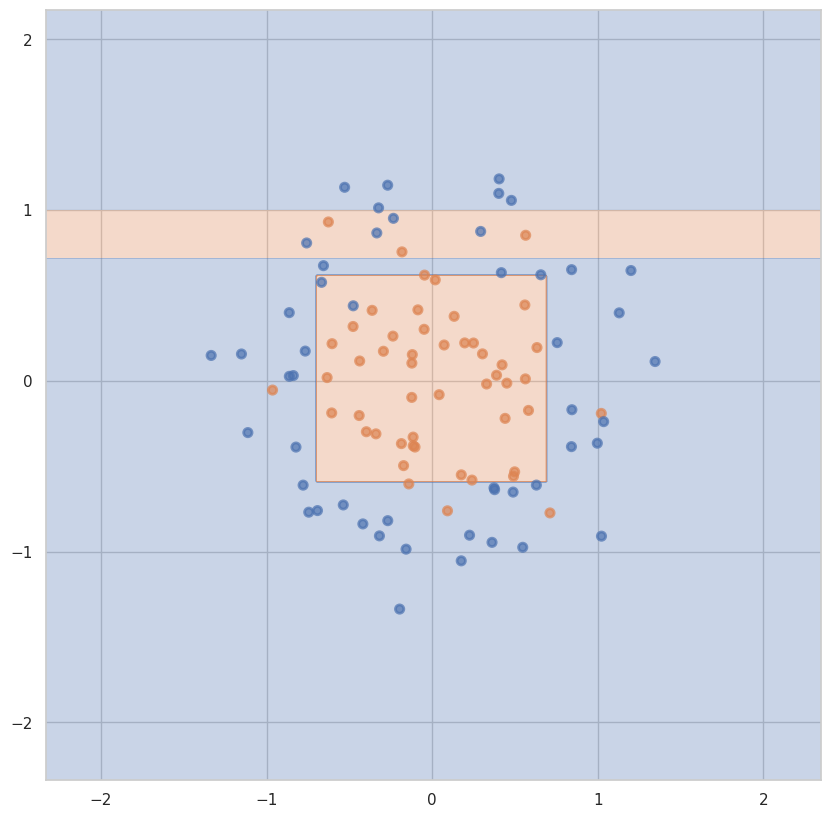

На обучающей для max_depth = 5 и min_samples_leaf = 4: 0.925
На тестовой для max_depth = 5 и min_samples_leaf = 4: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 5:


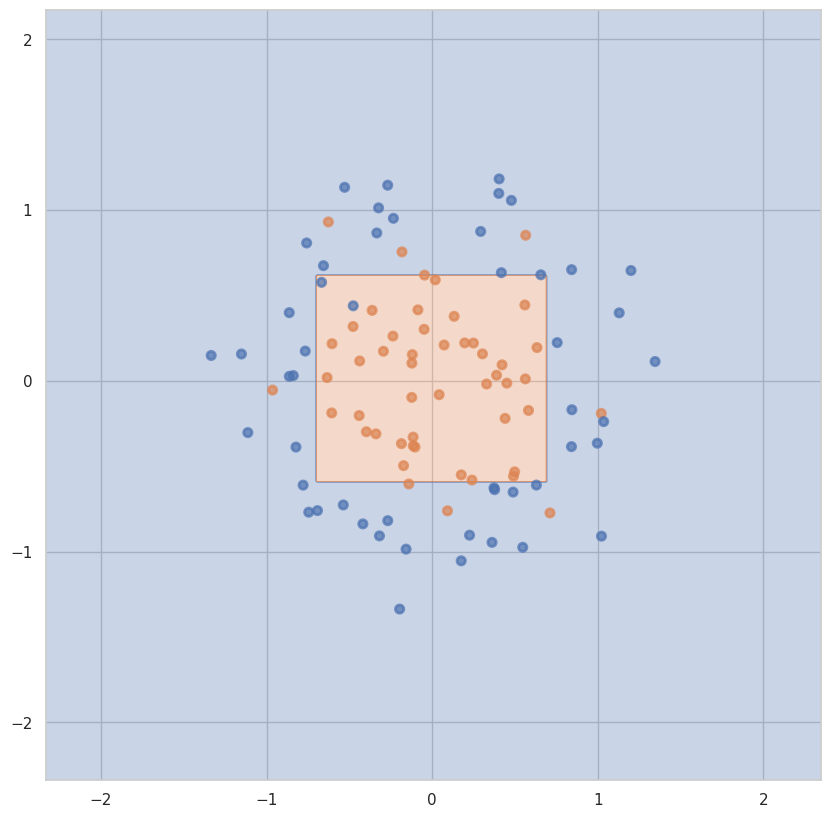

На обучающей для max_depth = 5 и min_samples_leaf = 5: 0.9125
На тестовой для max_depth = 5 и min_samples_leaf = 5: 0.85
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 6:


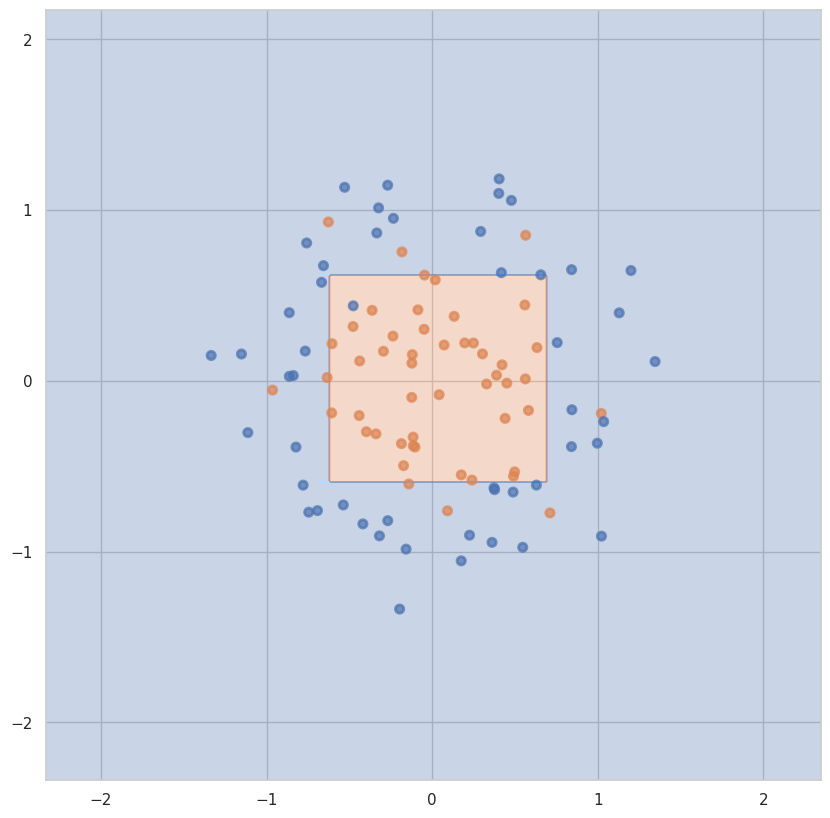

На обучающей для max_depth = 5 и min_samples_leaf = 6: 0.9
На тестовой для max_depth = 5 и min_samples_leaf = 6: 0.9
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 7:


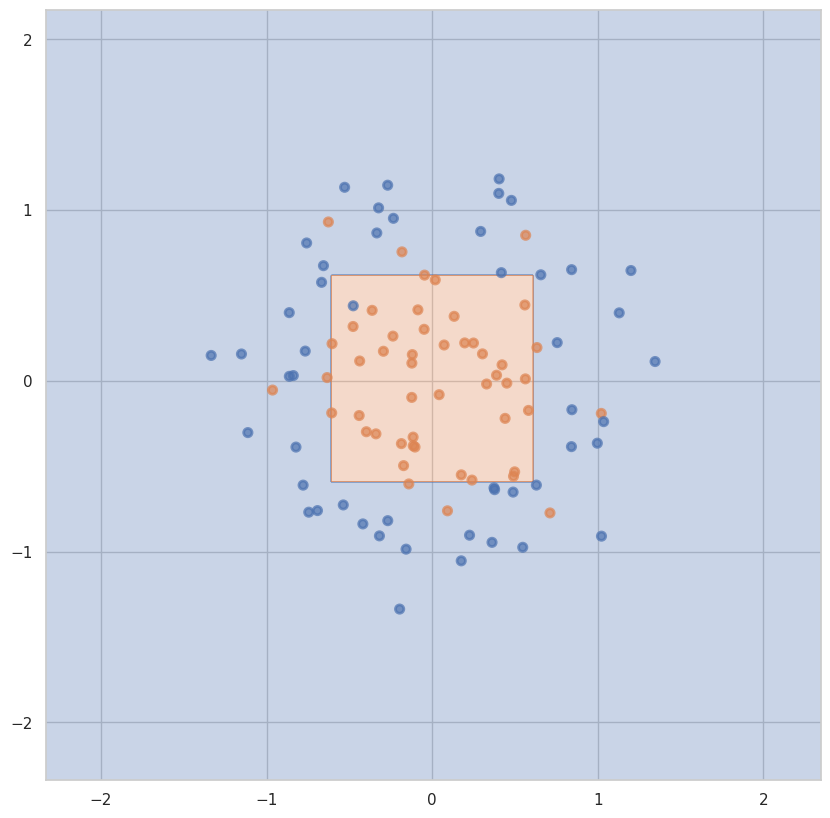

На обучающей для max_depth = 5 и min_samples_leaf = 7: 0.875
На тестовой для max_depth = 5 и min_samples_leaf = 7: 0.9
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 8:


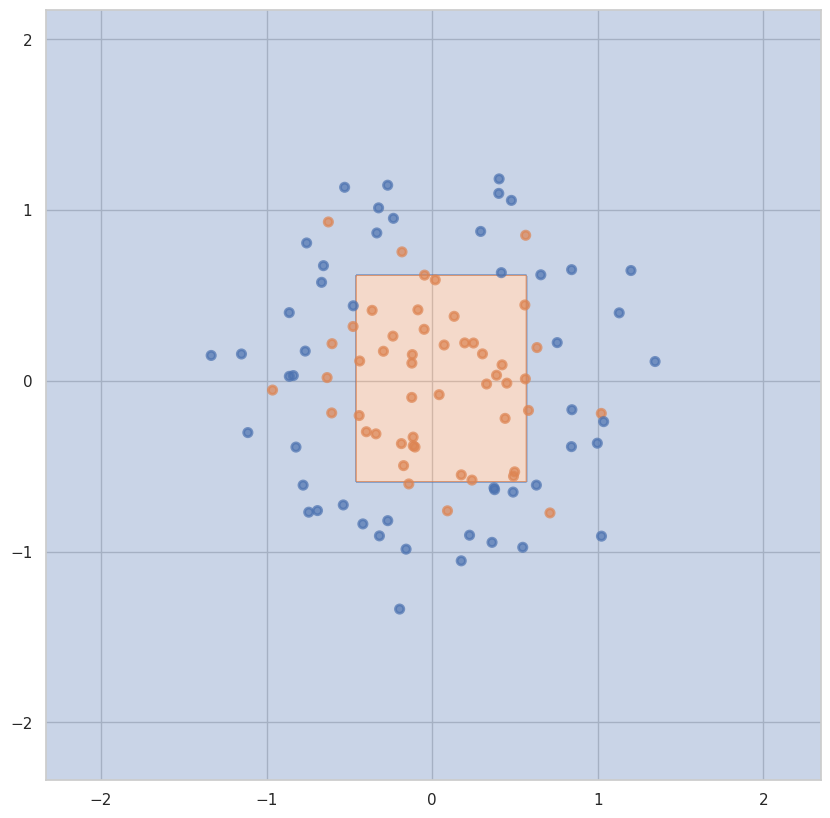

На обучающей для max_depth = 5 и min_samples_leaf = 8: 0.85
На тестовой для max_depth = 5 и min_samples_leaf = 8: 0.9
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 9:


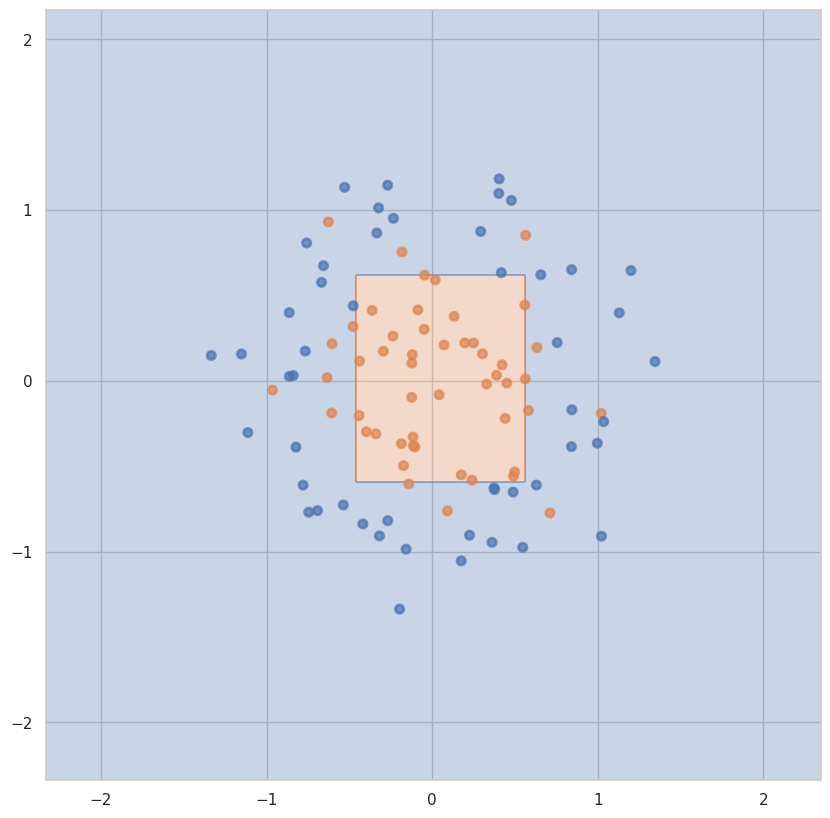

На обучающей для max_depth = 5 и min_samples_leaf = 9: 0.8375
На тестовой для max_depth = 5 и min_samples_leaf = 9: 0.9
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 10:


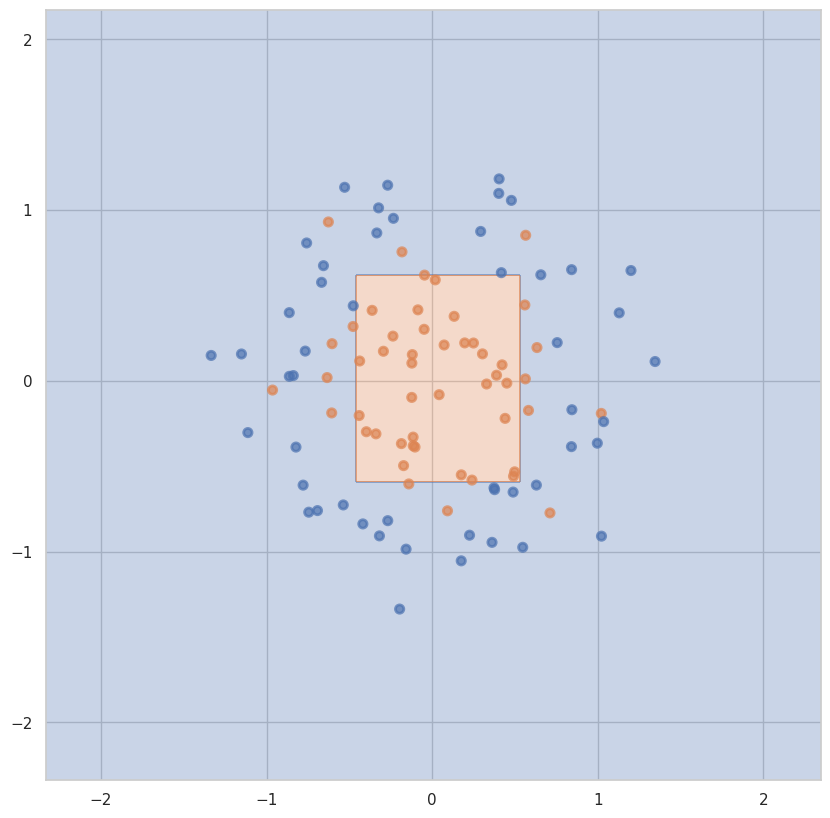

На обучающей для max_depth = 5 и min_samples_leaf = 10: 0.825
На тестовой для max_depth = 5 и min_samples_leaf = 10: 0.9
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 11:


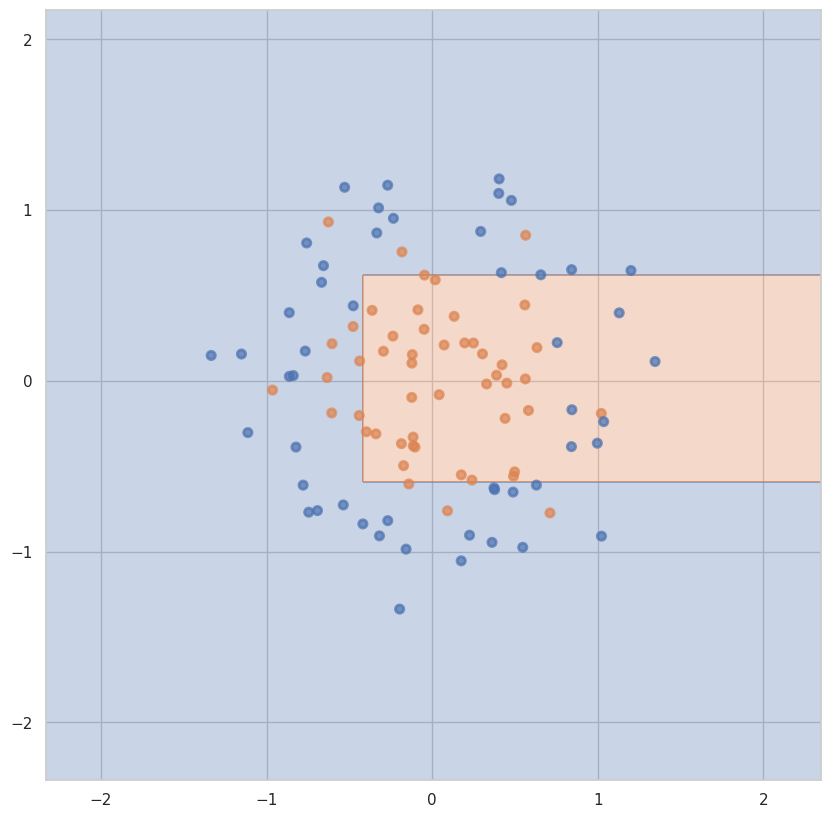

На обучающей для max_depth = 5 и min_samples_leaf = 11: 0.8125
На тестовой для max_depth = 5 и min_samples_leaf = 11: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 12:


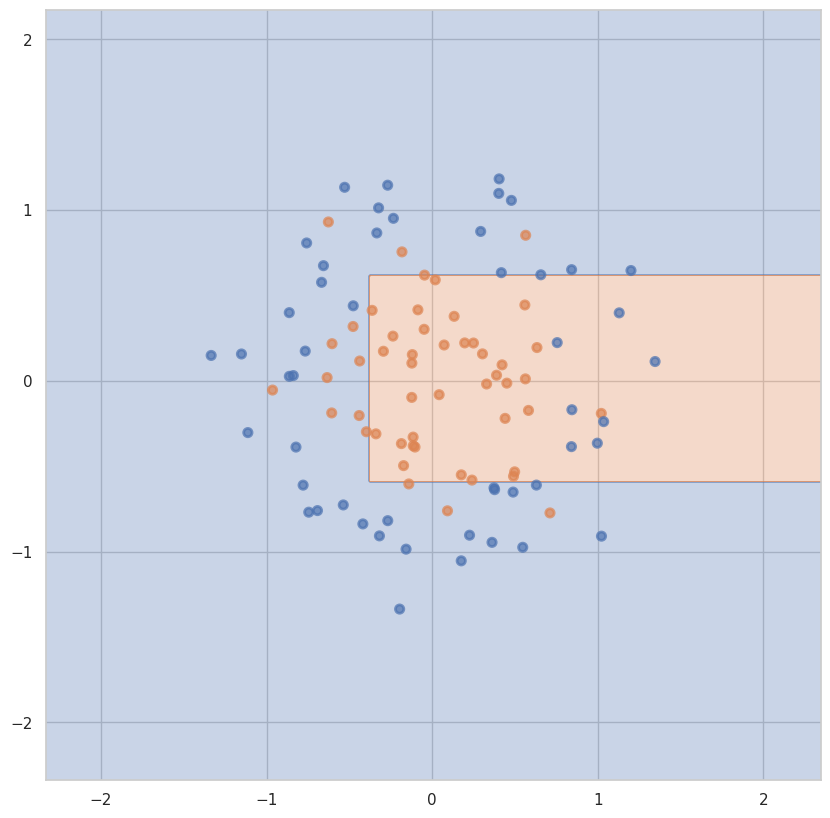

На обучающей для max_depth = 5 и min_samples_leaf = 12: 0.8
На тестовой для max_depth = 5 и min_samples_leaf = 12: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 13:


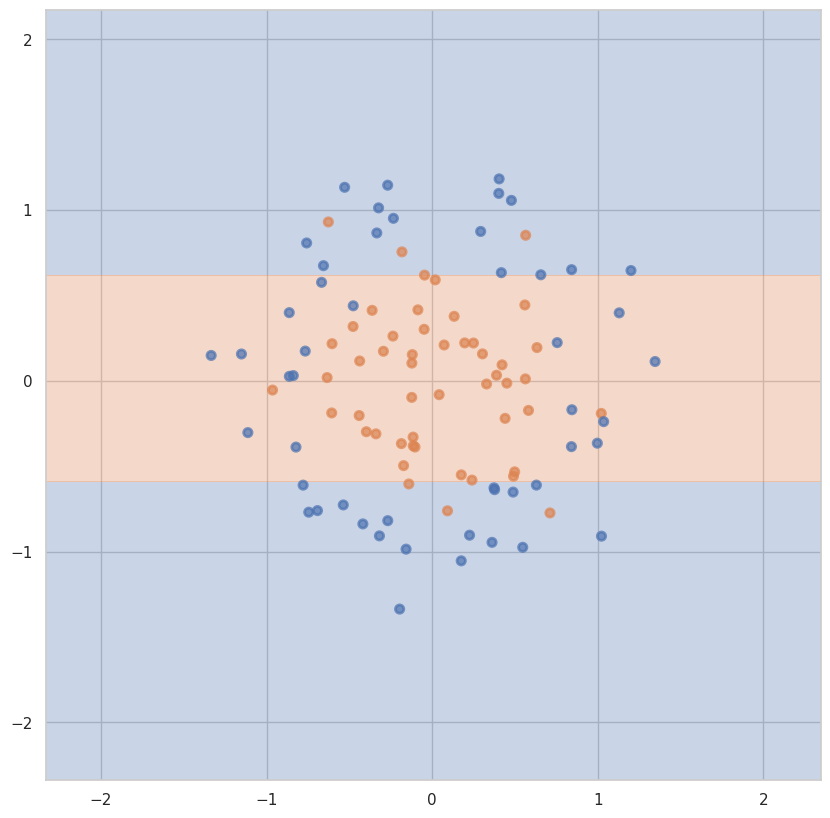

На обучающей для max_depth = 5 и min_samples_leaf = 13: 0.8
На тестовой для max_depth = 5 и min_samples_leaf = 13: 0.65
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 14:


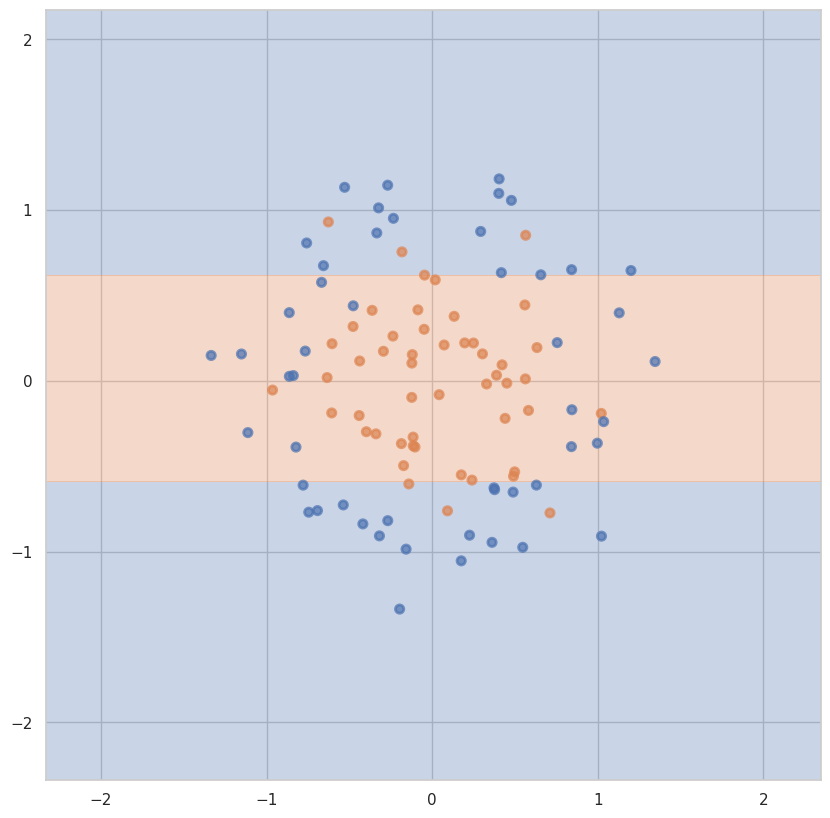

На обучающей для max_depth = 5 и min_samples_leaf = 14: 0.8
На тестовой для max_depth = 5 и min_samples_leaf = 14: 0.65
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 1:


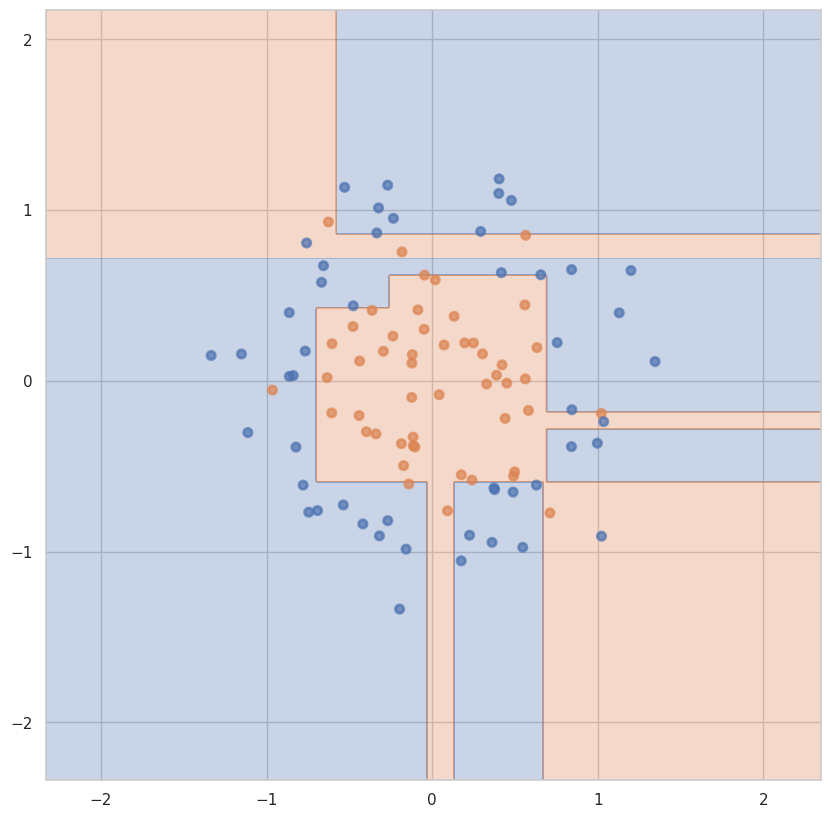

На обучающей для max_depth = 6 и min_samples_leaf = 1: 1.0
На тестовой для max_depth = 6 и min_samples_leaf = 1: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 2:


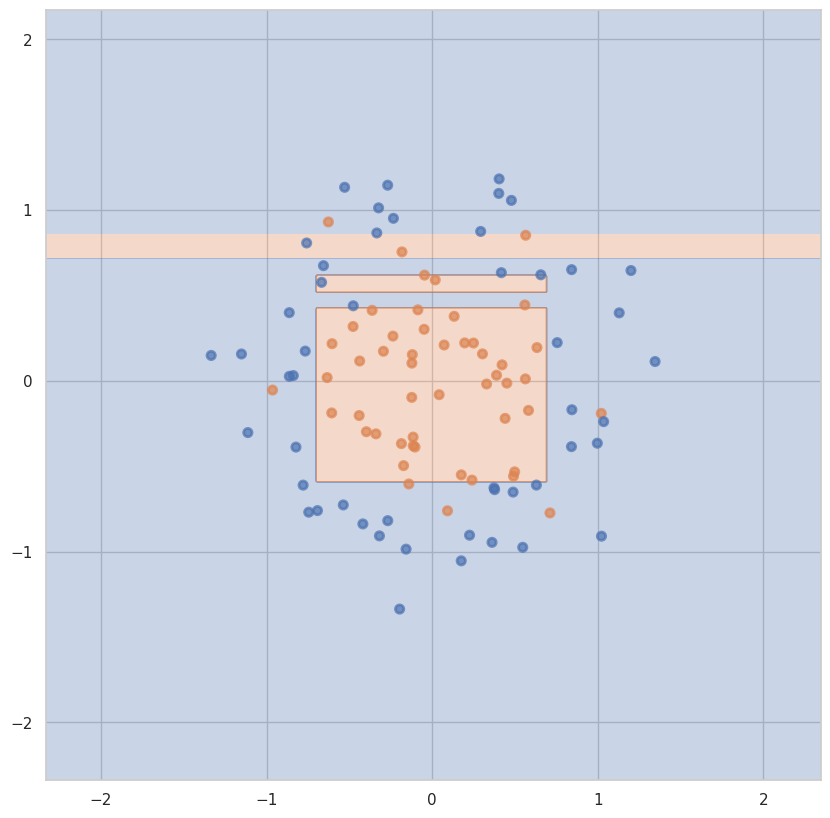

На обучающей для max_depth = 6 и min_samples_leaf = 2: 0.9375
На тестовой для max_depth = 6 и min_samples_leaf = 2: 0.8
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 3:


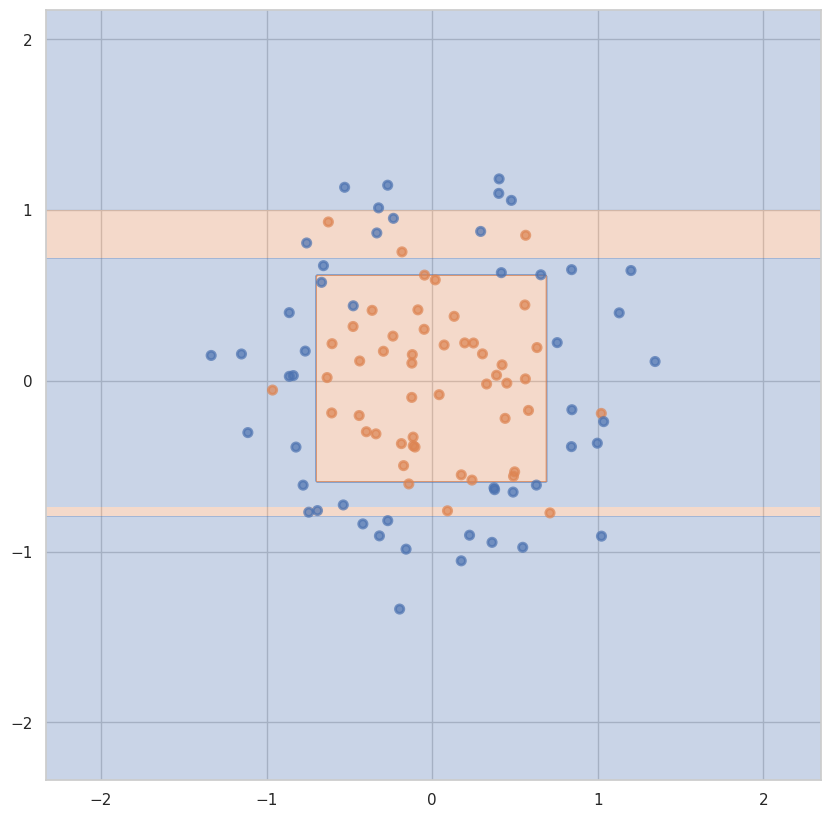

На обучающей для max_depth = 6 и min_samples_leaf = 3: 0.9375
На тестовой для max_depth = 6 и min_samples_leaf = 3: 0.7
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 4:


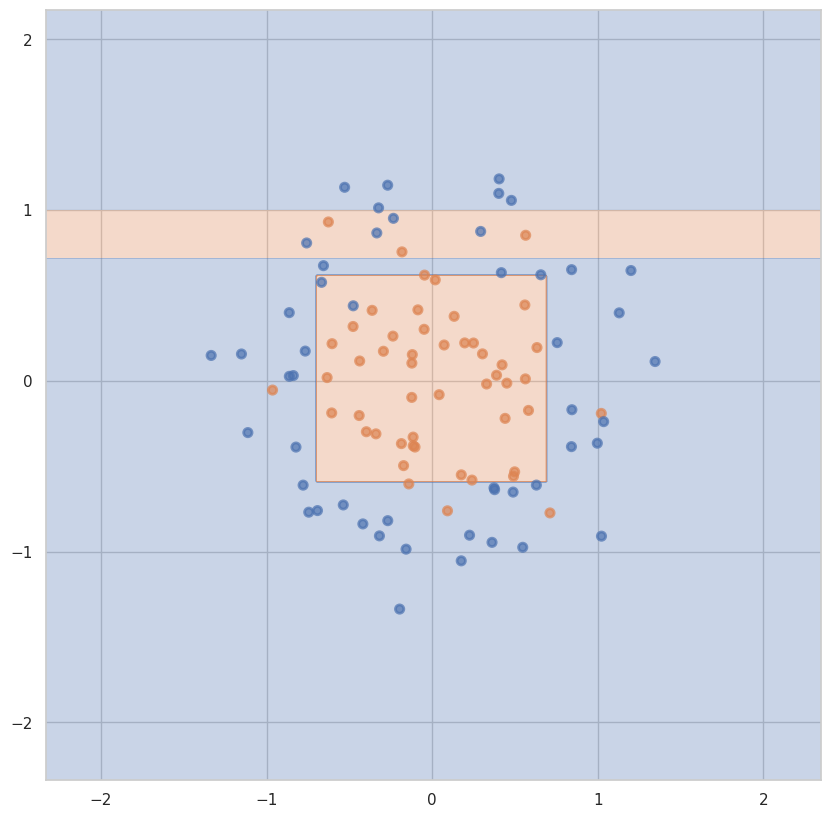

На обучающей для max_depth = 6 и min_samples_leaf = 4: 0.925
На тестовой для max_depth = 6 и min_samples_leaf = 4: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 5:


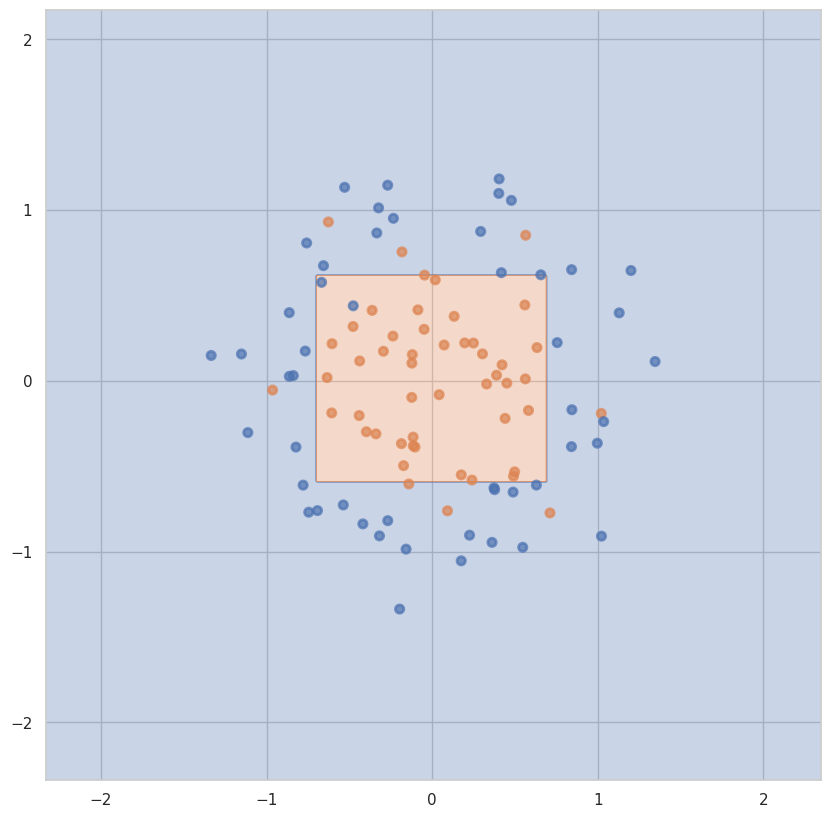

На обучающей для max_depth = 6 и min_samples_leaf = 5: 0.9125
На тестовой для max_depth = 6 и min_samples_leaf = 5: 0.85
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 6:


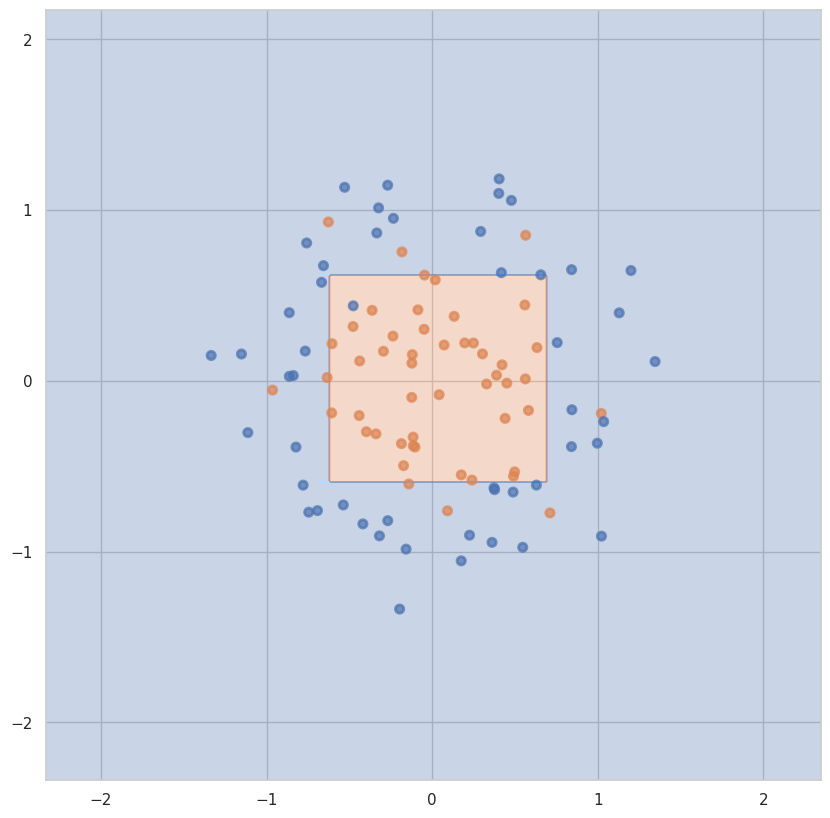

На обучающей для max_depth = 6 и min_samples_leaf = 6: 0.9
На тестовой для max_depth = 6 и min_samples_leaf = 6: 0.9
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 7:


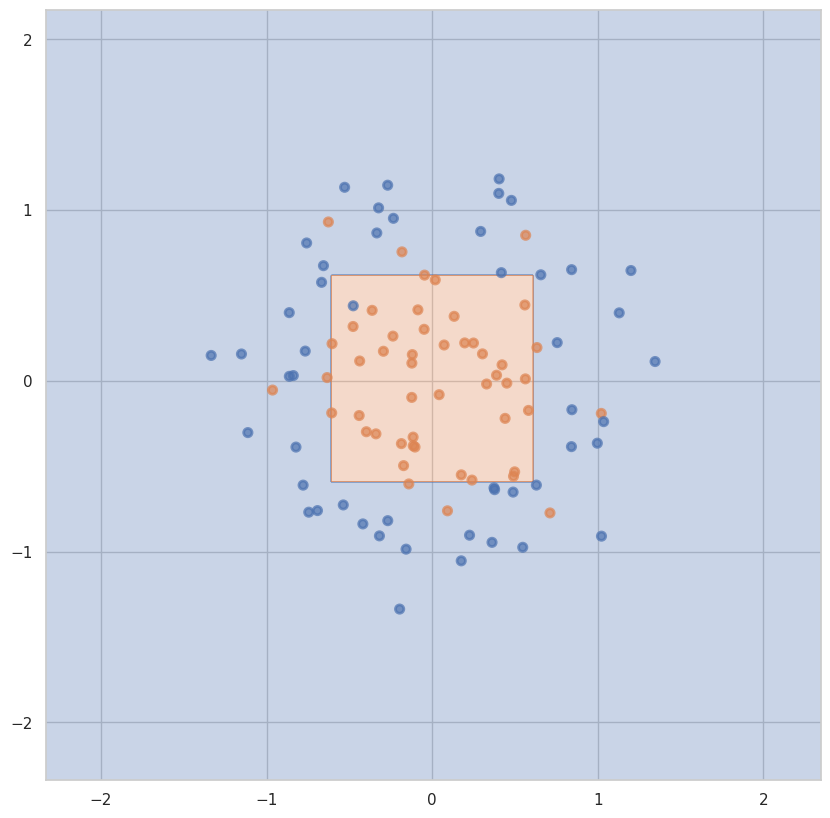

На обучающей для max_depth = 6 и min_samples_leaf = 7: 0.875
На тестовой для max_depth = 6 и min_samples_leaf = 7: 0.9
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 8:


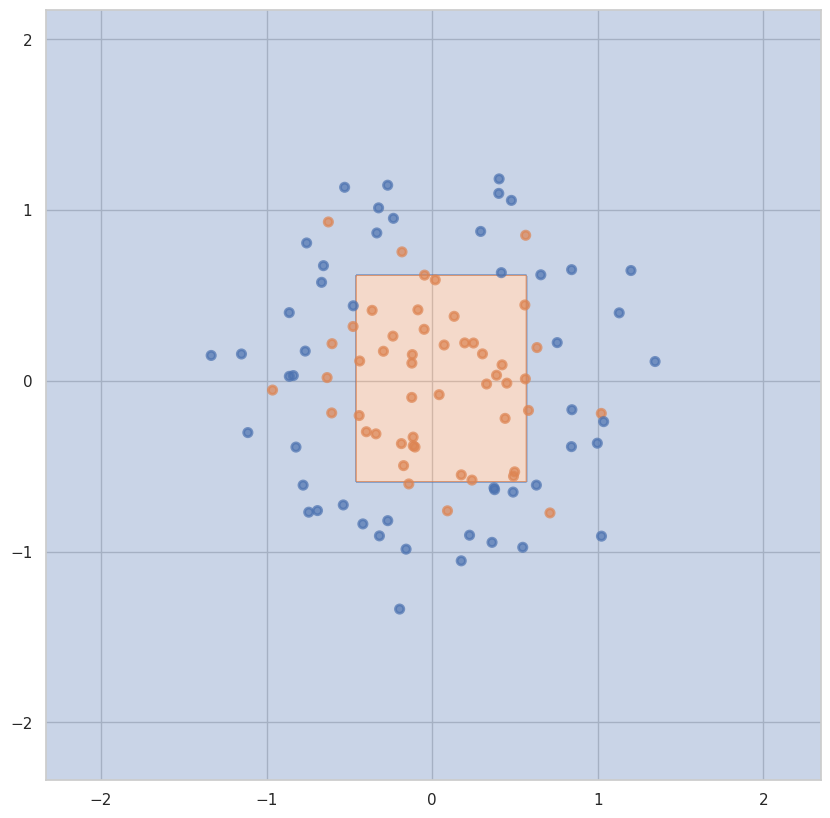

На обучающей для max_depth = 6 и min_samples_leaf = 8: 0.85
На тестовой для max_depth = 6 и min_samples_leaf = 8: 0.9
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 9:


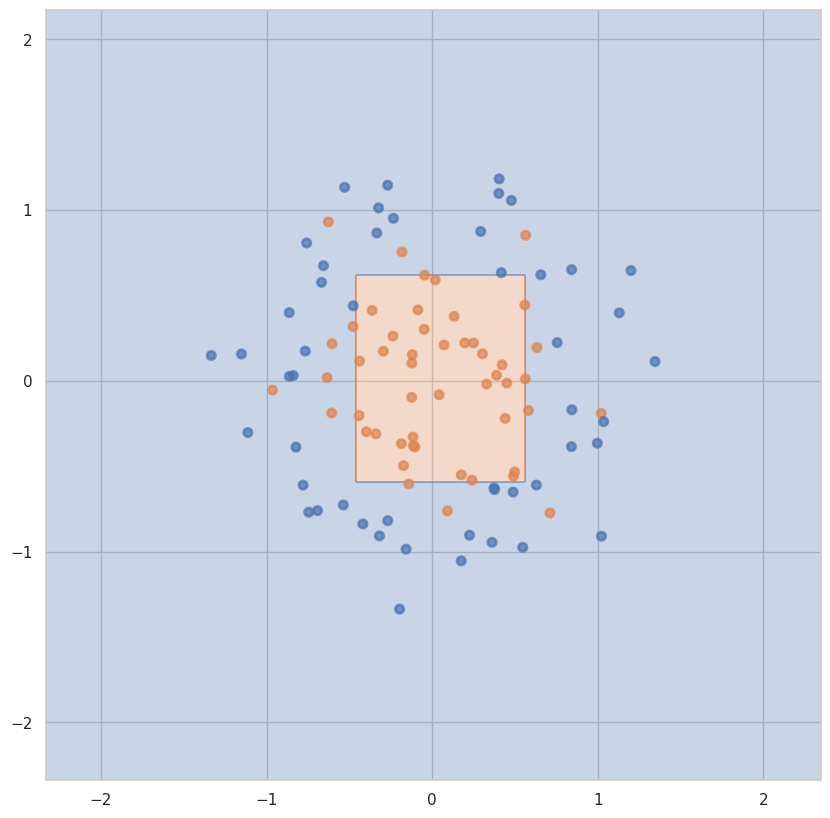

На обучающей для max_depth = 6 и min_samples_leaf = 9: 0.8375
На тестовой для max_depth = 6 и min_samples_leaf = 9: 0.9
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 10:


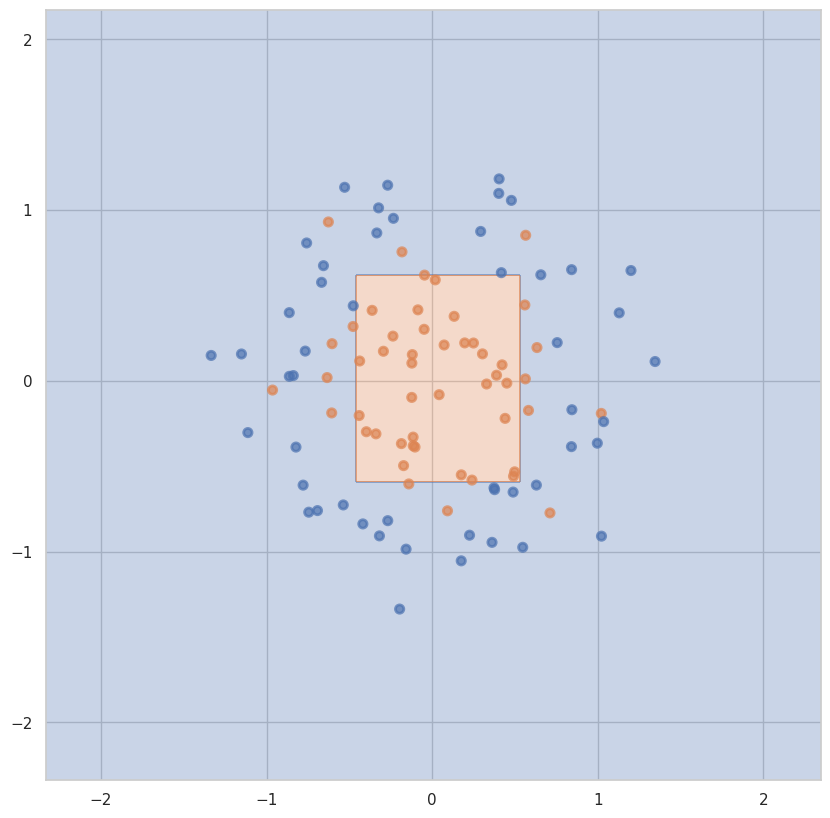

На обучающей для max_depth = 6 и min_samples_leaf = 10: 0.825
На тестовой для max_depth = 6 и min_samples_leaf = 10: 0.9
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 11:


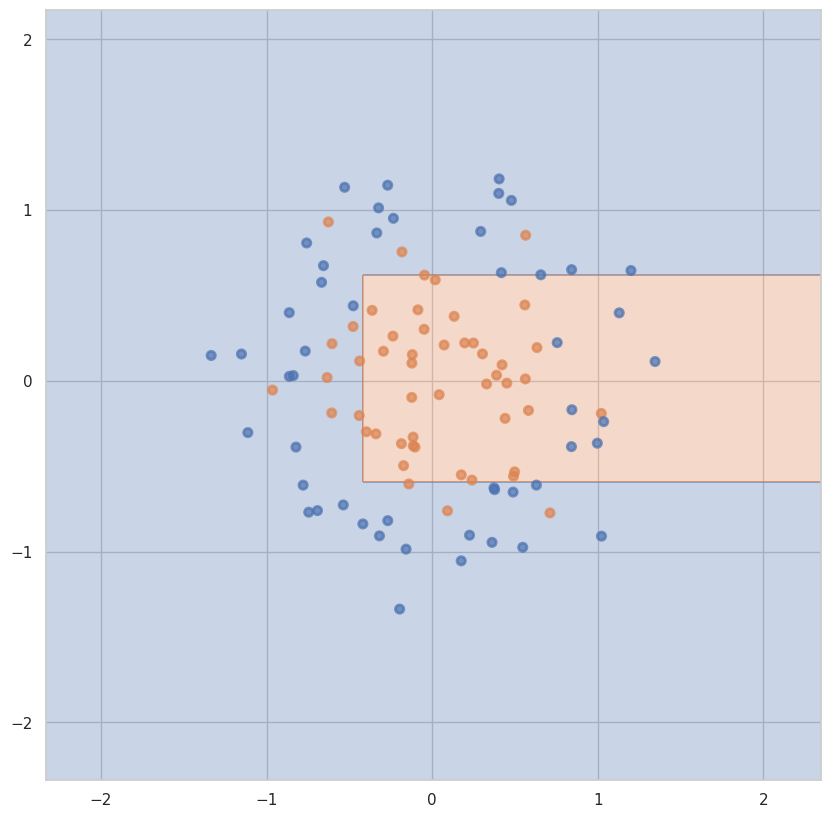

На обучающей для max_depth = 6 и min_samples_leaf = 11: 0.8125
На тестовой для max_depth = 6 и min_samples_leaf = 11: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 12:


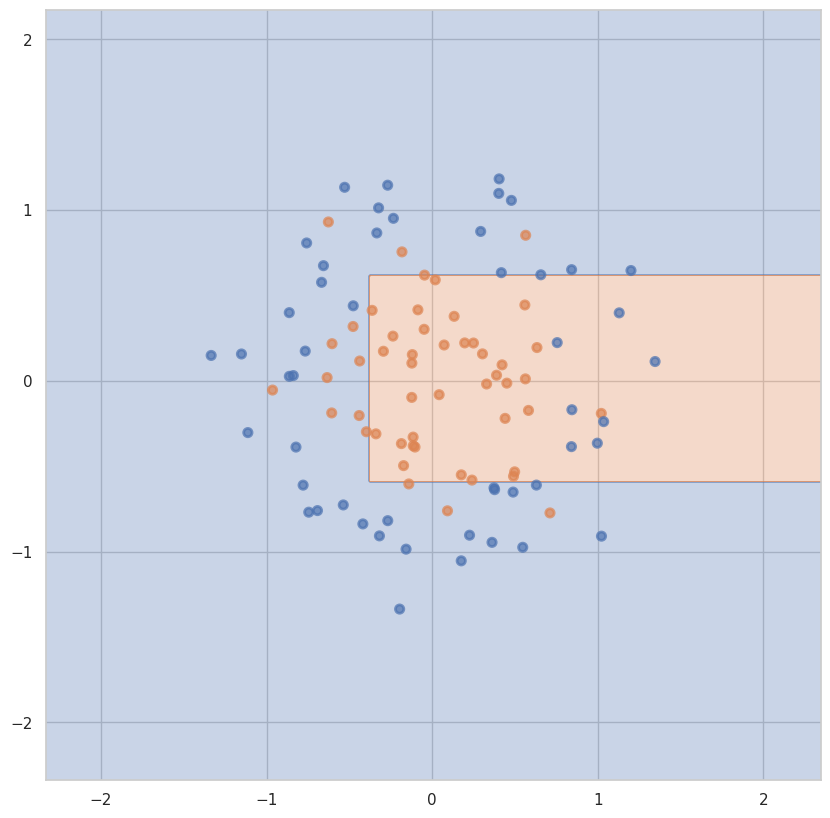

На обучающей для max_depth = 6 и min_samples_leaf = 12: 0.8
На тестовой для max_depth = 6 и min_samples_leaf = 12: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 13:


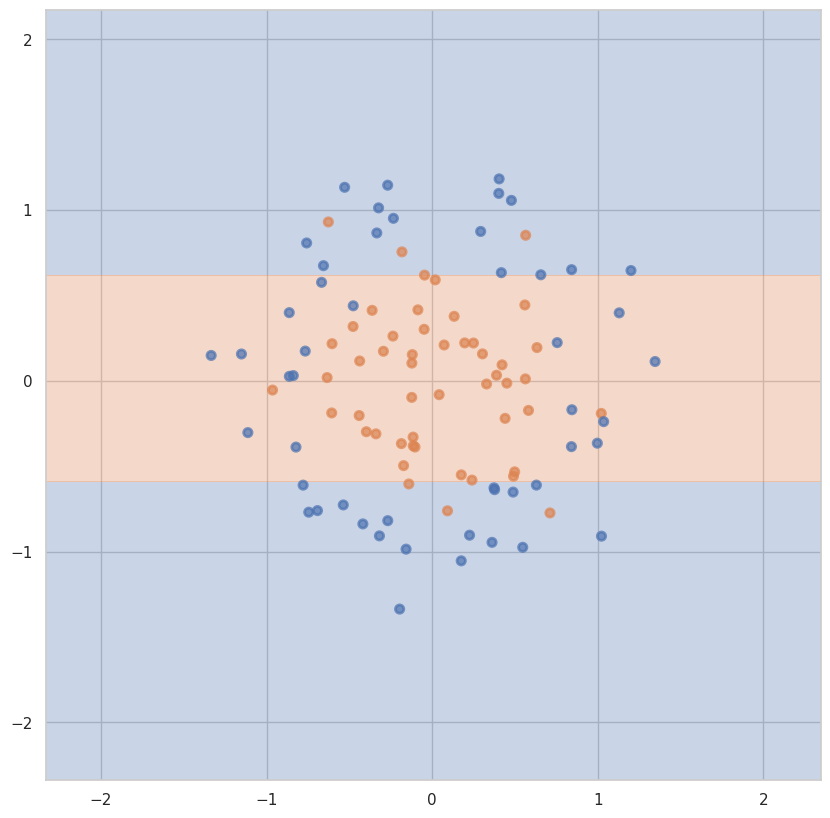

На обучающей для max_depth = 6 и min_samples_leaf = 13: 0.8
На тестовой для max_depth = 6 и min_samples_leaf = 13: 0.65
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 14:


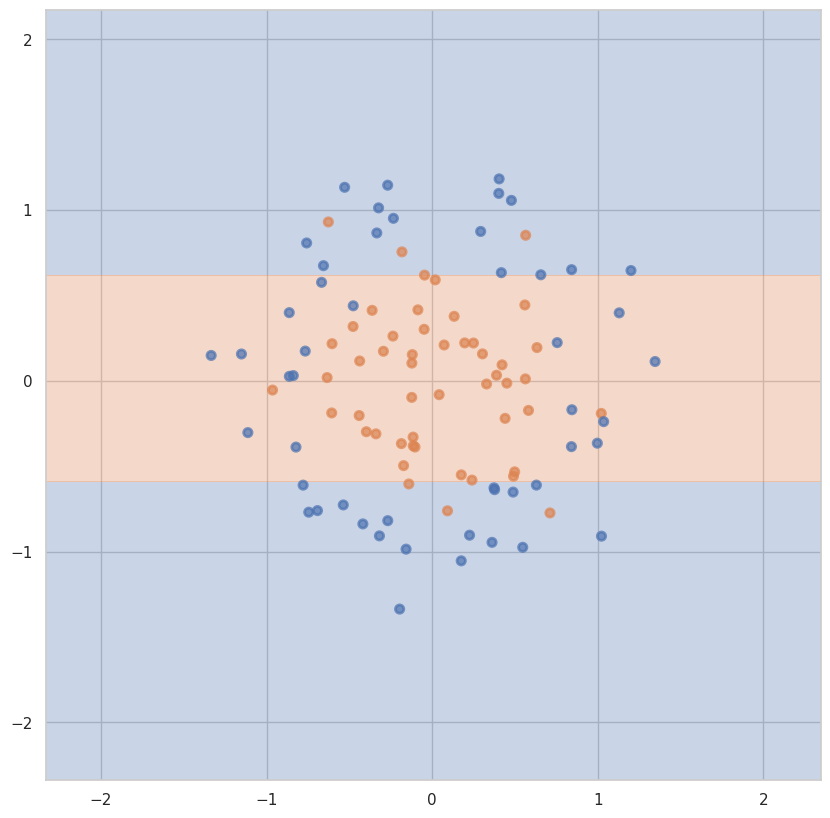

На обучающей для max_depth = 6 и min_samples_leaf = 14: 0.8
На тестовой для max_depth = 6 и min_samples_leaf = 14: 0.65
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 1:


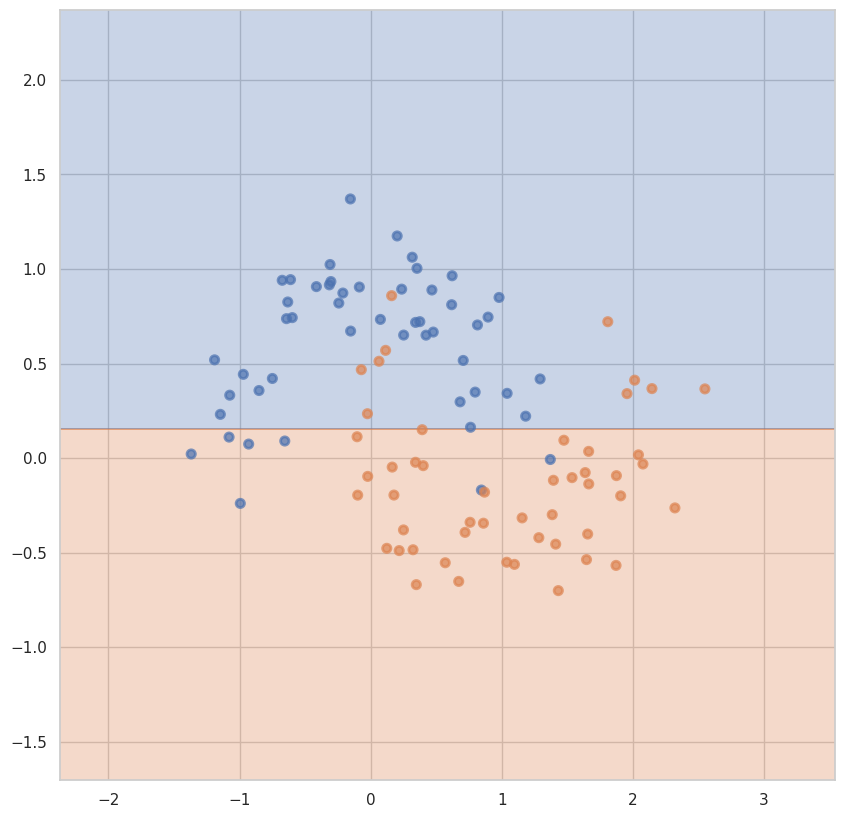

На обучающей для max_depth = 1 и min_samples_leaf = 1: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 1: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 2:


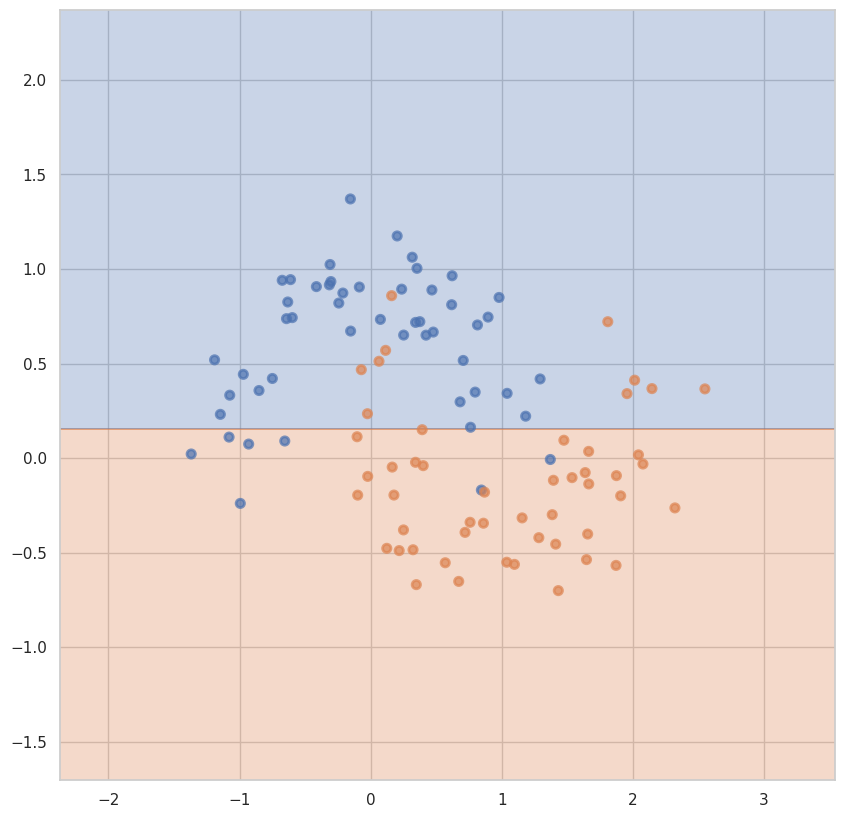

На обучающей для max_depth = 1 и min_samples_leaf = 2: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 2: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 3:


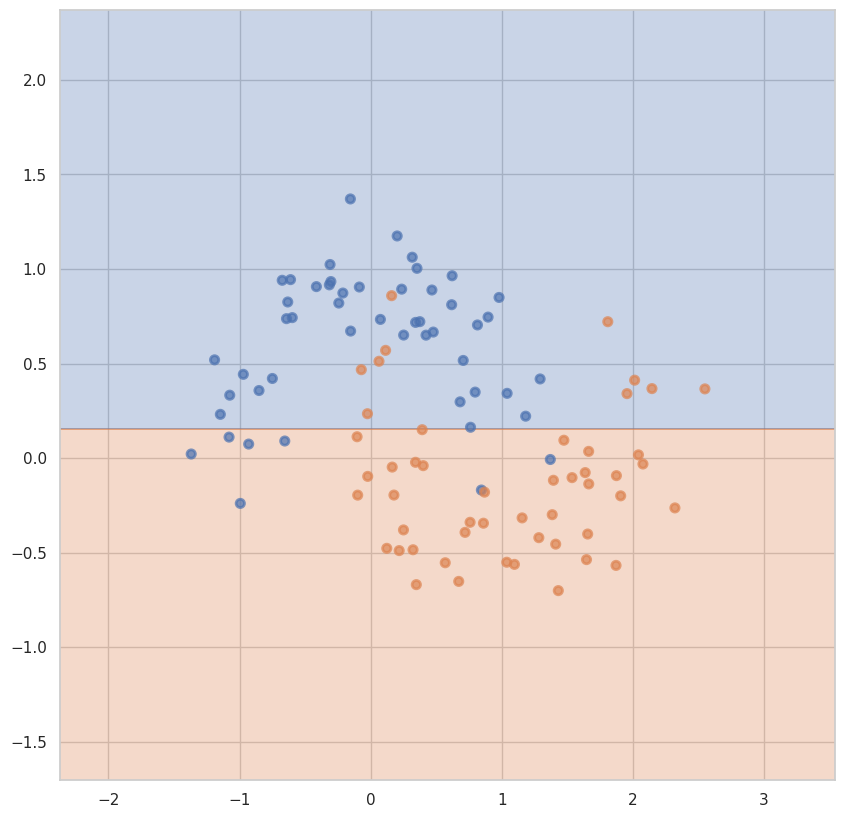

На обучающей для max_depth = 1 и min_samples_leaf = 3: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 3: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 4:


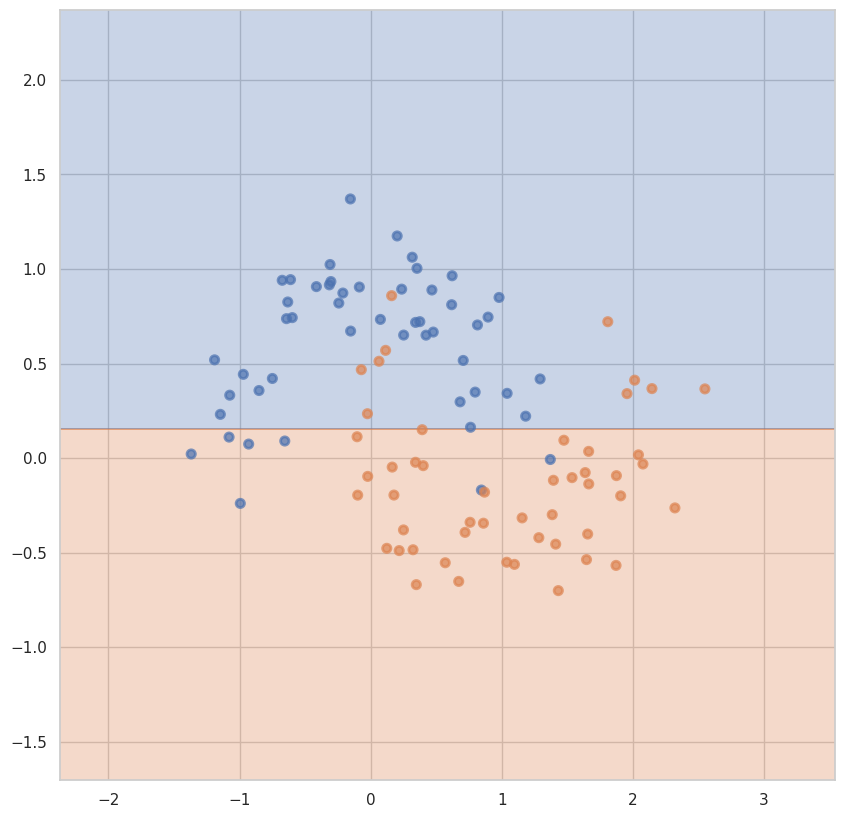

На обучающей для max_depth = 1 и min_samples_leaf = 4: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 4: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 5:


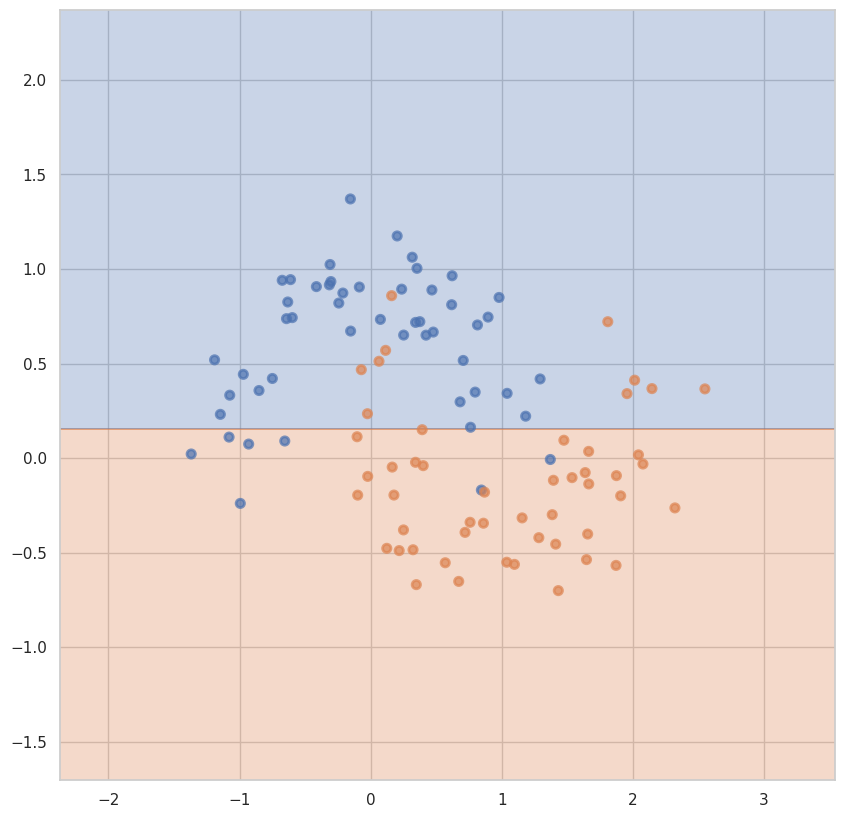

На обучающей для max_depth = 1 и min_samples_leaf = 5: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 5: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 6:


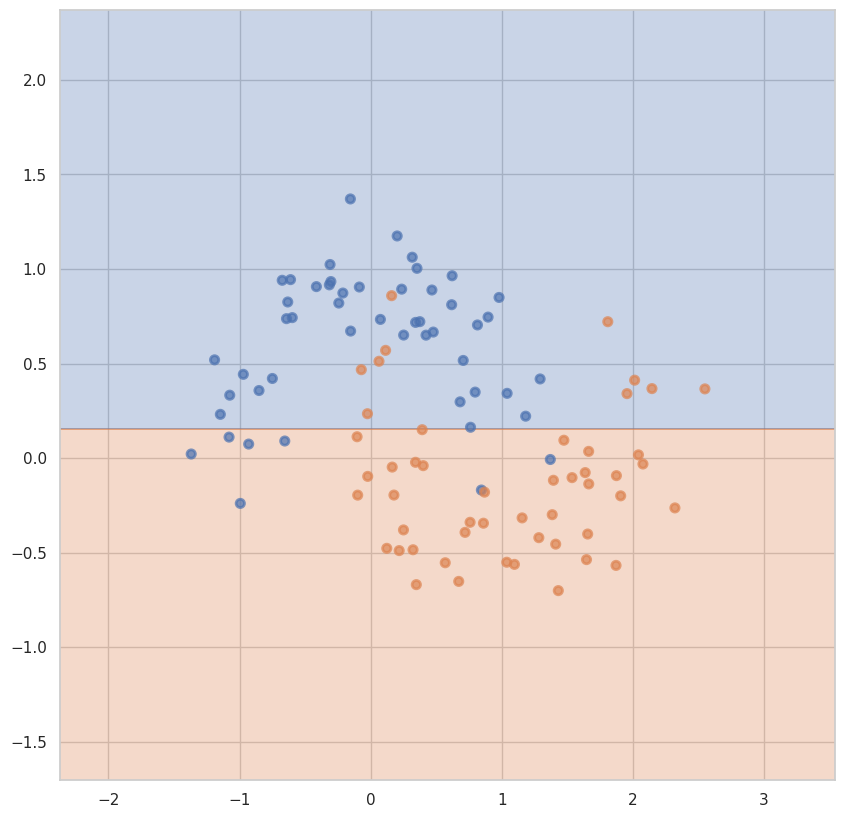

На обучающей для max_depth = 1 и min_samples_leaf = 6: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 6: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 7:


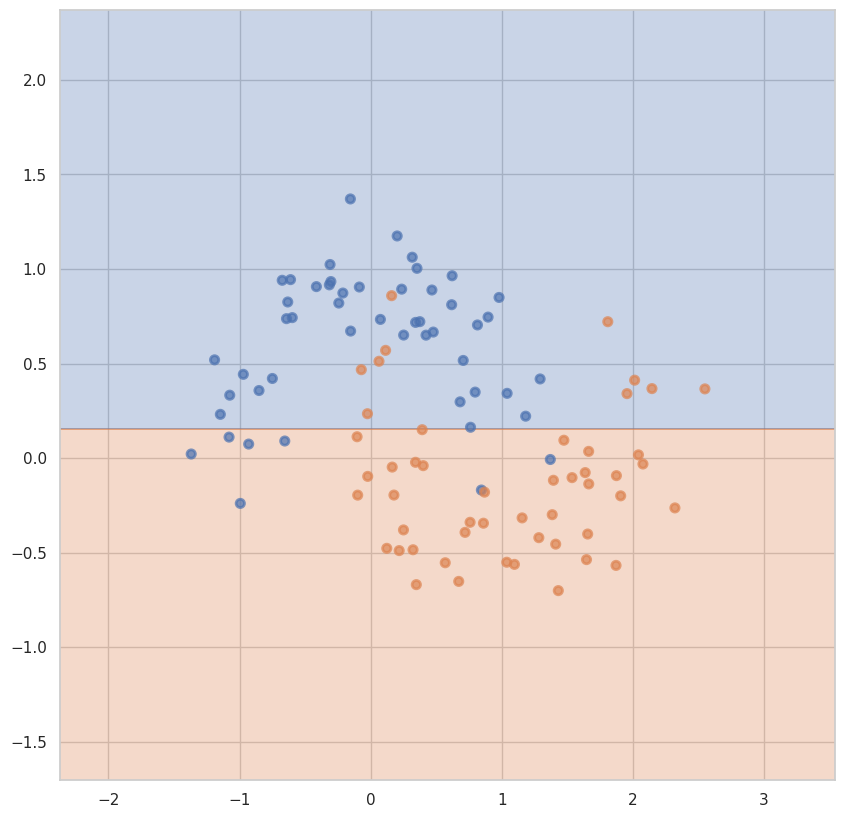

На обучающей для max_depth = 1 и min_samples_leaf = 7: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 7: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 8:


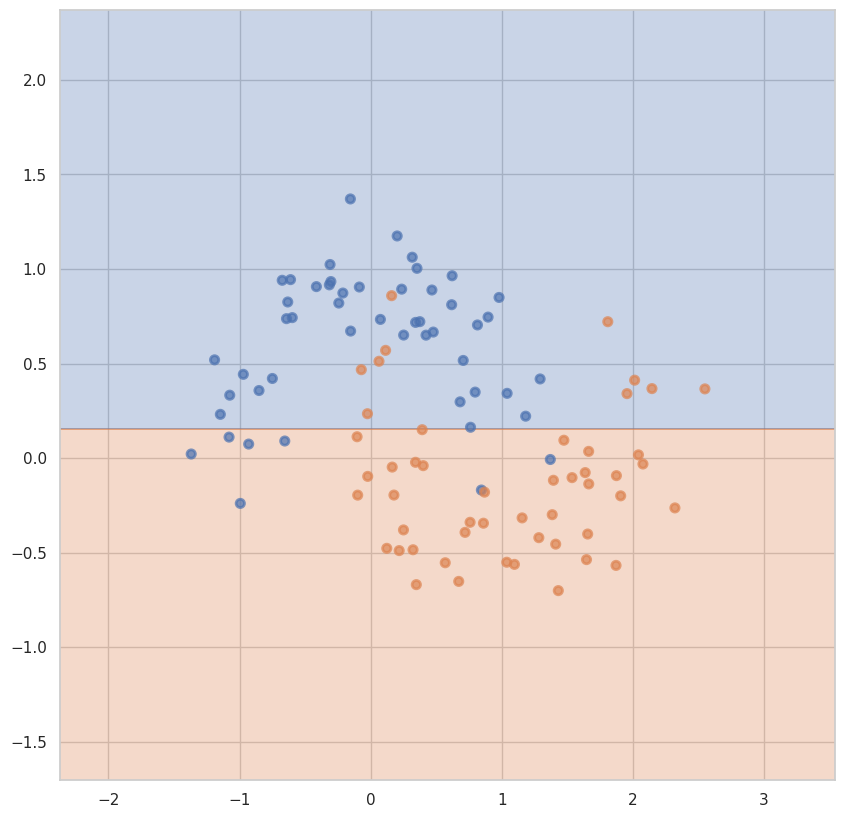

На обучающей для max_depth = 1 и min_samples_leaf = 8: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 8: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 9:


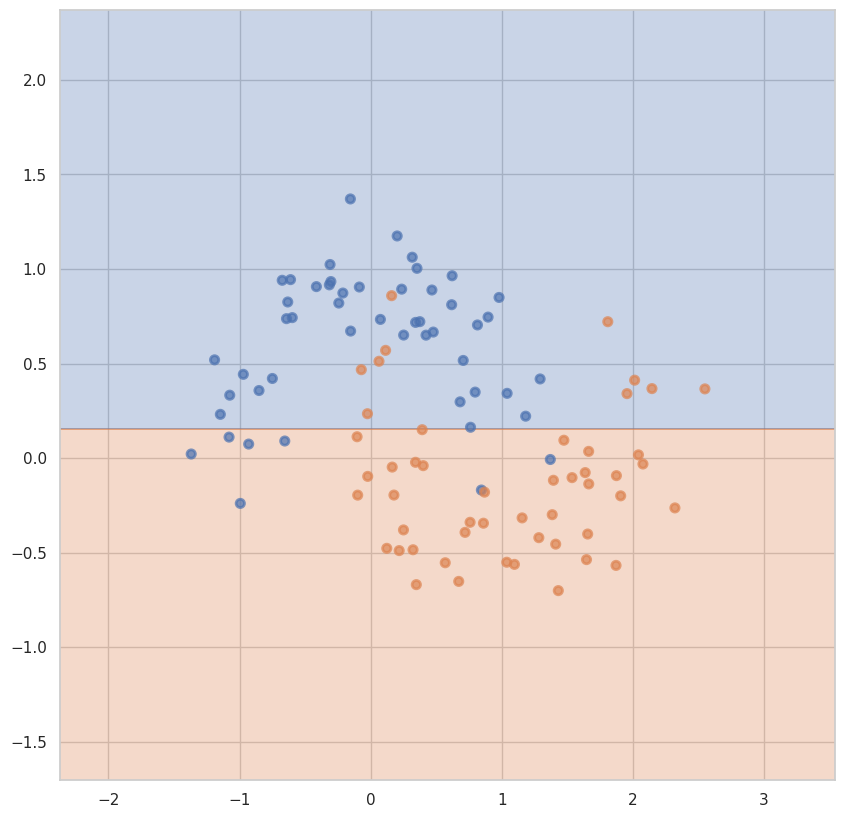

На обучающей для max_depth = 1 и min_samples_leaf = 9: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 9: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 10:


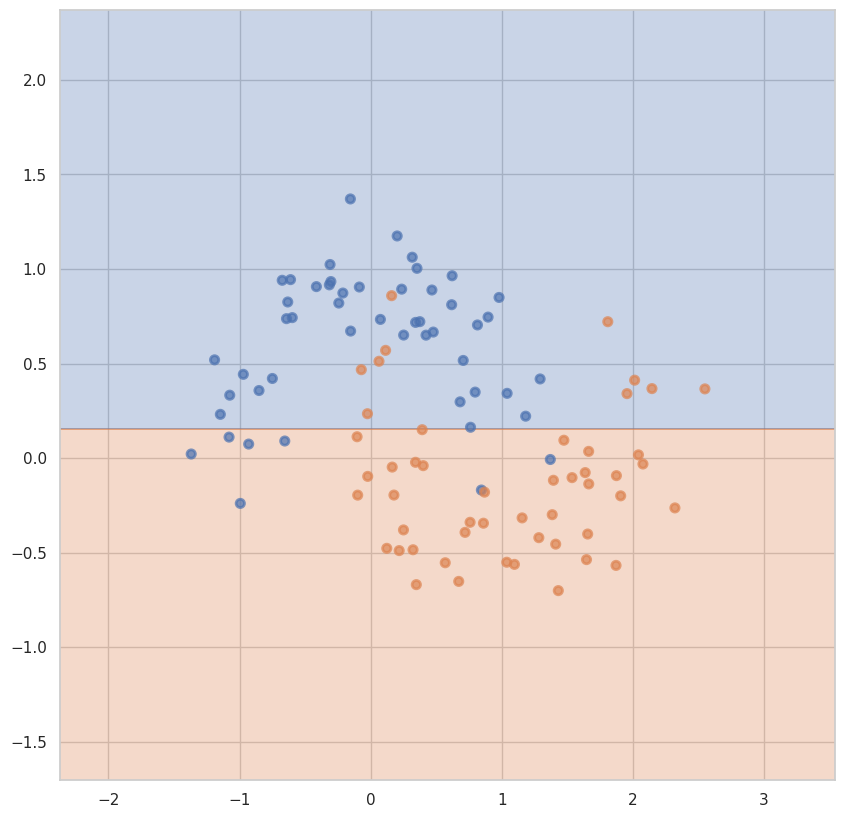

На обучающей для max_depth = 1 и min_samples_leaf = 10: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 10: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 11:


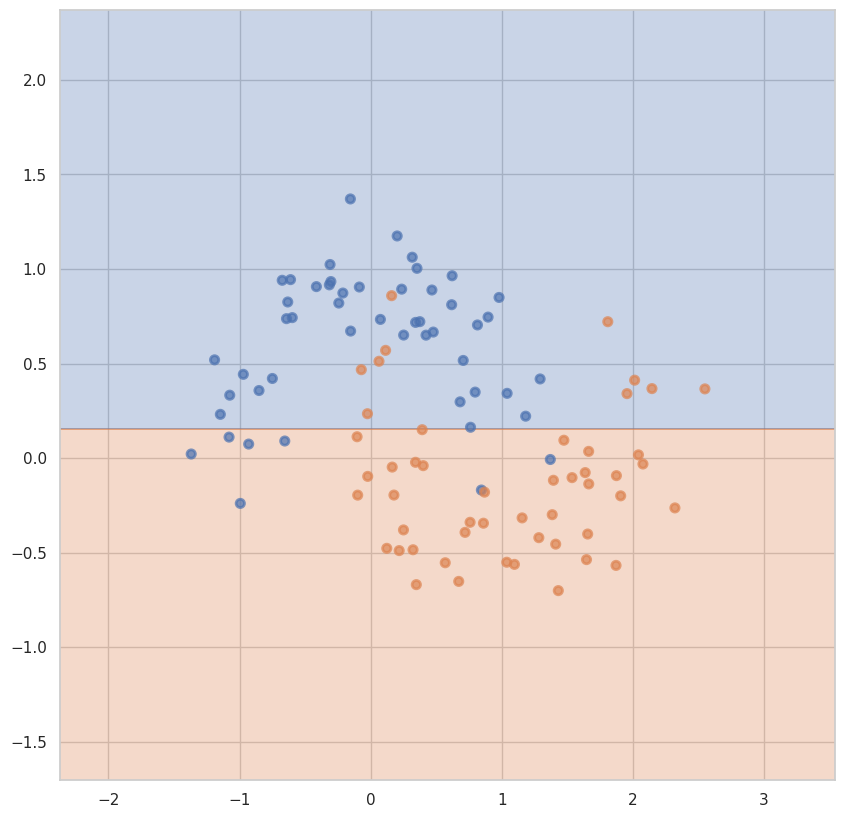

На обучающей для max_depth = 1 и min_samples_leaf = 11: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 11: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 12:


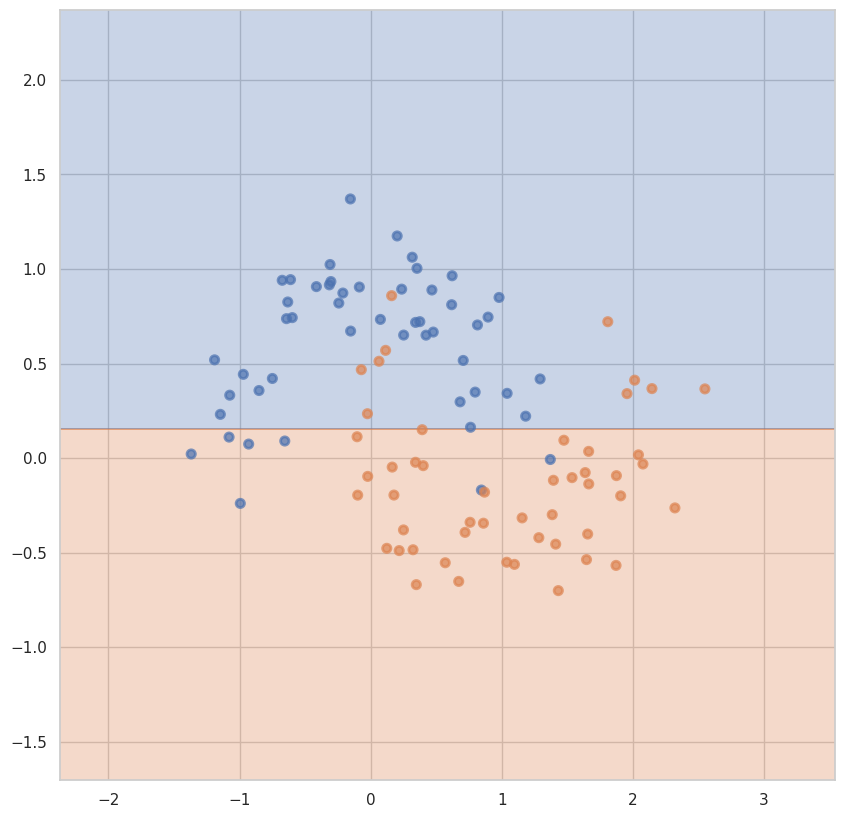

На обучающей для max_depth = 1 и min_samples_leaf = 12: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 12: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 13:


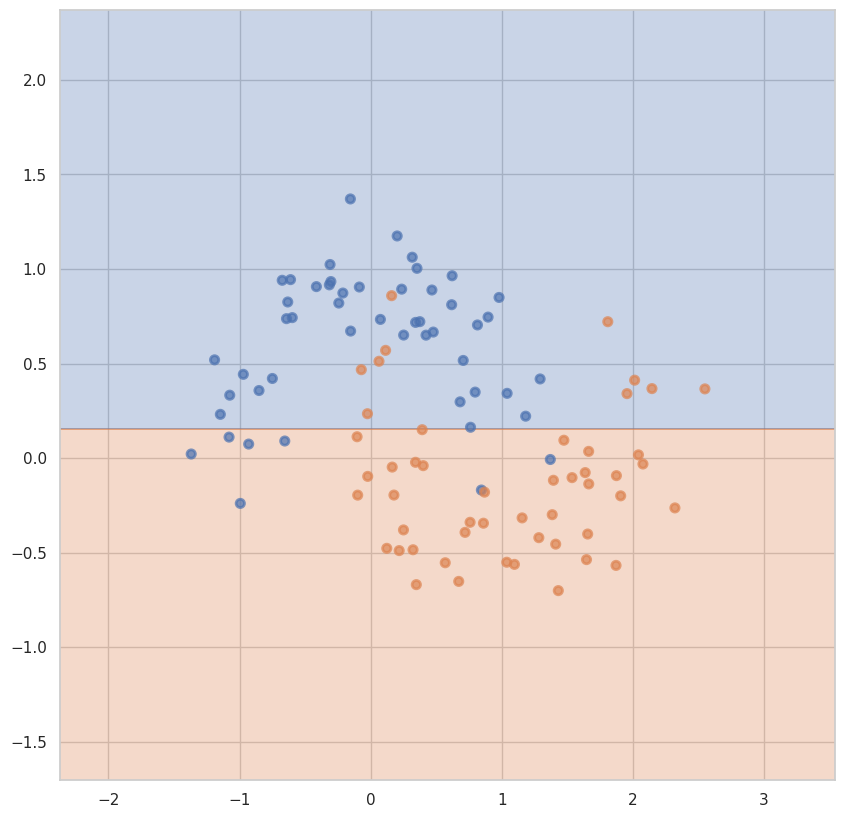

На обучающей для max_depth = 1 и min_samples_leaf = 13: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 13: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 14:


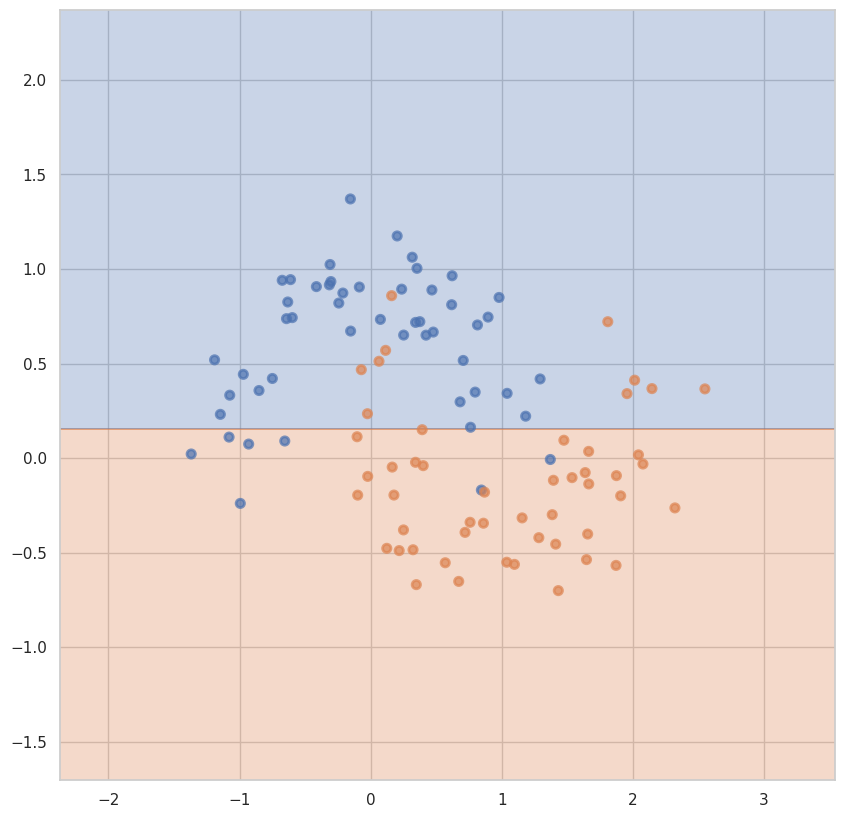

На обучающей для max_depth = 1 и min_samples_leaf = 14: 0.825
На тестовой для max_depth = 1 и min_samples_leaf = 14: 0.85
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 1:


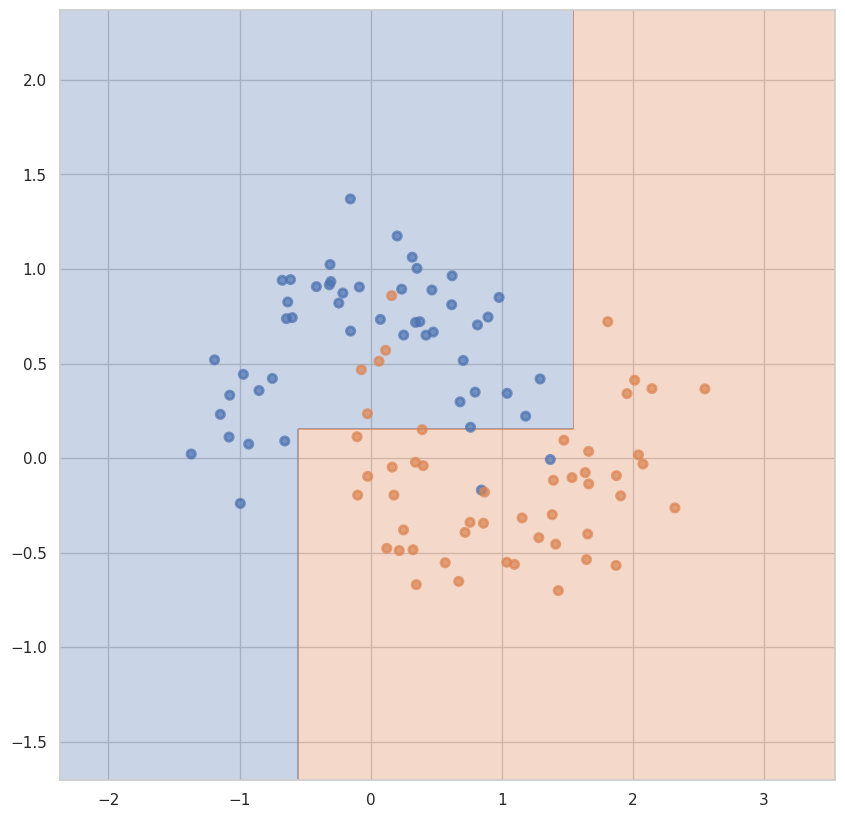

На обучающей для max_depth = 2 и min_samples_leaf = 1: 0.9125
На тестовой для max_depth = 2 и min_samples_leaf = 1: 1.0
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 2:


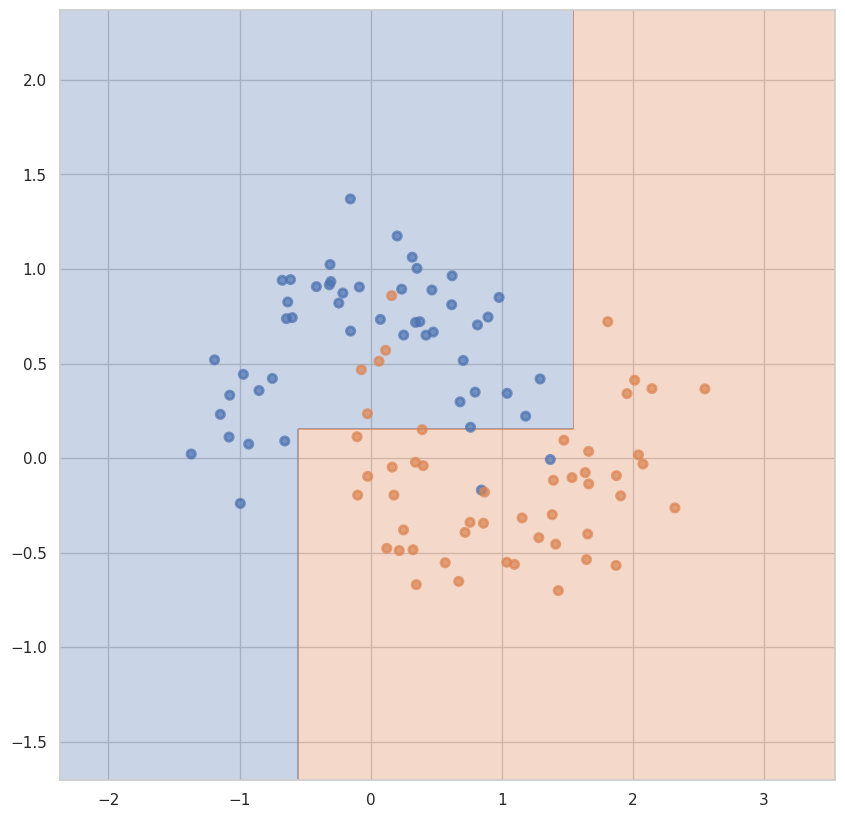

На обучающей для max_depth = 2 и min_samples_leaf = 2: 0.9125
На тестовой для max_depth = 2 и min_samples_leaf = 2: 1.0
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 3:


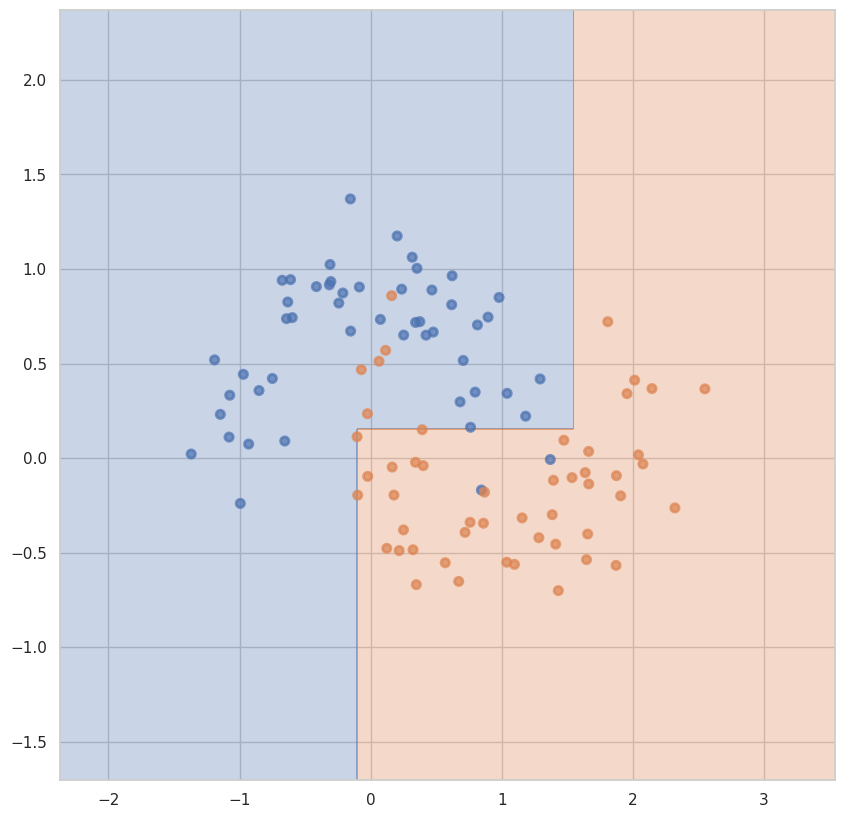

На обучающей для max_depth = 2 и min_samples_leaf = 3: 0.9
На тестовой для max_depth = 2 и min_samples_leaf = 3: 1.0
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 4:


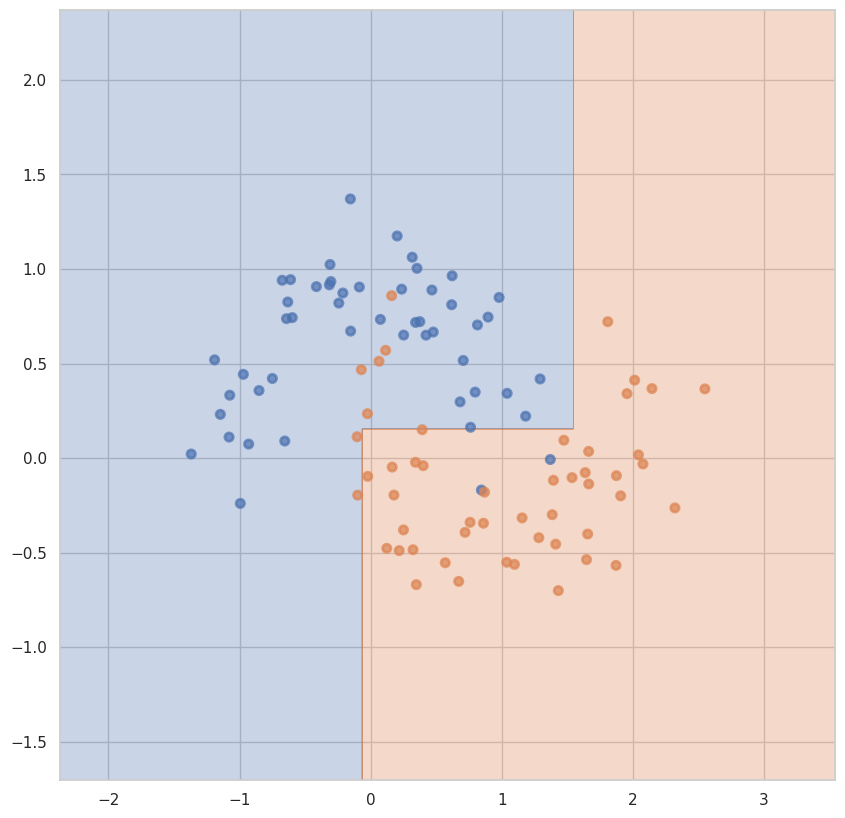

На обучающей для max_depth = 2 и min_samples_leaf = 4: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 4: 1.0
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 5:


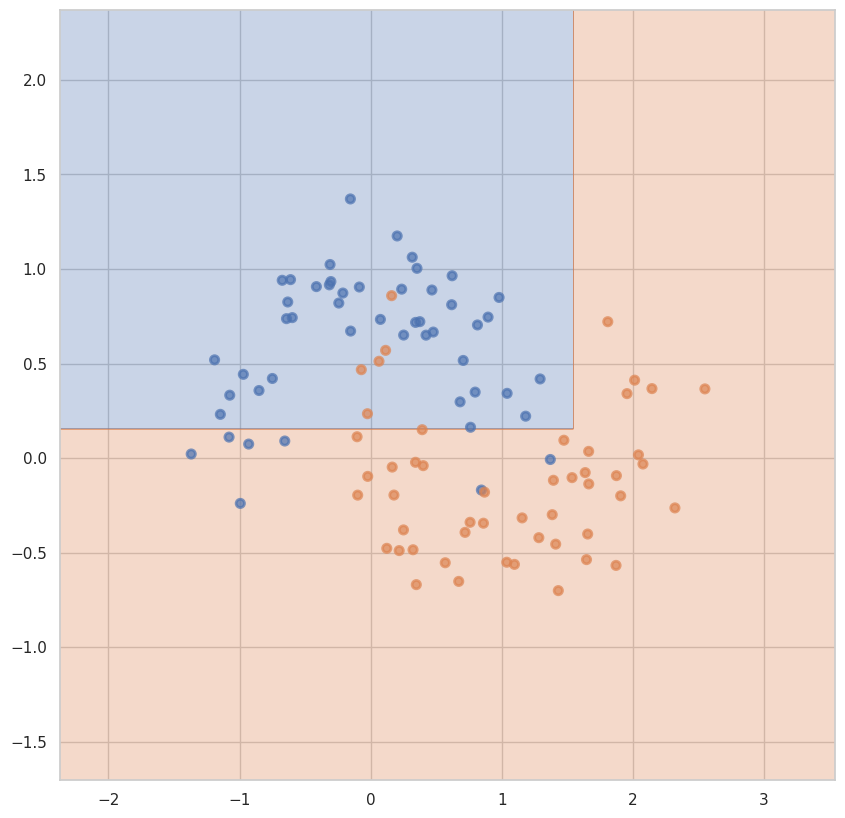

На обучающей для max_depth = 2 и min_samples_leaf = 5: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 5: 0.85
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 6:


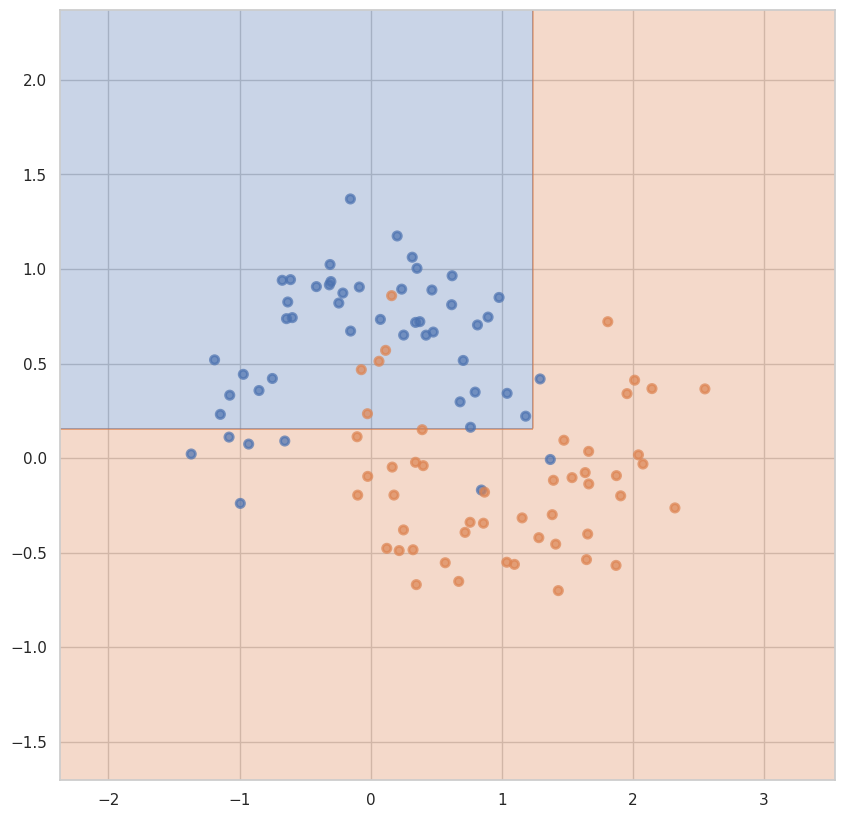

На обучающей для max_depth = 2 и min_samples_leaf = 6: 0.875
На тестовой для max_depth = 2 и min_samples_leaf = 6: 0.85
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 7:


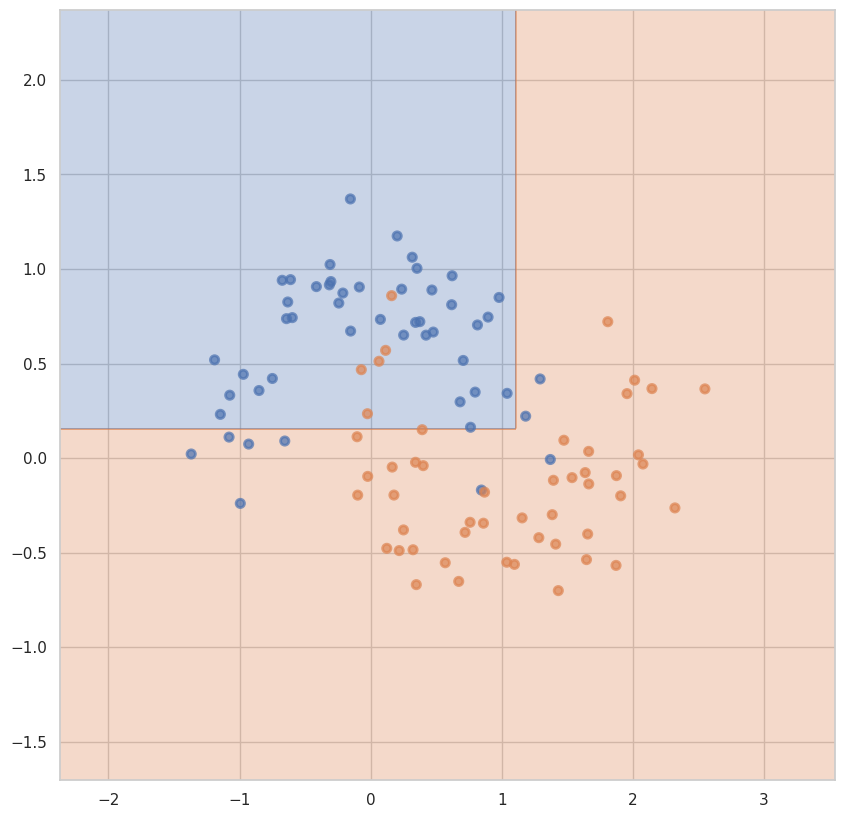

На обучающей для max_depth = 2 и min_samples_leaf = 7: 0.8625
На тестовой для max_depth = 2 и min_samples_leaf = 7: 0.85
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 8:


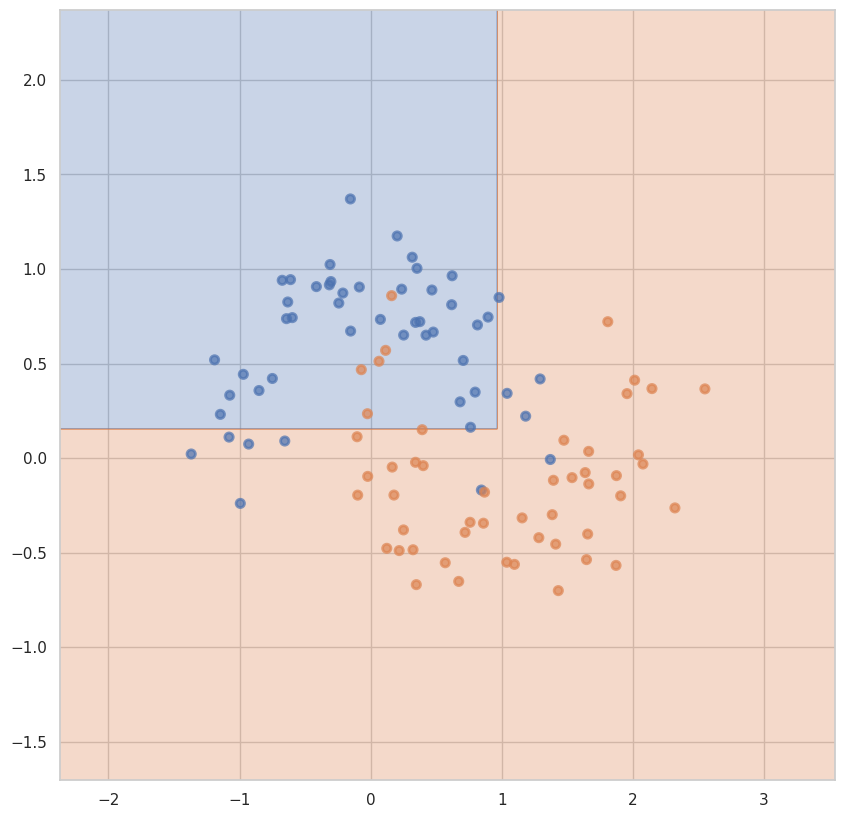

На обучающей для max_depth = 2 и min_samples_leaf = 8: 0.85
На тестовой для max_depth = 2 и min_samples_leaf = 8: 0.8
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 9:


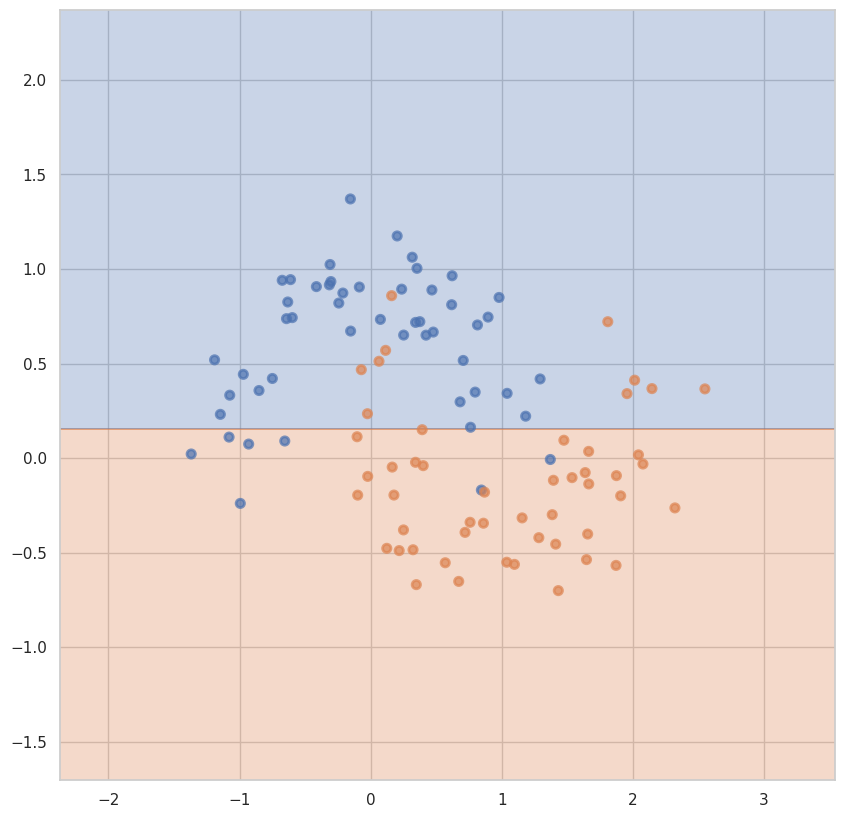

На обучающей для max_depth = 2 и min_samples_leaf = 9: 0.825
На тестовой для max_depth = 2 и min_samples_leaf = 9: 0.85
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 10:


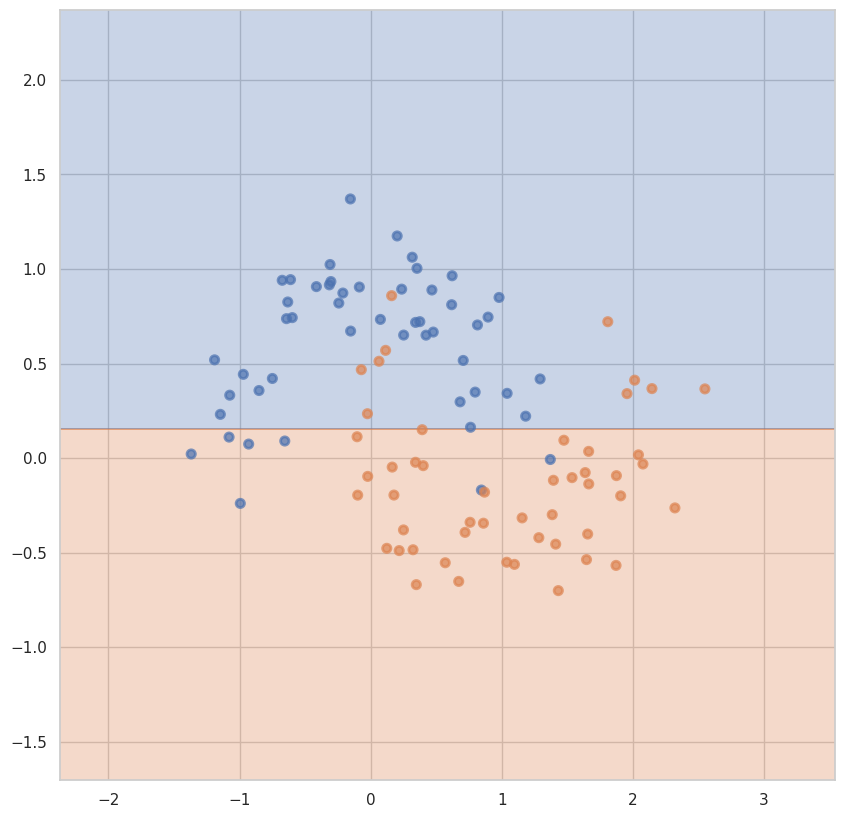

На обучающей для max_depth = 2 и min_samples_leaf = 10: 0.825
На тестовой для max_depth = 2 и min_samples_leaf = 10: 0.85
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 11:


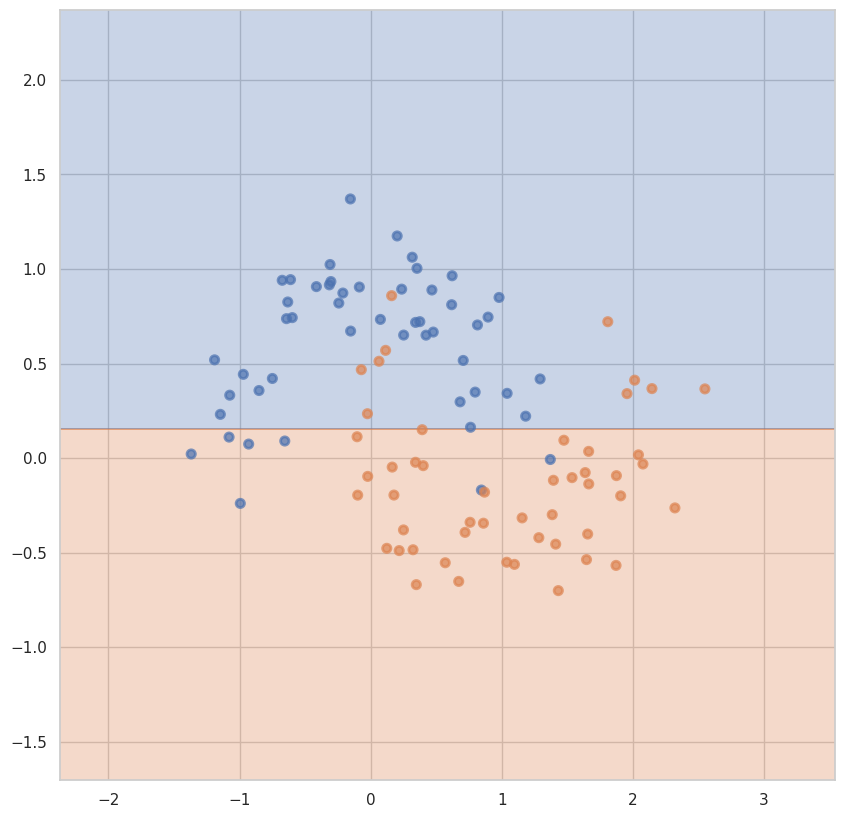

На обучающей для max_depth = 2 и min_samples_leaf = 11: 0.825
На тестовой для max_depth = 2 и min_samples_leaf = 11: 0.85
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 12:


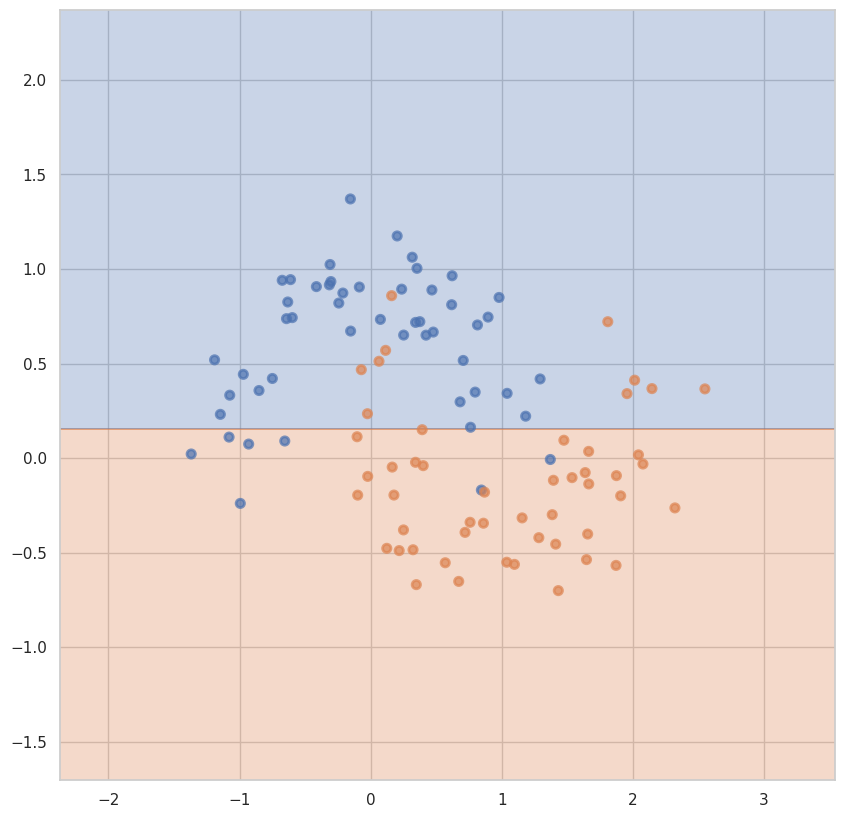

На обучающей для max_depth = 2 и min_samples_leaf = 12: 0.825
На тестовой для max_depth = 2 и min_samples_leaf = 12: 0.85
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 13:


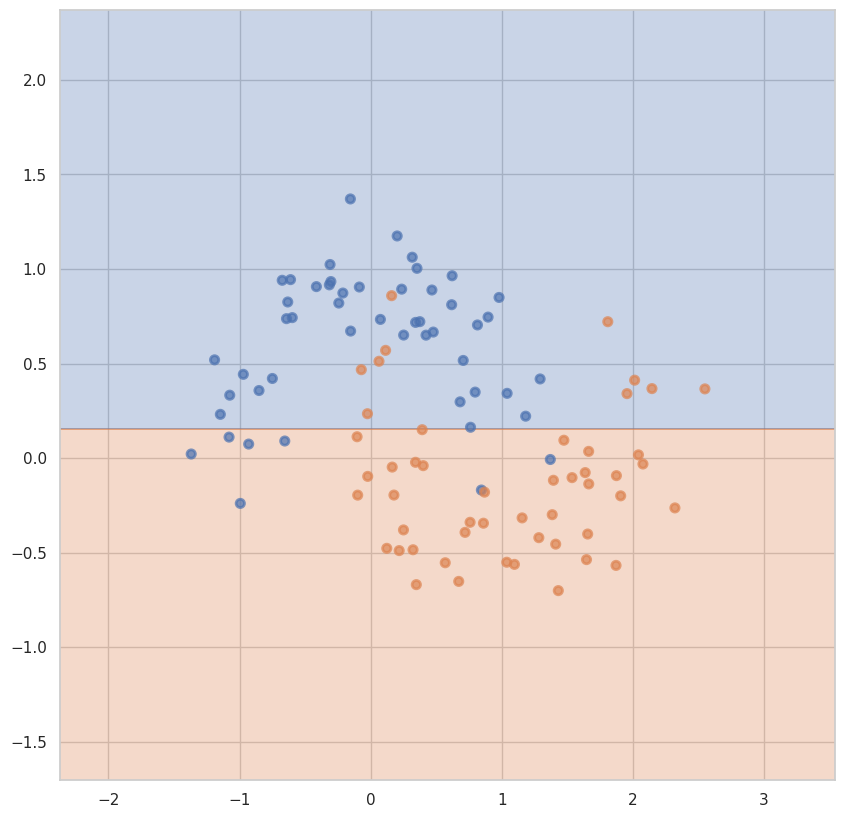

На обучающей для max_depth = 2 и min_samples_leaf = 13: 0.825
На тестовой для max_depth = 2 и min_samples_leaf = 13: 0.85
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 14:


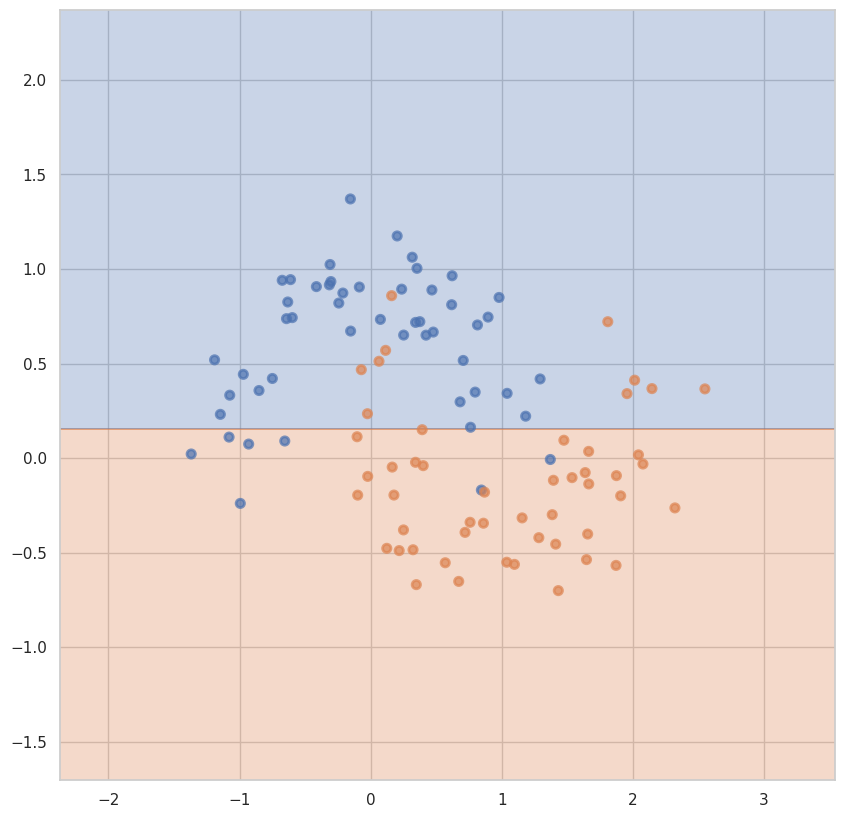

На обучающей для max_depth = 2 и min_samples_leaf = 14: 0.825
На тестовой для max_depth = 2 и min_samples_leaf = 14: 0.85
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 1:


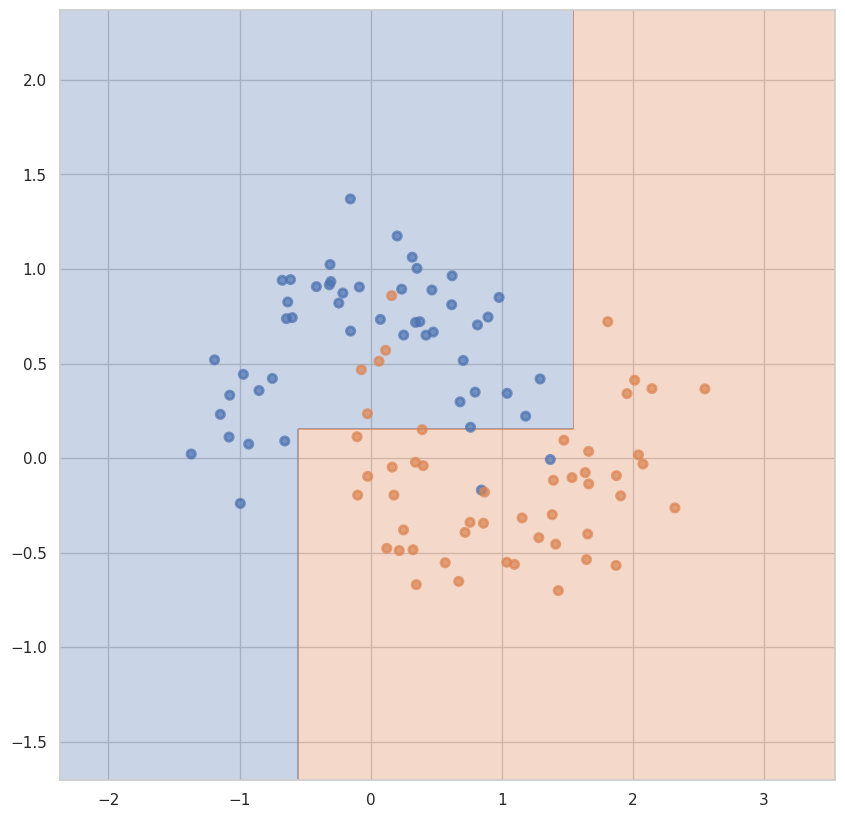

На обучающей для max_depth = 3 и min_samples_leaf = 1: 0.9125
На тестовой для max_depth = 3 и min_samples_leaf = 1: 1.0
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 2:


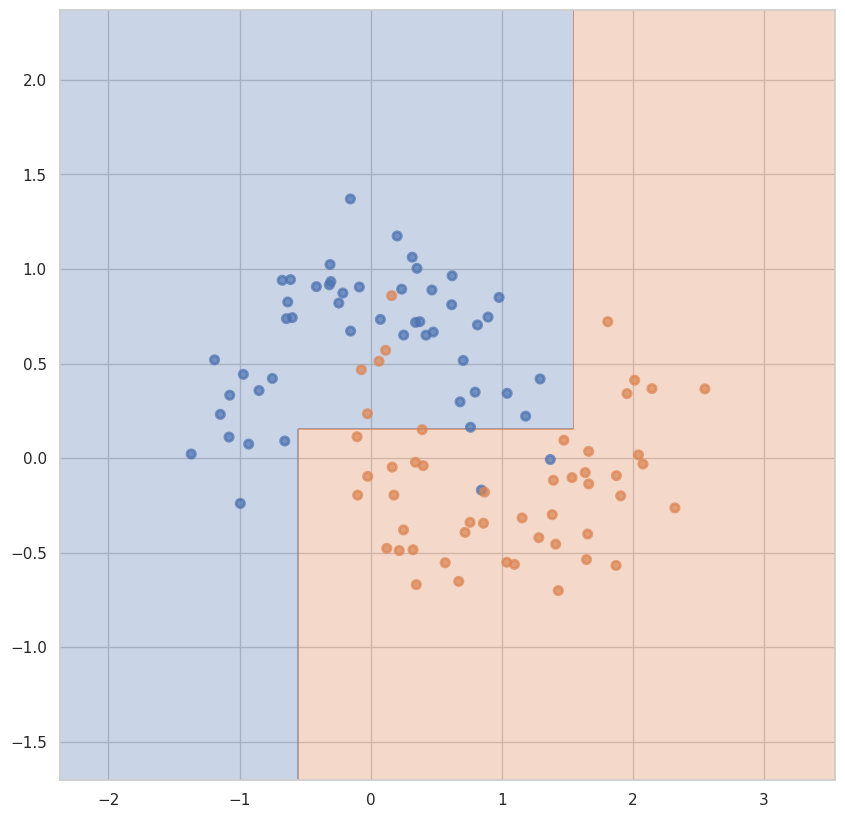

На обучающей для max_depth = 3 и min_samples_leaf = 2: 0.9125
На тестовой для max_depth = 3 и min_samples_leaf = 2: 1.0
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 3:


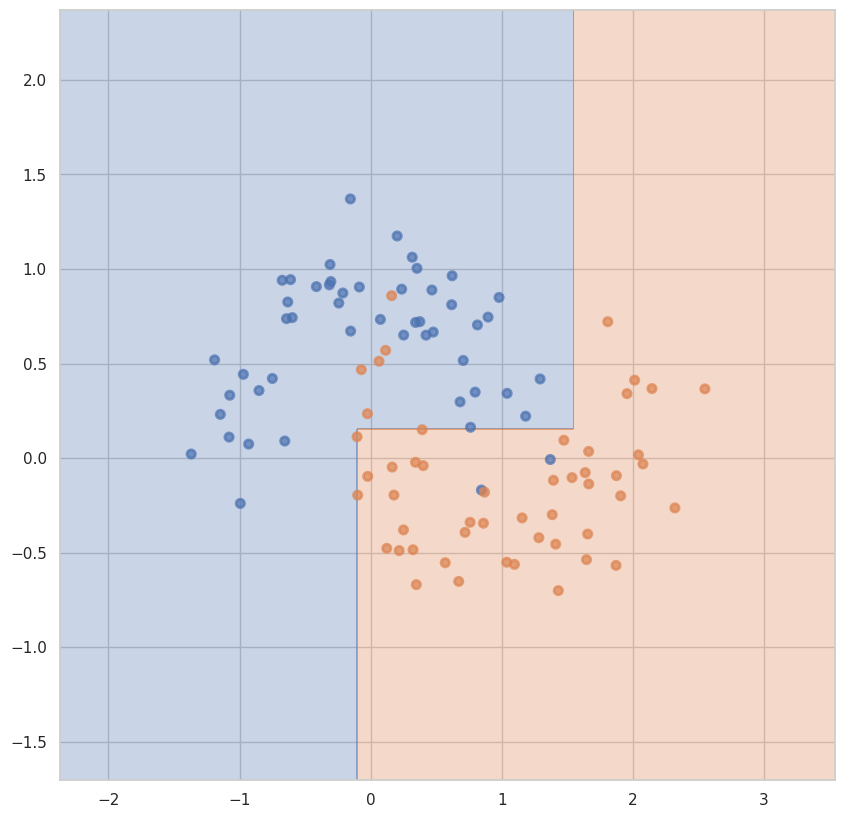

На обучающей для max_depth = 3 и min_samples_leaf = 3: 0.9
На тестовой для max_depth = 3 и min_samples_leaf = 3: 1.0
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 4:


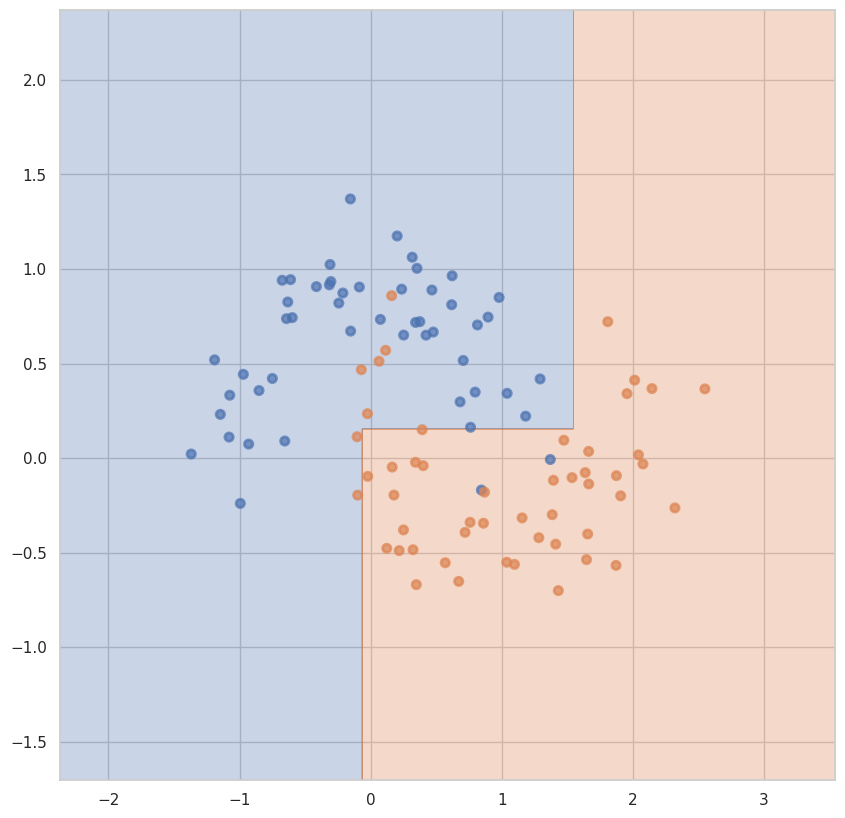

На обучающей для max_depth = 3 и min_samples_leaf = 4: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 4: 1.0
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 5:


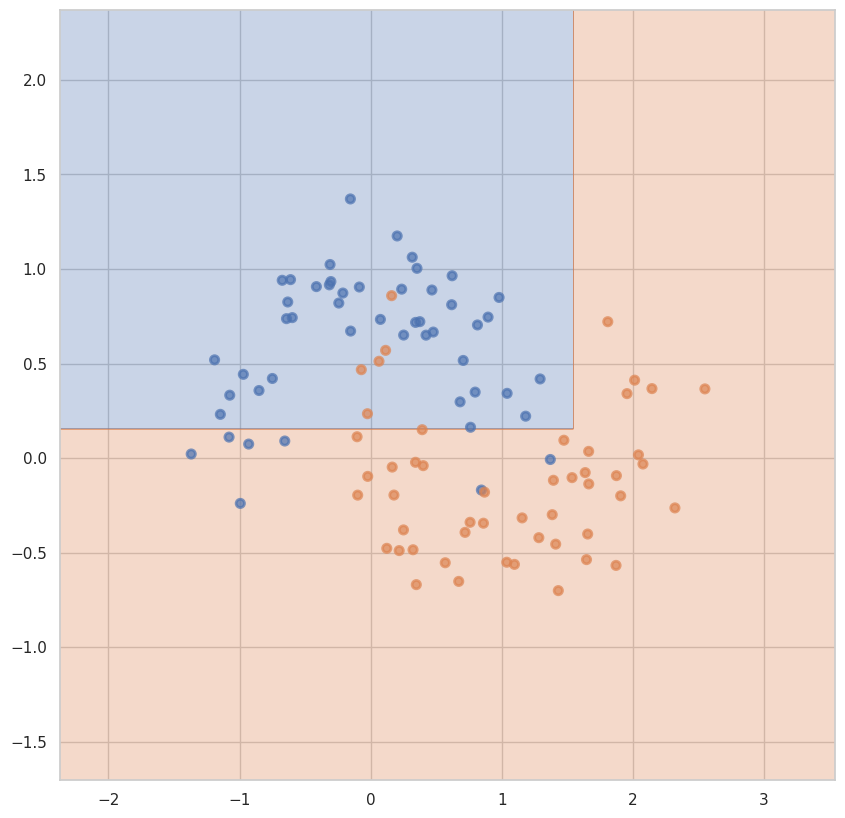

На обучающей для max_depth = 3 и min_samples_leaf = 5: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 5: 0.85
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 6:


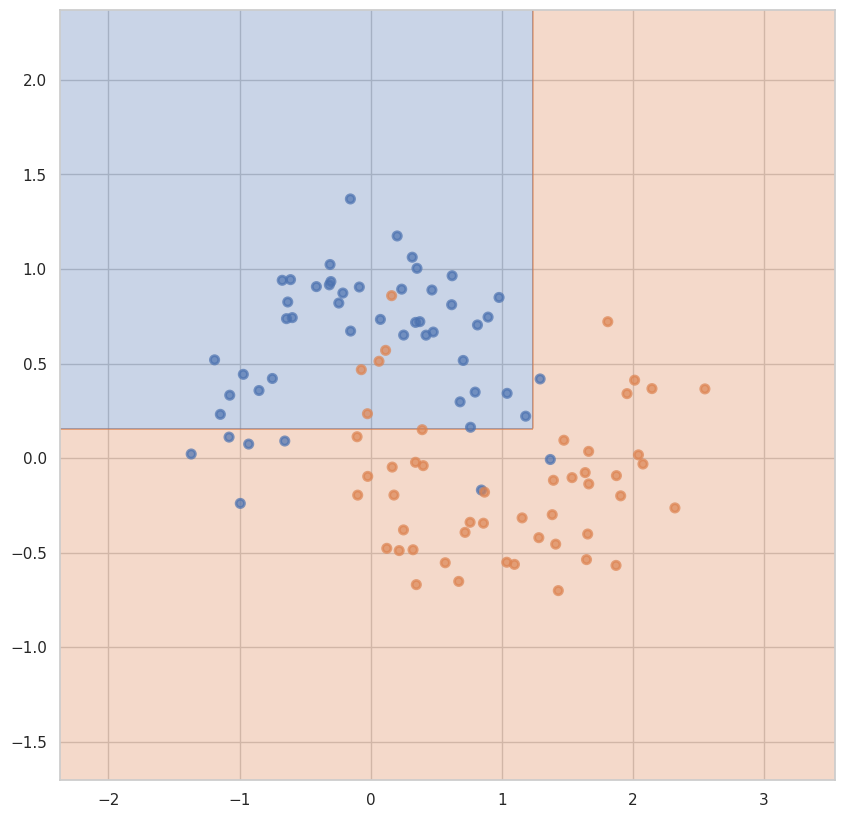

На обучающей для max_depth = 3 и min_samples_leaf = 6: 0.875
На тестовой для max_depth = 3 и min_samples_leaf = 6: 0.85
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 7:


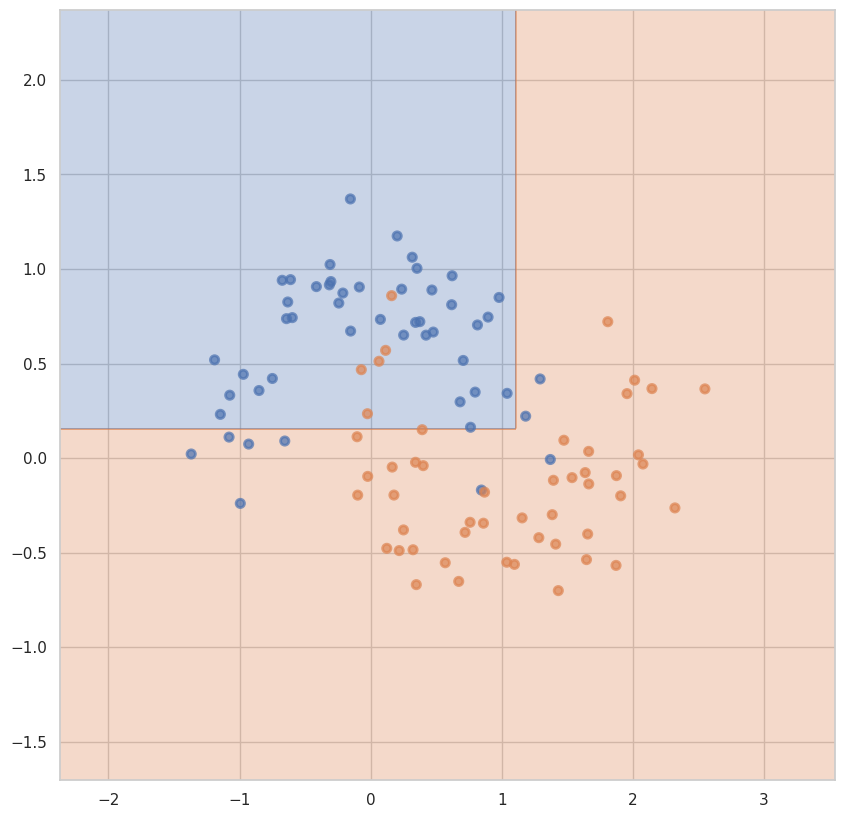

На обучающей для max_depth = 3 и min_samples_leaf = 7: 0.8625
На тестовой для max_depth = 3 и min_samples_leaf = 7: 0.85
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 8:


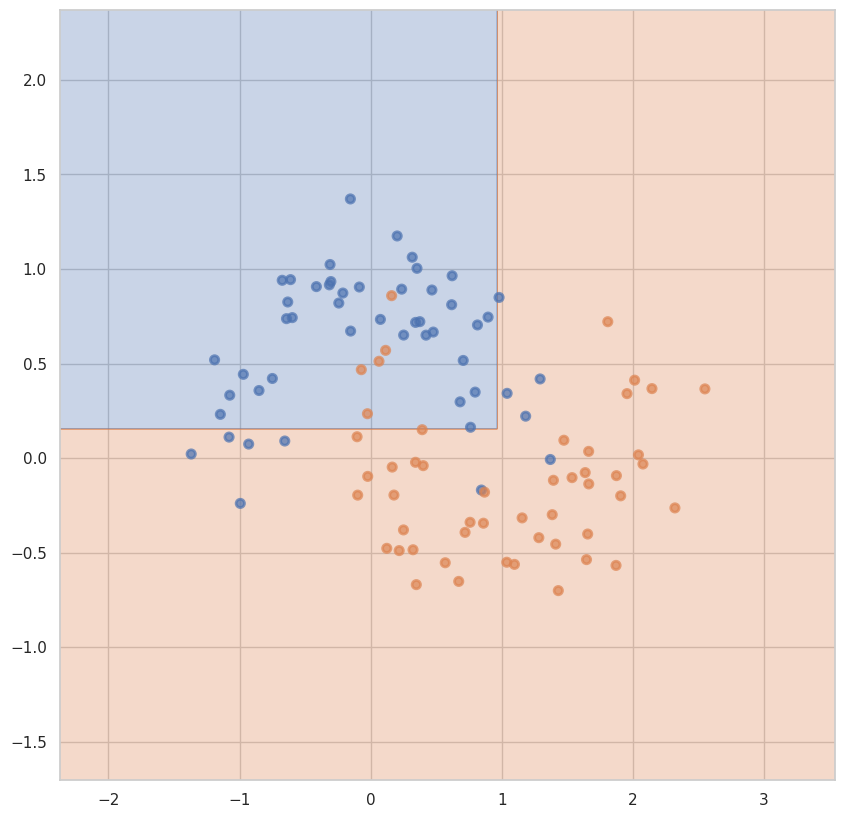

На обучающей для max_depth = 3 и min_samples_leaf = 8: 0.85
На тестовой для max_depth = 3 и min_samples_leaf = 8: 0.8
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 9:


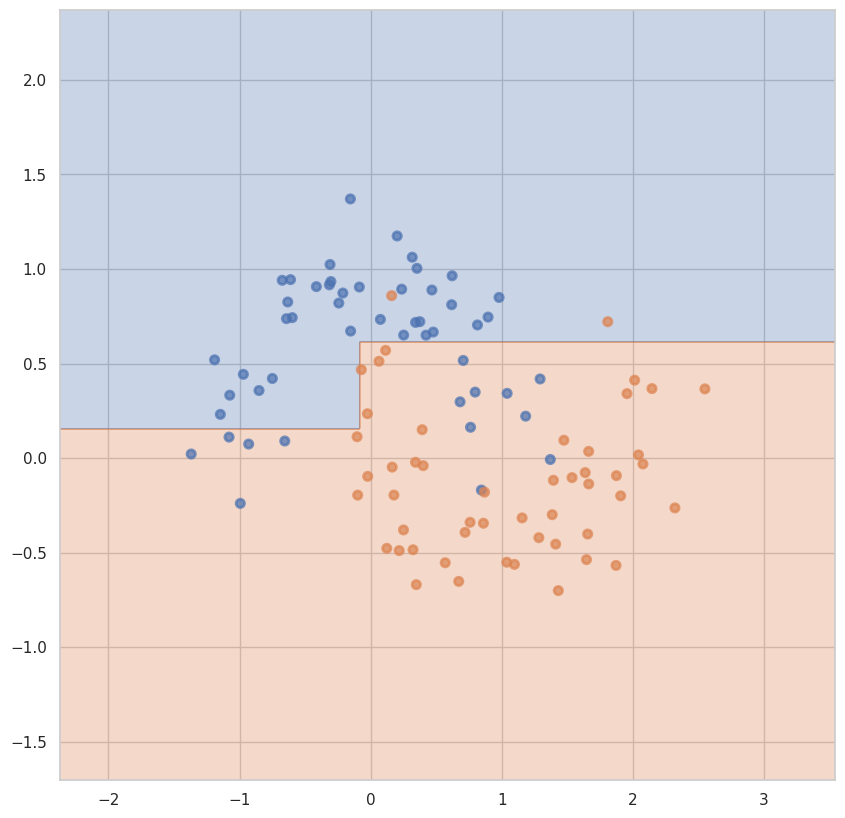

На обучающей для max_depth = 3 и min_samples_leaf = 9: 0.8375
На тестовой для max_depth = 3 и min_samples_leaf = 9: 0.85
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 10:


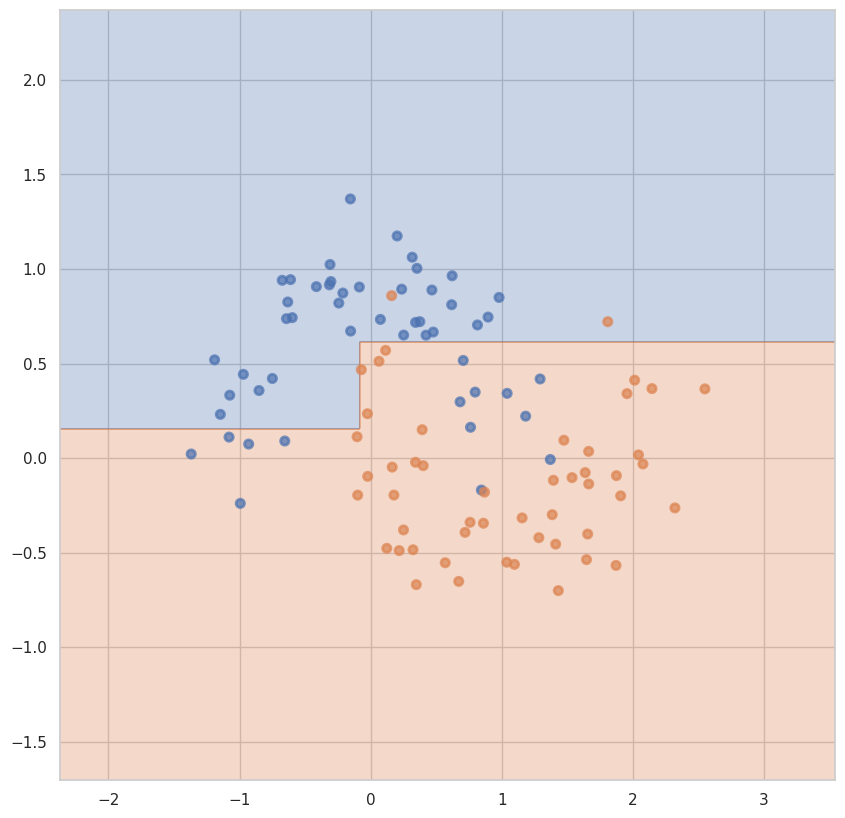

На обучающей для max_depth = 3 и min_samples_leaf = 10: 0.8375
На тестовой для max_depth = 3 и min_samples_leaf = 10: 0.85
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 11:


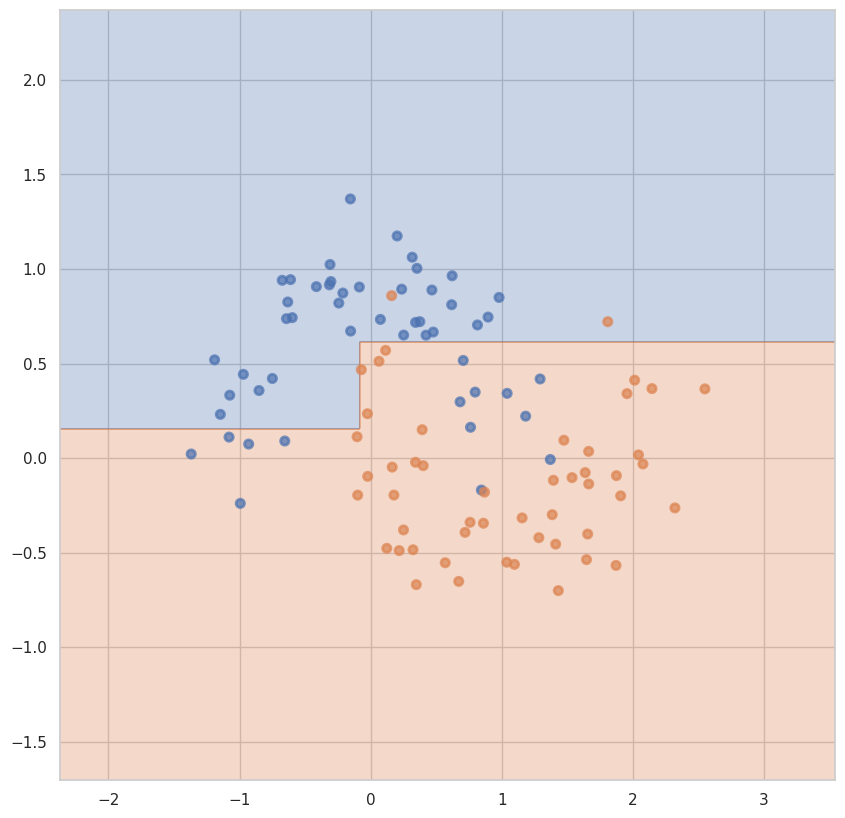

На обучающей для max_depth = 3 и min_samples_leaf = 11: 0.8375
На тестовой для max_depth = 3 и min_samples_leaf = 11: 0.85
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 12:


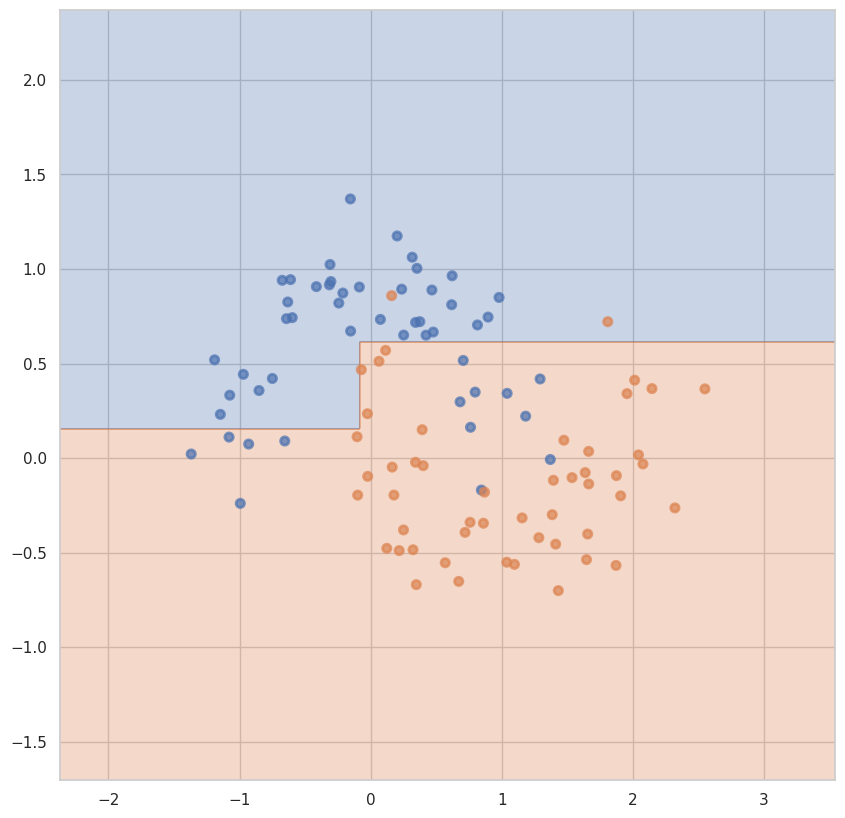

На обучающей для max_depth = 3 и min_samples_leaf = 12: 0.8375
На тестовой для max_depth = 3 и min_samples_leaf = 12: 0.85
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 13:


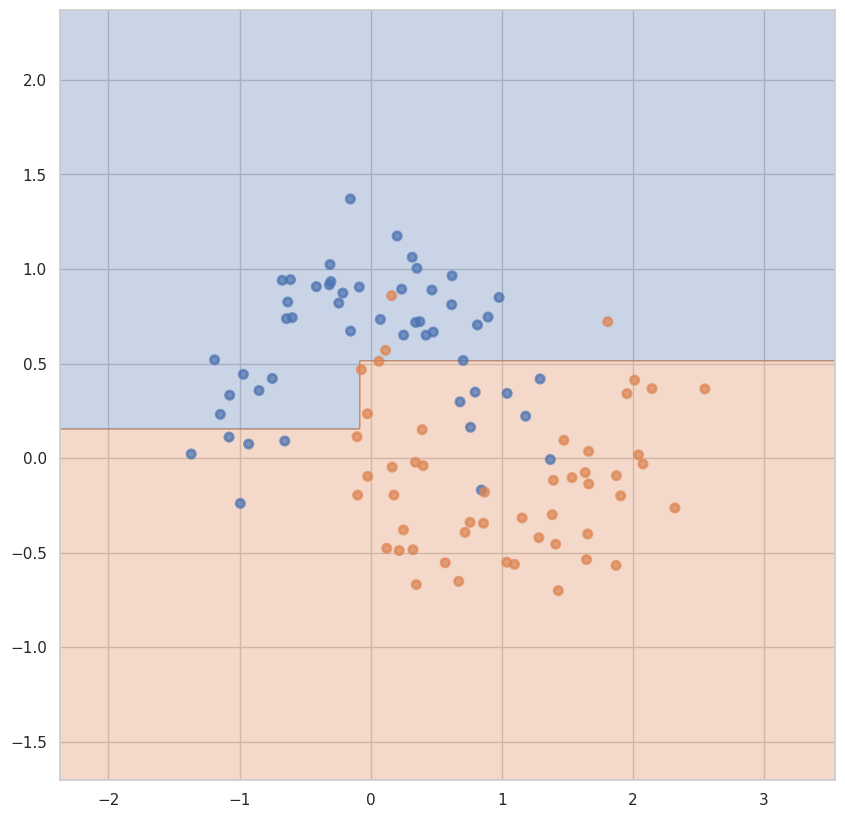

На обучающей для max_depth = 3 и min_samples_leaf = 13: 0.8375
На тестовой для max_depth = 3 и min_samples_leaf = 13: 0.85
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 14:


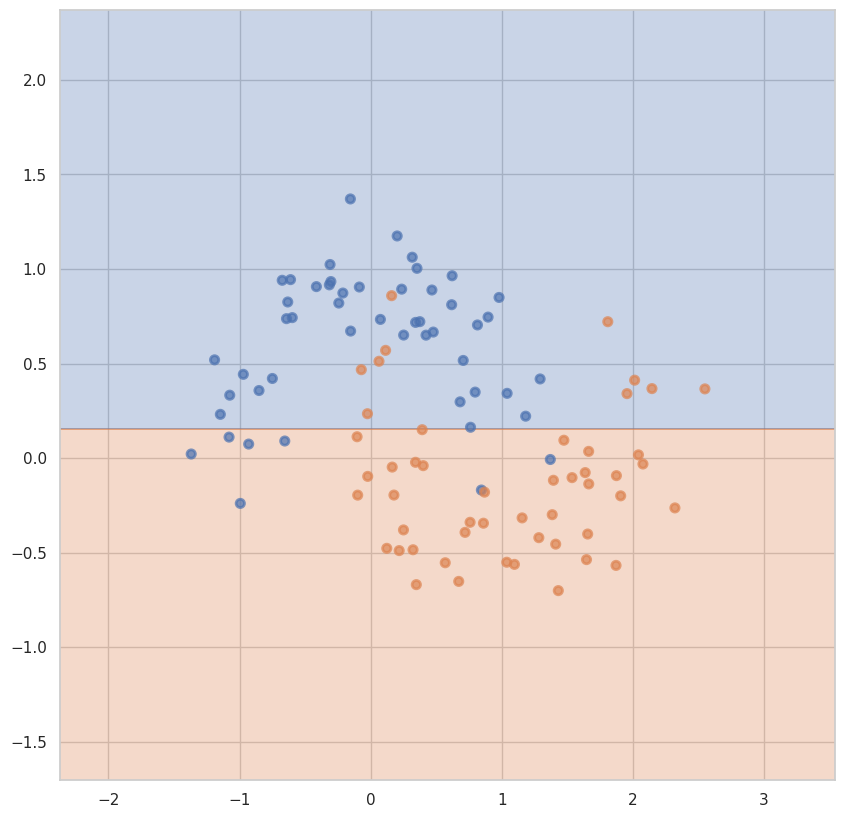

На обучающей для max_depth = 3 и min_samples_leaf = 14: 0.825
На тестовой для max_depth = 3 и min_samples_leaf = 14: 0.85
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 1:


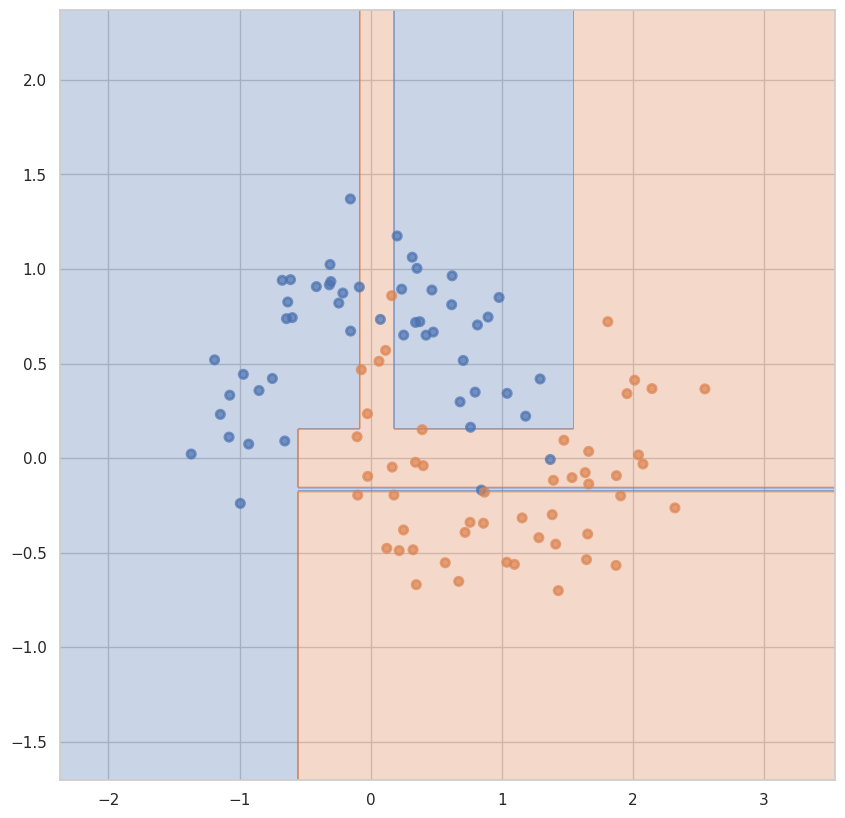

На обучающей для max_depth = 4 и min_samples_leaf = 1: 0.9875
На тестовой для max_depth = 4 и min_samples_leaf = 1: 0.95
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 2:


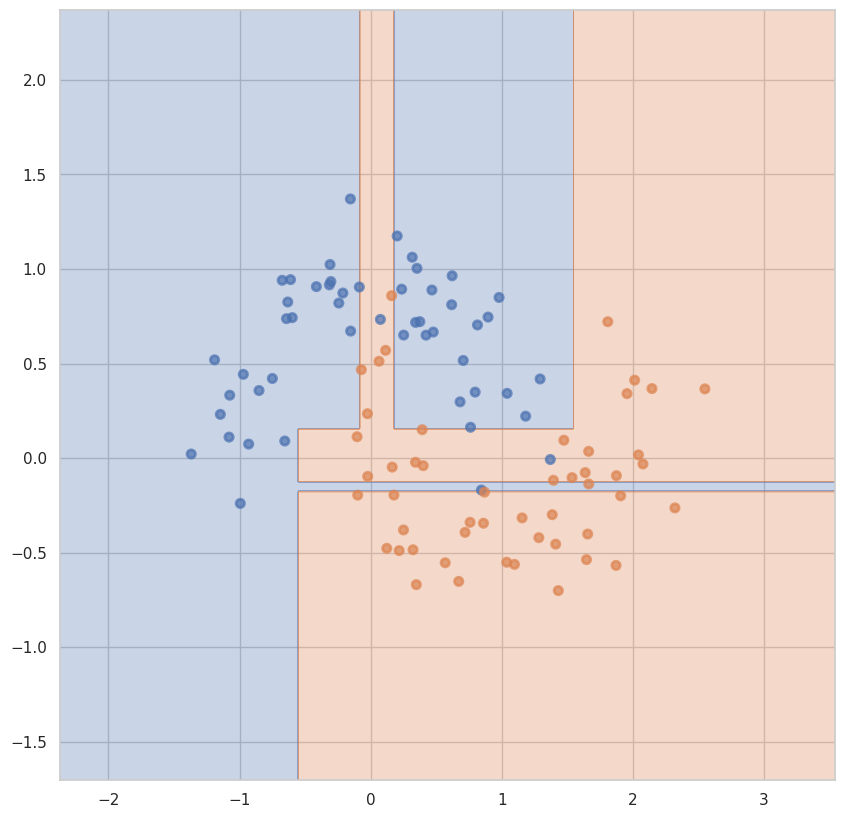

На обучающей для max_depth = 4 и min_samples_leaf = 2: 0.975
На тестовой для max_depth = 4 и min_samples_leaf = 2: 0.95
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 3:


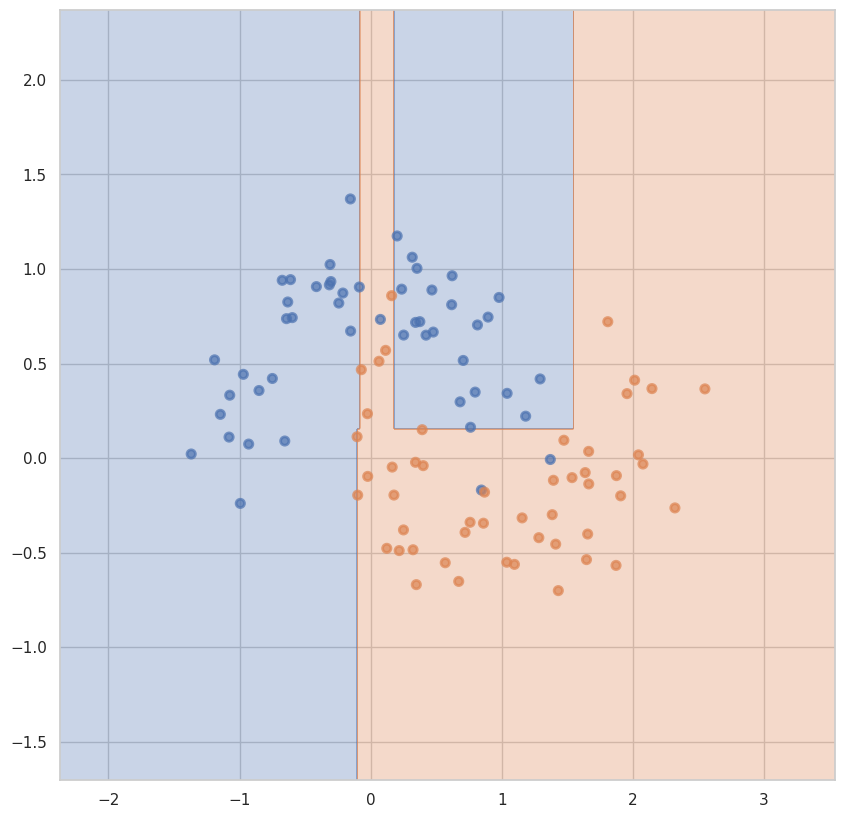

На обучающей для max_depth = 4 и min_samples_leaf = 3: 0.9625
На тестовой для max_depth = 4 и min_samples_leaf = 3: 0.95
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 4:


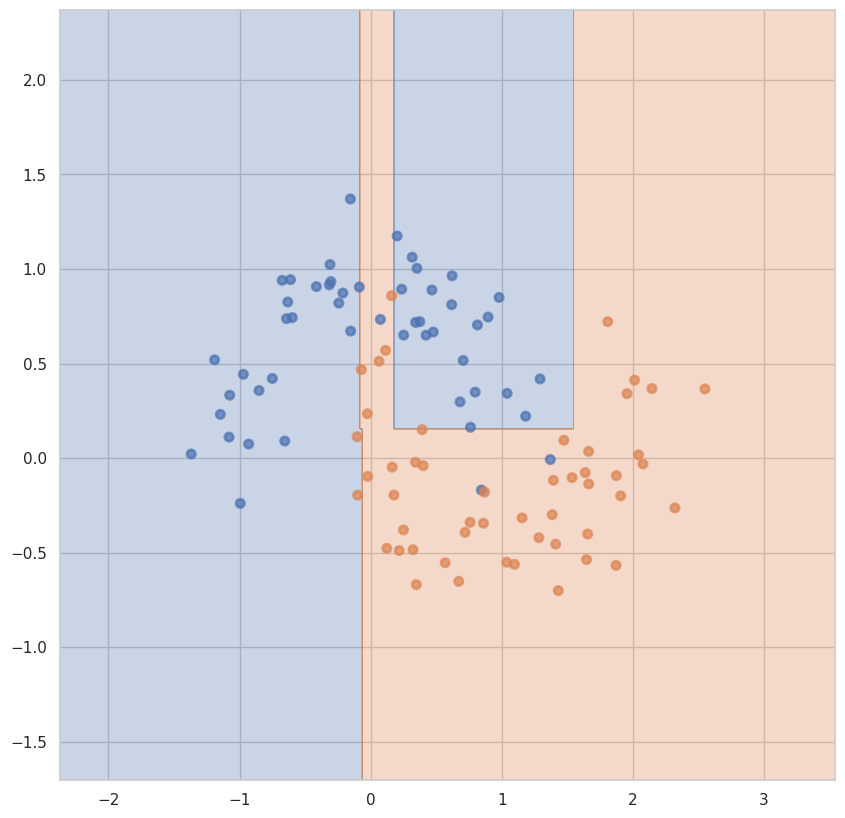

На обучающей для max_depth = 4 и min_samples_leaf = 4: 0.95
На тестовой для max_depth = 4 и min_samples_leaf = 4: 0.95
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 5:


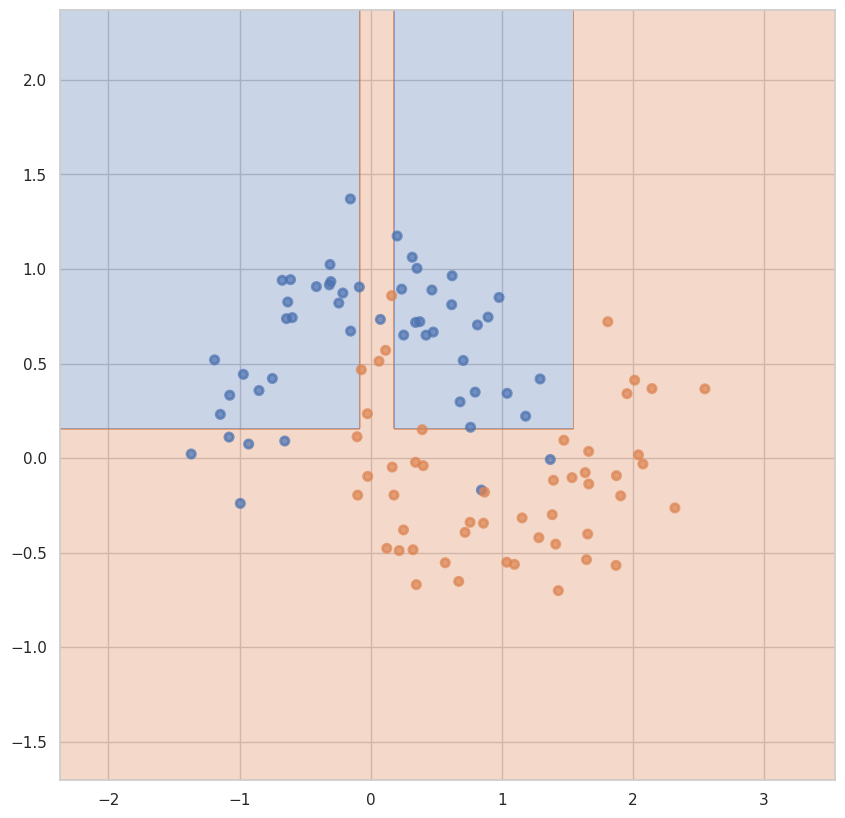

На обучающей для max_depth = 4 и min_samples_leaf = 5: 0.95
На тестовой для max_depth = 4 и min_samples_leaf = 5: 0.8
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 6:


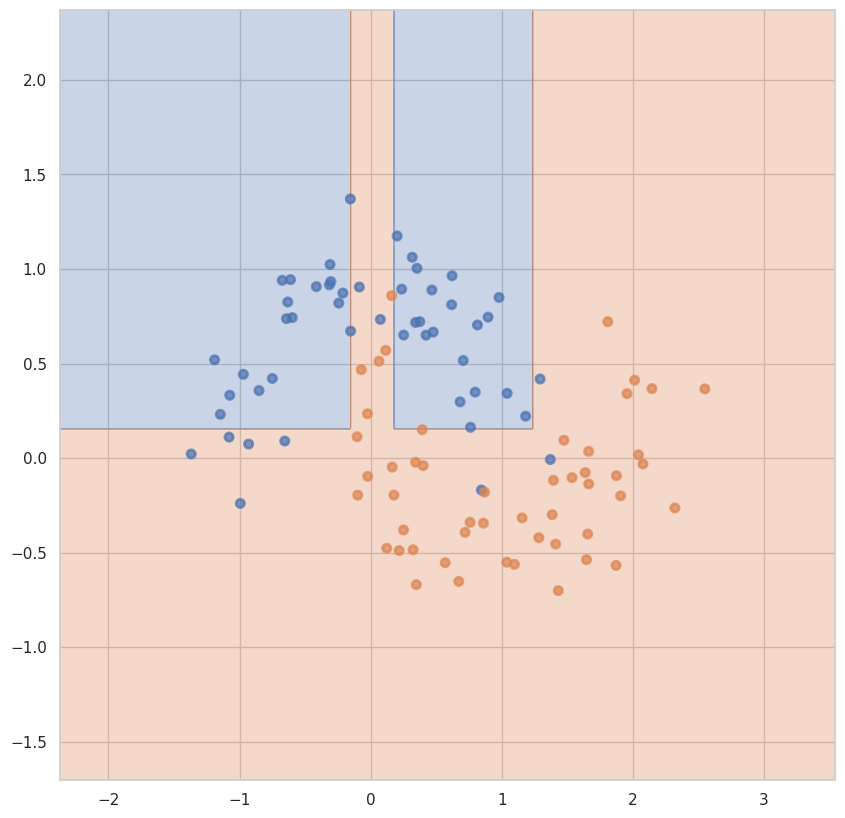

На обучающей для max_depth = 4 и min_samples_leaf = 6: 0.925
На тестовой для max_depth = 4 и min_samples_leaf = 6: 0.8
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 7:


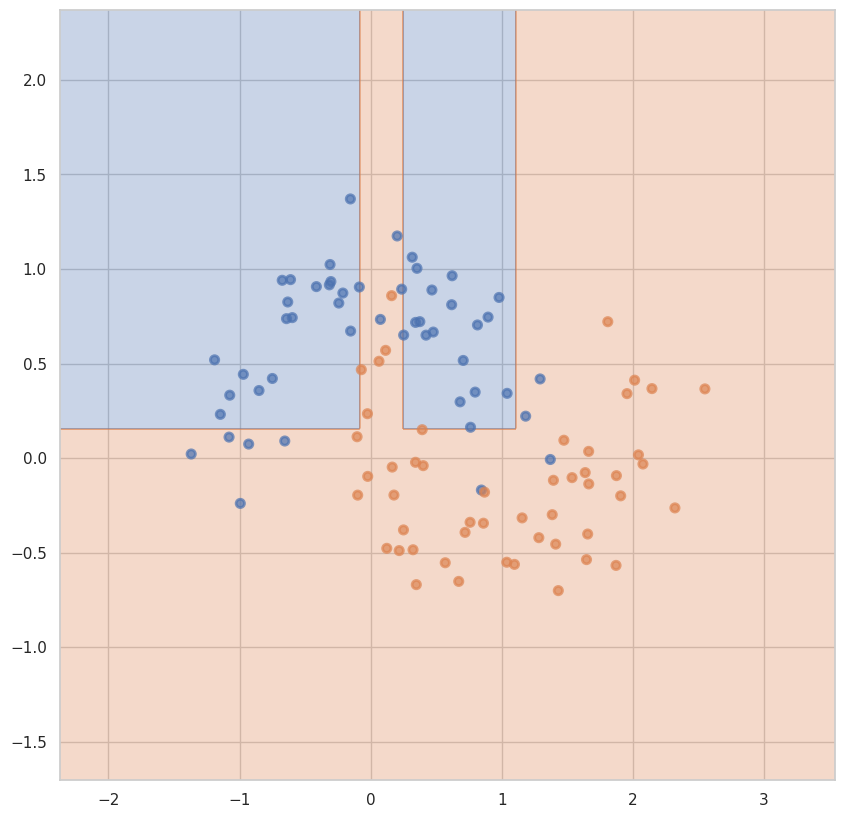

На обучающей для max_depth = 4 и min_samples_leaf = 7: 0.9
На тестовой для max_depth = 4 и min_samples_leaf = 7: 0.8
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 8:


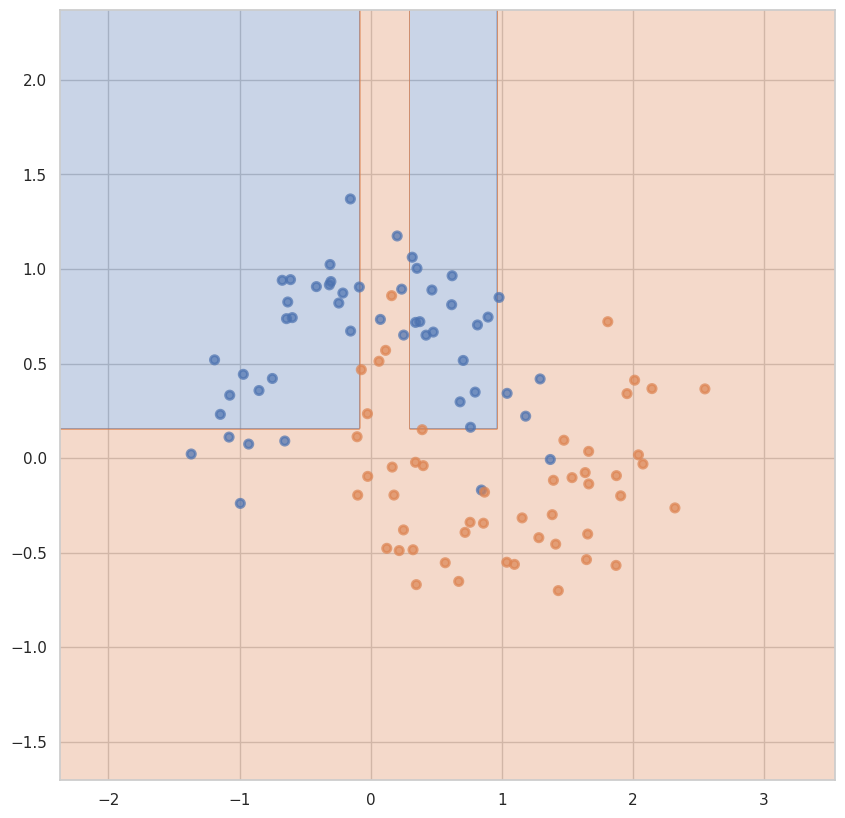

На обучающей для max_depth = 4 и min_samples_leaf = 8: 0.875
На тестовой для max_depth = 4 и min_samples_leaf = 8: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 9:


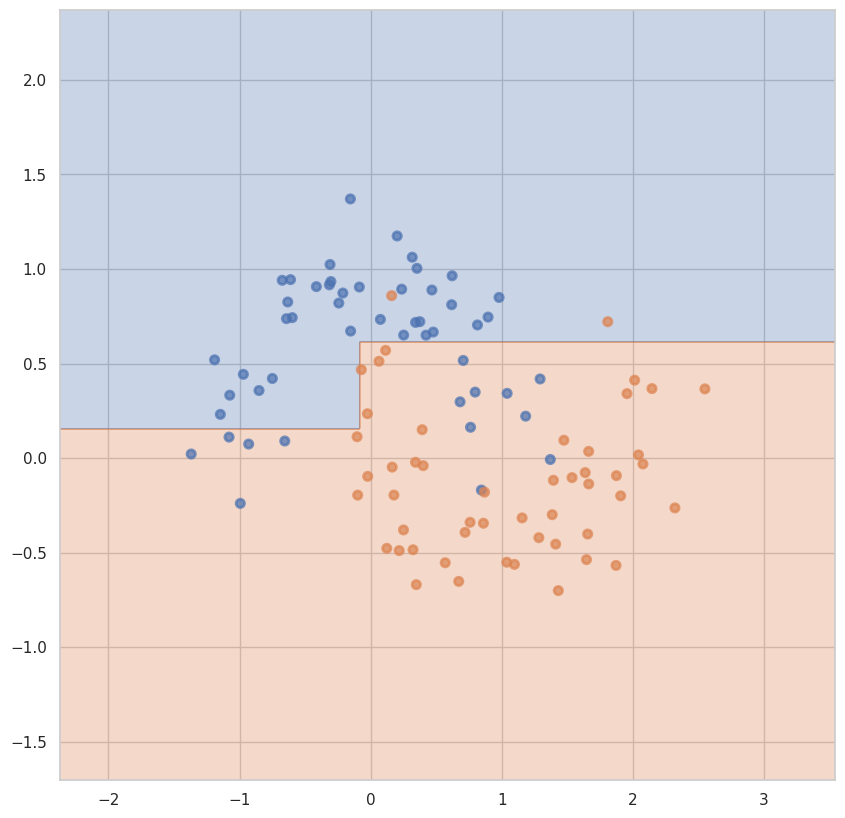

На обучающей для max_depth = 4 и min_samples_leaf = 9: 0.8375
На тестовой для max_depth = 4 и min_samples_leaf = 9: 0.85
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 10:


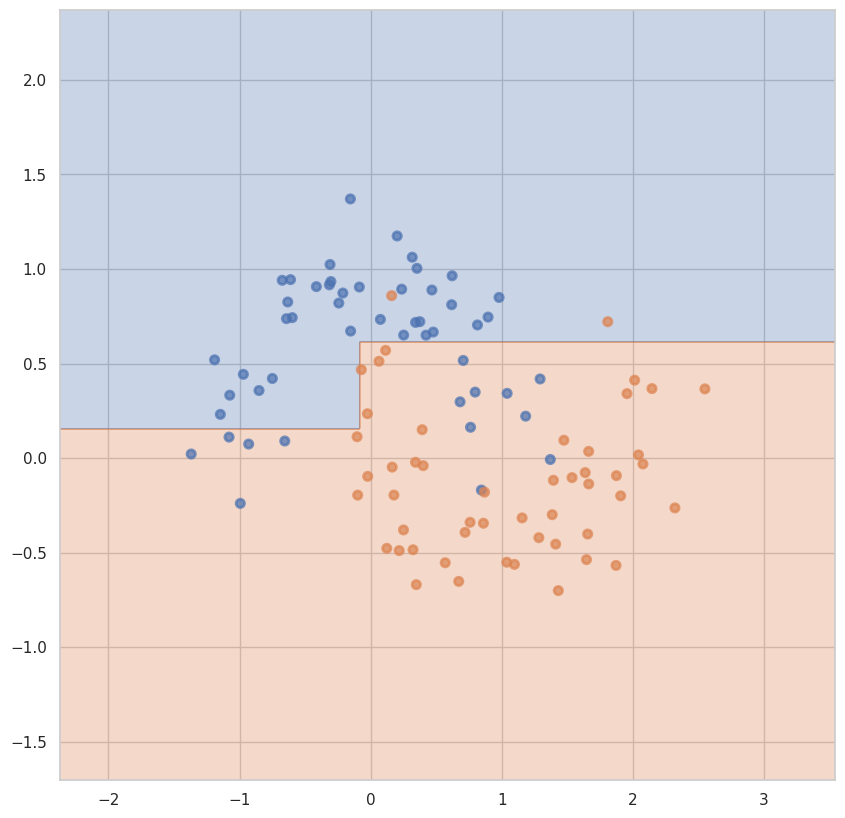

На обучающей для max_depth = 4 и min_samples_leaf = 10: 0.8375
На тестовой для max_depth = 4 и min_samples_leaf = 10: 0.85
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 11:


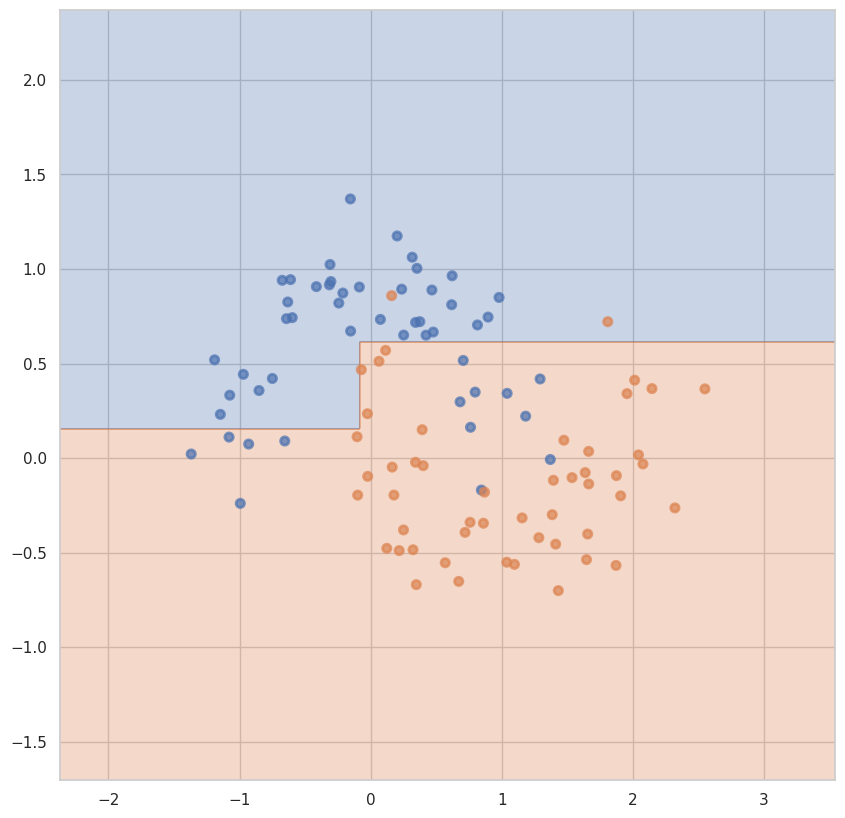

На обучающей для max_depth = 4 и min_samples_leaf = 11: 0.8375
На тестовой для max_depth = 4 и min_samples_leaf = 11: 0.85
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 12:


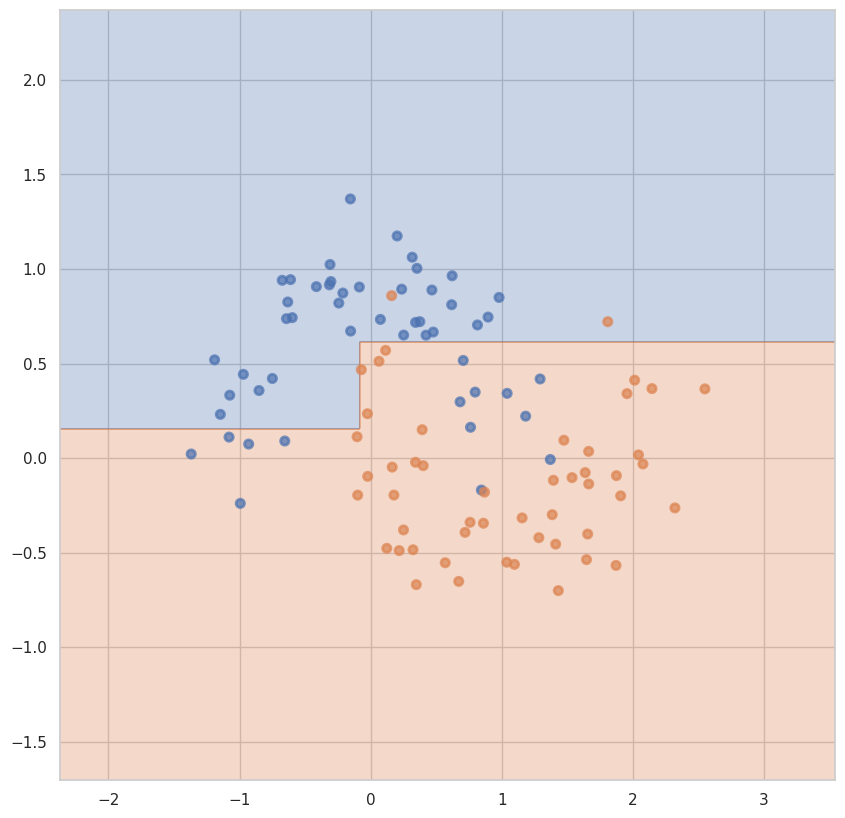

На обучающей для max_depth = 4 и min_samples_leaf = 12: 0.8375
На тестовой для max_depth = 4 и min_samples_leaf = 12: 0.85
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 13:


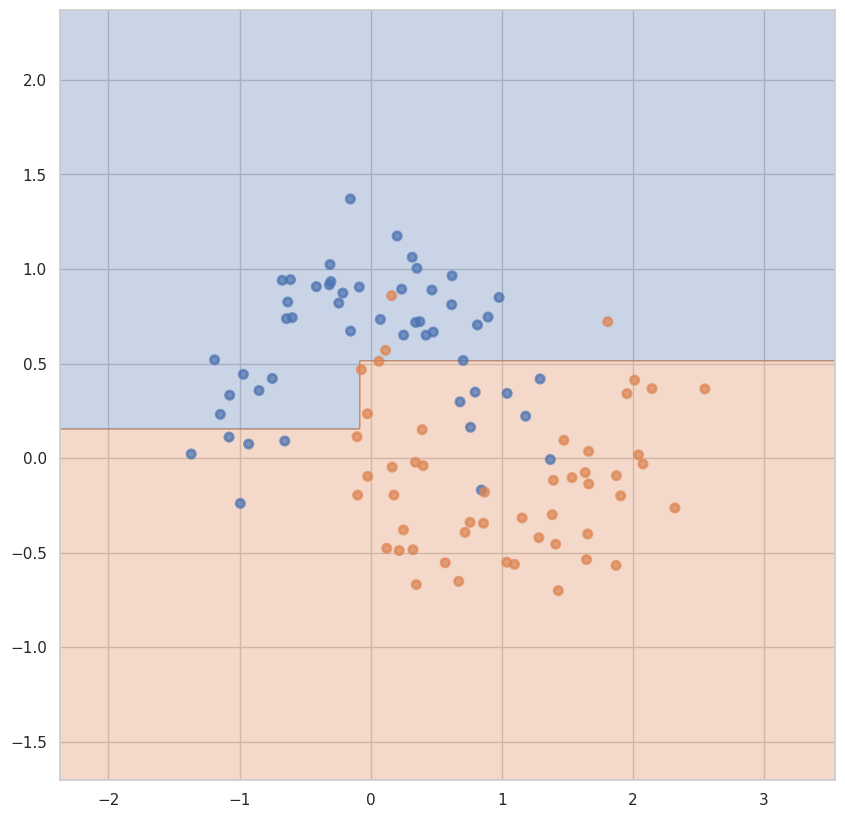

На обучающей для max_depth = 4 и min_samples_leaf = 13: 0.8375
На тестовой для max_depth = 4 и min_samples_leaf = 13: 0.85
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 14:


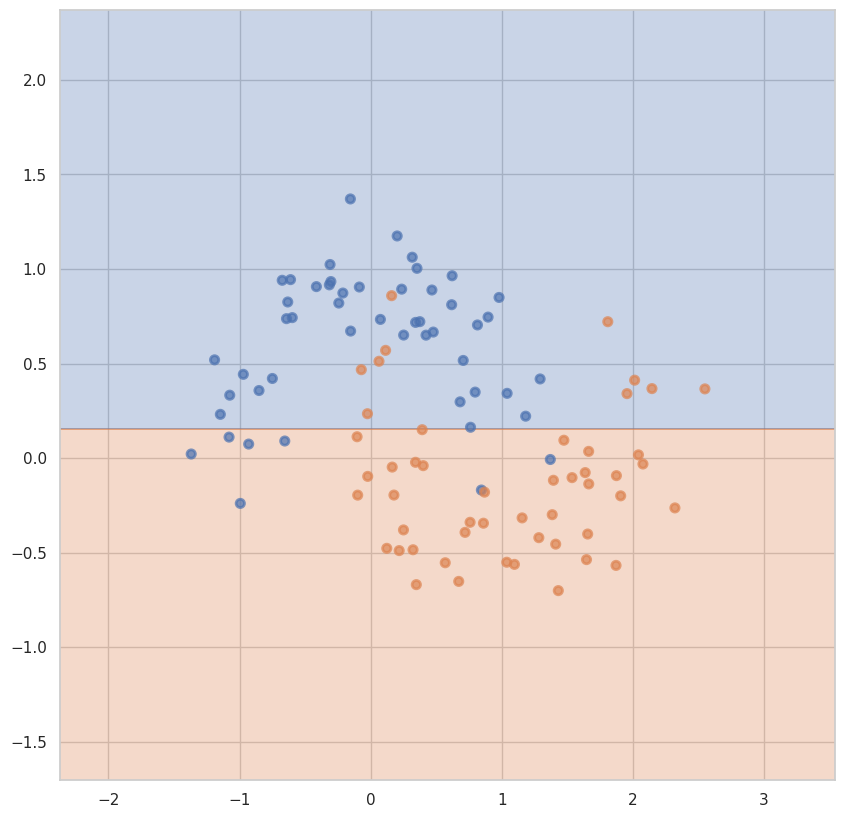

На обучающей для max_depth = 4 и min_samples_leaf = 14: 0.825
На тестовой для max_depth = 4 и min_samples_leaf = 14: 0.85
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 1:


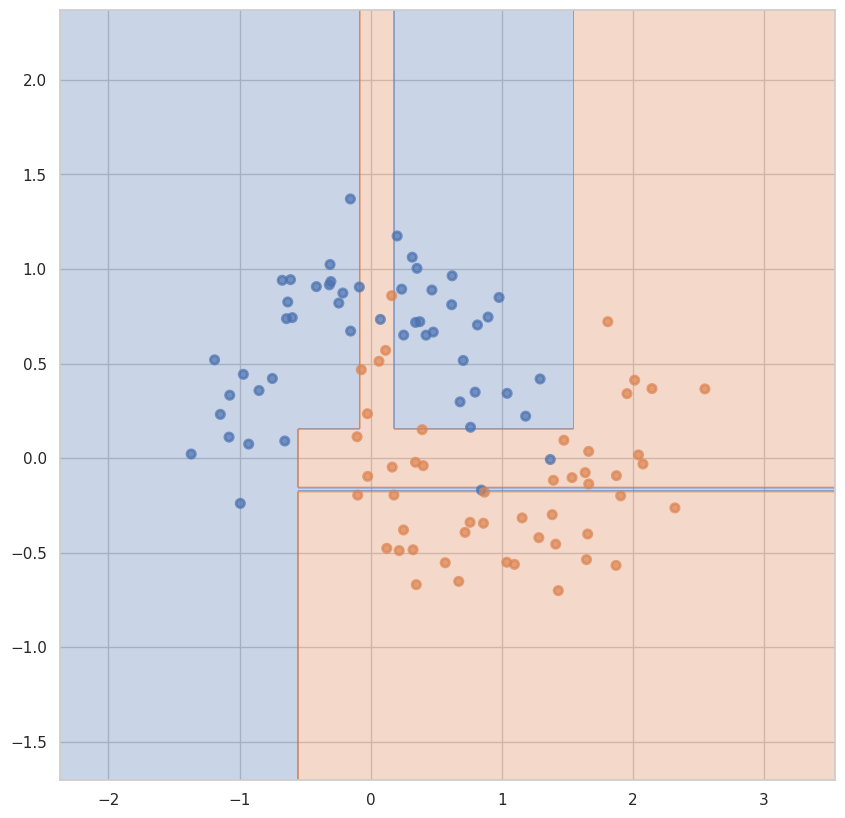

На обучающей для max_depth = 5 и min_samples_leaf = 1: 0.9875
На тестовой для max_depth = 5 и min_samples_leaf = 1: 0.95
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 2:


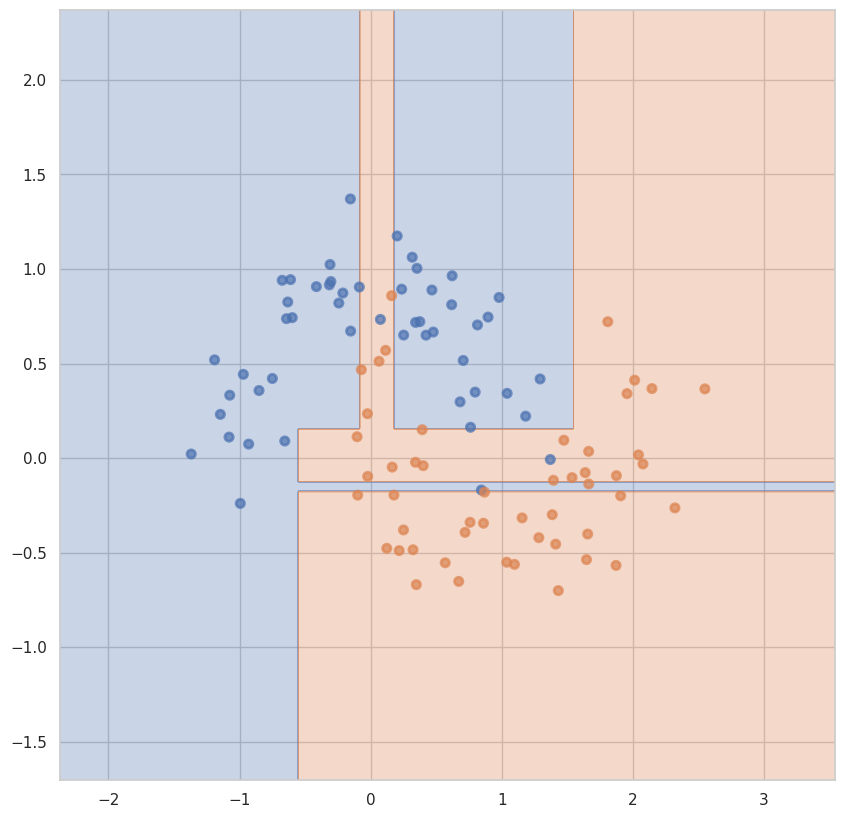

На обучающей для max_depth = 5 и min_samples_leaf = 2: 0.975
На тестовой для max_depth = 5 и min_samples_leaf = 2: 0.95
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 3:


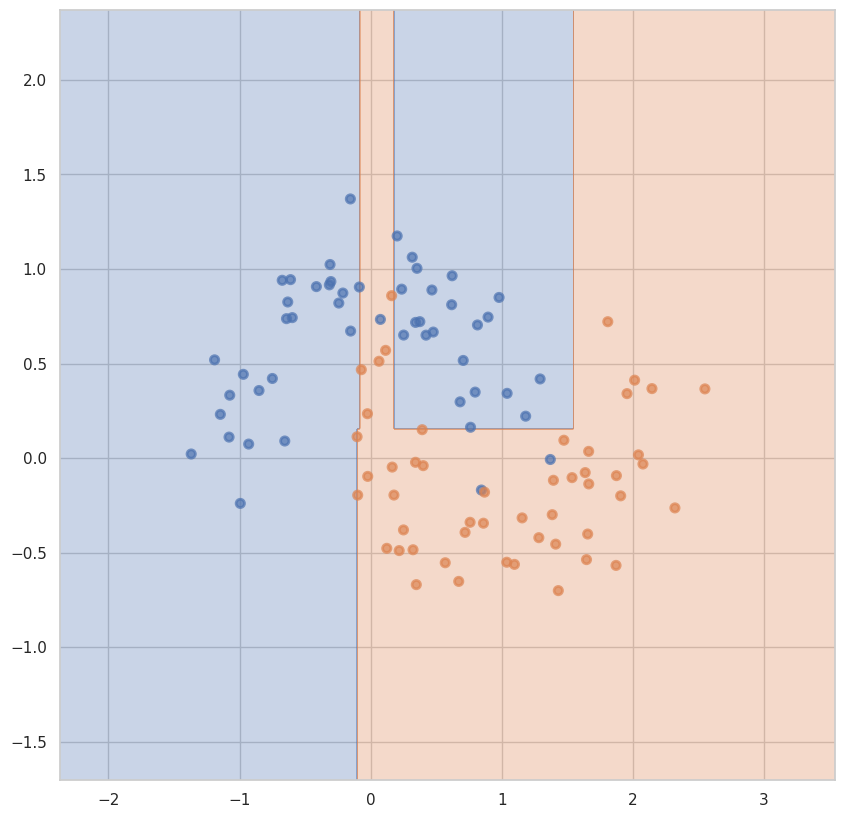

На обучающей для max_depth = 5 и min_samples_leaf = 3: 0.9625
На тестовой для max_depth = 5 и min_samples_leaf = 3: 0.95
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 4:


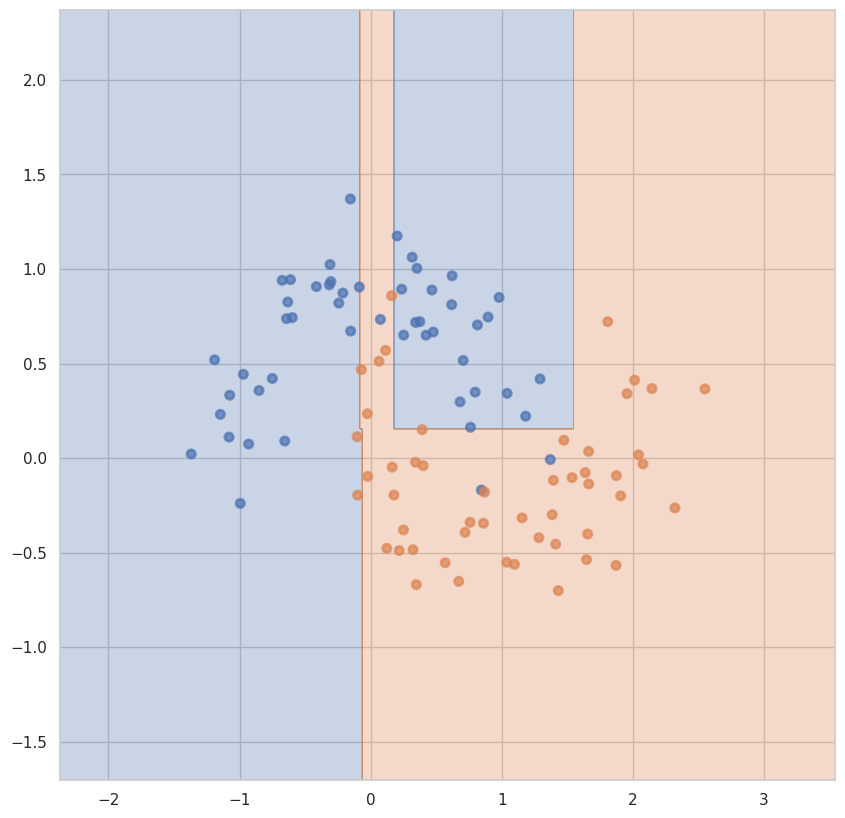

На обучающей для max_depth = 5 и min_samples_leaf = 4: 0.95
На тестовой для max_depth = 5 и min_samples_leaf = 4: 0.95
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 5:


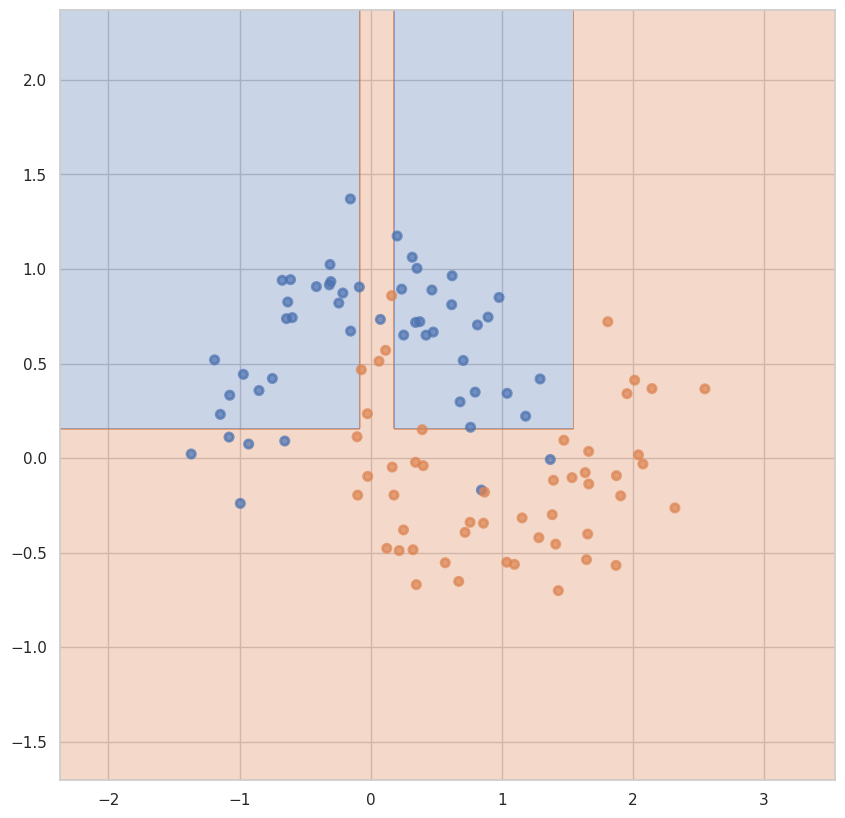

На обучающей для max_depth = 5 и min_samples_leaf = 5: 0.95
На тестовой для max_depth = 5 и min_samples_leaf = 5: 0.8
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 6:


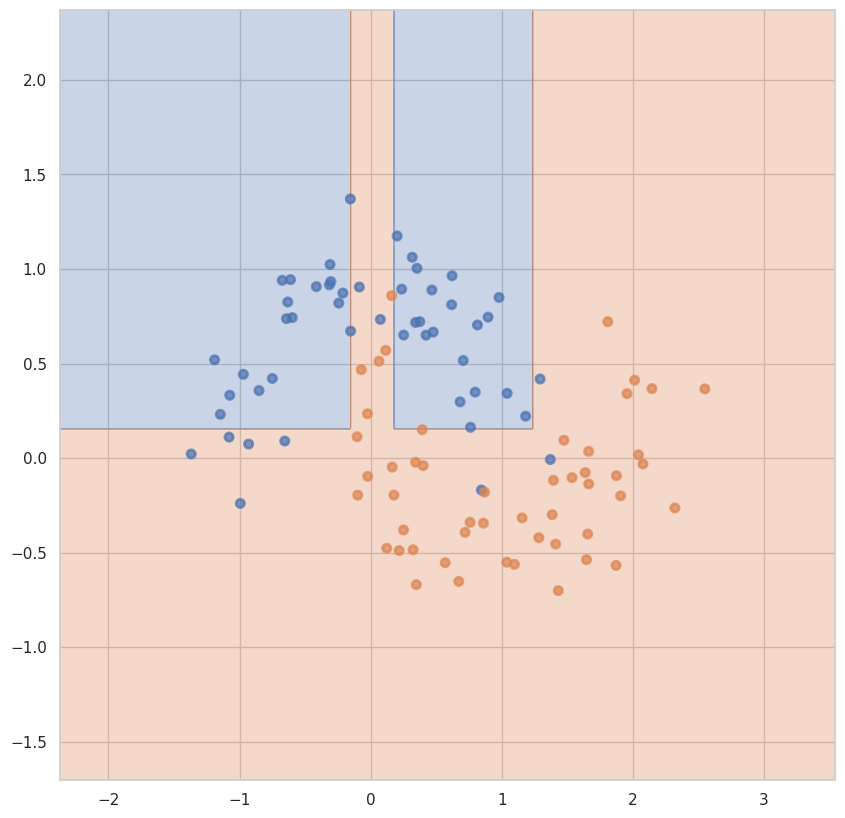

На обучающей для max_depth = 5 и min_samples_leaf = 6: 0.925
На тестовой для max_depth = 5 и min_samples_leaf = 6: 0.8
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 7:


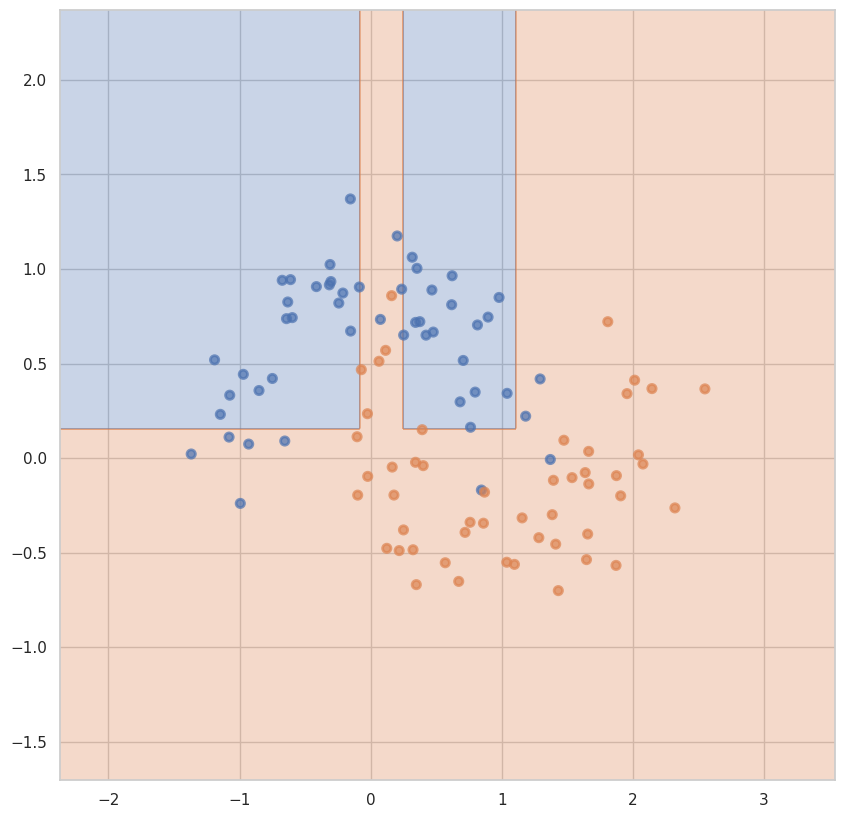

На обучающей для max_depth = 5 и min_samples_leaf = 7: 0.9
На тестовой для max_depth = 5 и min_samples_leaf = 7: 0.8
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 8:


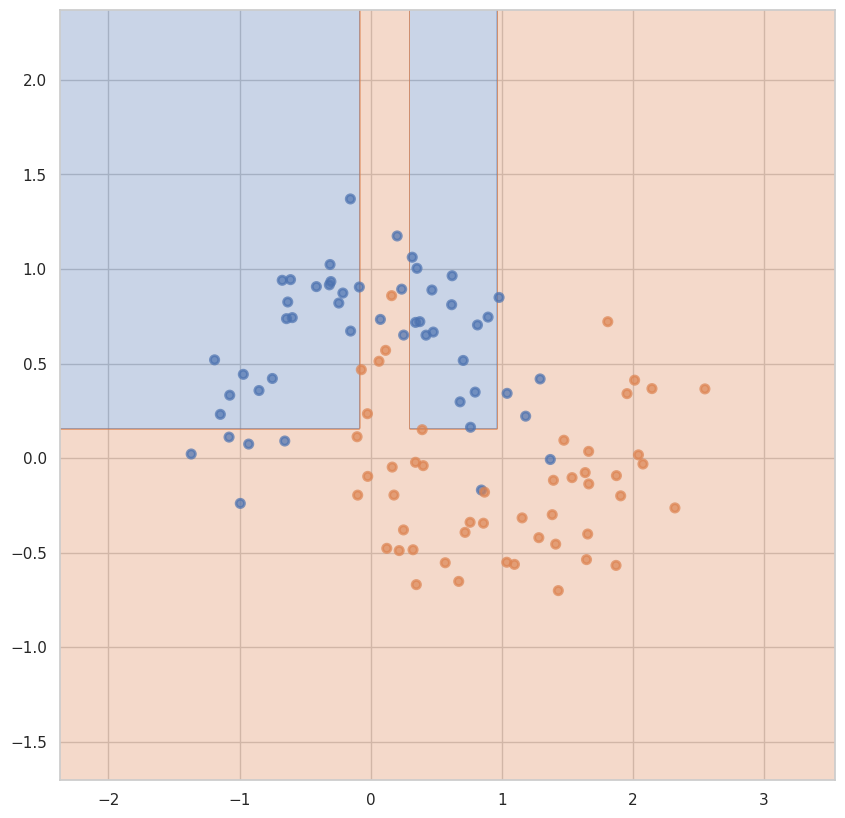

На обучающей для max_depth = 5 и min_samples_leaf = 8: 0.875
На тестовой для max_depth = 5 и min_samples_leaf = 8: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 9:


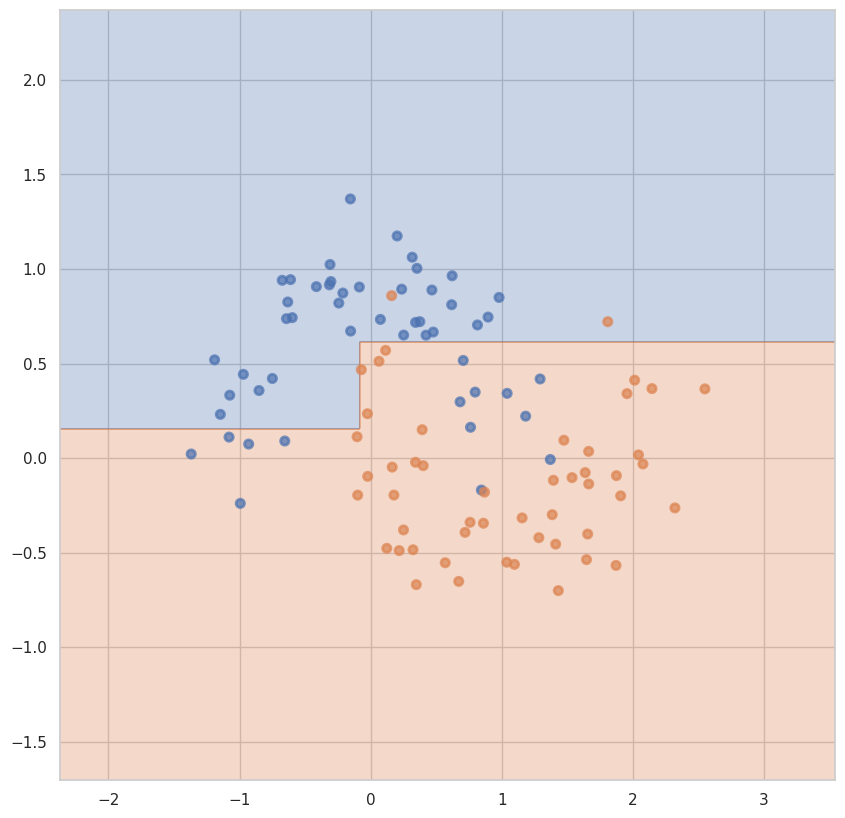

На обучающей для max_depth = 5 и min_samples_leaf = 9: 0.8375
На тестовой для max_depth = 5 и min_samples_leaf = 9: 0.85
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 10:


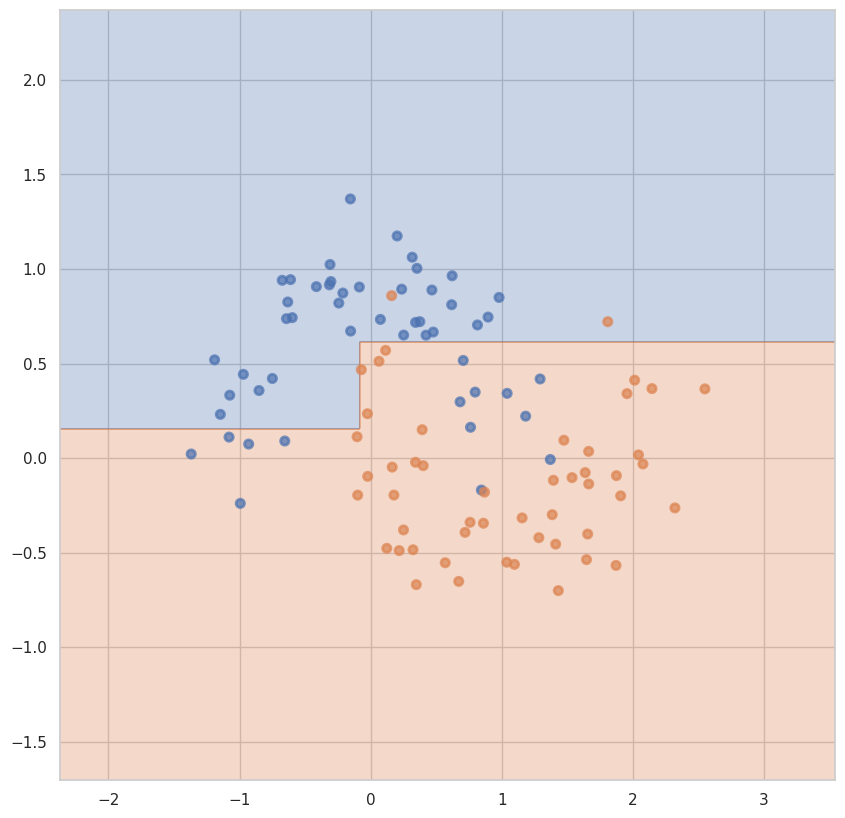

На обучающей для max_depth = 5 и min_samples_leaf = 10: 0.8375
На тестовой для max_depth = 5 и min_samples_leaf = 10: 0.85
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 11:


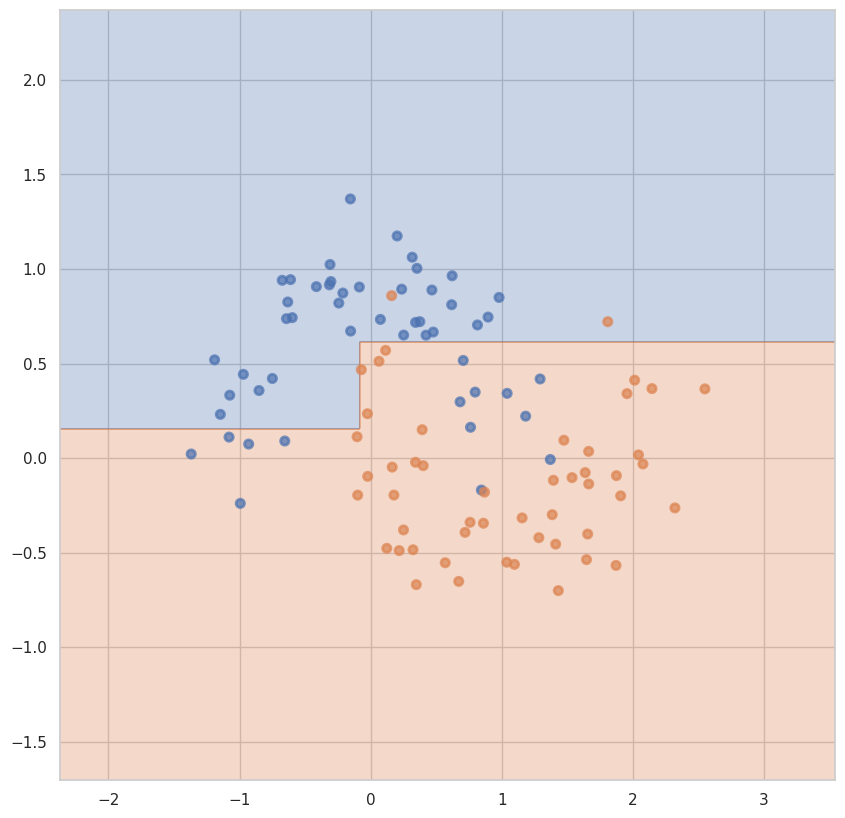

На обучающей для max_depth = 5 и min_samples_leaf = 11: 0.8375
На тестовой для max_depth = 5 и min_samples_leaf = 11: 0.85
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 12:


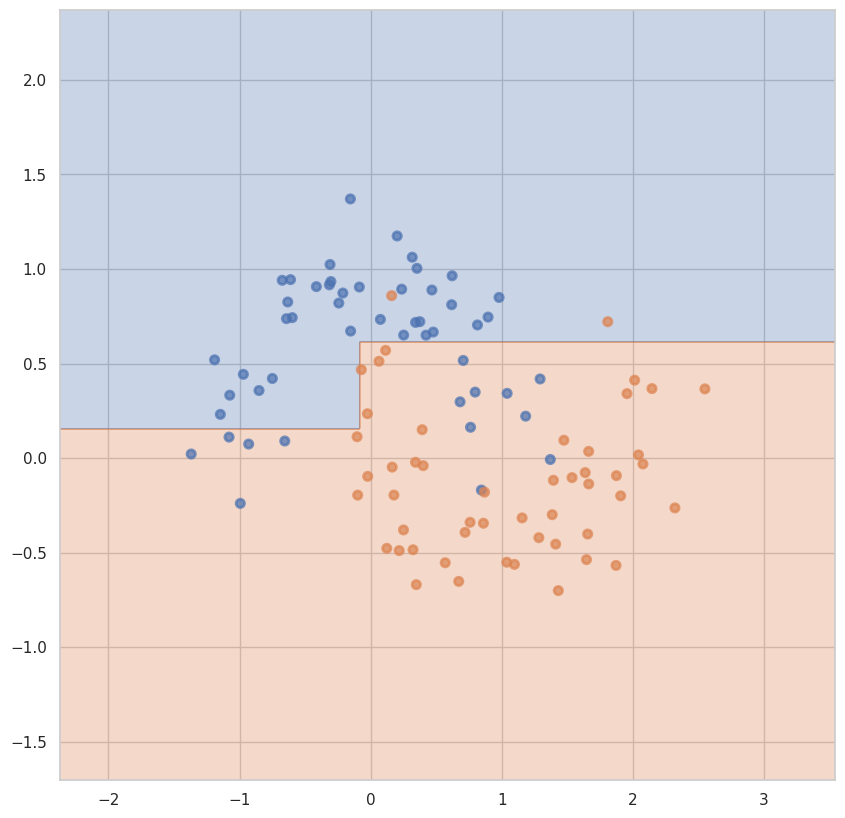

На обучающей для max_depth = 5 и min_samples_leaf = 12: 0.8375
На тестовой для max_depth = 5 и min_samples_leaf = 12: 0.85
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 13:


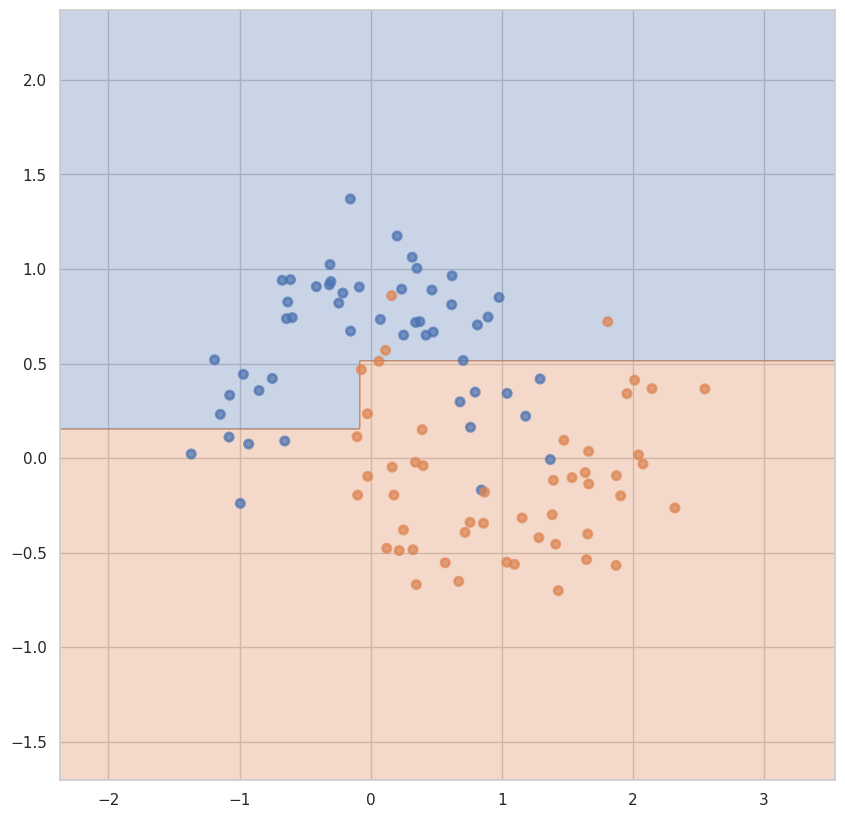

На обучающей для max_depth = 5 и min_samples_leaf = 13: 0.8375
На тестовой для max_depth = 5 и min_samples_leaf = 13: 0.85
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 14:


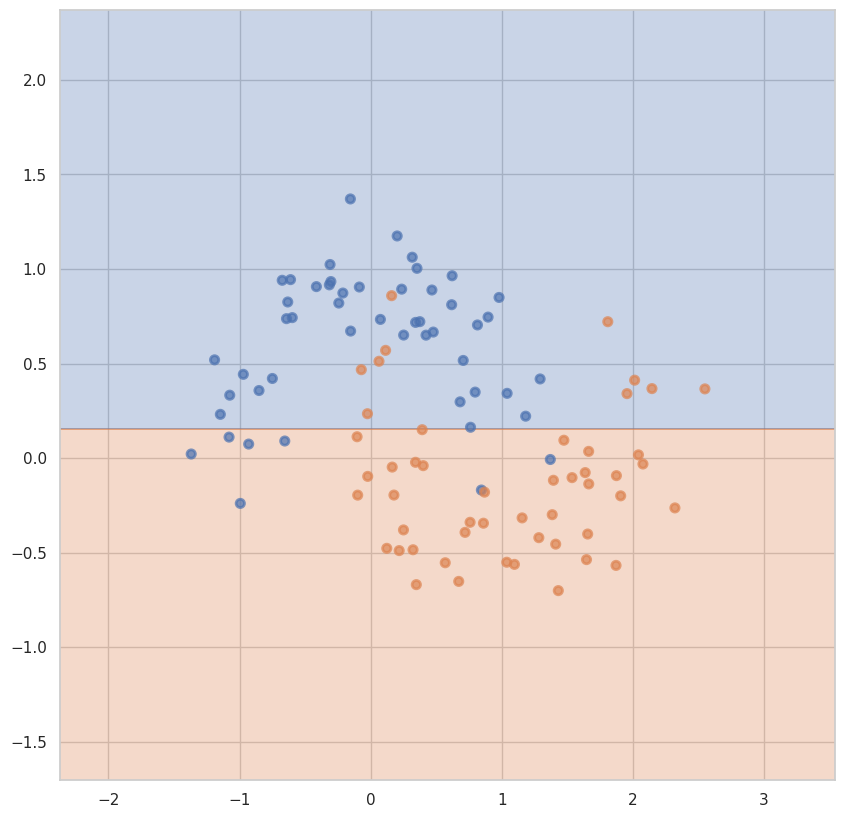

На обучающей для max_depth = 5 и min_samples_leaf = 14: 0.825
На тестовой для max_depth = 5 и min_samples_leaf = 14: 0.85
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 1:


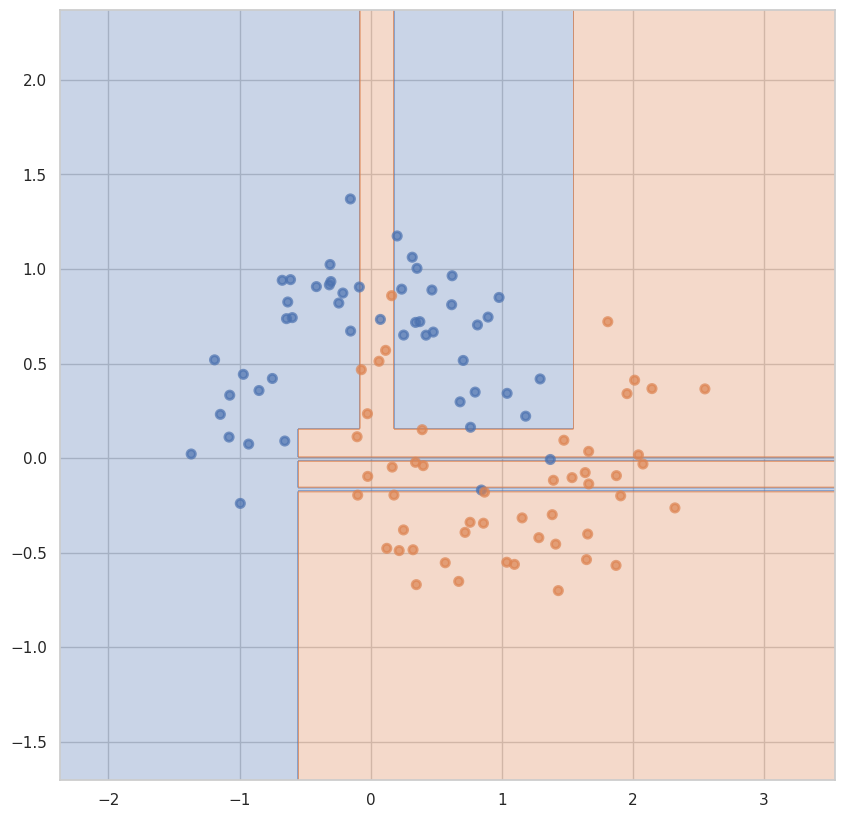

На обучающей для max_depth = 6 и min_samples_leaf = 1: 1.0
На тестовой для max_depth = 6 и min_samples_leaf = 1: 0.95
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 2:


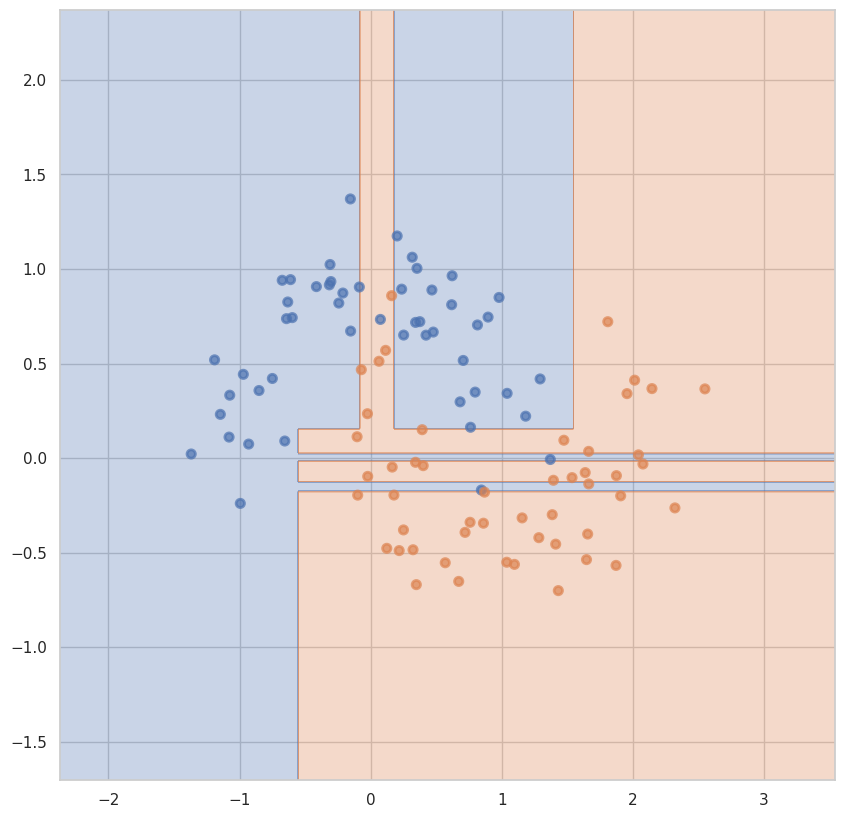

На обучающей для max_depth = 6 и min_samples_leaf = 2: 0.975
На тестовой для max_depth = 6 и min_samples_leaf = 2: 0.95
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 3:


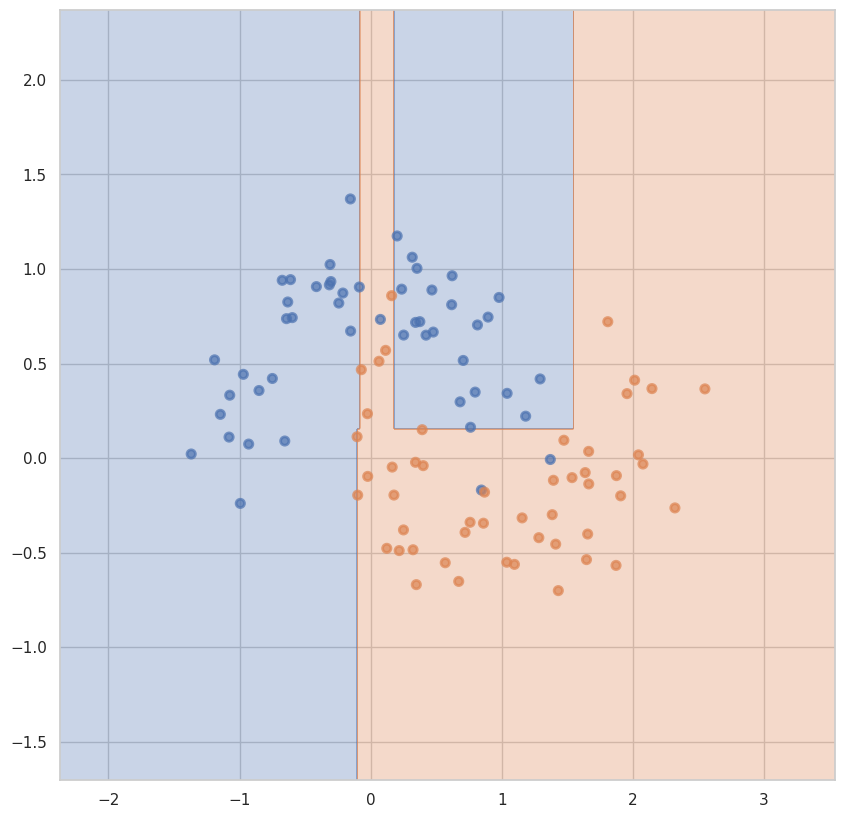

На обучающей для max_depth = 6 и min_samples_leaf = 3: 0.9625
На тестовой для max_depth = 6 и min_samples_leaf = 3: 0.95
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 4:


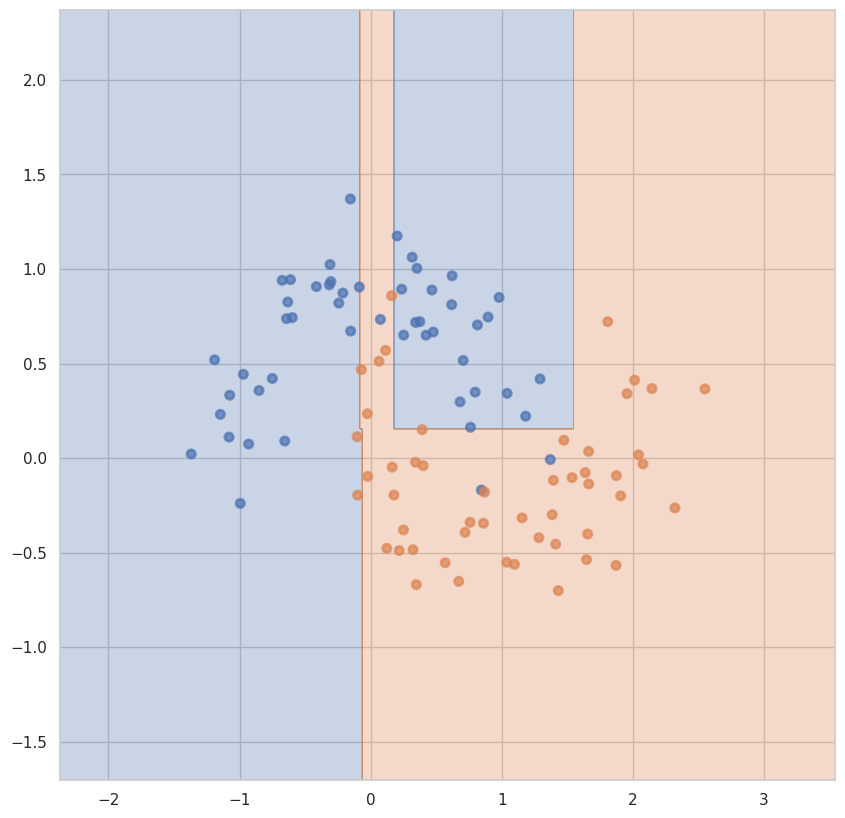

На обучающей для max_depth = 6 и min_samples_leaf = 4: 0.95
На тестовой для max_depth = 6 и min_samples_leaf = 4: 0.95
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 5:


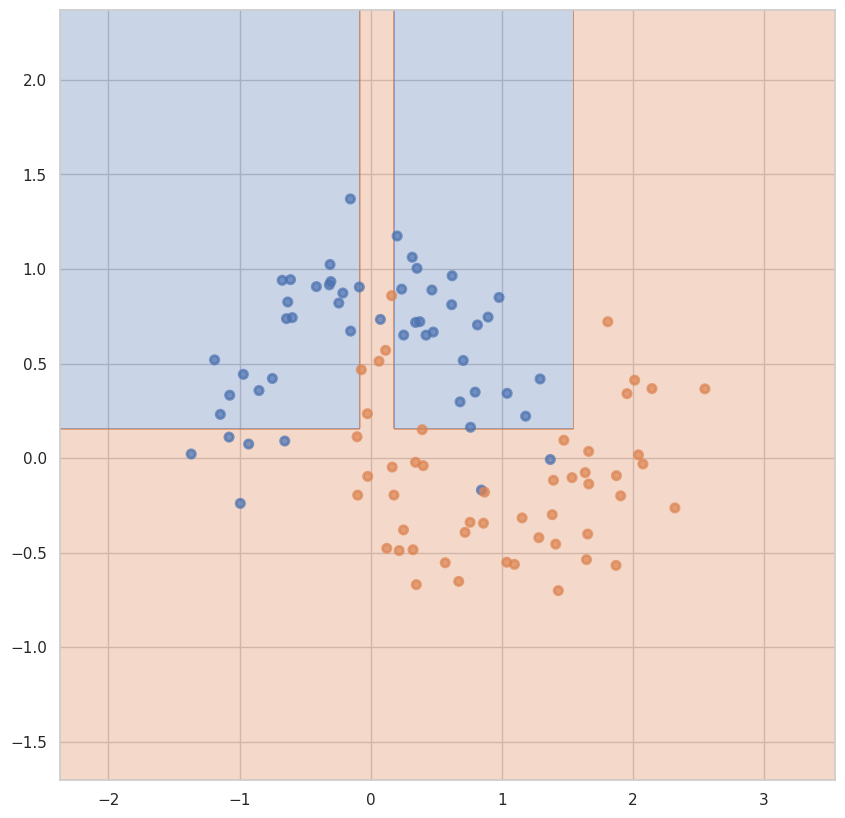

На обучающей для max_depth = 6 и min_samples_leaf = 5: 0.95
На тестовой для max_depth = 6 и min_samples_leaf = 5: 0.8
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 6:


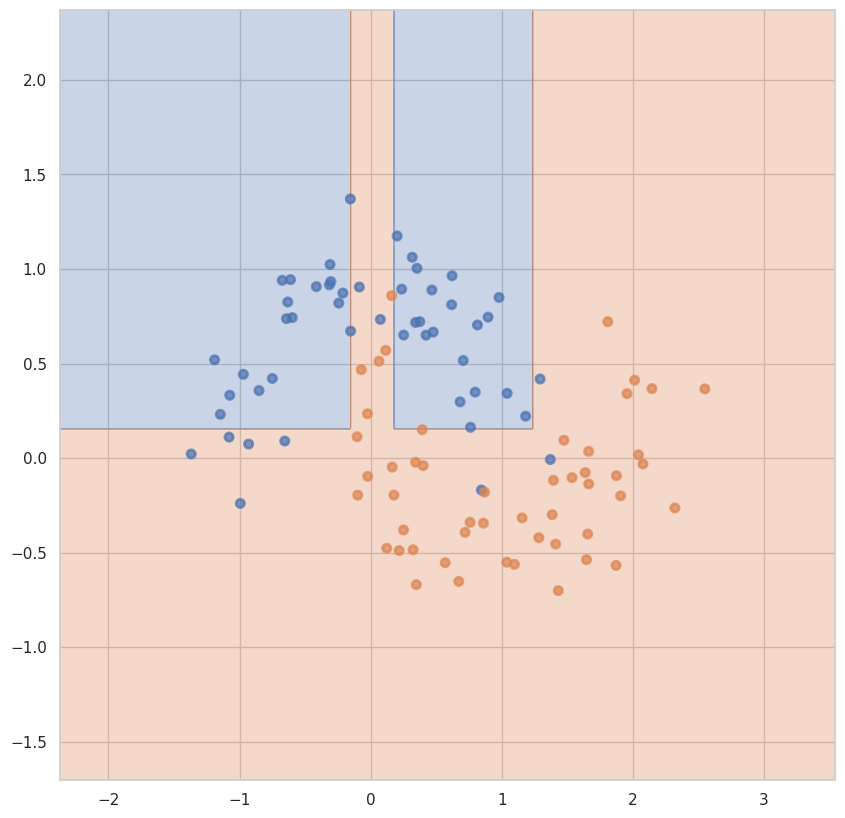

На обучающей для max_depth = 6 и min_samples_leaf = 6: 0.925
На тестовой для max_depth = 6 и min_samples_leaf = 6: 0.8
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 7:


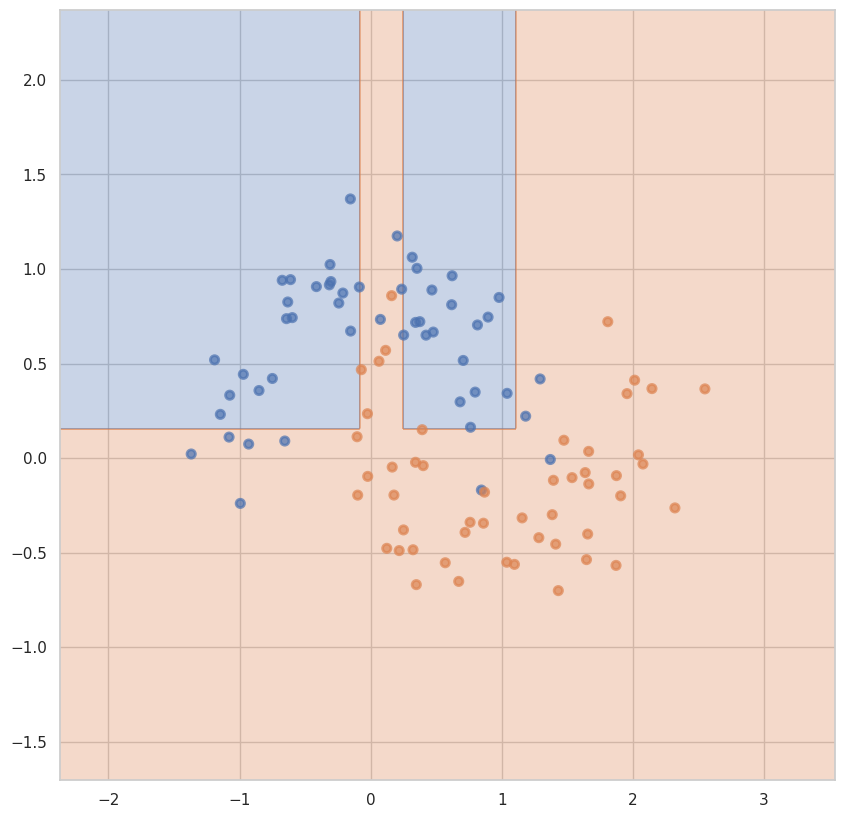

На обучающей для max_depth = 6 и min_samples_leaf = 7: 0.9
На тестовой для max_depth = 6 и min_samples_leaf = 7: 0.8
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 8:


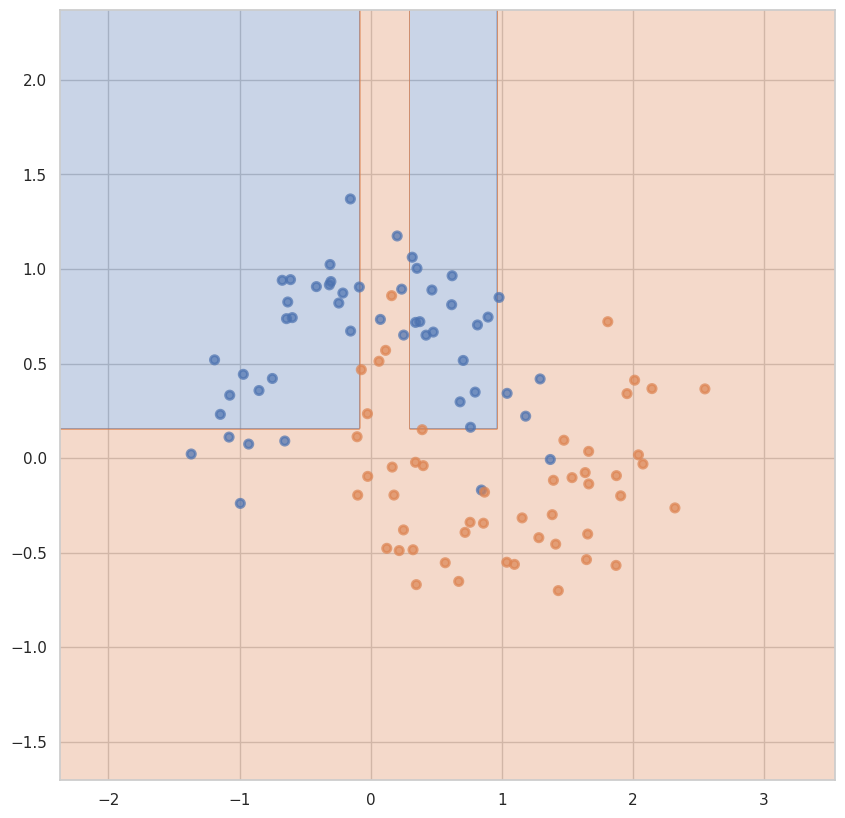

На обучающей для max_depth = 6 и min_samples_leaf = 8: 0.875
На тестовой для max_depth = 6 и min_samples_leaf = 8: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 9:


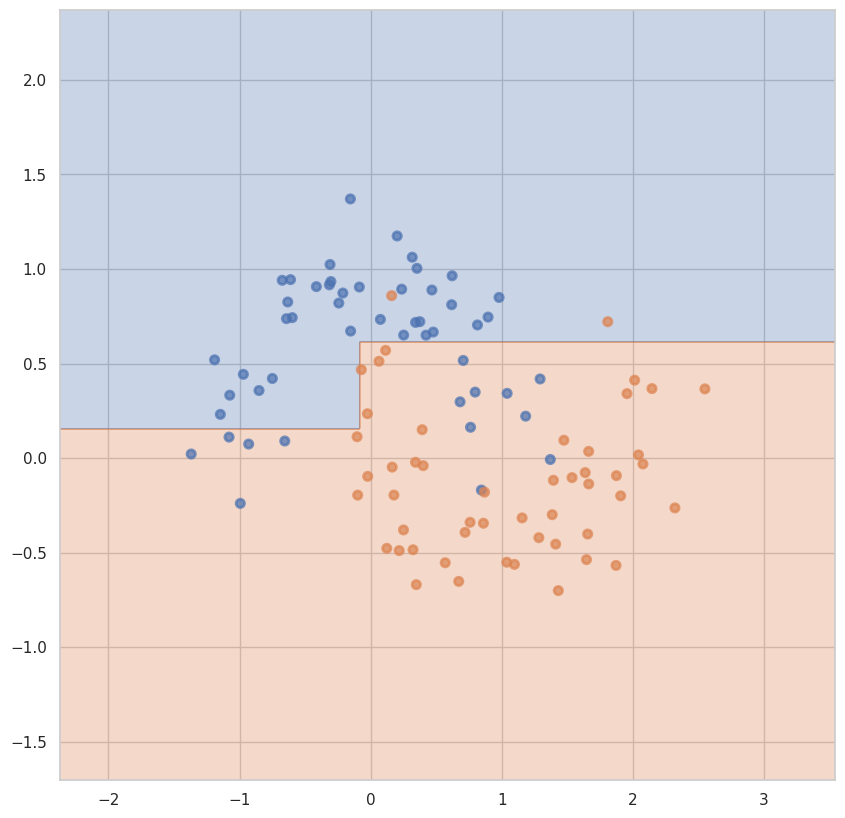

На обучающей для max_depth = 6 и min_samples_leaf = 9: 0.8375
На тестовой для max_depth = 6 и min_samples_leaf = 9: 0.85
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 10:


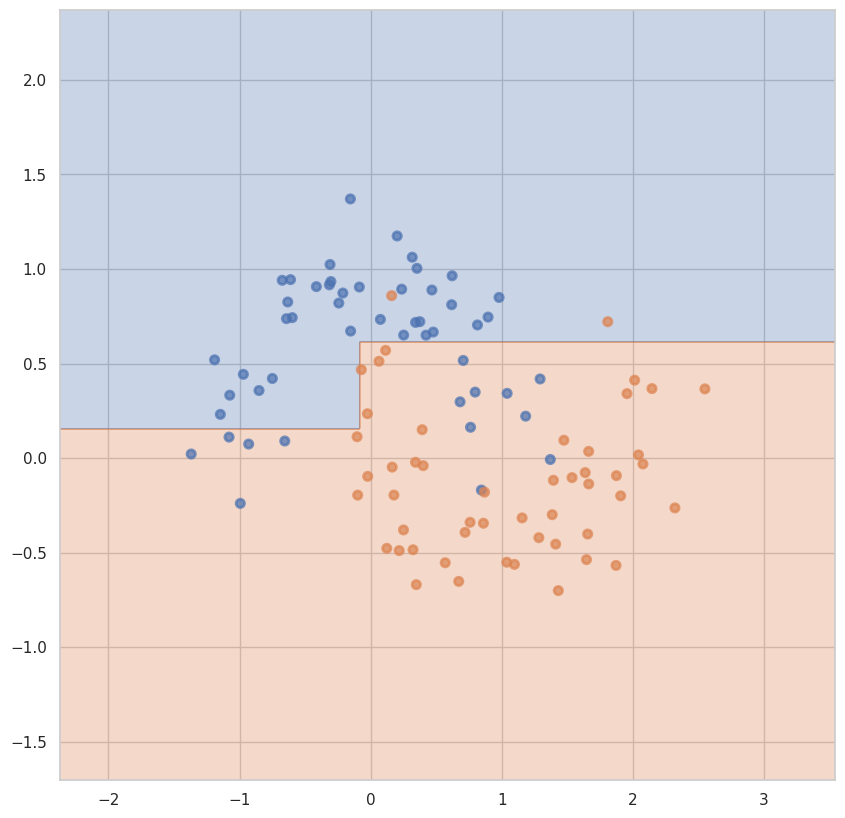

На обучающей для max_depth = 6 и min_samples_leaf = 10: 0.8375
На тестовой для max_depth = 6 и min_samples_leaf = 10: 0.85
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 11:


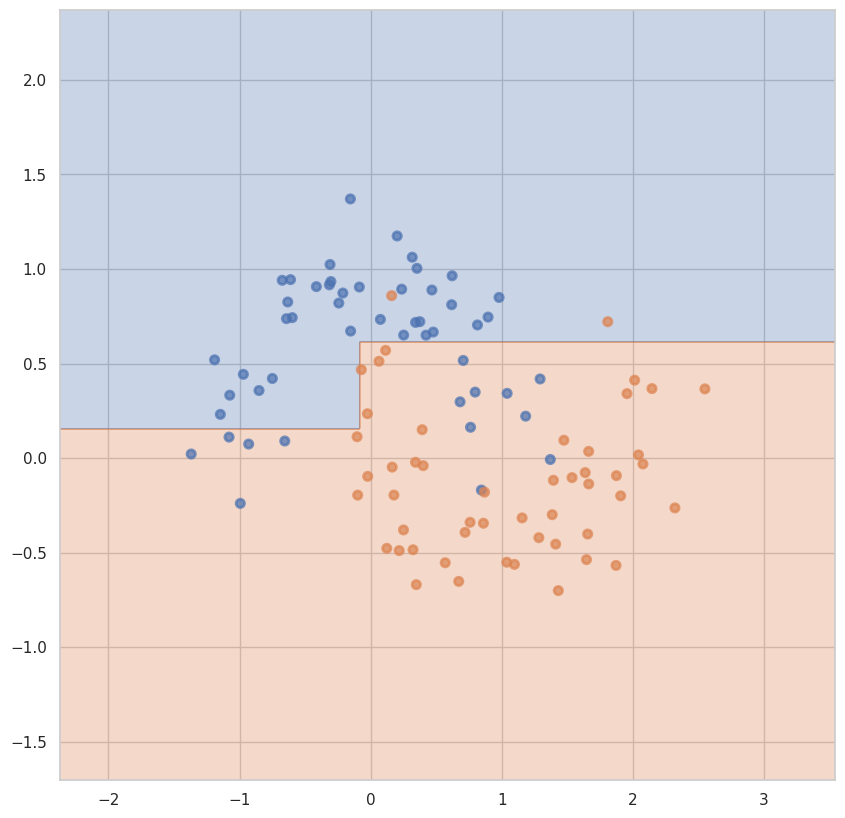

На обучающей для max_depth = 6 и min_samples_leaf = 11: 0.8375
На тестовой для max_depth = 6 и min_samples_leaf = 11: 0.85
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 12:


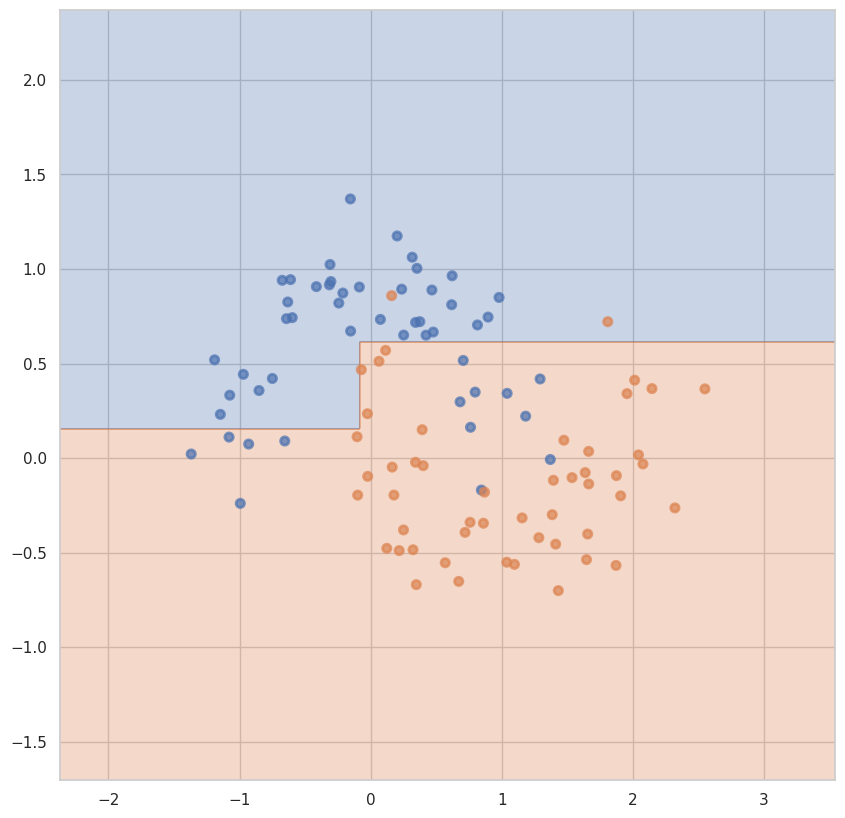

На обучающей для max_depth = 6 и min_samples_leaf = 12: 0.8375
На тестовой для max_depth = 6 и min_samples_leaf = 12: 0.85
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 13:


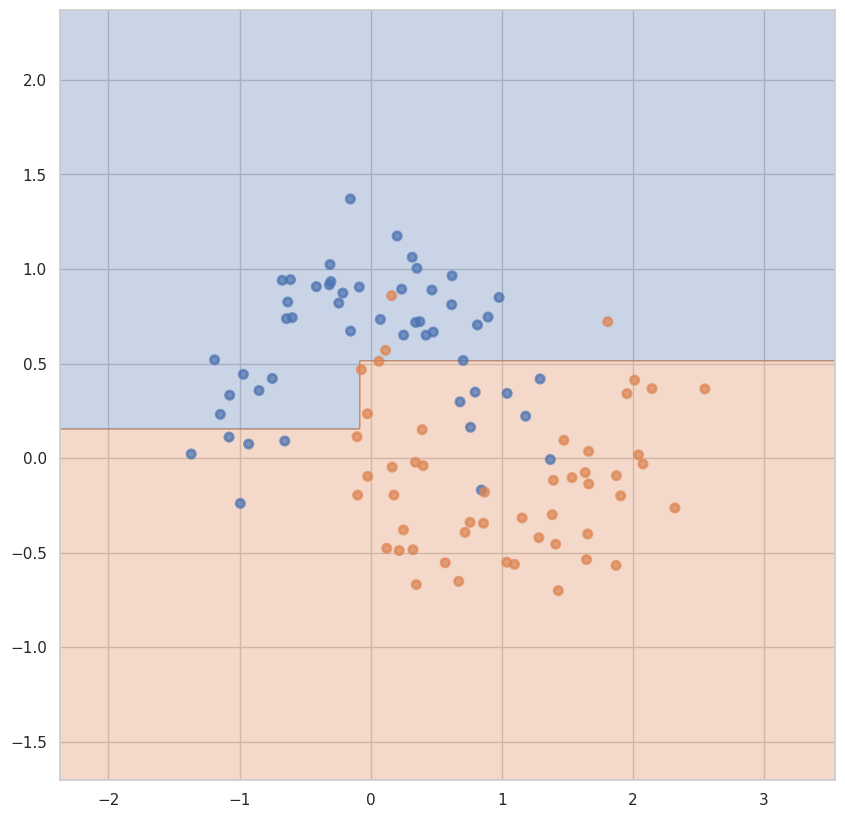

На обучающей для max_depth = 6 и min_samples_leaf = 13: 0.8375
На тестовой для max_depth = 6 и min_samples_leaf = 13: 0.85
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 14:


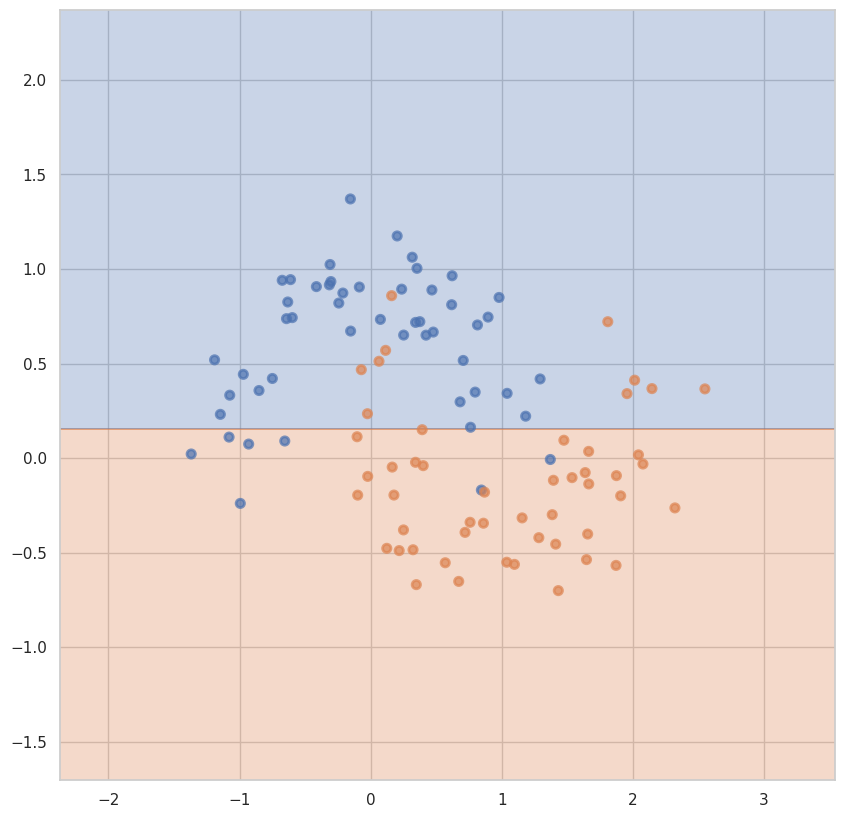

На обучающей для max_depth = 6 и min_samples_leaf = 14: 0.825
На тестовой для max_depth = 6 и min_samples_leaf = 14: 0.85
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 1:


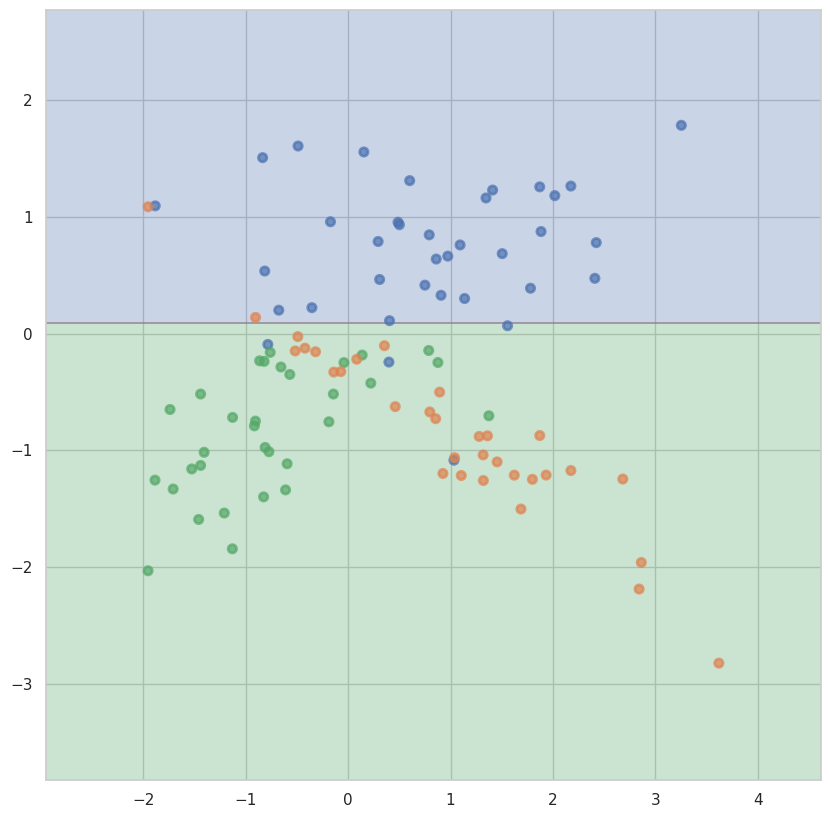

На обучающей для max_depth = 1 и min_samples_leaf = 1: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 1: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 2:


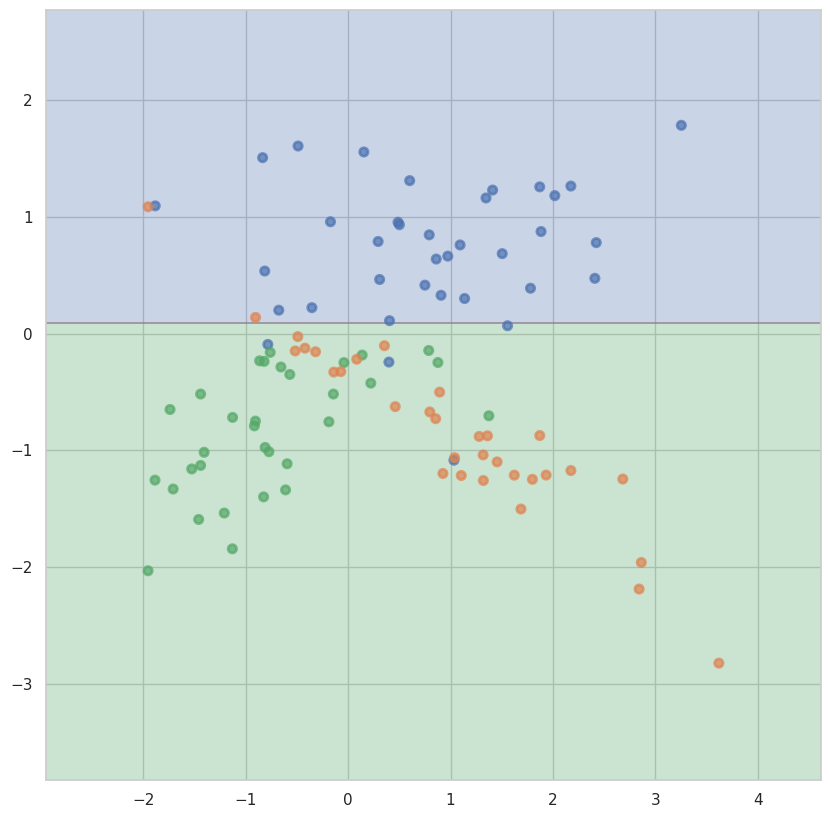

На обучающей для max_depth = 1 и min_samples_leaf = 2: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 2: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 3:


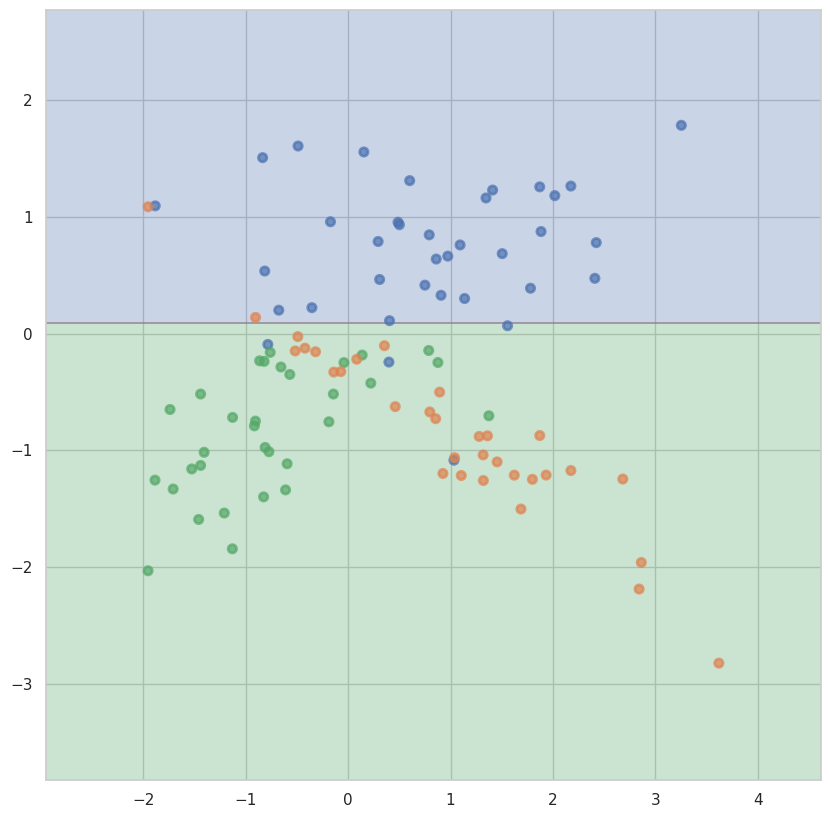

На обучающей для max_depth = 1 и min_samples_leaf = 3: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 3: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 4:


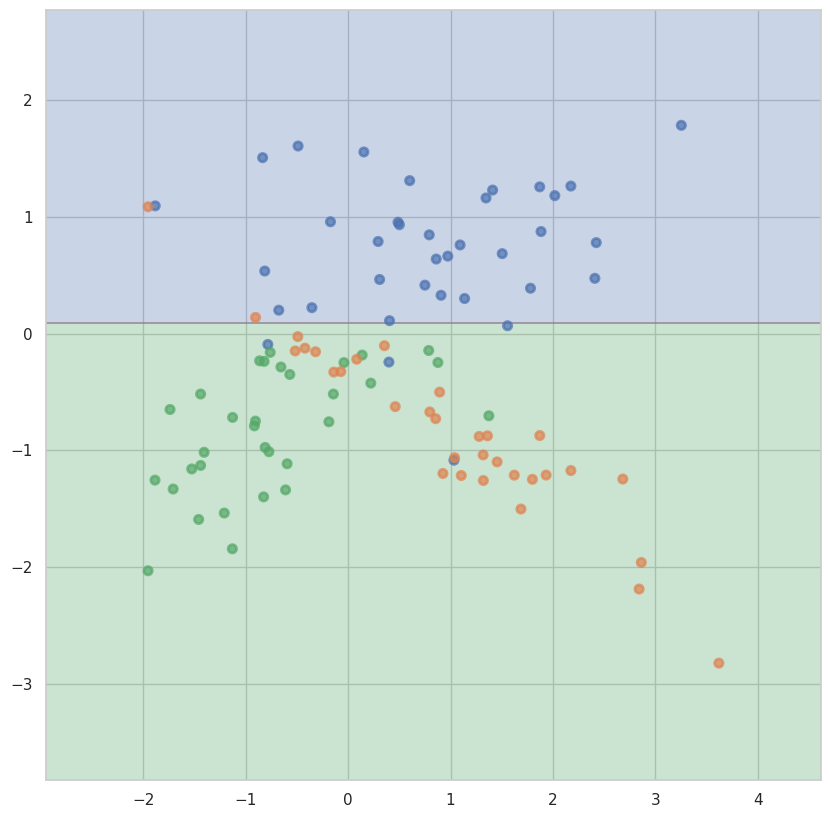

На обучающей для max_depth = 1 и min_samples_leaf = 4: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 4: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 5:


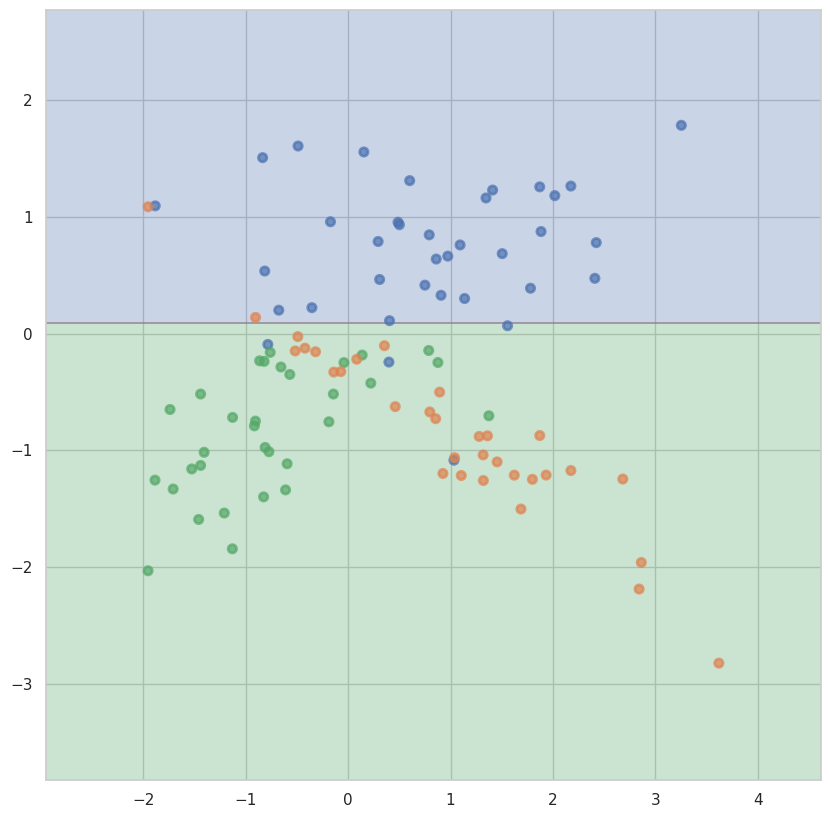

На обучающей для max_depth = 1 и min_samples_leaf = 5: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 5: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 6:


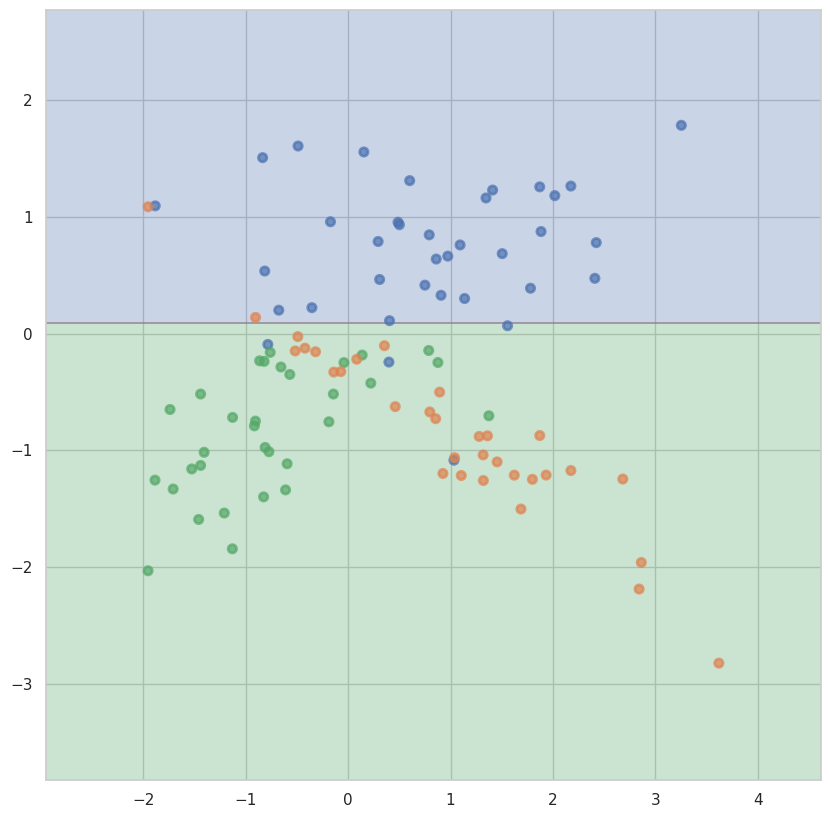

На обучающей для max_depth = 1 и min_samples_leaf = 6: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 6: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 7:


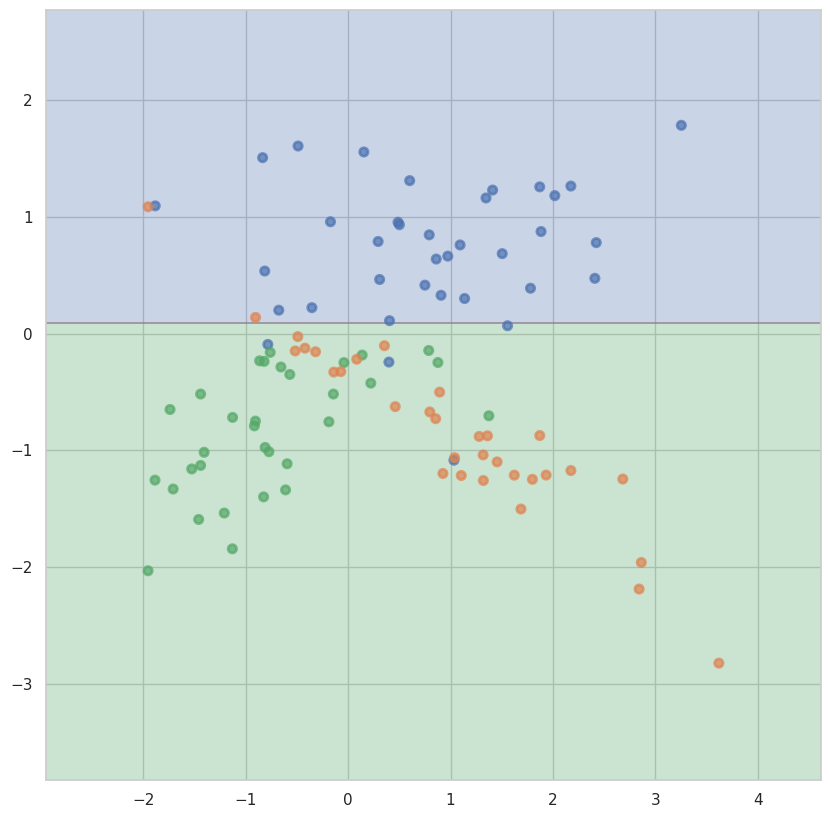

На обучающей для max_depth = 1 и min_samples_leaf = 7: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 7: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 8:


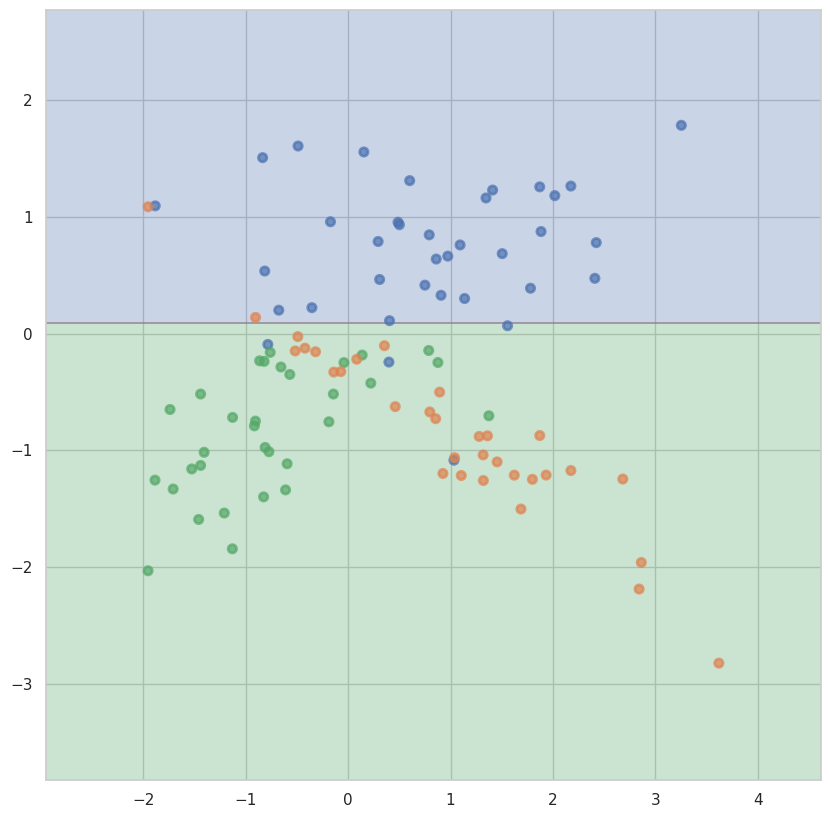

На обучающей для max_depth = 1 и min_samples_leaf = 8: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 8: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 9:


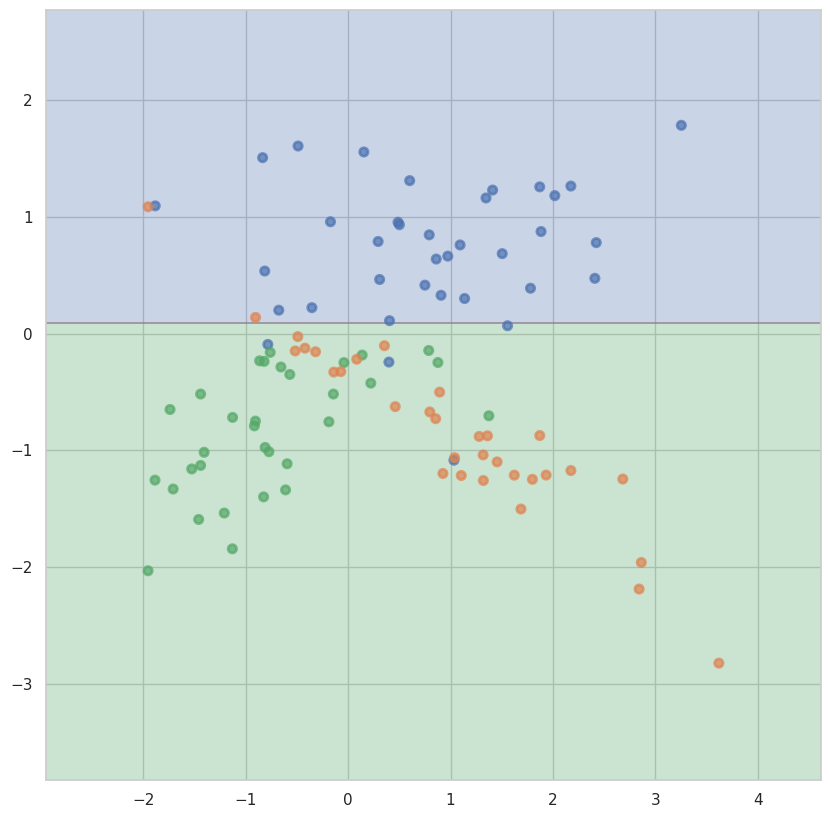

На обучающей для max_depth = 1 и min_samples_leaf = 9: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 9: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 10:


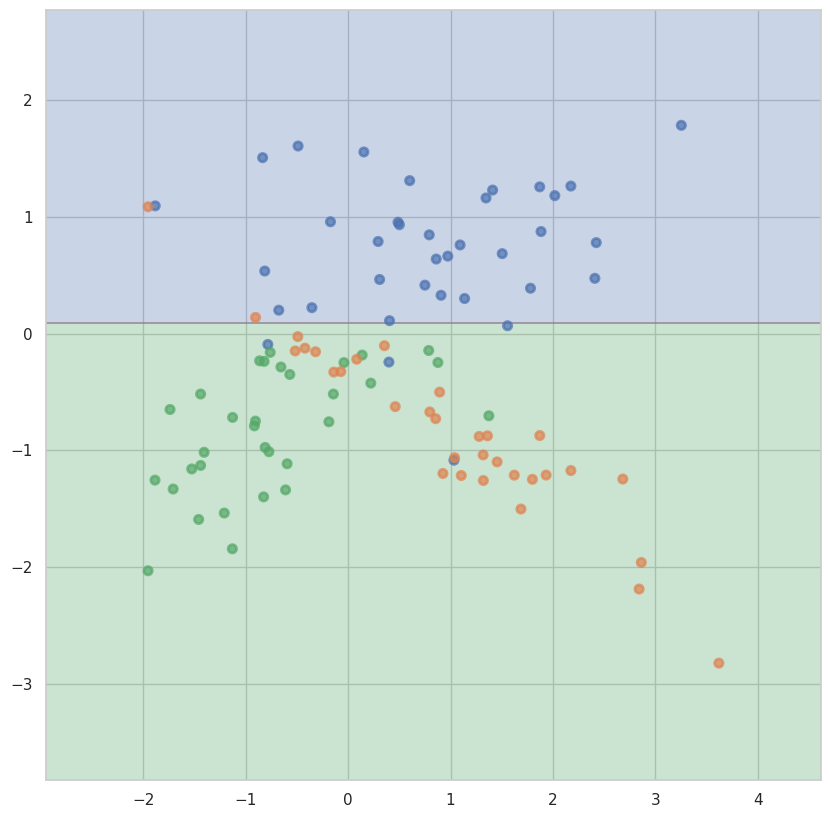

На обучающей для max_depth = 1 и min_samples_leaf = 10: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 10: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 11:


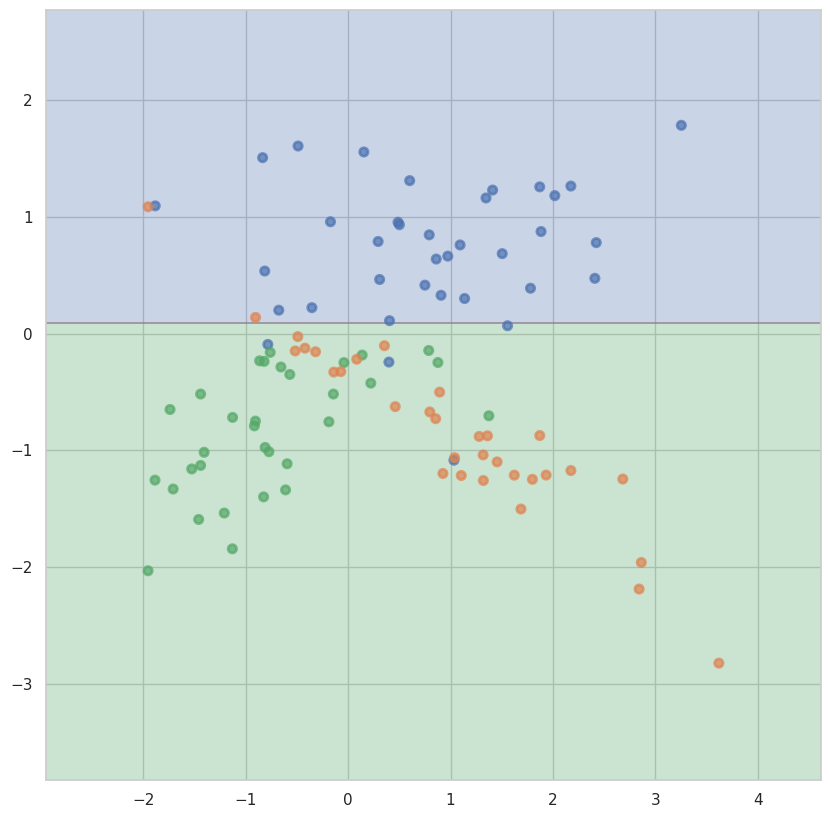

На обучающей для max_depth = 1 и min_samples_leaf = 11: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 11: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 12:


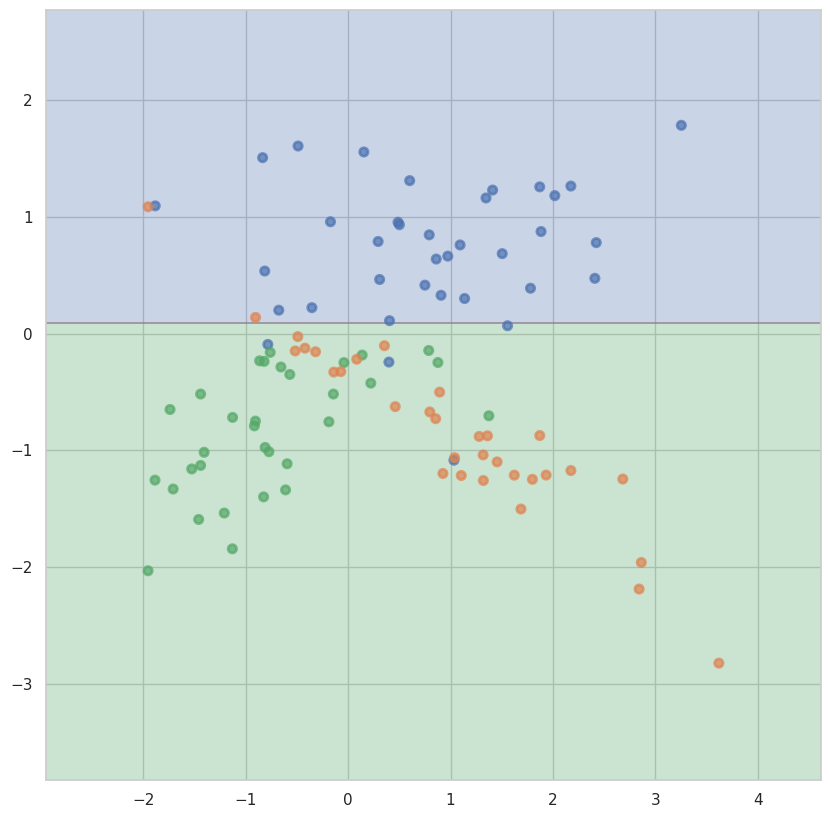

На обучающей для max_depth = 1 и min_samples_leaf = 12: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 12: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 13:


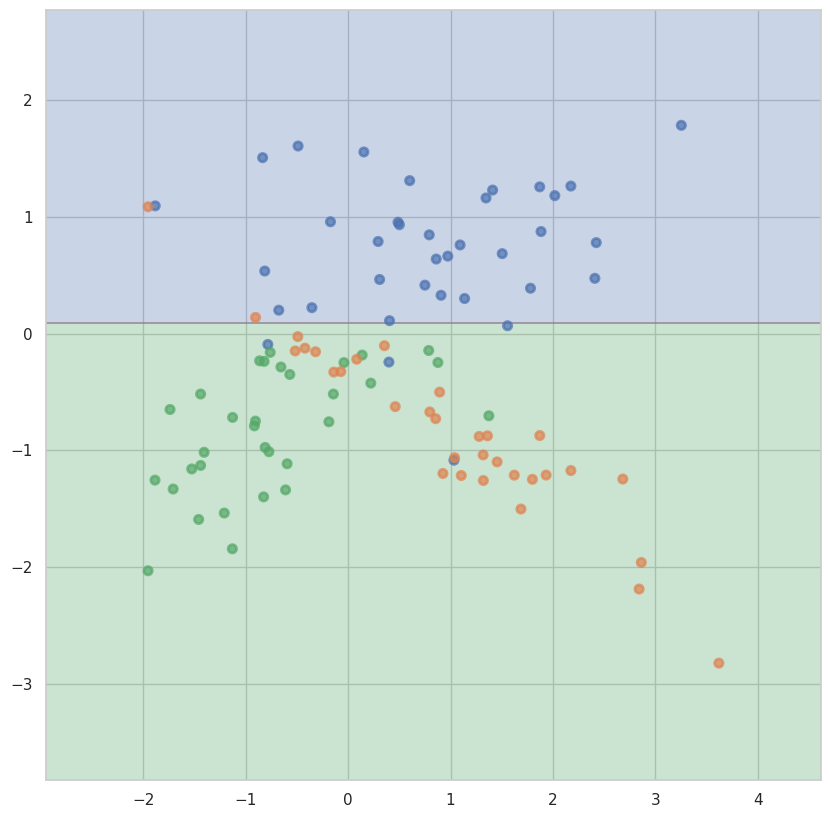

На обучающей для max_depth = 1 и min_samples_leaf = 13: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 13: 0.55
Разделяющая поверхность для max_depth = 1 и min_samples_leaf = 14:


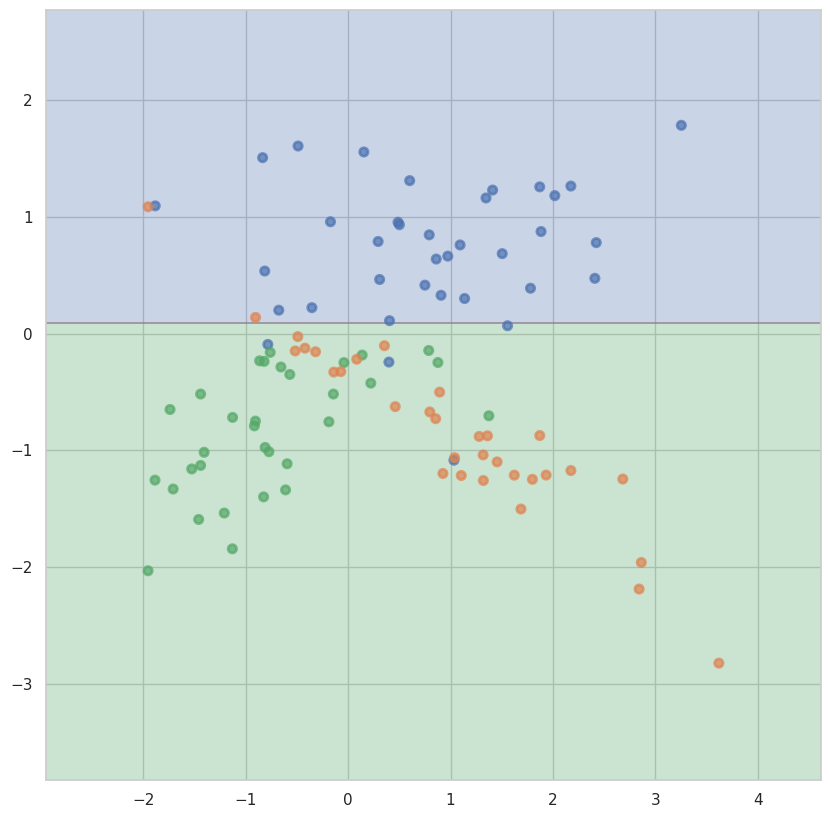

На обучающей для max_depth = 1 и min_samples_leaf = 14: 0.6625
На тестовой для max_depth = 1 и min_samples_leaf = 14: 0.55
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 1:


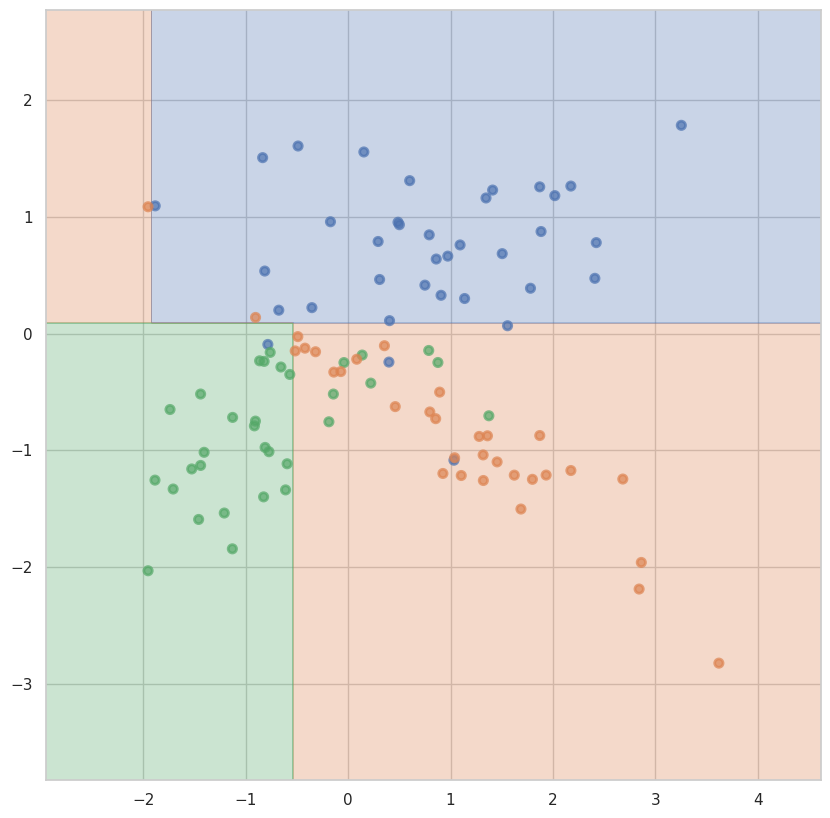

На обучающей для max_depth = 2 и min_samples_leaf = 1: 0.9
На тестовой для max_depth = 2 и min_samples_leaf = 1: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 2:


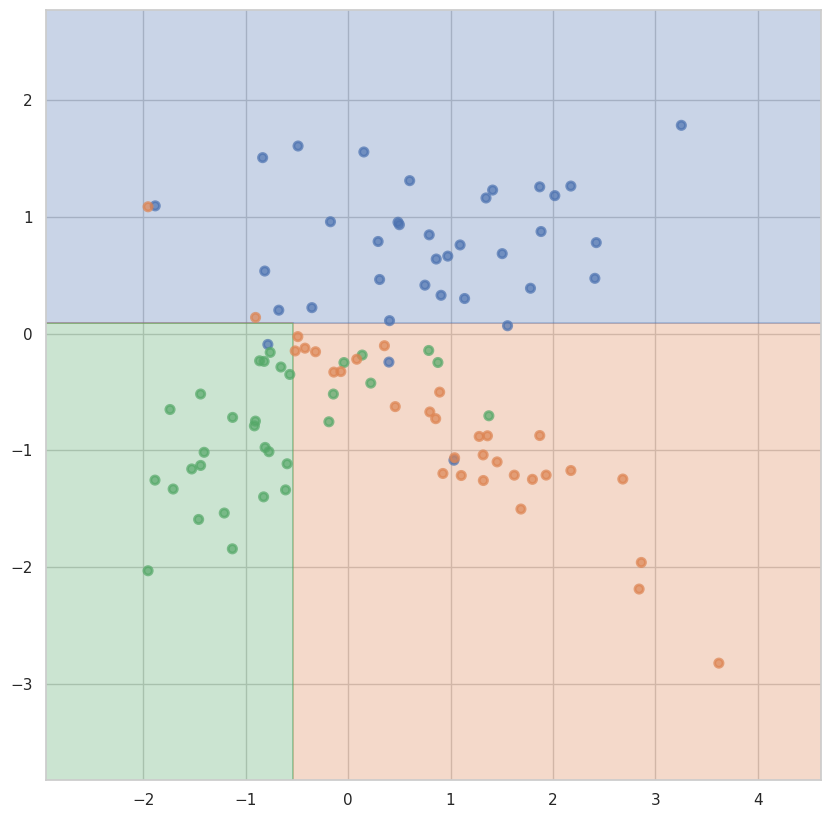

На обучающей для max_depth = 2 и min_samples_leaf = 2: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 2: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 3:


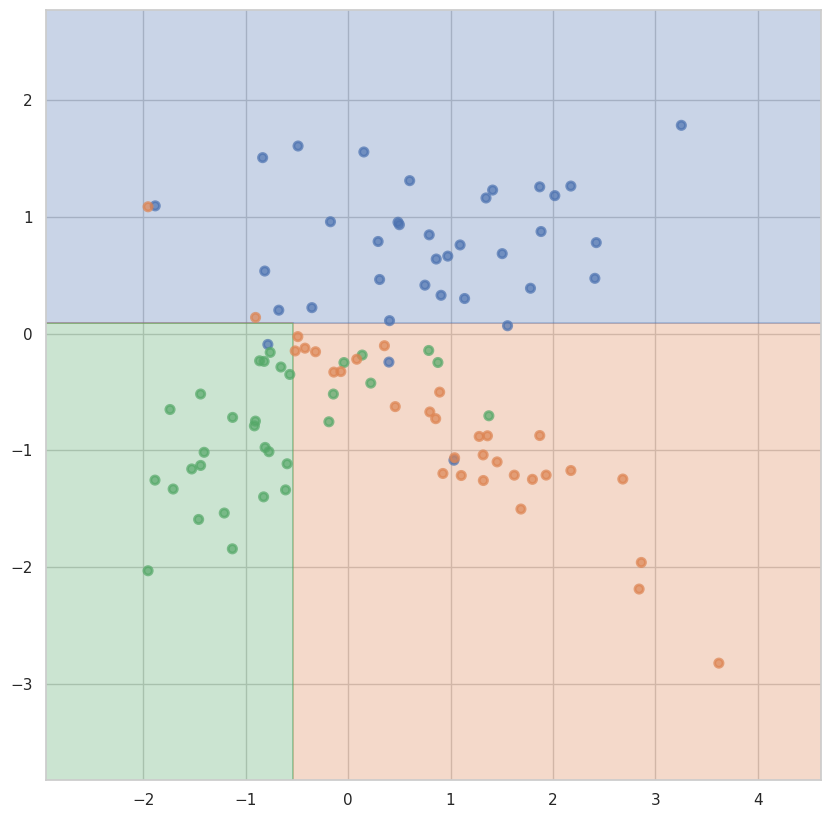

На обучающей для max_depth = 2 и min_samples_leaf = 3: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 3: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 4:


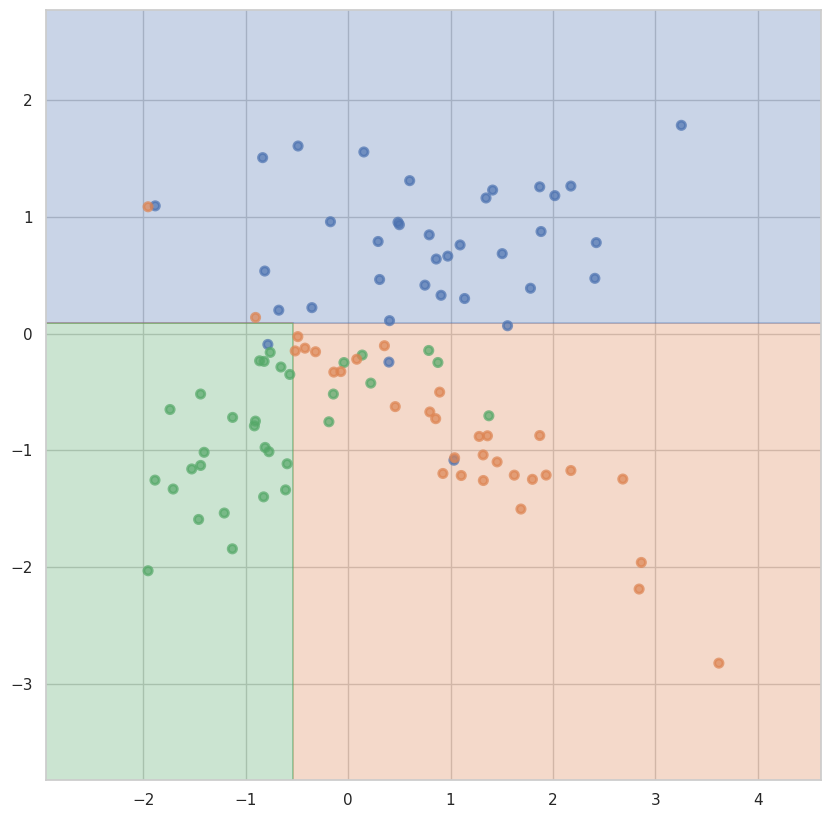

На обучающей для max_depth = 2 и min_samples_leaf = 4: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 4: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 5:


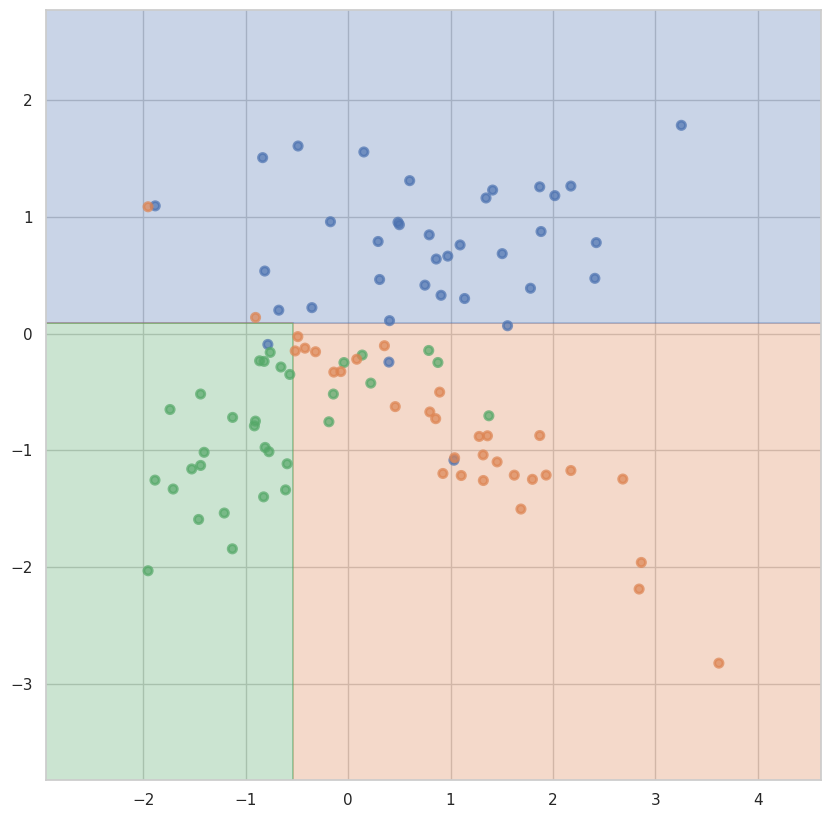

На обучающей для max_depth = 2 и min_samples_leaf = 5: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 5: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 6:


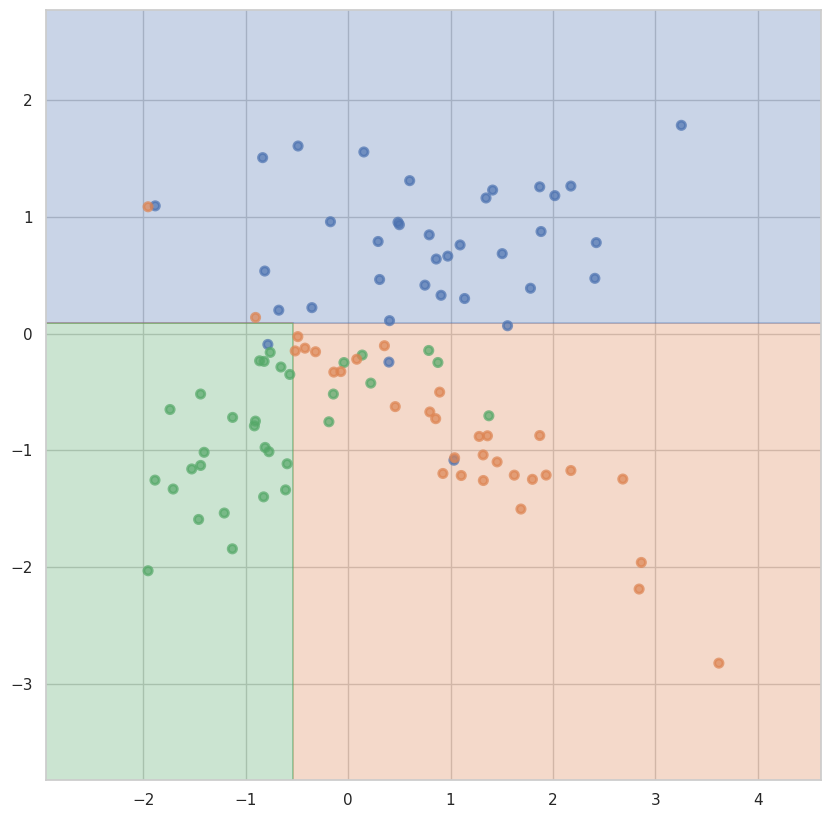

На обучающей для max_depth = 2 и min_samples_leaf = 6: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 6: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 7:


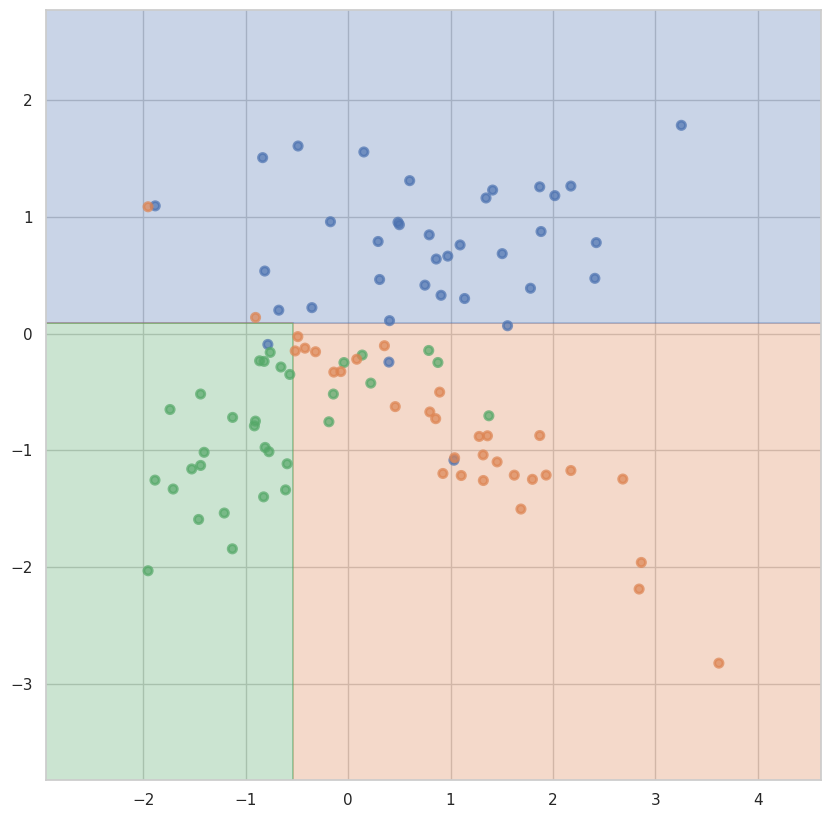

На обучающей для max_depth = 2 и min_samples_leaf = 7: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 7: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 8:


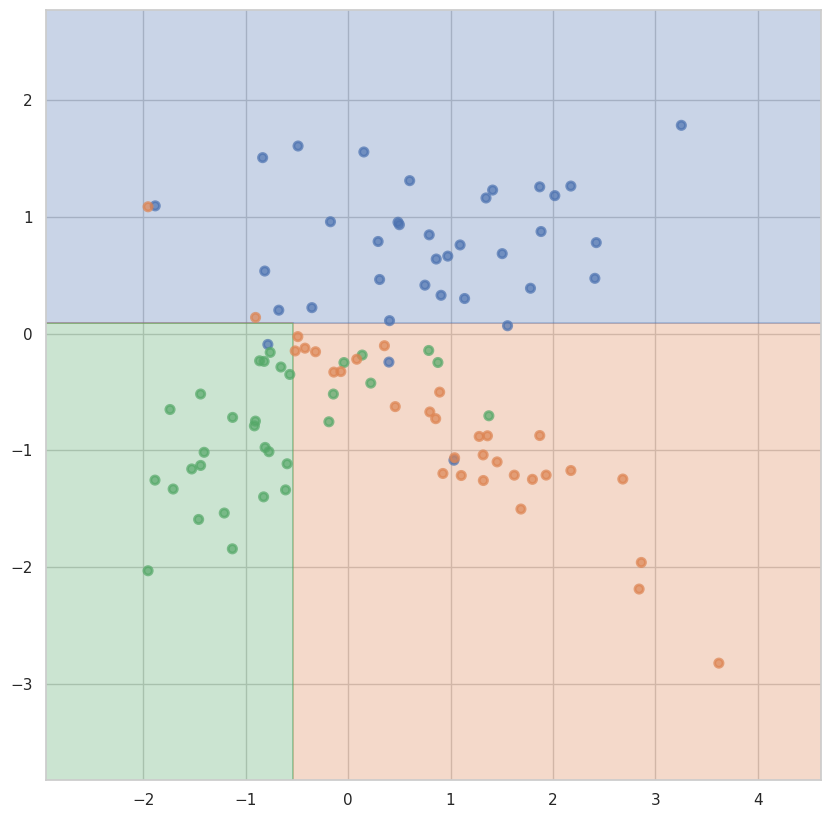

На обучающей для max_depth = 2 и min_samples_leaf = 8: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 8: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 9:


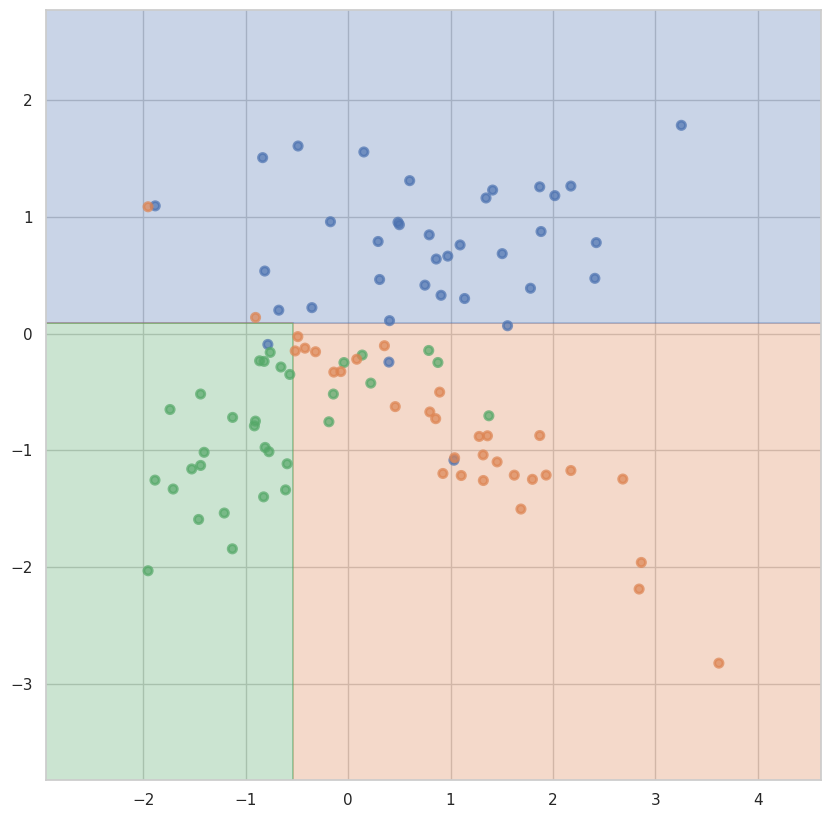

На обучающей для max_depth = 2 и min_samples_leaf = 9: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 9: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 10:


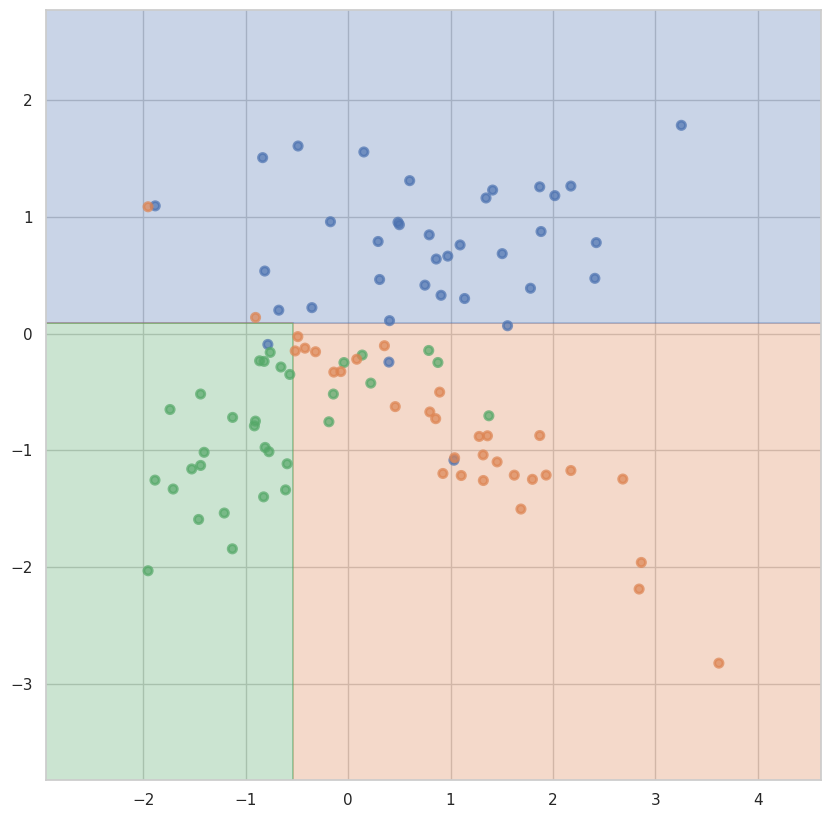

На обучающей для max_depth = 2 и min_samples_leaf = 10: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 10: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 11:


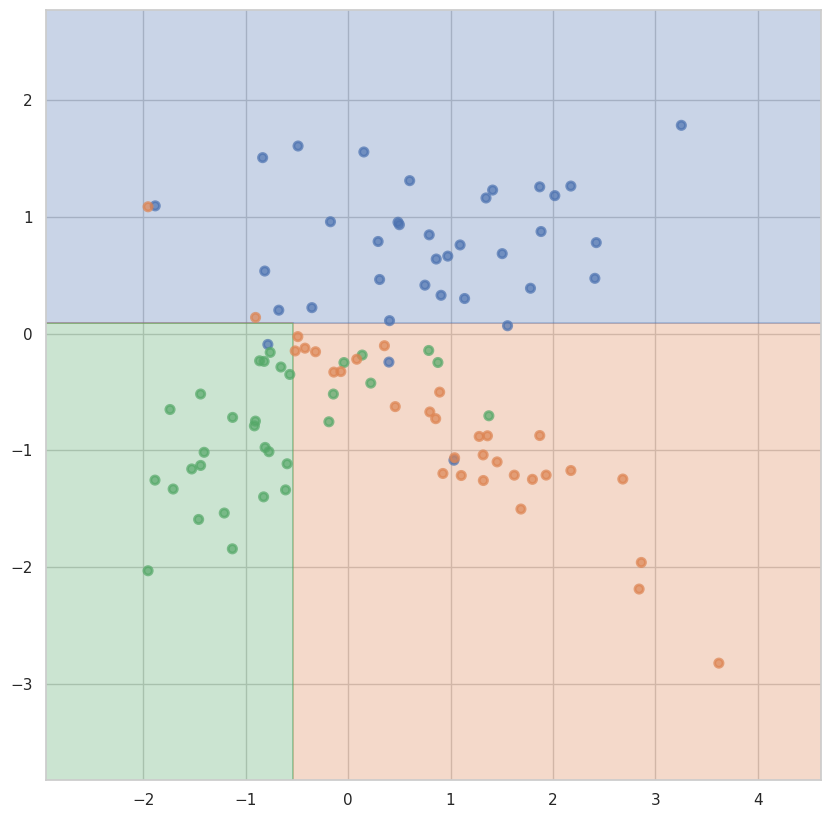

На обучающей для max_depth = 2 и min_samples_leaf = 11: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 11: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 12:


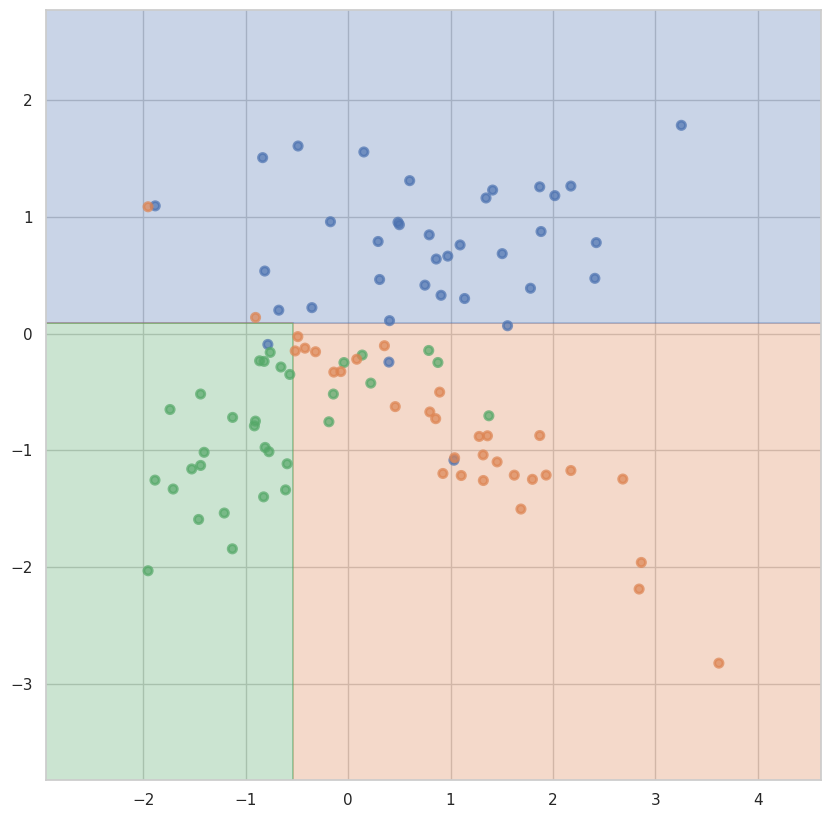

На обучающей для max_depth = 2 и min_samples_leaf = 12: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 12: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 13:


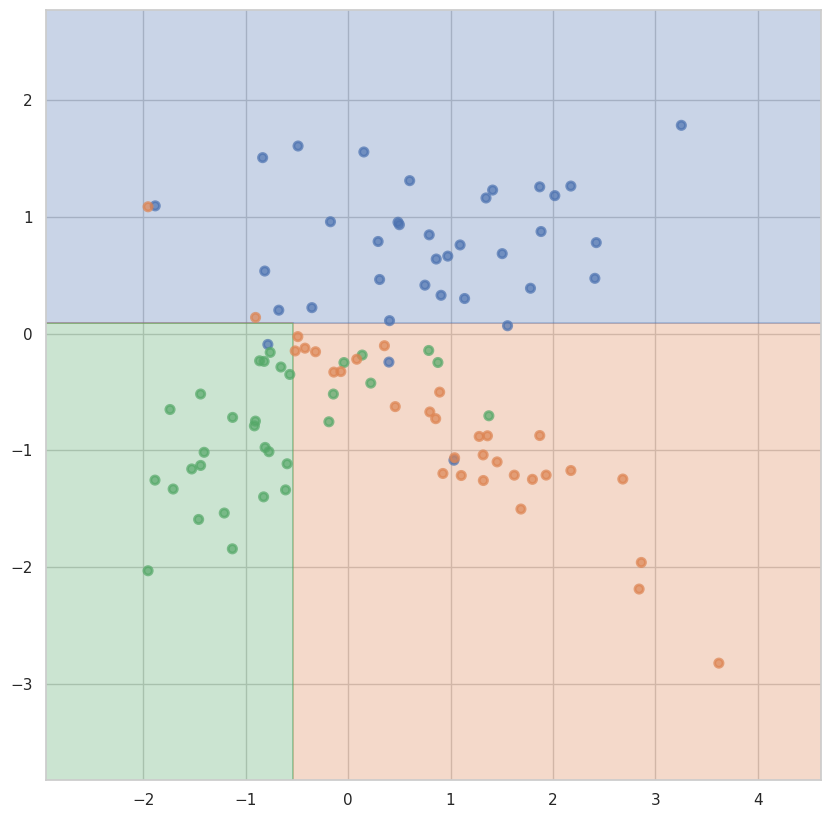

На обучающей для max_depth = 2 и min_samples_leaf = 13: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 13: 0.75
Разделяющая поверхность для max_depth = 2 и min_samples_leaf = 14:


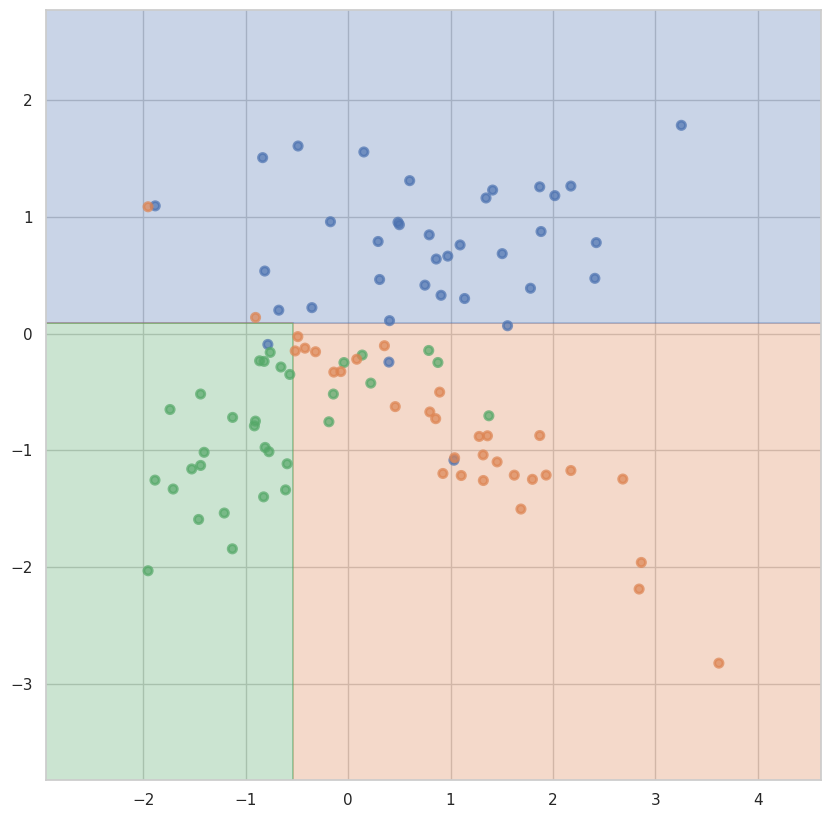

На обучающей для max_depth = 2 и min_samples_leaf = 14: 0.8875
На тестовой для max_depth = 2 и min_samples_leaf = 14: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 1:


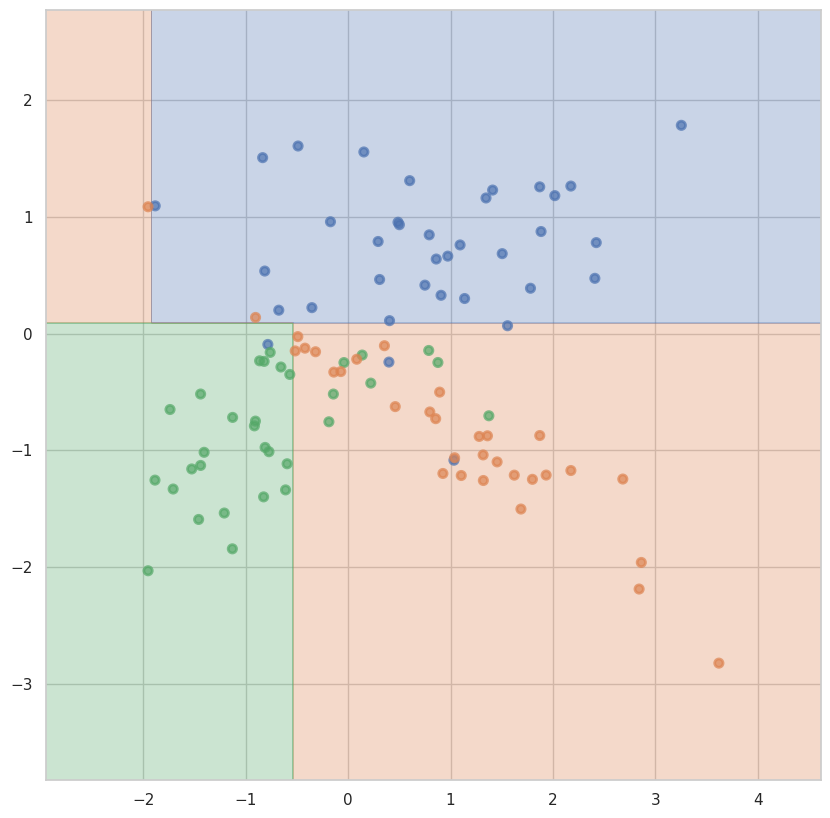

На обучающей для max_depth = 3 и min_samples_leaf = 1: 0.9
На тестовой для max_depth = 3 и min_samples_leaf = 1: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 2:


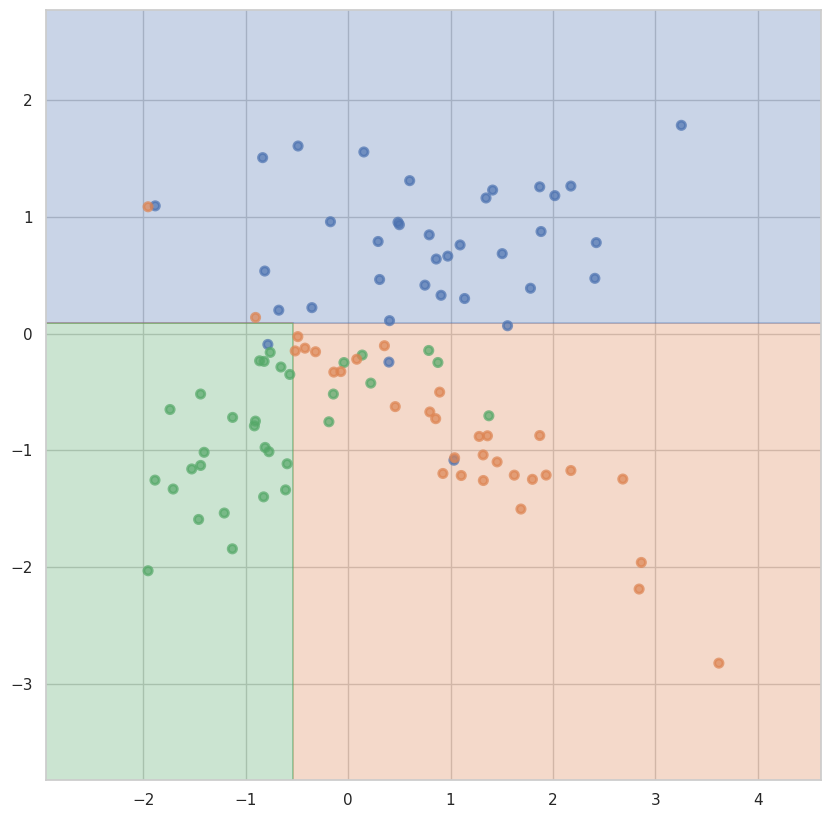

На обучающей для max_depth = 3 и min_samples_leaf = 2: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 2: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 3:


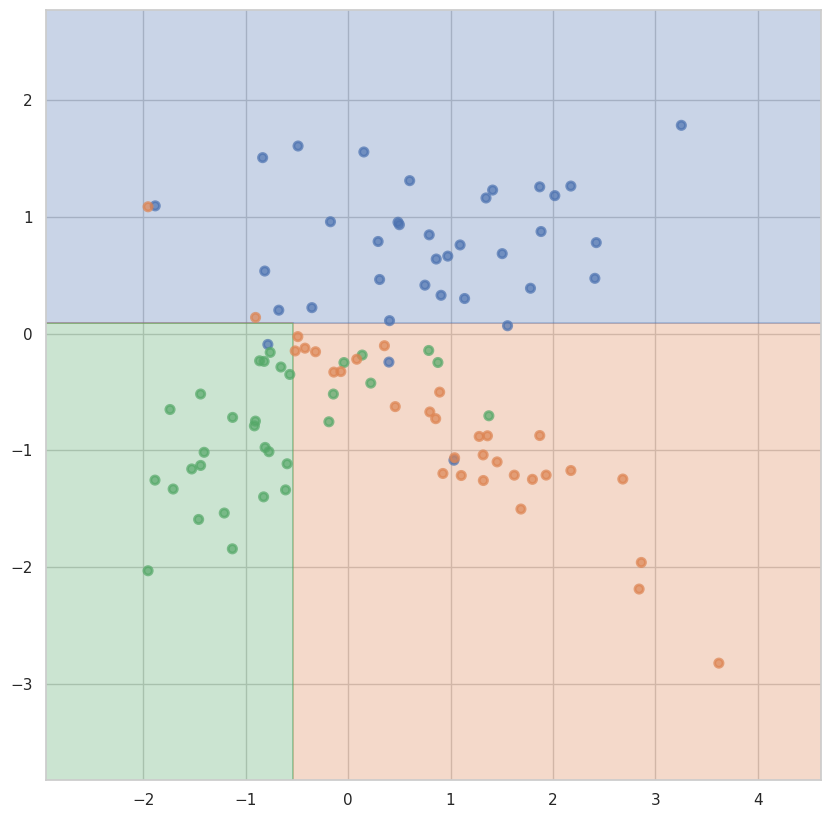

На обучающей для max_depth = 3 и min_samples_leaf = 3: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 3: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 4:


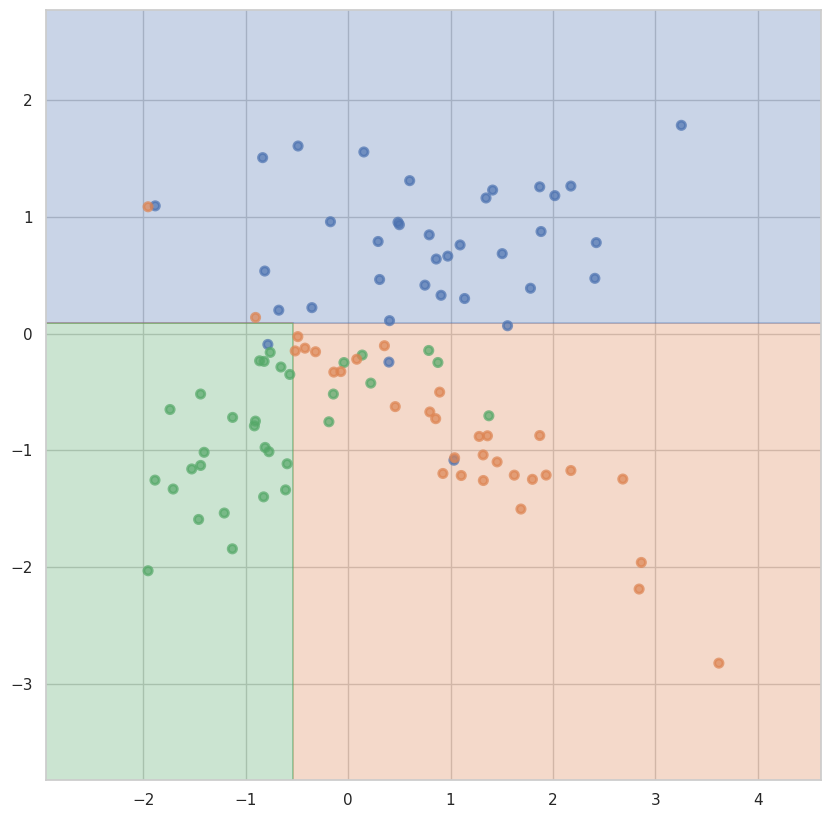

На обучающей для max_depth = 3 и min_samples_leaf = 4: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 4: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 5:


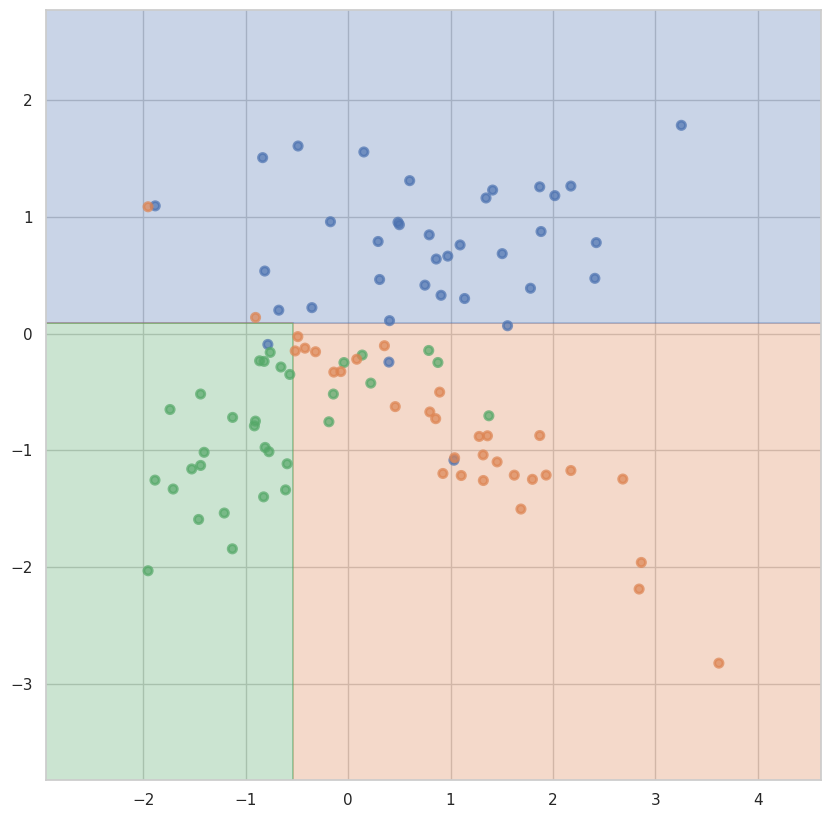

На обучающей для max_depth = 3 и min_samples_leaf = 5: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 5: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 6:


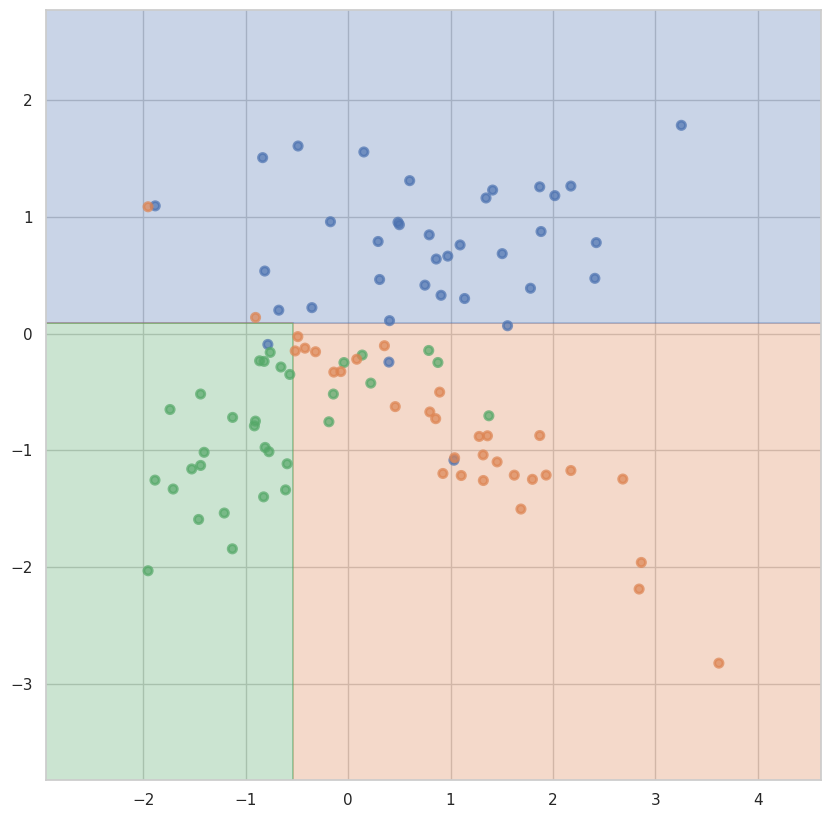

На обучающей для max_depth = 3 и min_samples_leaf = 6: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 6: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 7:


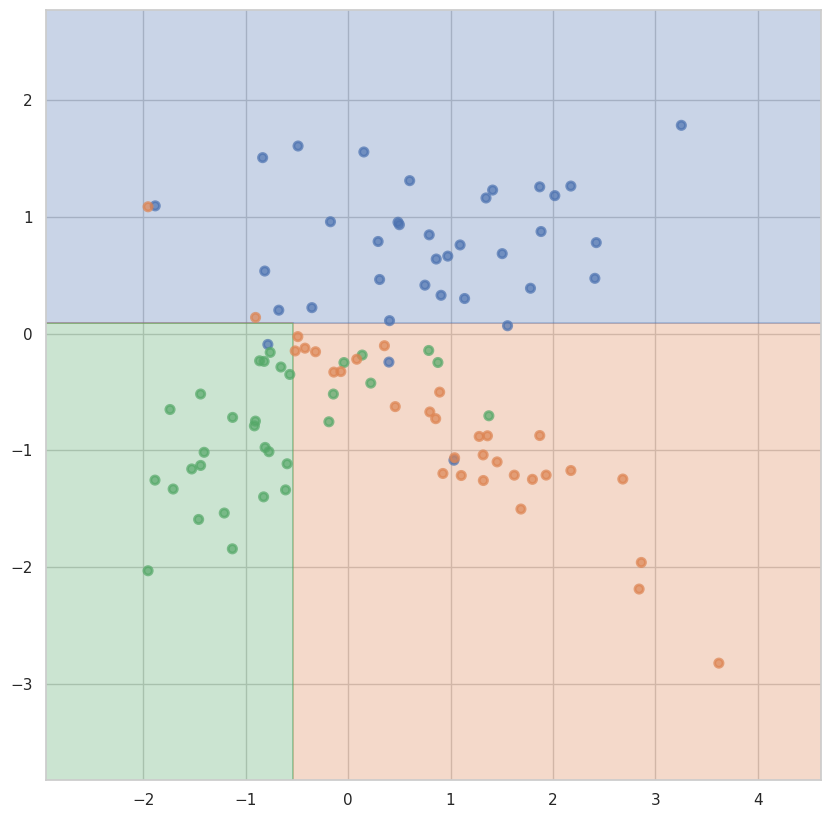

На обучающей для max_depth = 3 и min_samples_leaf = 7: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 7: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 8:


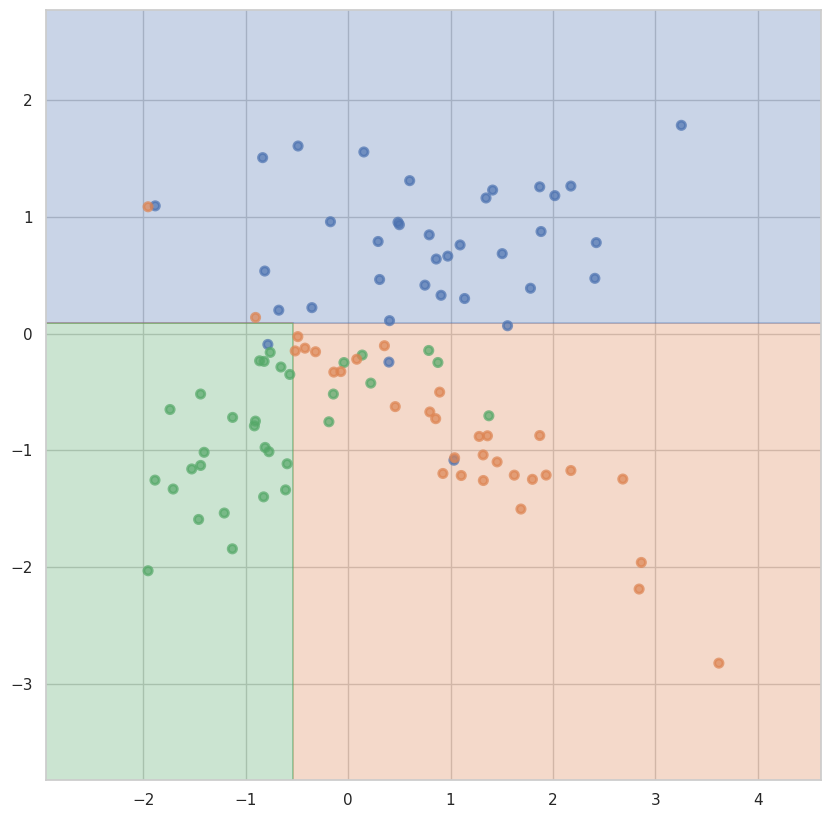

На обучающей для max_depth = 3 и min_samples_leaf = 8: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 8: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 9:


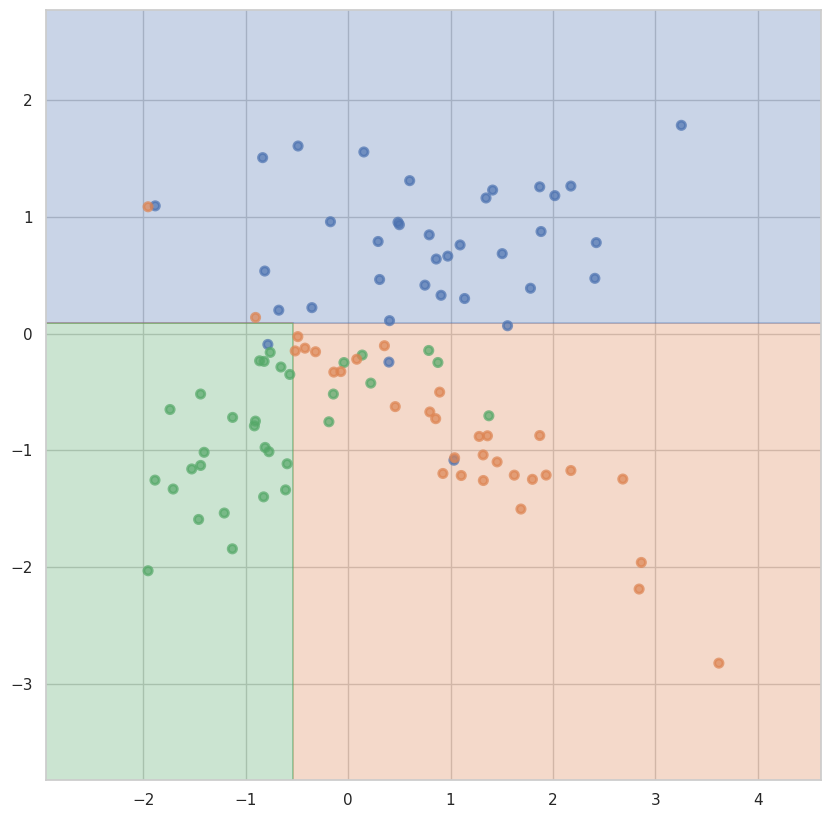

На обучающей для max_depth = 3 и min_samples_leaf = 9: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 9: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 10:


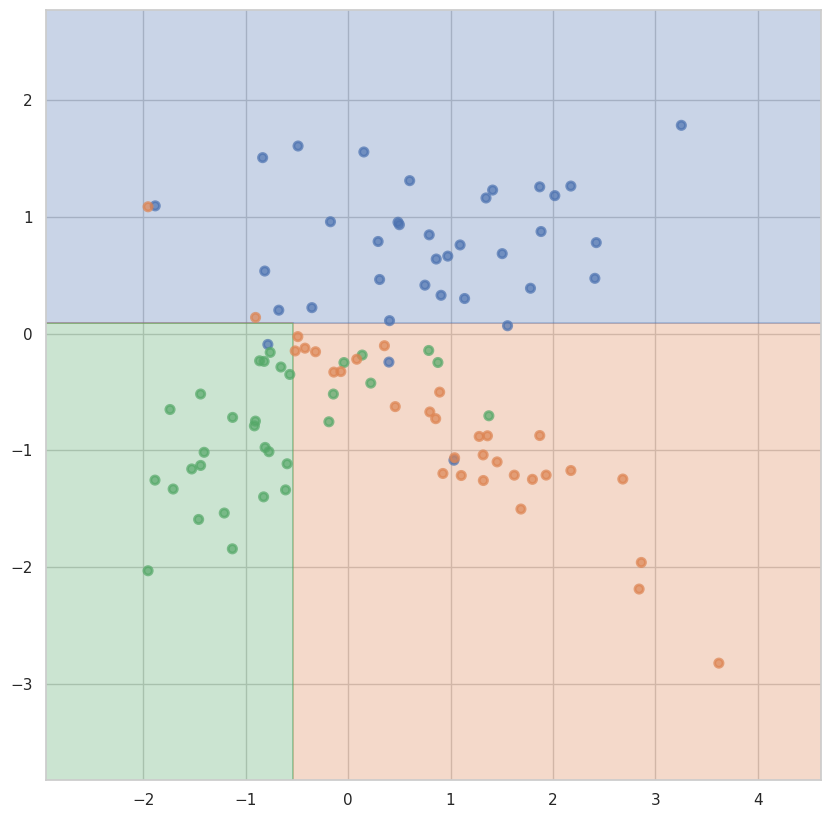

На обучающей для max_depth = 3 и min_samples_leaf = 10: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 10: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 11:


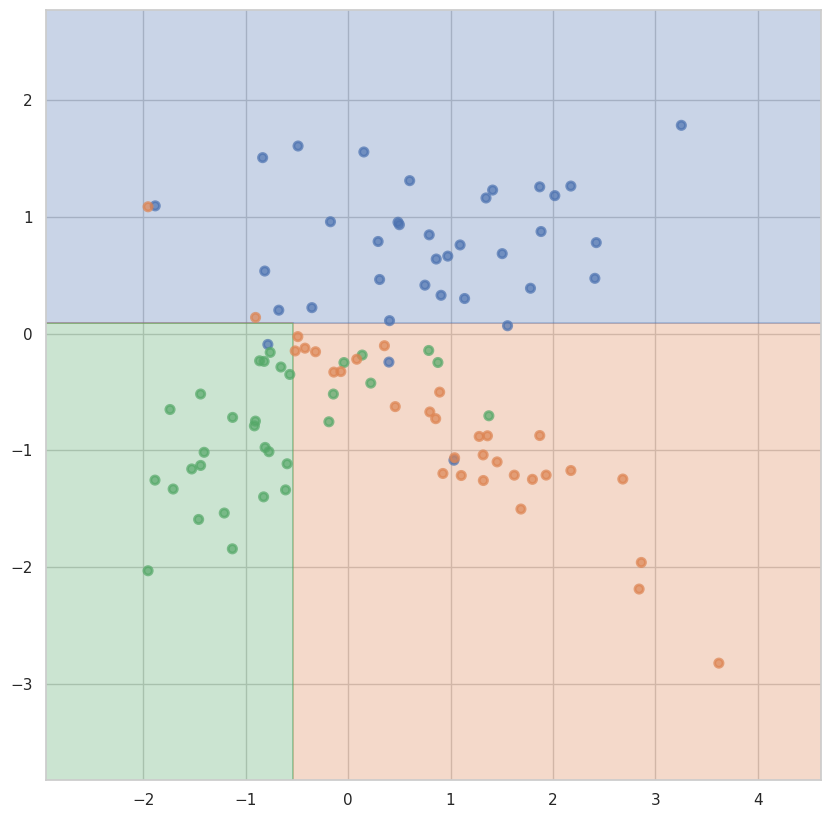

На обучающей для max_depth = 3 и min_samples_leaf = 11: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 11: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 12:


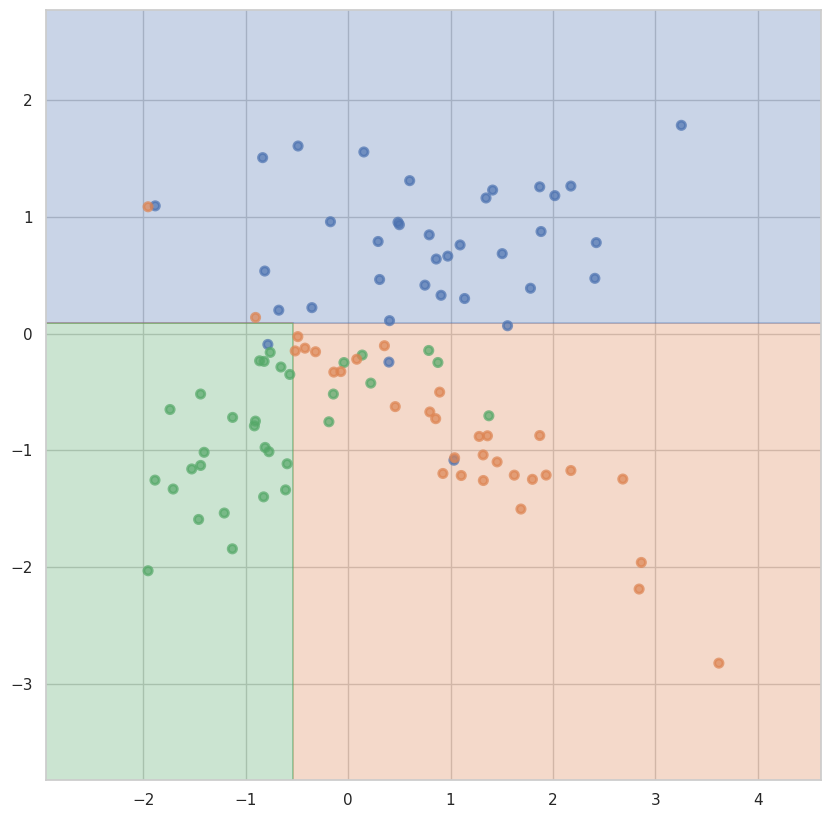

На обучающей для max_depth = 3 и min_samples_leaf = 12: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 12: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 13:


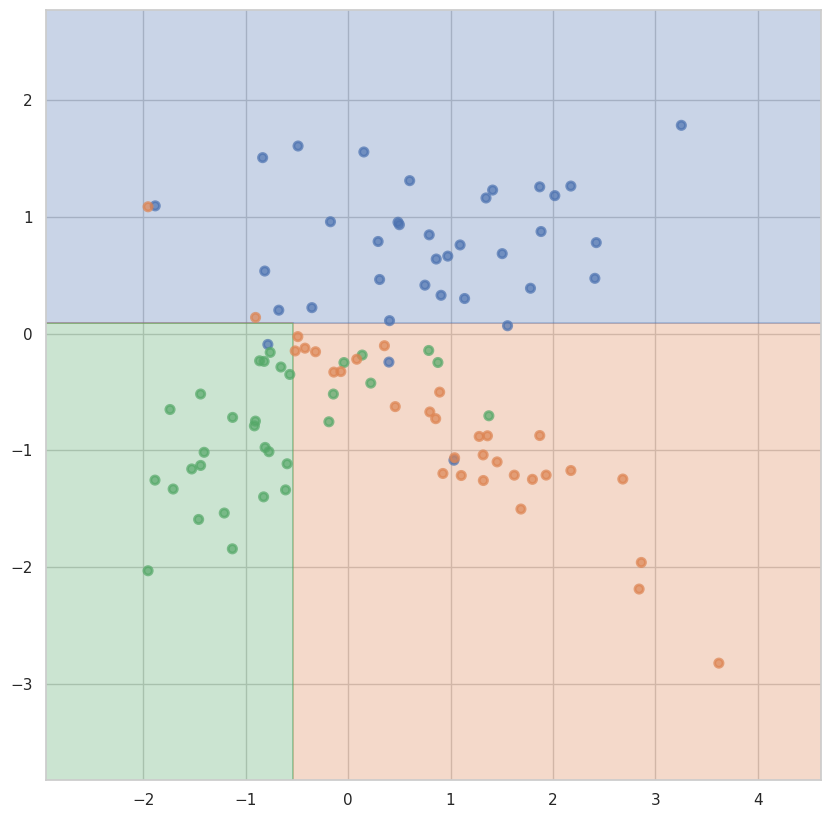

На обучающей для max_depth = 3 и min_samples_leaf = 13: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 13: 0.75
Разделяющая поверхность для max_depth = 3 и min_samples_leaf = 14:


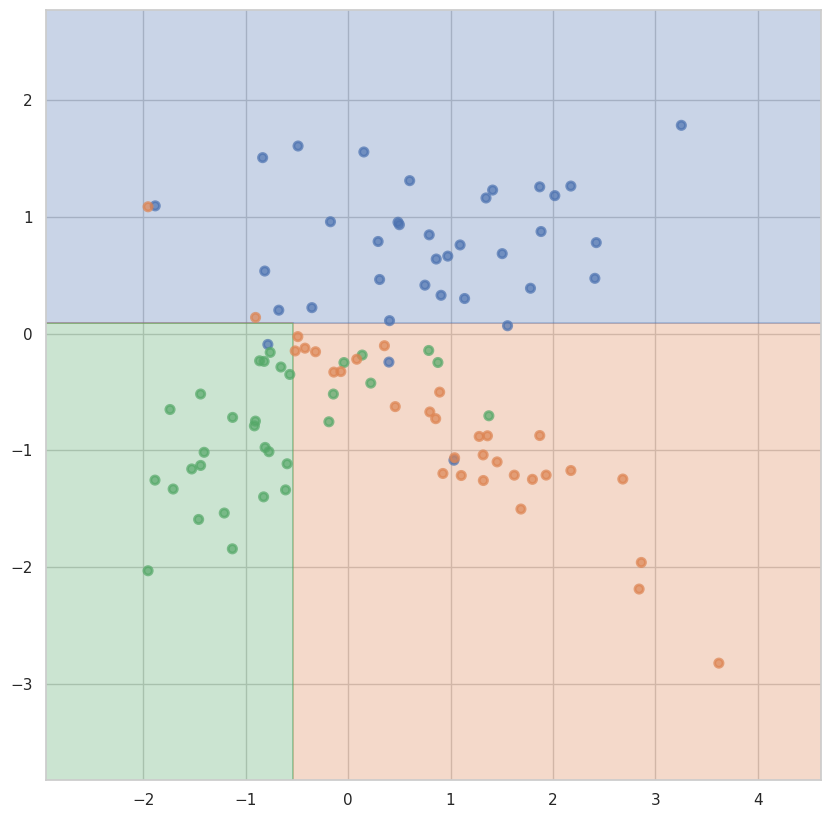

На обучающей для max_depth = 3 и min_samples_leaf = 14: 0.8875
На тестовой для max_depth = 3 и min_samples_leaf = 14: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 1:


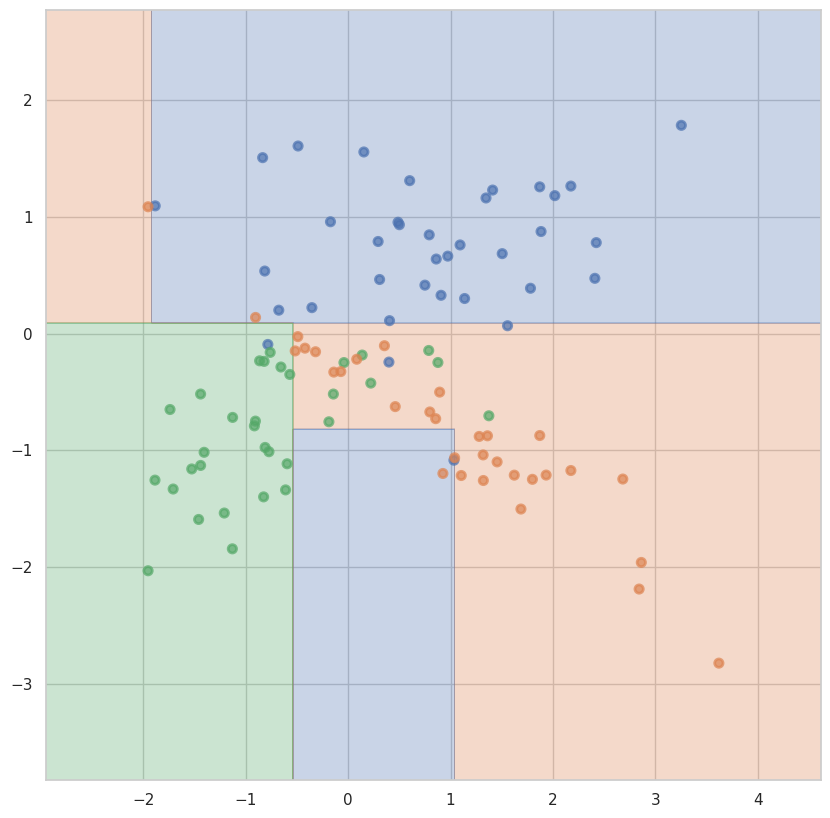

На обучающей для max_depth = 4 и min_samples_leaf = 1: 0.9125
На тестовой для max_depth = 4 и min_samples_leaf = 1: 0.7
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 2:


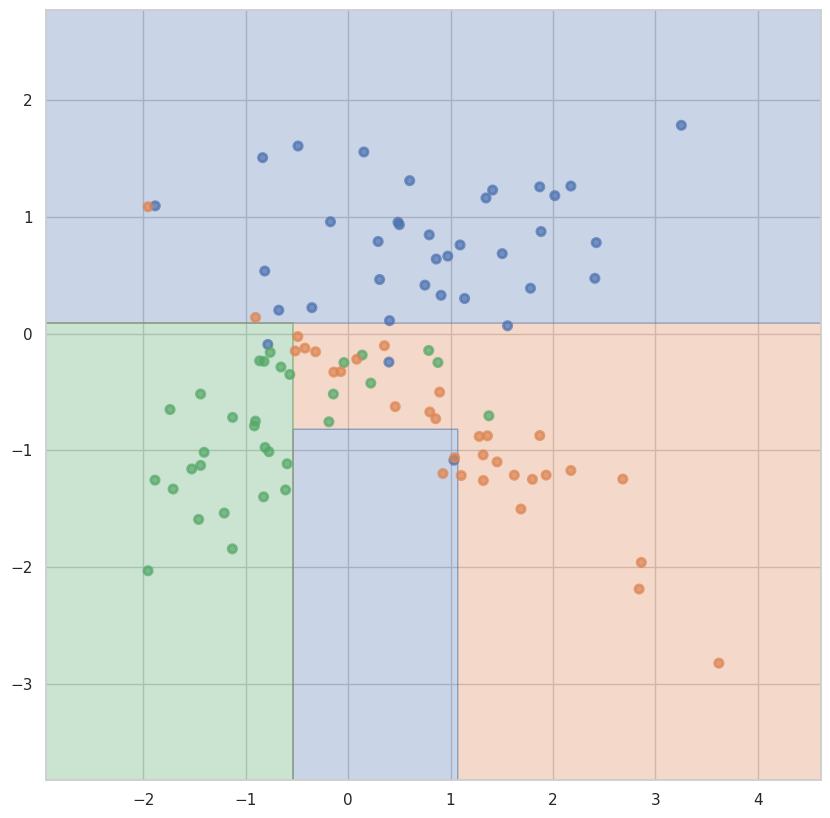

На обучающей для max_depth = 4 и min_samples_leaf = 2: 0.8875
На тестовой для max_depth = 4 и min_samples_leaf = 2: 0.7
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 3:


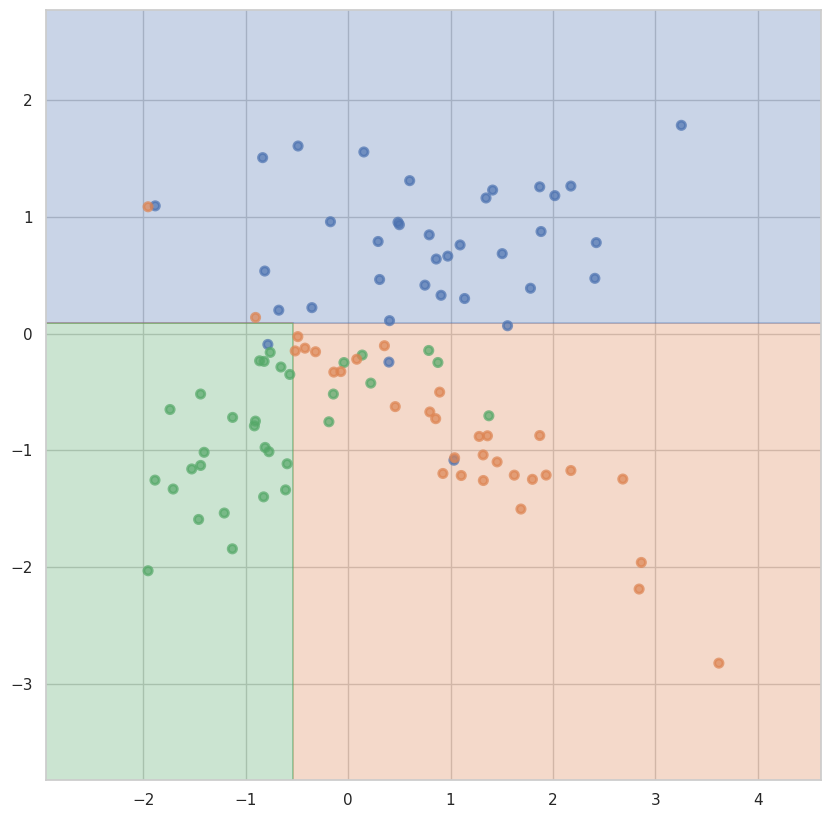

На обучающей для max_depth = 4 и min_samples_leaf = 3: 0.8875
На тестовой для max_depth = 4 и min_samples_leaf = 3: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 4:


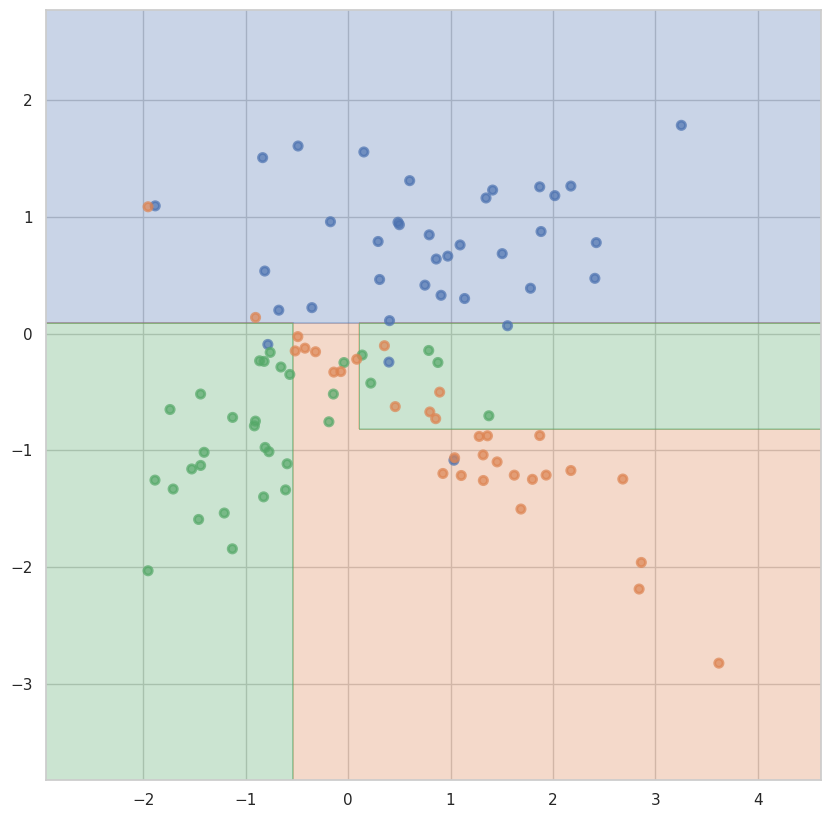

На обучающей для max_depth = 4 и min_samples_leaf = 4: 0.9
На тестовой для max_depth = 4 и min_samples_leaf = 4: 0.7
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 5:


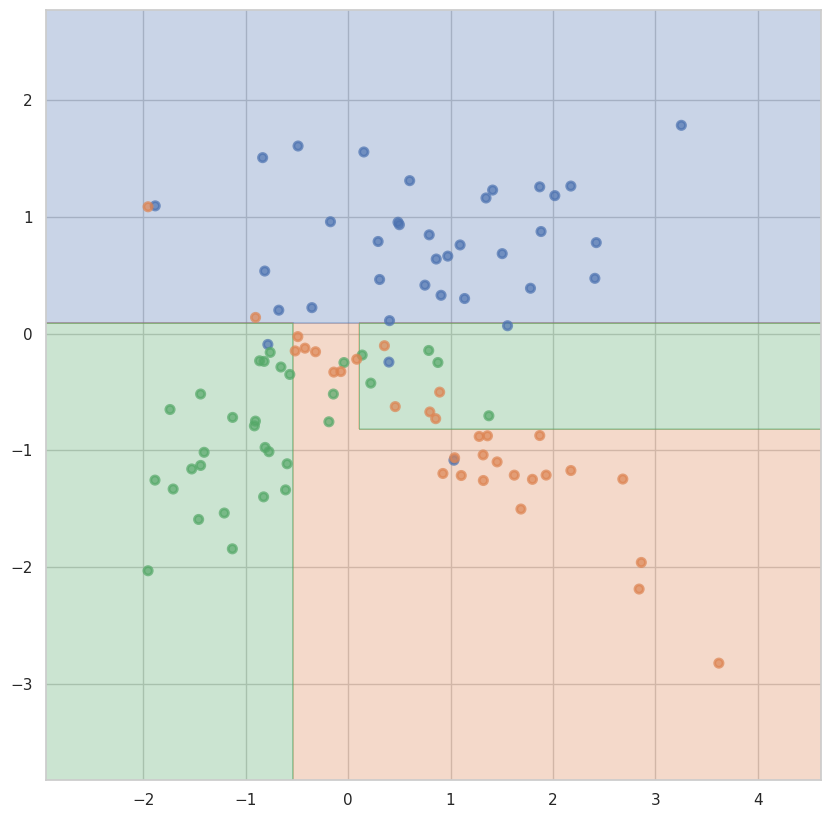

На обучающей для max_depth = 4 и min_samples_leaf = 5: 0.9
На тестовой для max_depth = 4 и min_samples_leaf = 5: 0.7
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 6:


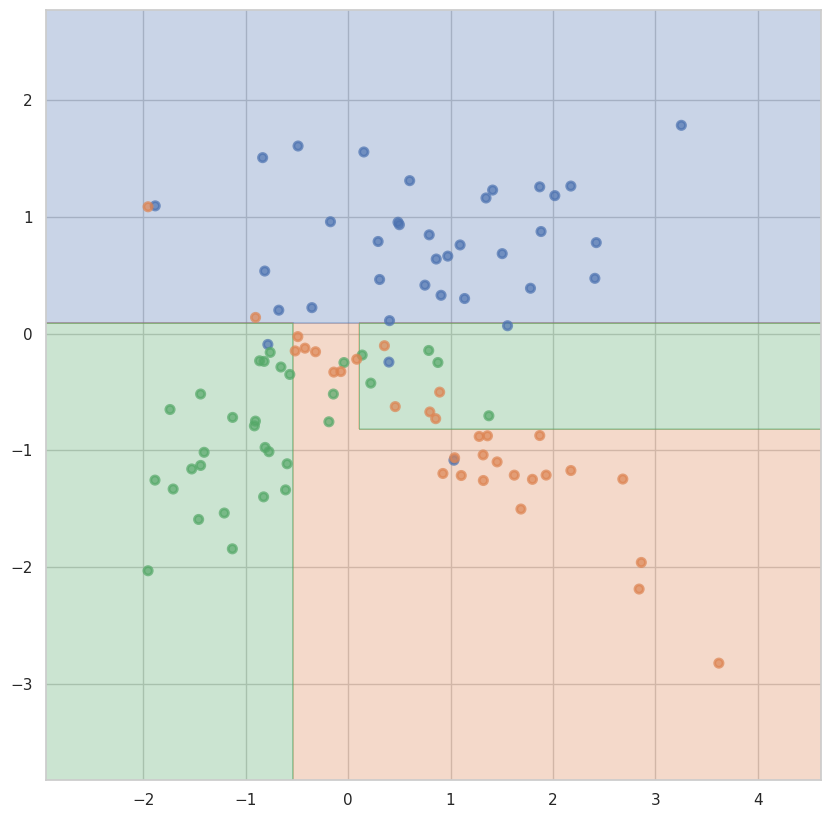

На обучающей для max_depth = 4 и min_samples_leaf = 6: 0.9
На тестовой для max_depth = 4 и min_samples_leaf = 6: 0.7
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 7:


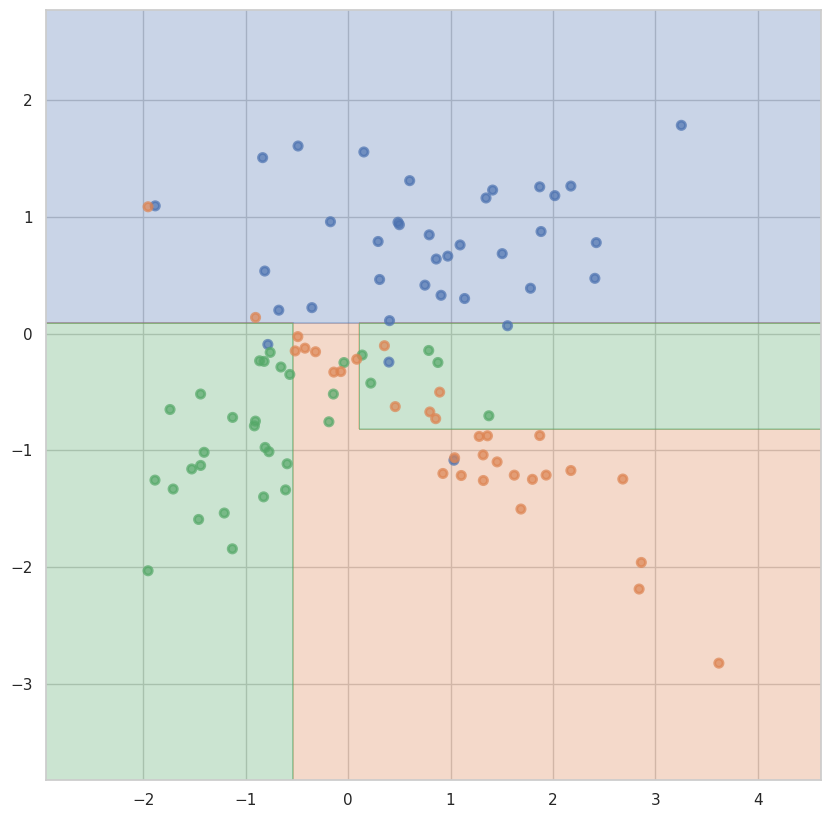

На обучающей для max_depth = 4 и min_samples_leaf = 7: 0.9
На тестовой для max_depth = 4 и min_samples_leaf = 7: 0.7
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 8:


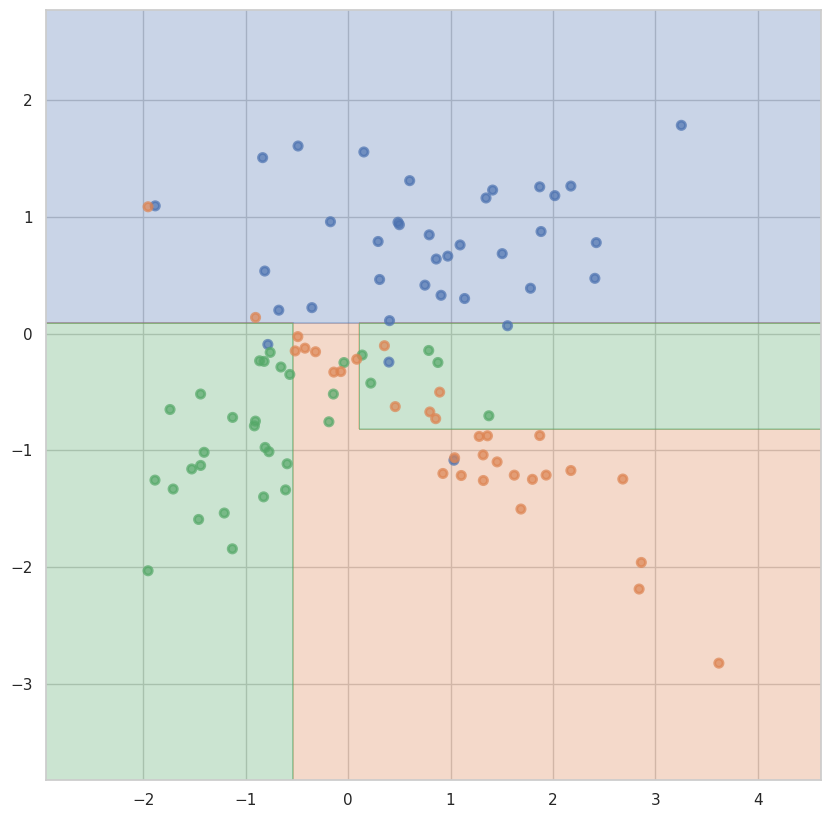

На обучающей для max_depth = 4 и min_samples_leaf = 8: 0.9
На тестовой для max_depth = 4 и min_samples_leaf = 8: 0.7
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 9:


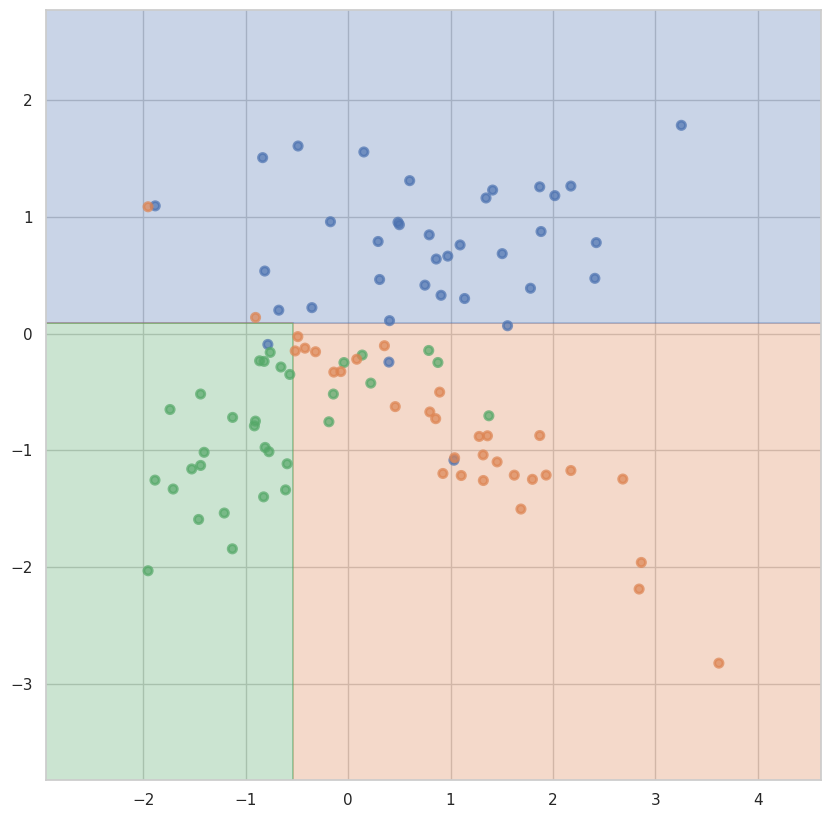

На обучающей для max_depth = 4 и min_samples_leaf = 9: 0.8875
На тестовой для max_depth = 4 и min_samples_leaf = 9: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 10:


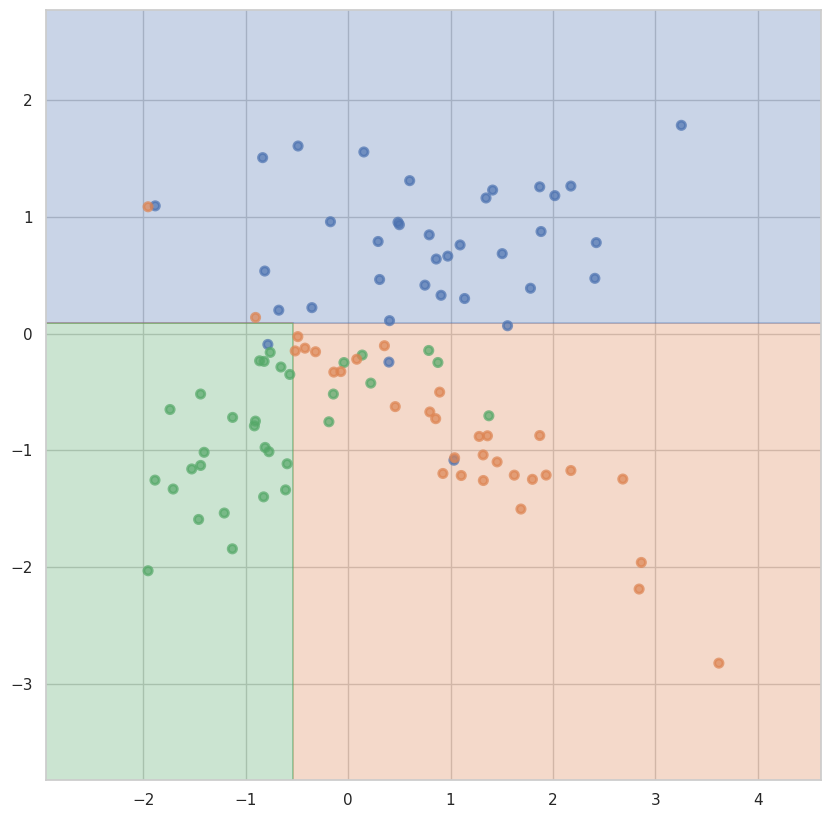

На обучающей для max_depth = 4 и min_samples_leaf = 10: 0.8875
На тестовой для max_depth = 4 и min_samples_leaf = 10: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 11:


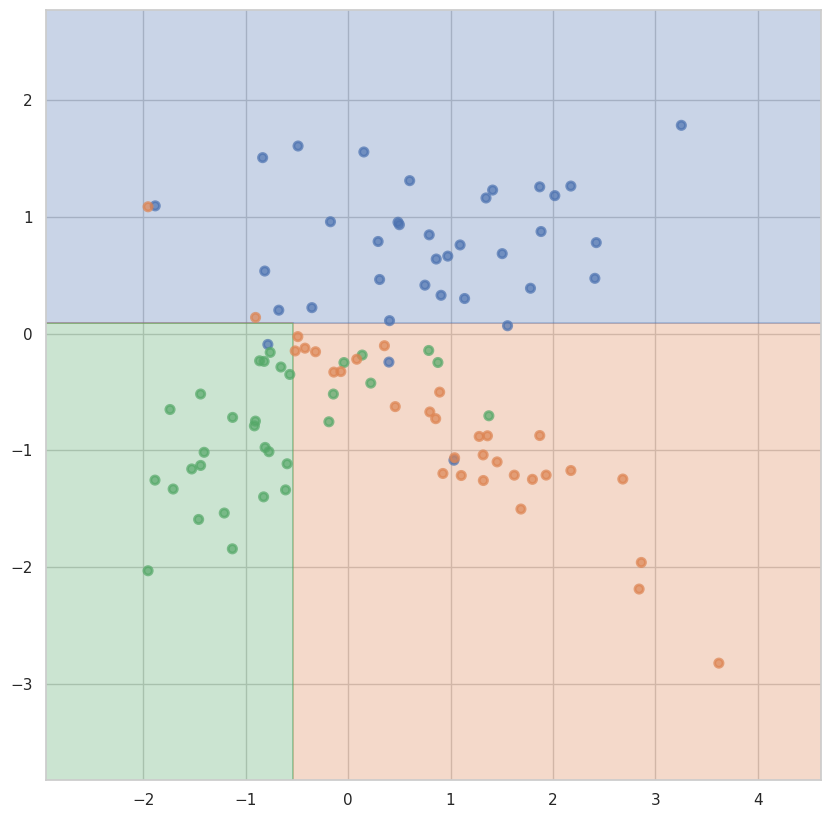

На обучающей для max_depth = 4 и min_samples_leaf = 11: 0.8875
На тестовой для max_depth = 4 и min_samples_leaf = 11: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 12:


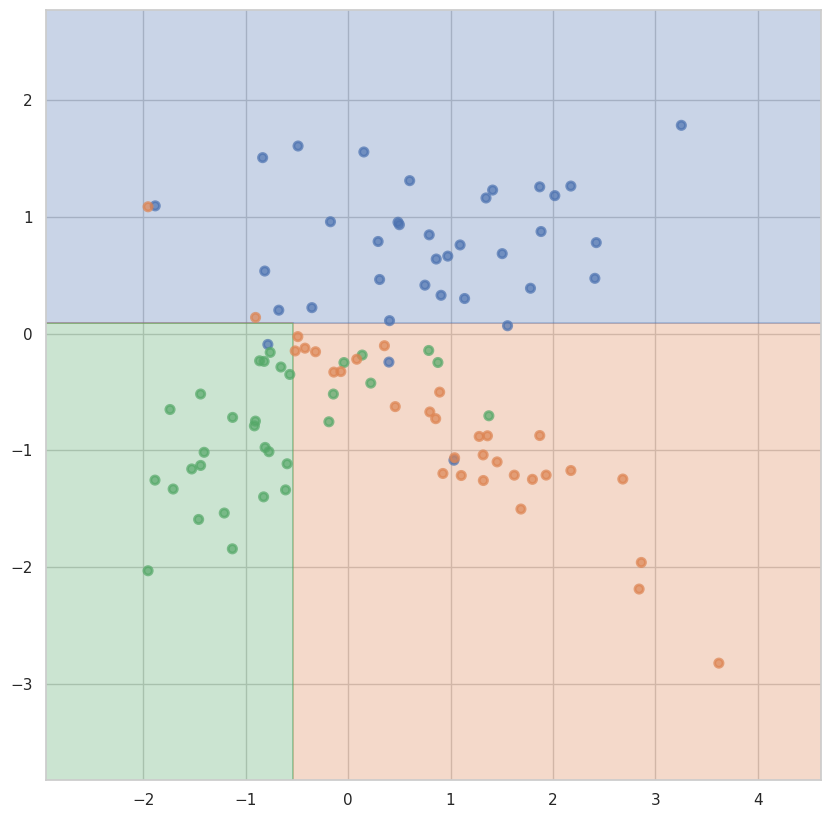

На обучающей для max_depth = 4 и min_samples_leaf = 12: 0.8875
На тестовой для max_depth = 4 и min_samples_leaf = 12: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 13:


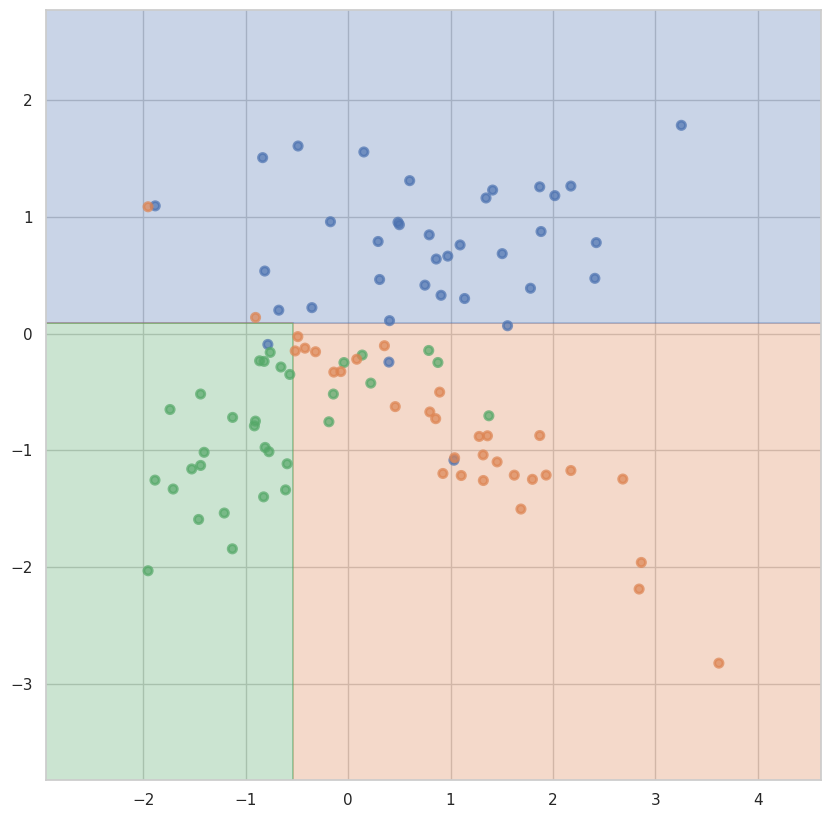

На обучающей для max_depth = 4 и min_samples_leaf = 13: 0.8875
На тестовой для max_depth = 4 и min_samples_leaf = 13: 0.75
Разделяющая поверхность для max_depth = 4 и min_samples_leaf = 14:


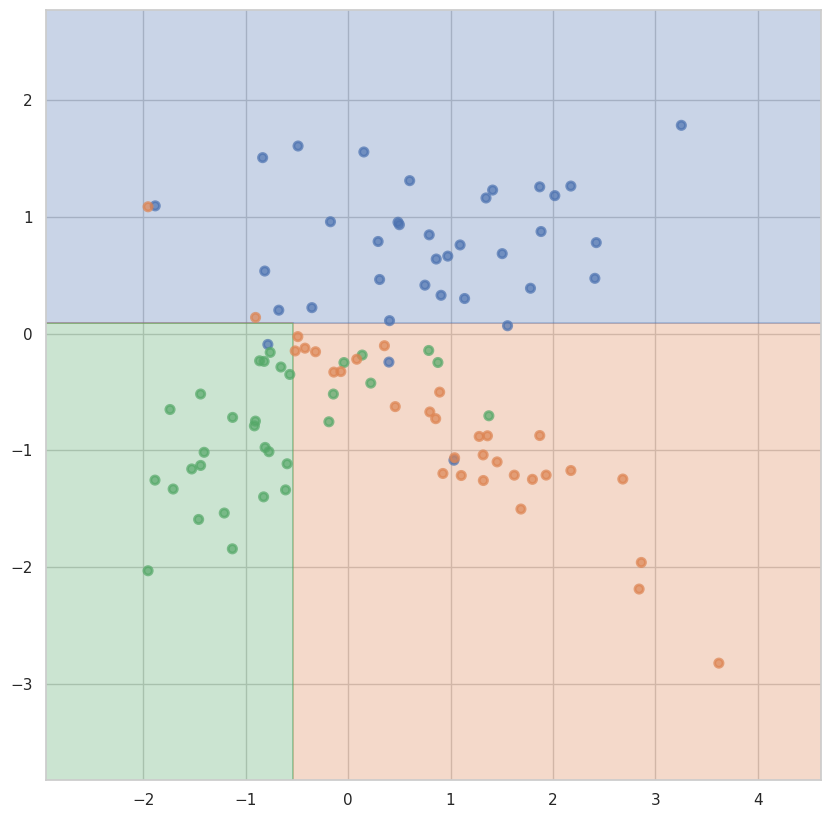

На обучающей для max_depth = 4 и min_samples_leaf = 14: 0.8875
На тестовой для max_depth = 4 и min_samples_leaf = 14: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 1:


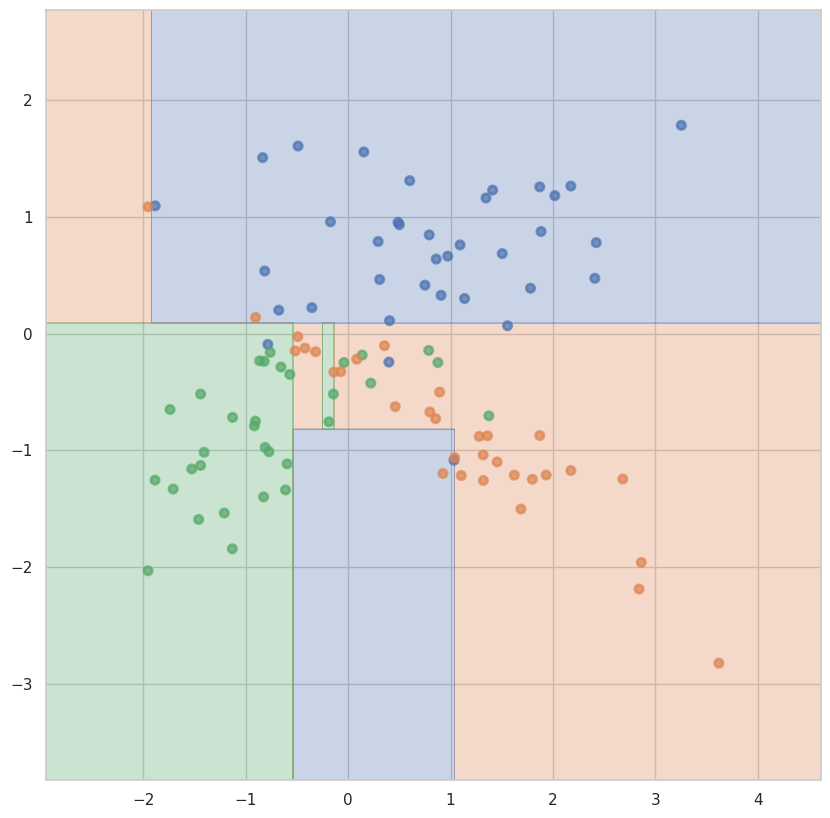

На обучающей для max_depth = 5 и min_samples_leaf = 1: 0.9375
На тестовой для max_depth = 5 и min_samples_leaf = 1: 0.7
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 2:


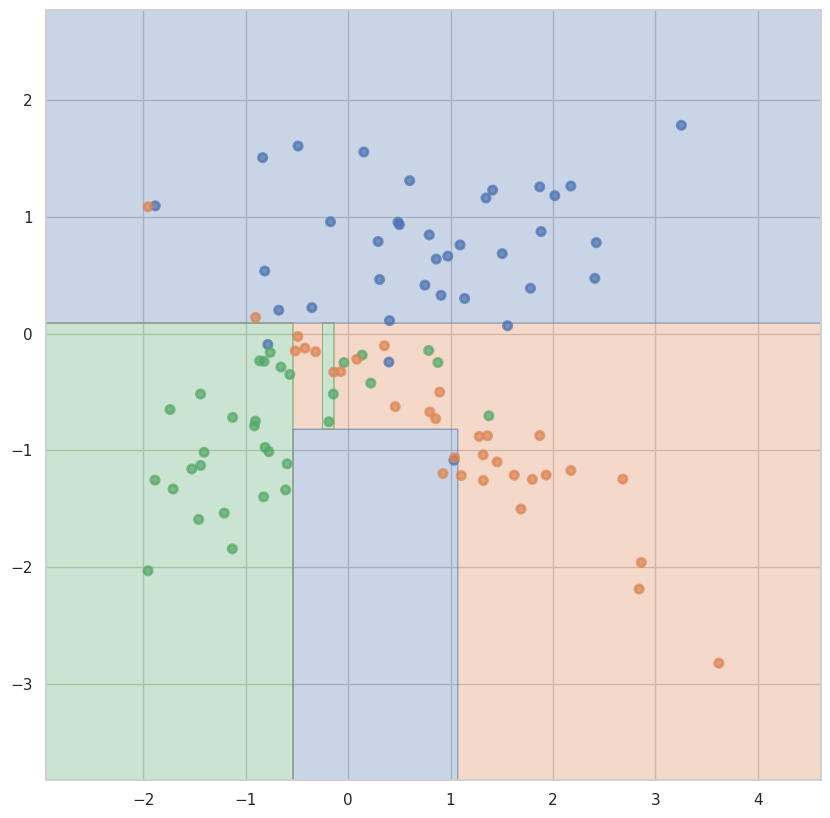

На обучающей для max_depth = 5 и min_samples_leaf = 2: 0.9125
На тестовой для max_depth = 5 и min_samples_leaf = 2: 0.7
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 3:


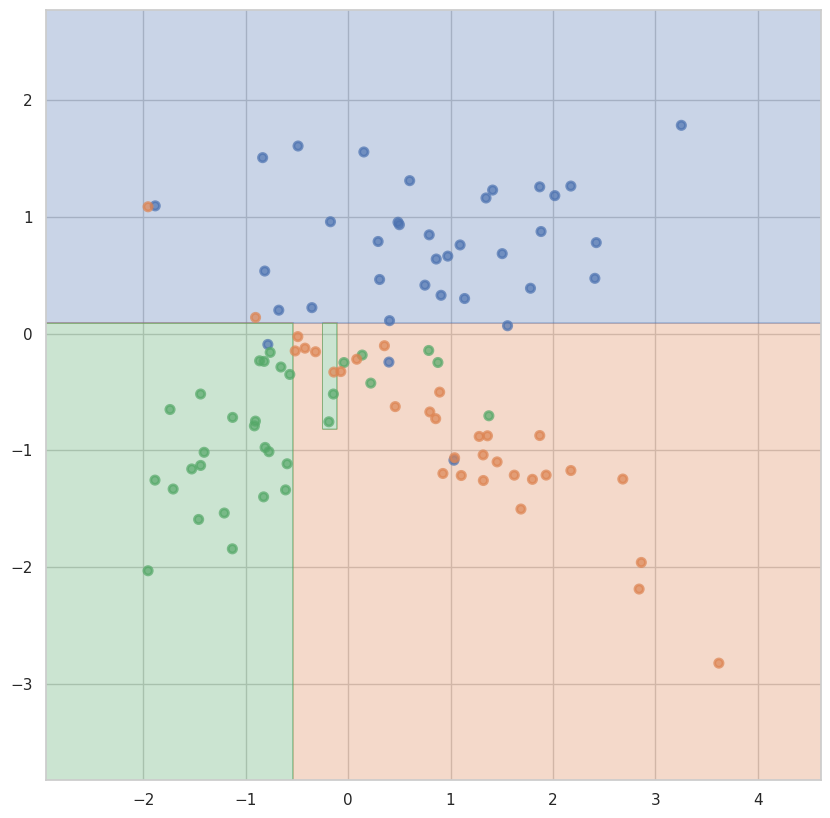

На обучающей для max_depth = 5 и min_samples_leaf = 3: 0.9
На тестовой для max_depth = 5 и min_samples_leaf = 3: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 4:


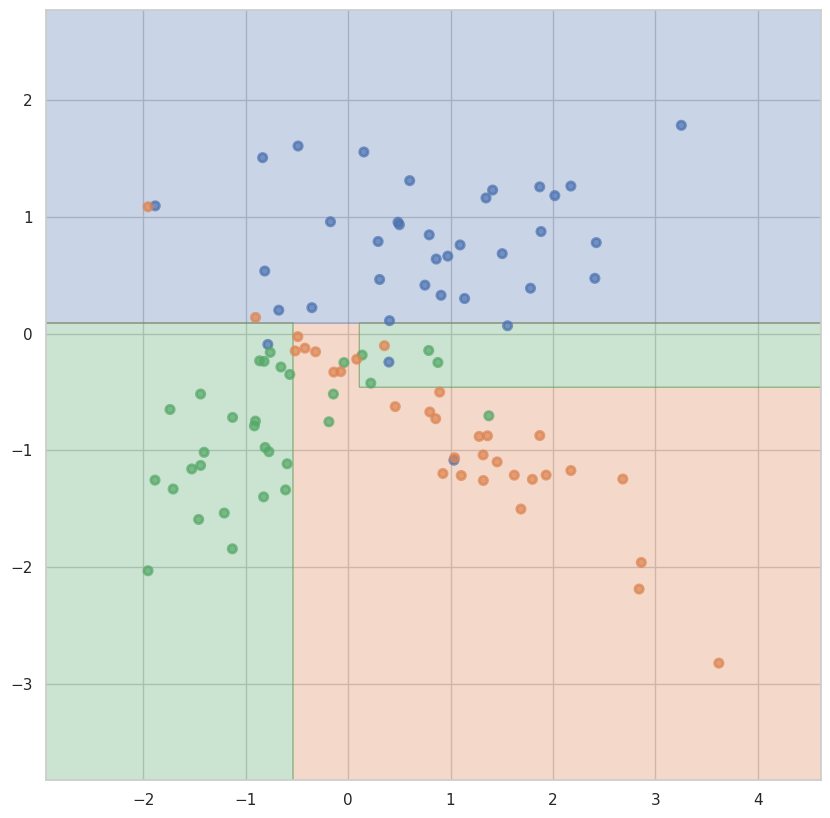

На обучающей для max_depth = 5 и min_samples_leaf = 4: 0.925
На тестовой для max_depth = 5 и min_samples_leaf = 4: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 5:


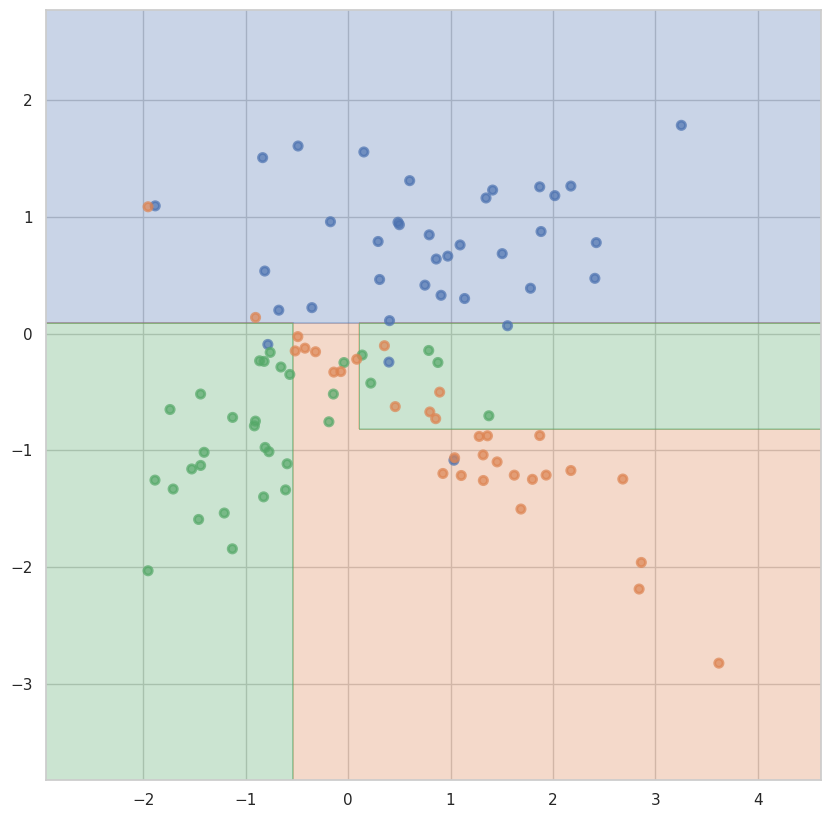

На обучающей для max_depth = 5 и min_samples_leaf = 5: 0.9
На тестовой для max_depth = 5 и min_samples_leaf = 5: 0.7
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 6:


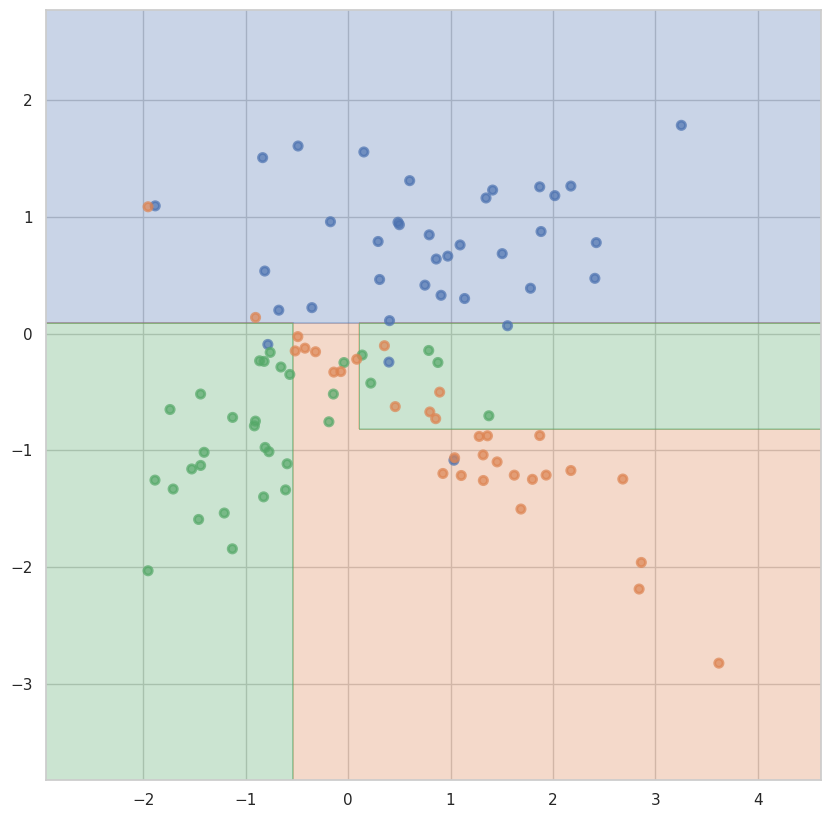

На обучающей для max_depth = 5 и min_samples_leaf = 6: 0.9
На тестовой для max_depth = 5 и min_samples_leaf = 6: 0.7
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 7:


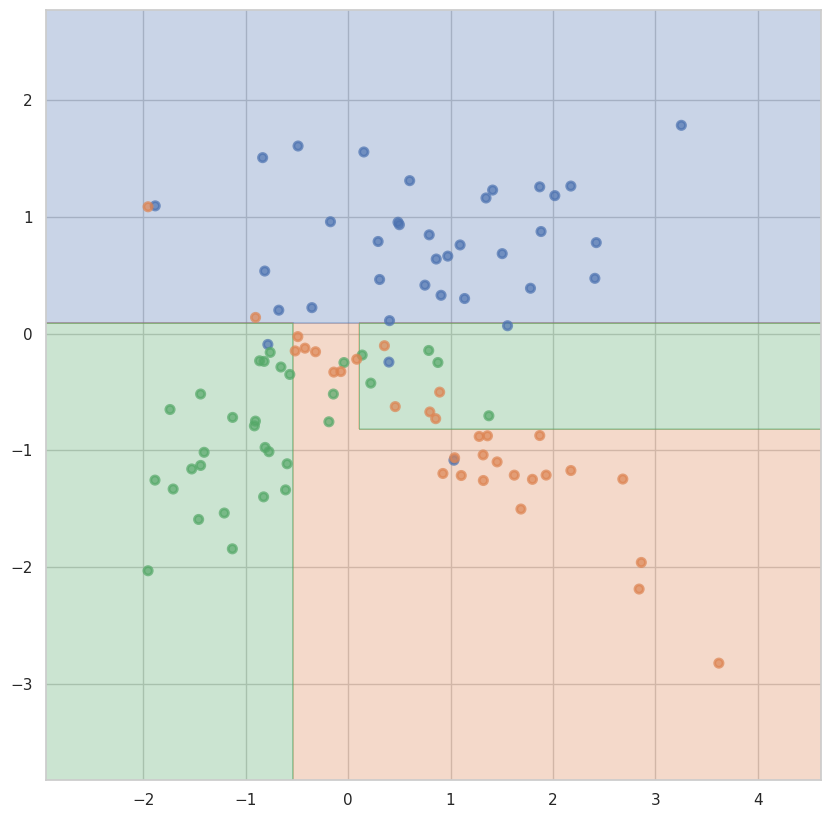

На обучающей для max_depth = 5 и min_samples_leaf = 7: 0.9
На тестовой для max_depth = 5 и min_samples_leaf = 7: 0.7
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 8:


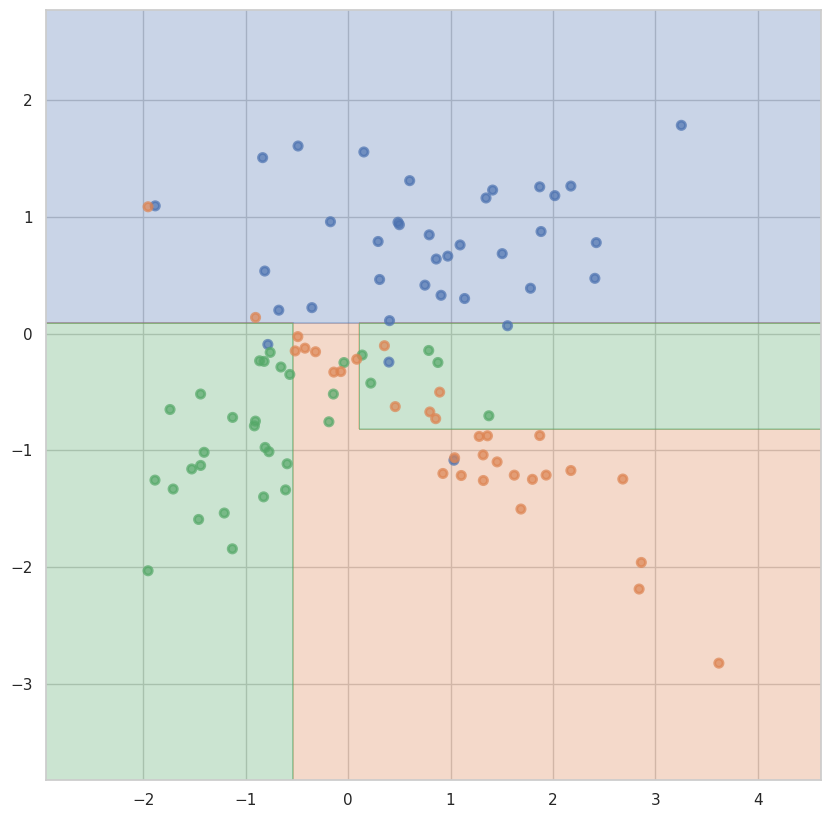

На обучающей для max_depth = 5 и min_samples_leaf = 8: 0.9
На тестовой для max_depth = 5 и min_samples_leaf = 8: 0.7
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 9:


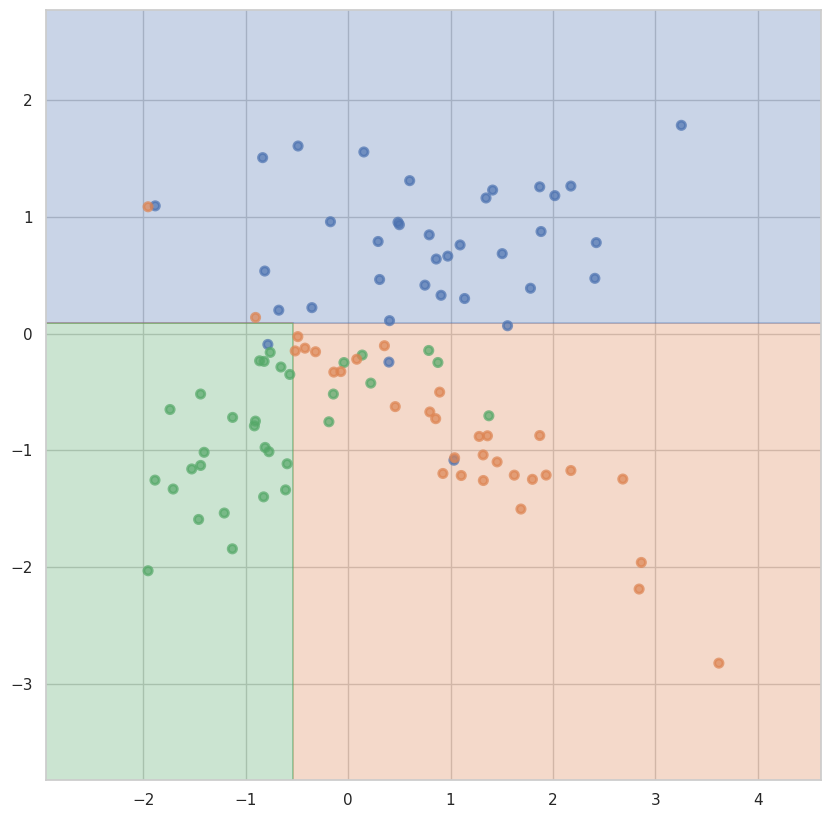

На обучающей для max_depth = 5 и min_samples_leaf = 9: 0.8875
На тестовой для max_depth = 5 и min_samples_leaf = 9: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 10:


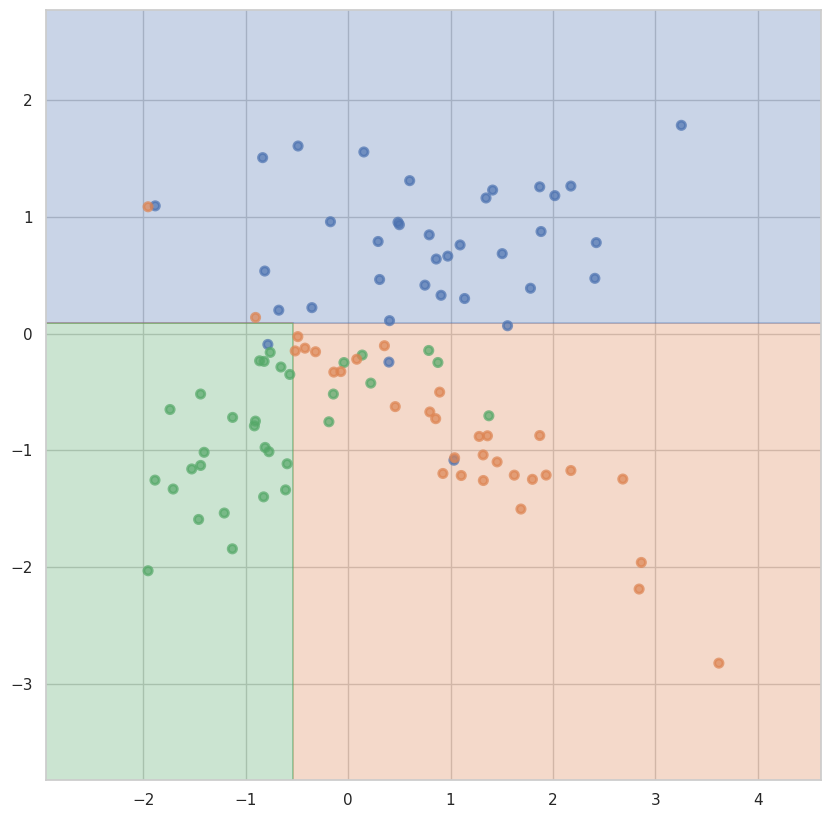

На обучающей для max_depth = 5 и min_samples_leaf = 10: 0.8875
На тестовой для max_depth = 5 и min_samples_leaf = 10: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 11:


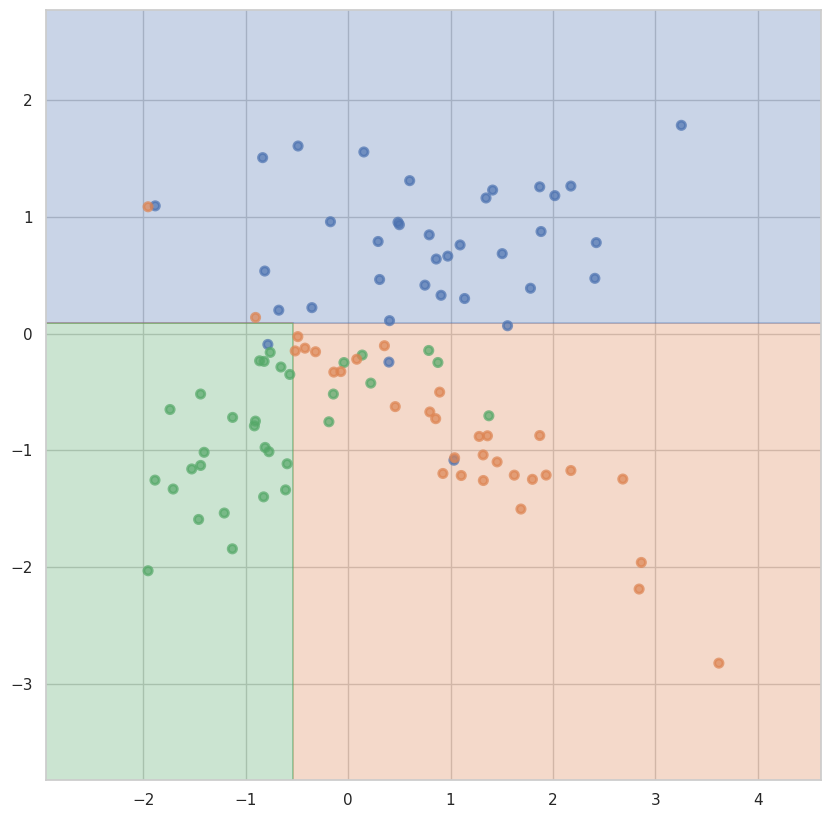

На обучающей для max_depth = 5 и min_samples_leaf = 11: 0.8875
На тестовой для max_depth = 5 и min_samples_leaf = 11: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 12:


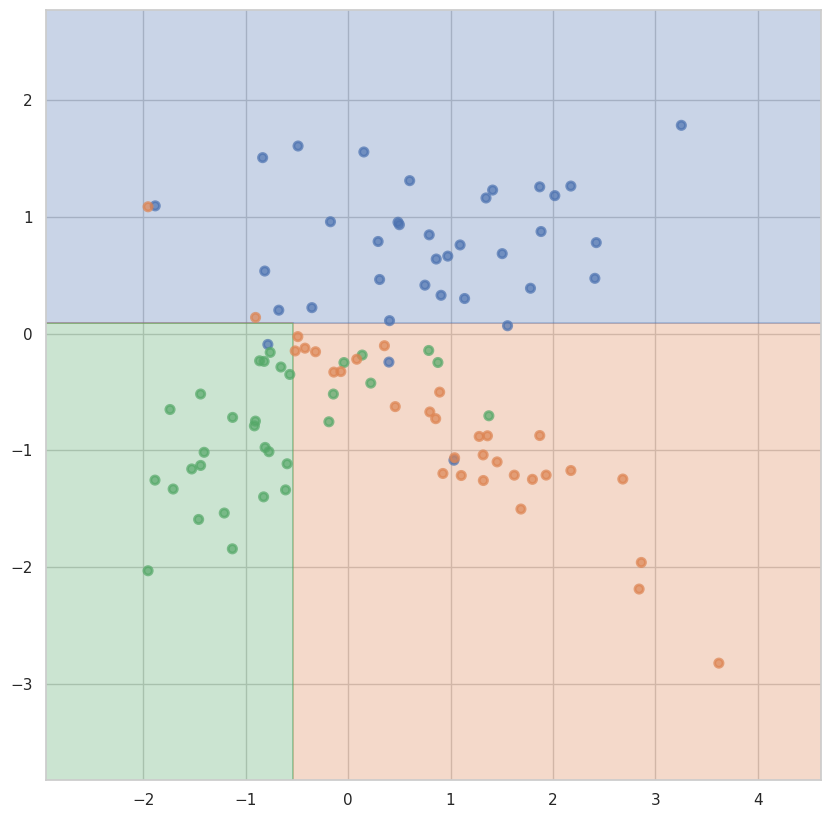

На обучающей для max_depth = 5 и min_samples_leaf = 12: 0.8875
На тестовой для max_depth = 5 и min_samples_leaf = 12: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 13:


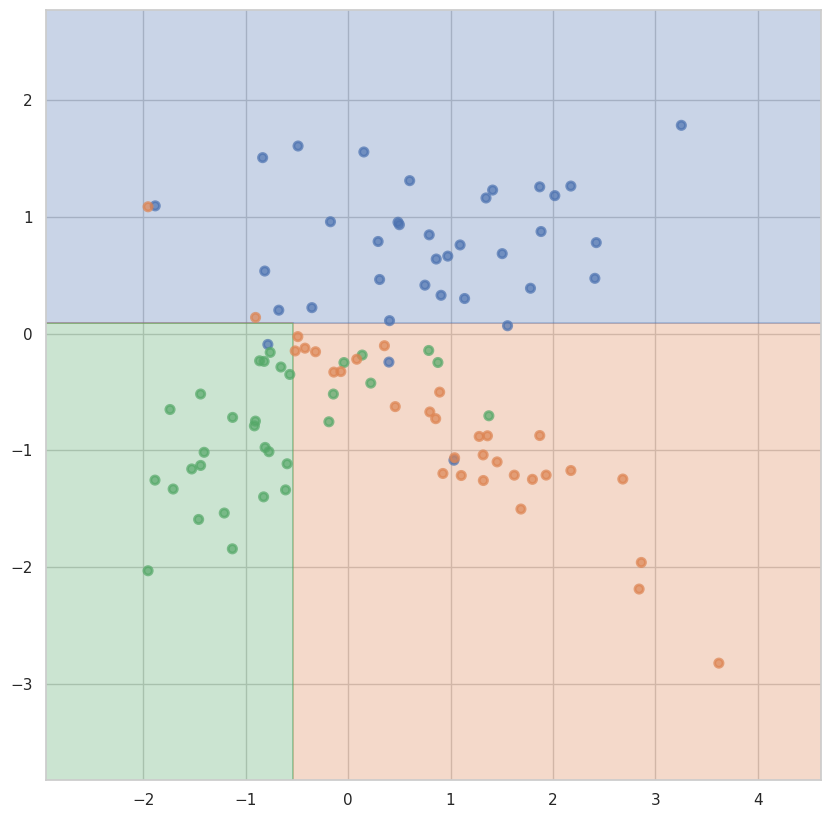

На обучающей для max_depth = 5 и min_samples_leaf = 13: 0.8875
На тестовой для max_depth = 5 и min_samples_leaf = 13: 0.75
Разделяющая поверхность для max_depth = 5 и min_samples_leaf = 14:


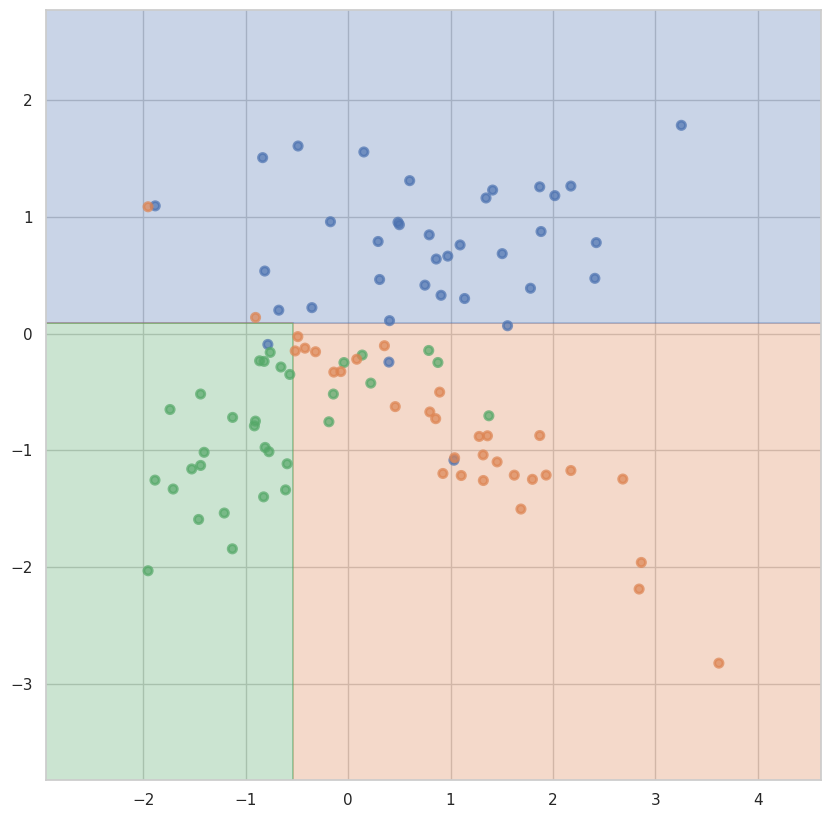

На обучающей для max_depth = 5 и min_samples_leaf = 14: 0.8875
На тестовой для max_depth = 5 и min_samples_leaf = 14: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 1:


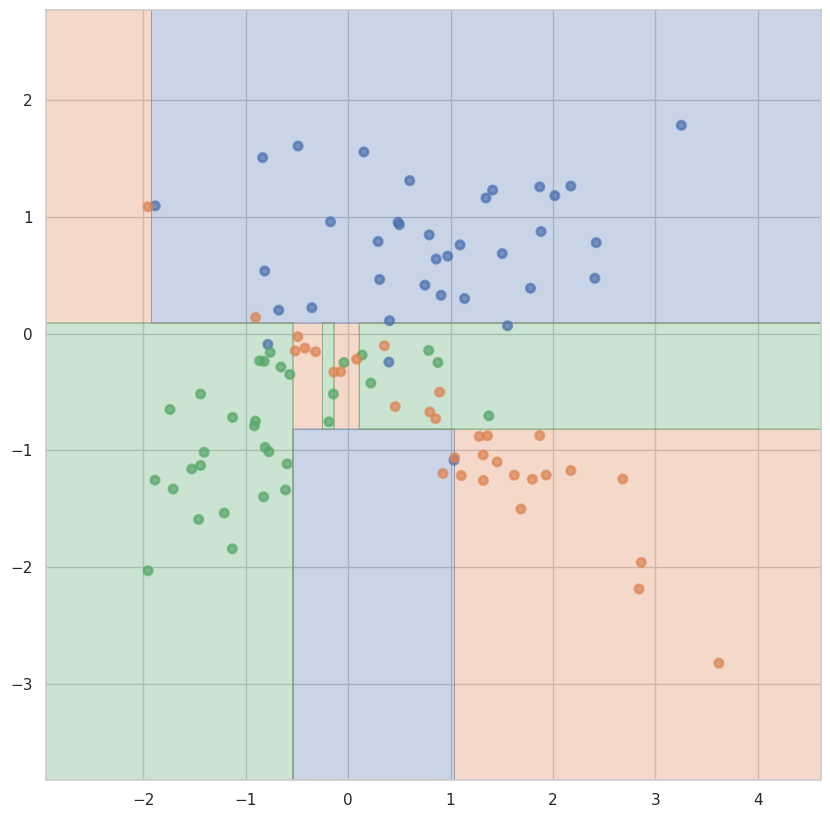

На обучающей для max_depth = 6 и min_samples_leaf = 1: 0.95
На тестовой для max_depth = 6 и min_samples_leaf = 1: 0.65
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 2:


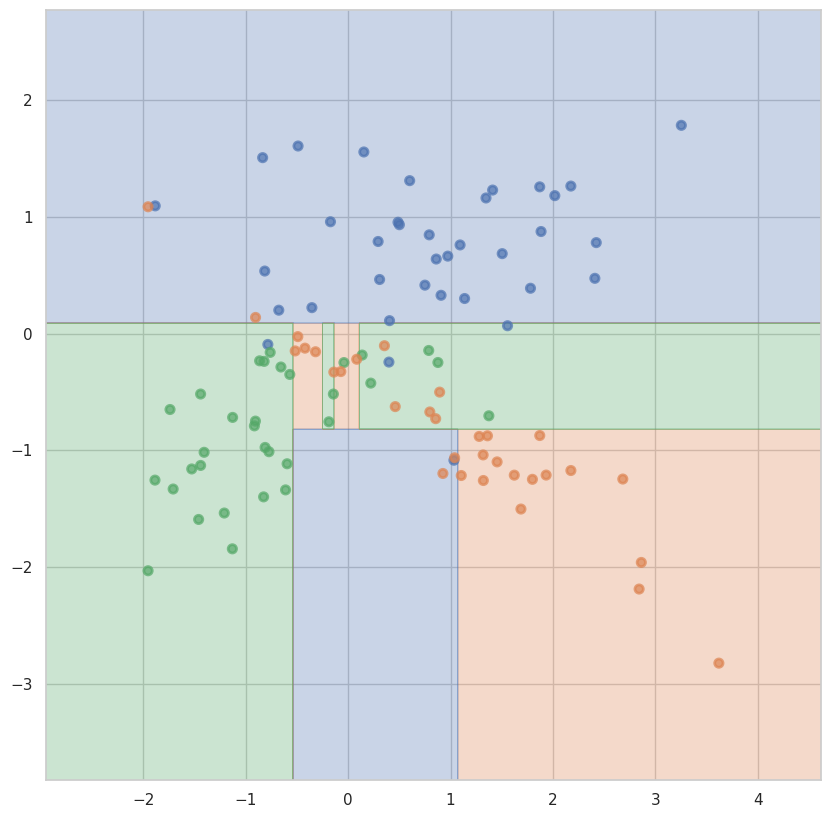

На обучающей для max_depth = 6 и min_samples_leaf = 2: 0.925
На тестовой для max_depth = 6 и min_samples_leaf = 2: 0.65
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 3:


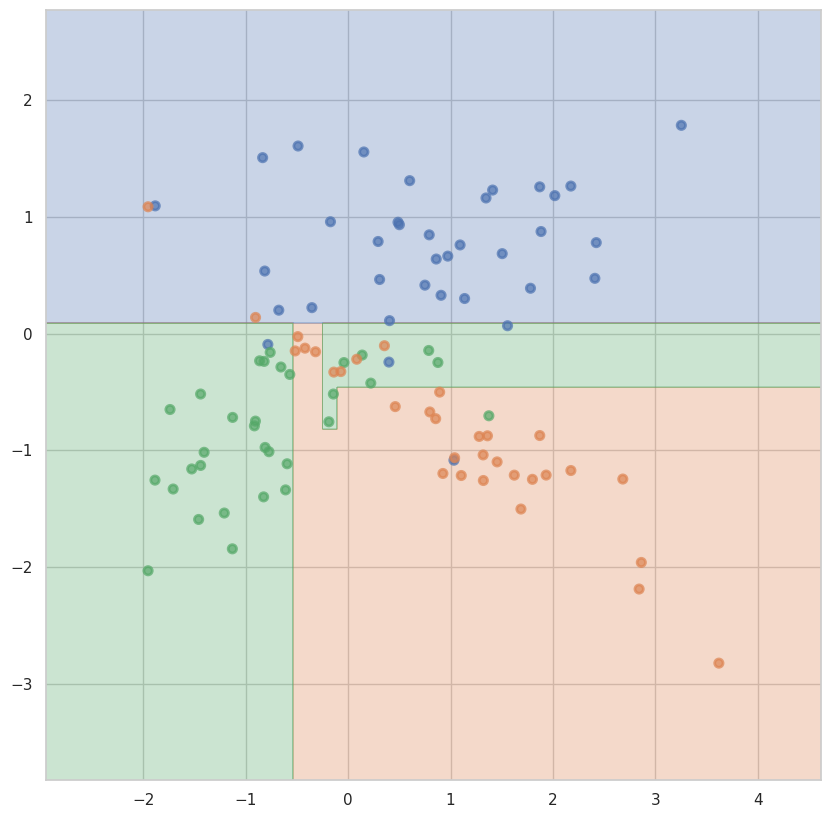

На обучающей для max_depth = 6 и min_samples_leaf = 3: 0.9125
На тестовой для max_depth = 6 и min_samples_leaf = 3: 0.8
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 4:


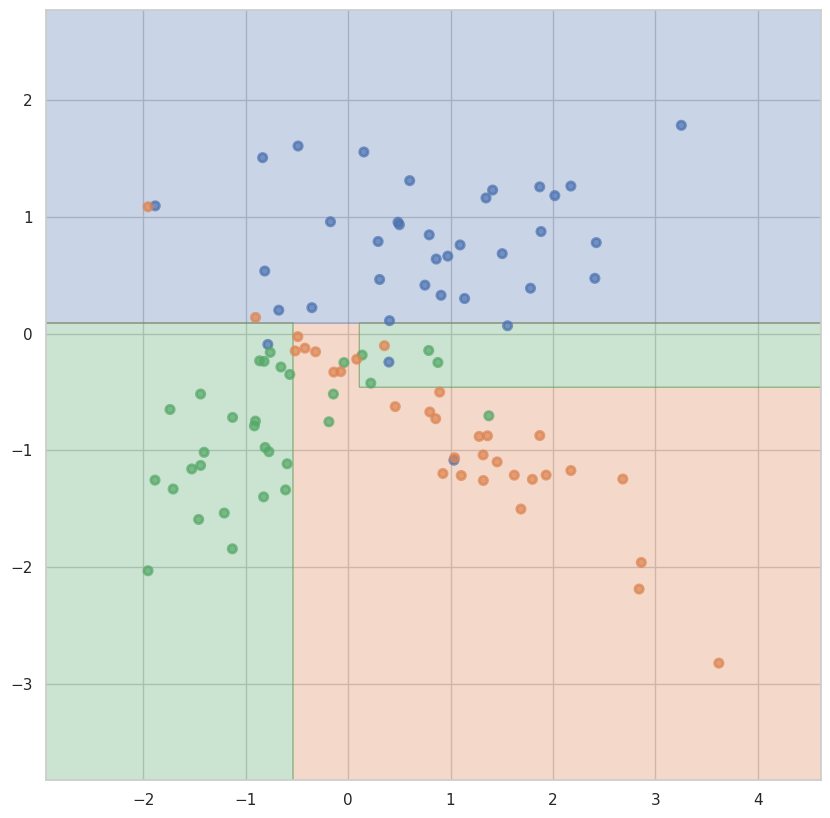

На обучающей для max_depth = 6 и min_samples_leaf = 4: 0.925
На тестовой для max_depth = 6 и min_samples_leaf = 4: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 5:


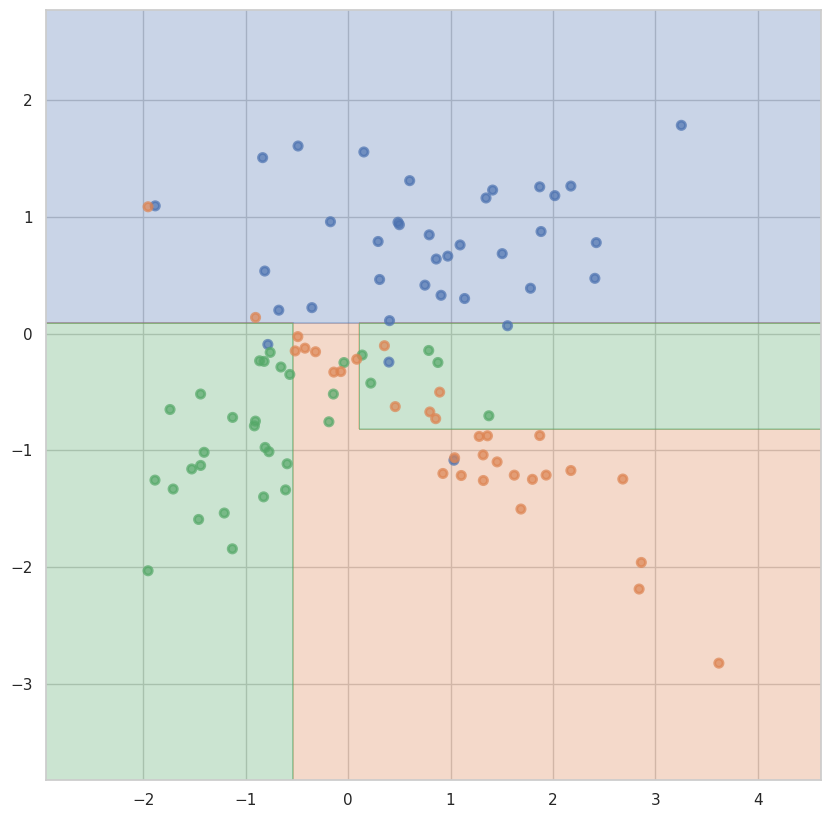

На обучающей для max_depth = 6 и min_samples_leaf = 5: 0.9
На тестовой для max_depth = 6 и min_samples_leaf = 5: 0.7
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 6:


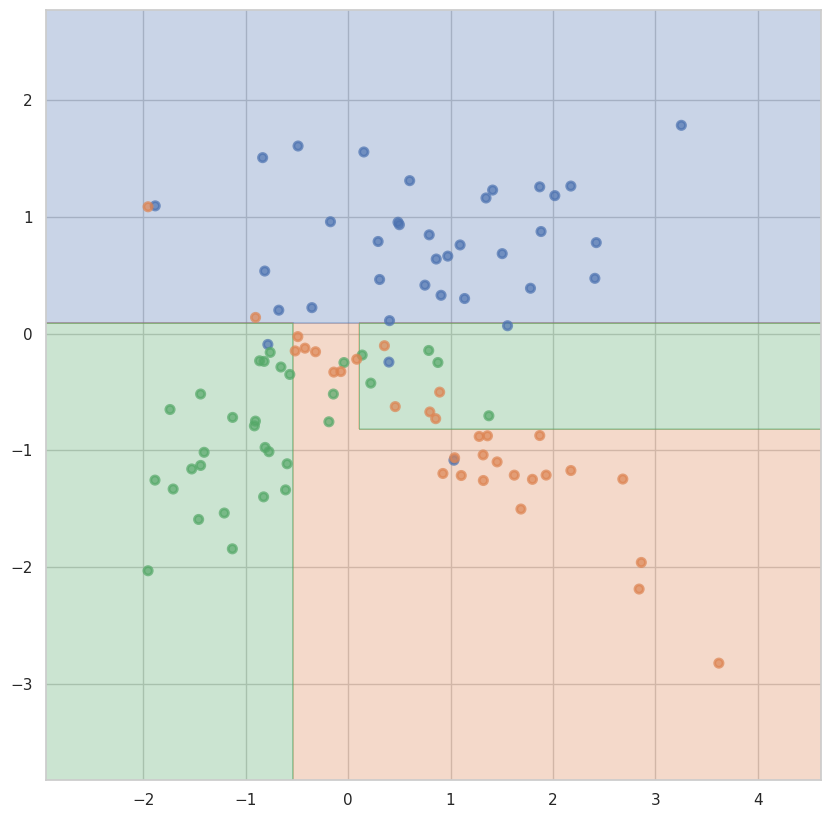

На обучающей для max_depth = 6 и min_samples_leaf = 6: 0.9
На тестовой для max_depth = 6 и min_samples_leaf = 6: 0.7
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 7:


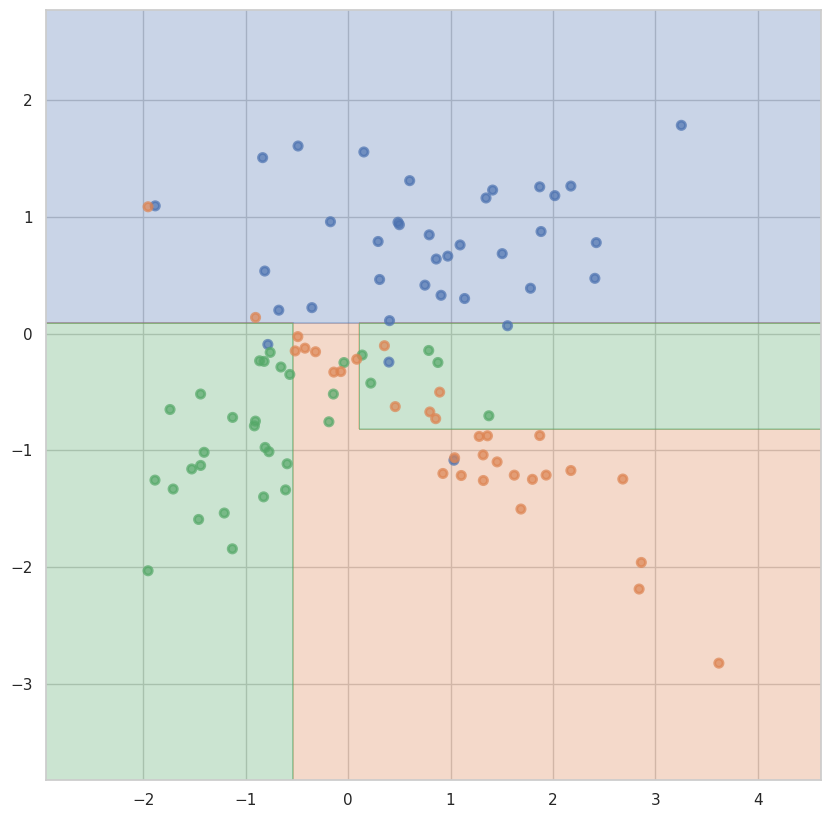

На обучающей для max_depth = 6 и min_samples_leaf = 7: 0.9
На тестовой для max_depth = 6 и min_samples_leaf = 7: 0.7
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 8:


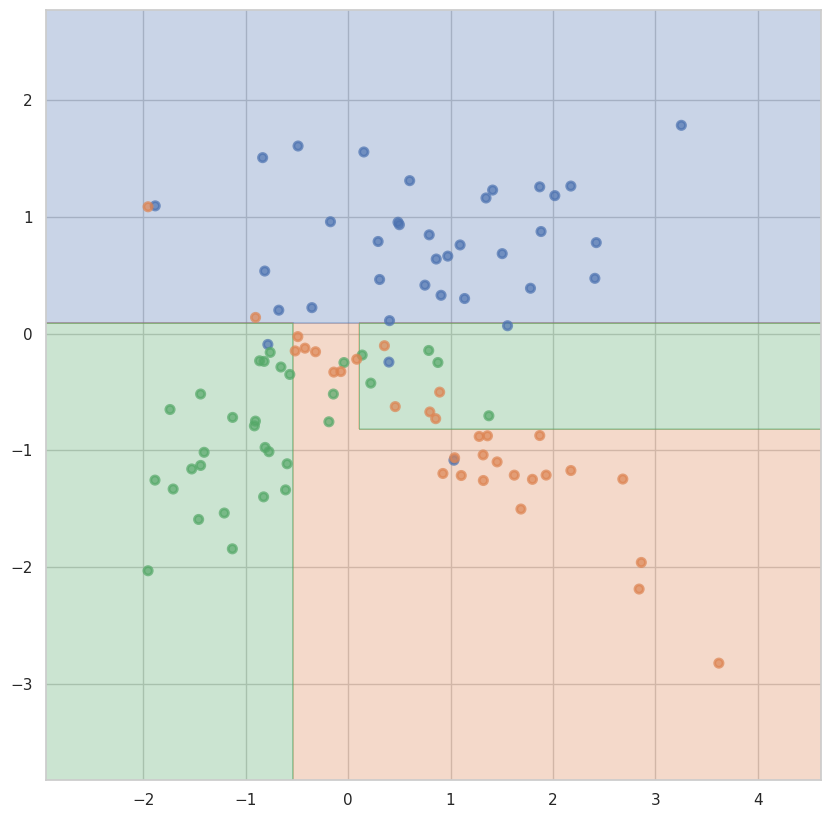

На обучающей для max_depth = 6 и min_samples_leaf = 8: 0.9
На тестовой для max_depth = 6 и min_samples_leaf = 8: 0.7
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 9:


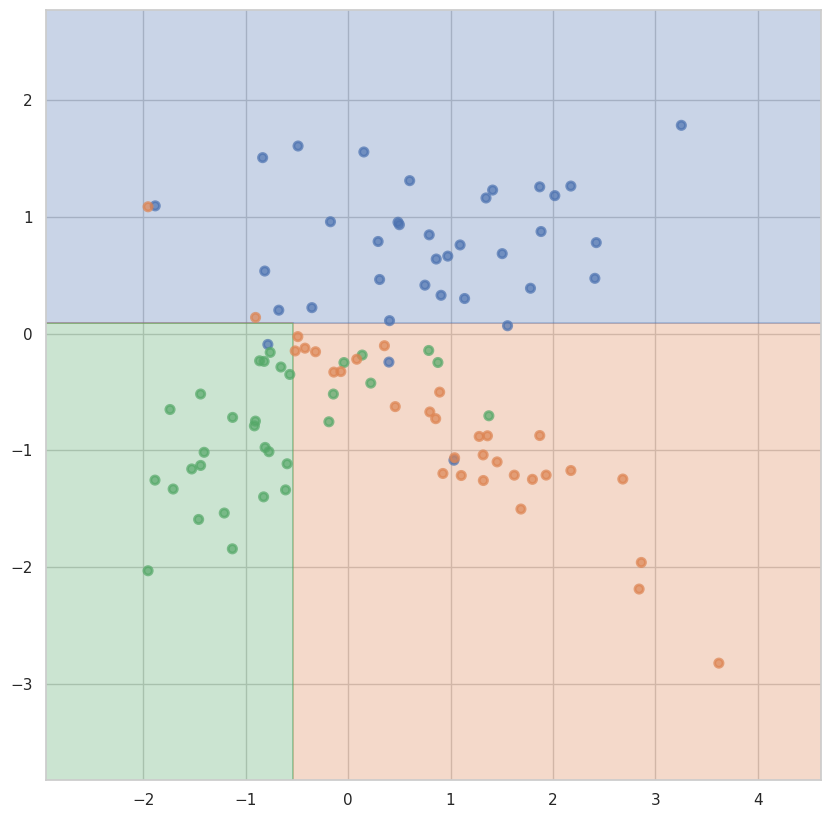

На обучающей для max_depth = 6 и min_samples_leaf = 9: 0.8875
На тестовой для max_depth = 6 и min_samples_leaf = 9: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 10:


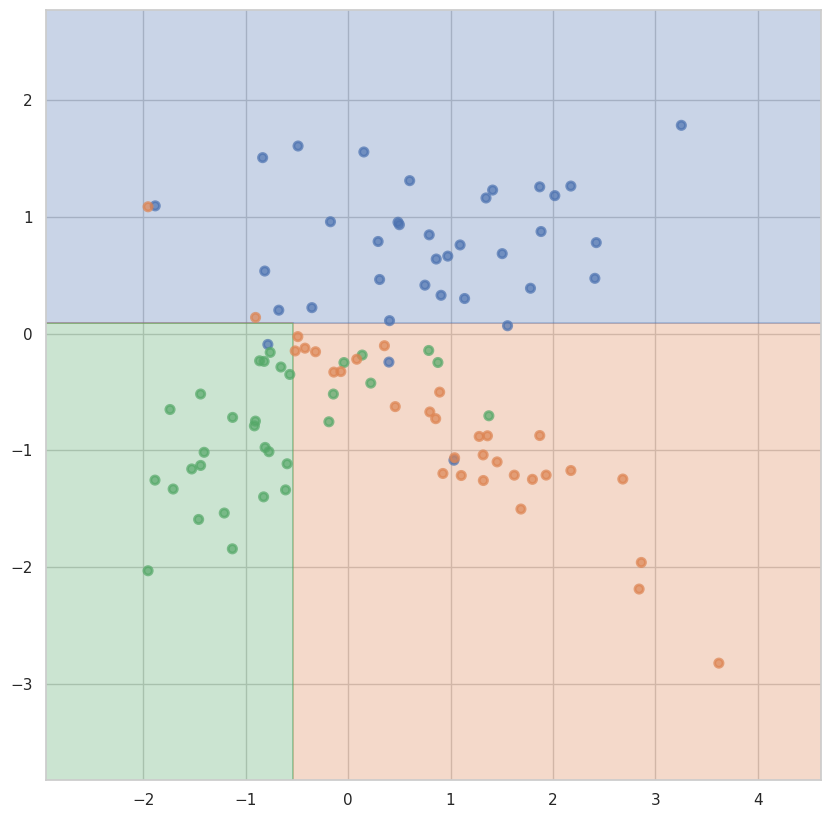

На обучающей для max_depth = 6 и min_samples_leaf = 10: 0.8875
На тестовой для max_depth = 6 и min_samples_leaf = 10: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 11:


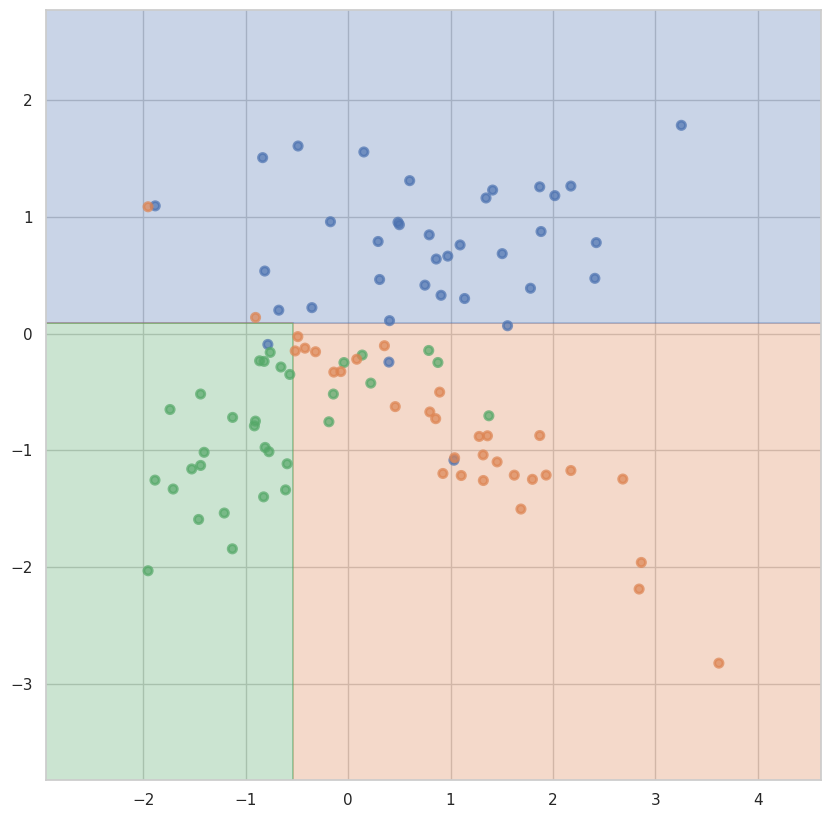

На обучающей для max_depth = 6 и min_samples_leaf = 11: 0.8875
На тестовой для max_depth = 6 и min_samples_leaf = 11: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 12:


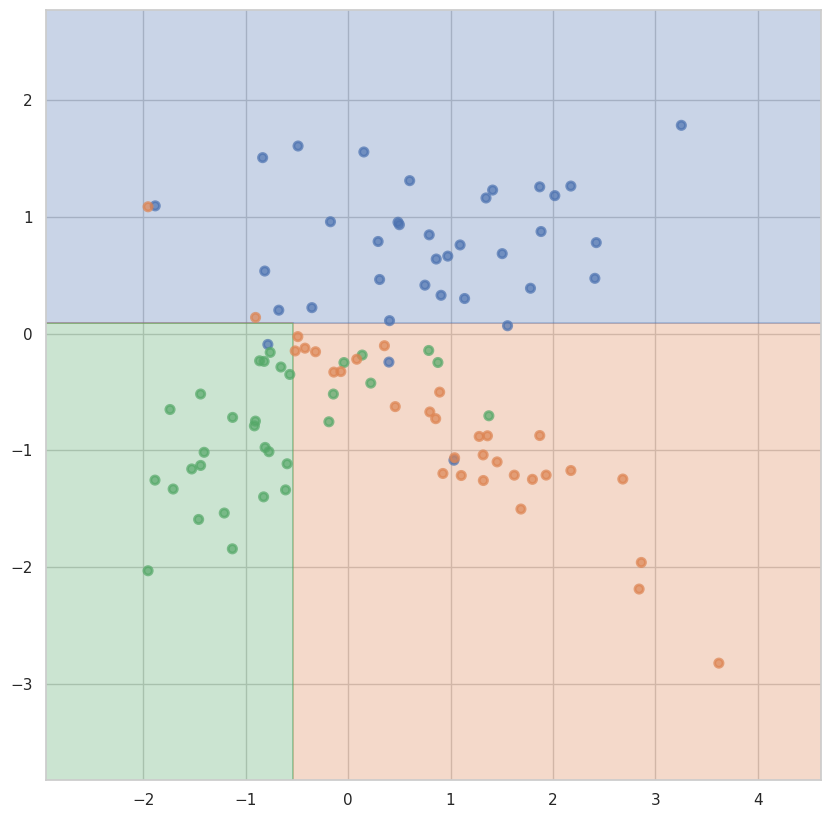

На обучающей для max_depth = 6 и min_samples_leaf = 12: 0.8875
На тестовой для max_depth = 6 и min_samples_leaf = 12: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 13:


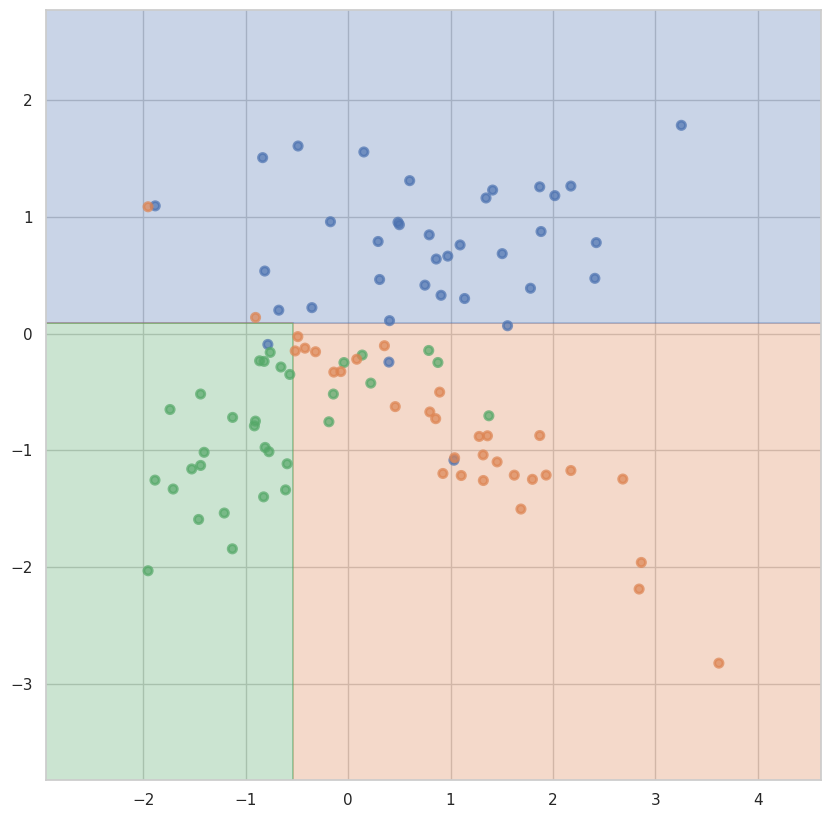

На обучающей для max_depth = 6 и min_samples_leaf = 13: 0.8875
На тестовой для max_depth = 6 и min_samples_leaf = 13: 0.75
Разделяющая поверхность для max_depth = 6 и min_samples_leaf = 14:


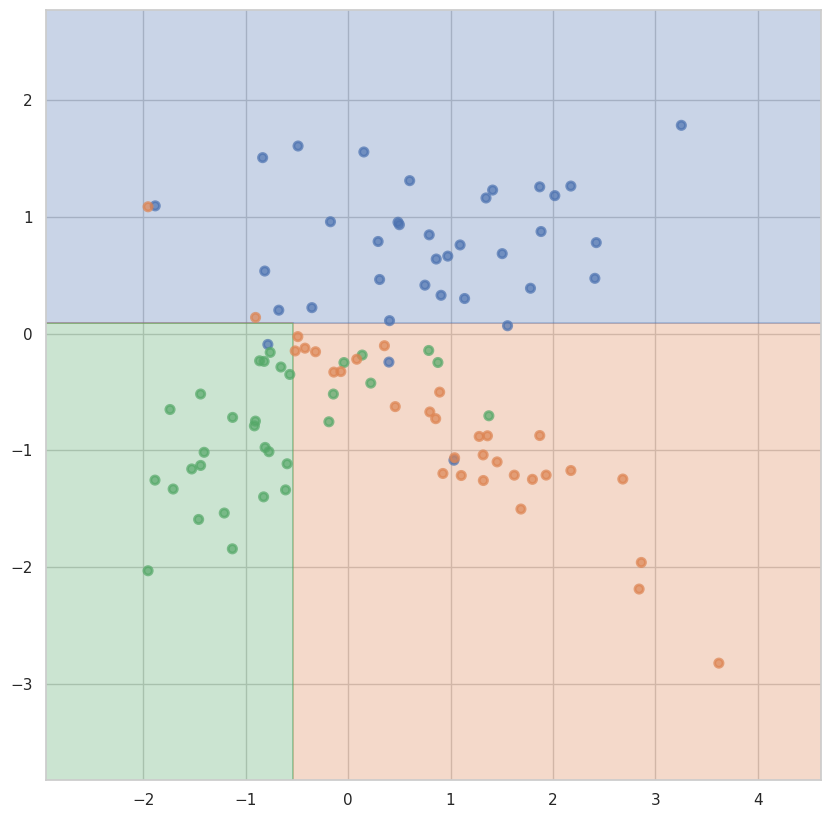

На обучающей для max_depth = 6 и min_samples_leaf = 14: 0.8875
На тестовой для max_depth = 6 и min_samples_leaf = 14: 0.75


In [753]:
best_parameters = [{} for i in range(len(datasets))]
for i in range(len(datasets)):
    best_parameters[i] = {
        'max_depth': 0,
        'min_samples_leaf': 0,
        'test_accuracy': 0,
        'train_accuracy': 0
    }
    X, y = datasets[i]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


    for cur_max_depth in range(1, 7):
        for cur_min_samples_leaf in range(1, 15):
            dtc  = DecisionTreeClassifier(max_depth=cur_max_depth, min_samples_leaf=cur_min_samples_leaf).fit(X_train, y_train)
            print(f"Разделяющая поверхность для max_depth = {cur_max_depth} и min_samples_leaf = {cur_min_samples_leaf}:")
            plot_surface(dtc, X, y)
            y_pred_train = dtc.predict(X_train)
            train_accuracy = accuracy_score(y_pred_train, y_train)
            print(f"На обучающей для max_depth = {cur_max_depth} и min_samples_leaf = {cur_min_samples_leaf}:", train_accuracy)


            y_pred_test = dtc.predict(X_test)
            test_accuracy = accuracy_score(y_pred_test, y_test)
            print(f"На тестовой для max_depth = {cur_max_depth} и min_samples_leaf = {cur_min_samples_leaf}:", test_accuracy)

            if test_accuracy > best_parameters[i]['test_accuracy']:
              best_parameters[i] = {
                  'max_depth': cur_max_depth,
                  'min_samples_leaf': cur_min_samples_leaf,
                  'test_accuracy': test_accuracy,
                  'train_accuracy': train_accuracy
              }




In [754]:
for i in range(1, len(best_parameters) + 1):
    print(f"Для {i}-го датасета: ", best_parameters[i - 1])

Для 1-го датасета:  {'max_depth': 4, 'min_samples_leaf': 6, 'test_accuracy': 0.9, 'train_accuracy': 0.9}
Для 2-го датасета:  {'max_depth': 2, 'min_samples_leaf': 1, 'test_accuracy': 1.0, 'train_accuracy': 0.9125}
Для 3-го датасета:  {'max_depth': 6, 'min_samples_leaf': 3, 'test_accuracy': 0.8, 'train_accuracy': 0.9125}


__Ответ:__ В 1м датасете accuracy увеличилось с 0.75 до 0.9, во 2м датасете accuracy уменьшилась с 0.95 до 0.91, в 3м датасете accuracy увеличилось с 0.7 до 0.91. В этот раз деревья 1 и 3 не так переобучались как раньше. На втором датасете дерево легче разделилось, нежели у 1 и 3, поэтому и accuracy на обучающей выборке во втором датасете = 1, accuracy на тестовой у него уменьшилось, так как дерево переобучилось

# 2. Решающие деревья своими руками

В этой части вам нужно реализовать свой класс для обучения решающего дерева в задаче бинарной классификации с возможностью обработки вещественных и категориальных признаков.

__Задание 3. (1.5 балл)__

Реализуйте функцию find_best_split из модуля hw5code.py

Посылка: https://contest.yandex.ru/contest/56884/run-report/102708860/

Ник: Tonya Klimchuk

In [755]:
import numpy as np
from collections import Counter


def find_best_split(feature_vector, target_vector):
    """
    Под критерием Джини здесь подразумевается следующая функция:
    $$Q(R) = -\frac {|R_l|}{|R|}H(R_l) -\frac {|R_r|}{|R|}H(R_r)$$,
    $R$ — множество объектов, $R_l$ и $R_r$ — объекты, попавшие в левое и правое поддерево,
    $H(R) = 1-p_1^2-p_0^2$, $p_1$, $p_0$ — доля объектов класса 1 и 0 соответственно.

    Указания:
    * Пороги, приводящие к попаданию в одно из поддеревьев пустого множества объектов, не рассматриваются.
    * В качестве порогов, нужно брать среднее двух сосдених (при сортировке) значений признака
    * Поведение функции в случае константного признака может быть любым.
    * При одинаковых приростах Джини нужно выбирать минимальный сплит.
    * За наличие в функции циклов балл будет снижен. Векторизуйте! :)

    :param feature_vector: вещественнозначный вектор значений признака
    :param target_vector: вектор классов объектов,  len(feature_vector) == len(target_vector)

    :return thresholds: отсортированный по возрастанию вектор со всеми возможными порогами, по которым объекты можно
     разделить на две различные подвыборки, или поддерева
    :return ginis: вектор со значениями критерия Джини для каждого из порогов в thresholds len(ginis) == len(thresholds)
    :return threshold_best: оптимальный порог (число)
    :return gini_best: оптимальное значение критерия Джини (число)
    """
    # ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

    sorted_indexes = np.argsort(feature_vector)
    sorted_features = np.array(feature_vector)[sorted_indexes.astype(int)]
    target_vector = np.array(target_vector)[sorted_indexes.astype(int)]

    unique_features, counts = np.unique(sorted_features, return_counts=True)

    thresholds = (unique_features[1:] + unique_features[:-1]) / 2

    R_size = len(target_vector)

    p_1_left = np.cumsum(target_vector[0:R_size - 1]) / np.arange(1, R_size)
    p_1_right = (np.cumsum(target_vector[R_size - 1:0:-1]) / np.arange(1, R_size))[::-1]

    h_left = 1 - p_1_left ** 2 - (1 - p_1_left) ** 2
    h_right = 1 - p_1_right ** 2 - (1 - p_1_right) ** 2

    ginis = -(np.arange(1, R_size) / R_size) * h_left - (np.arange(R_size - 1, 0, -1) / R_size) * h_right

    indexes_gini = np.searchsorted(sorted_features, thresholds, 'right')
    ginis = ginis[indexes_gini - 1]

    best_split_index = np.argmax(ginis)
    gini_best = ginis[best_split_index]
    threshold_best = thresholds[best_split_index]

    return thresholds, ginis, threshold_best, gini_best

__Задание 4. (0.5 балла)__

Загрузите таблицу [students.csv](https://github.com/esokolov/ml-course-hse/blob/master/2022-fall/homeworks-practice/homework-practice-05-trees/students.csv) (это немного преобразованный датасет [User Knowledge](https://archive.ics.uci.edu/ml/datasets/User+Knowledge+Modeling)). В ней признаки объекта записаны в первых пяти столбцах, а в последнем записана целевая переменная (класс: 0 или 1). Постройте на одном изображении пять кривых "порог — значение критерия Джини" для всех пяти признаков. Отдельно визуализируйте scatter-графики "значение признака — класс" для всех пяти признаков.

In [756]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [757]:
from drive.MyDrive.hw5code import find_best_split

In [758]:
df = pd.read_csv('/content/drive/MyDrive/students.csv')

In [759]:
df.head()

,STG,SCG,STR,LPR,PEG,UNS
0,0.00,0.00,0.00,0.00,0.00,0
1,0.08,0.08,0.10,0.24,0.90,1
2,0.06,0.06,0.05,0.25,0.33,0
3,0.10,0.10,0.15,0.65,0.30,1
4,0.08,0.08,0.08,0.98,0.24,0


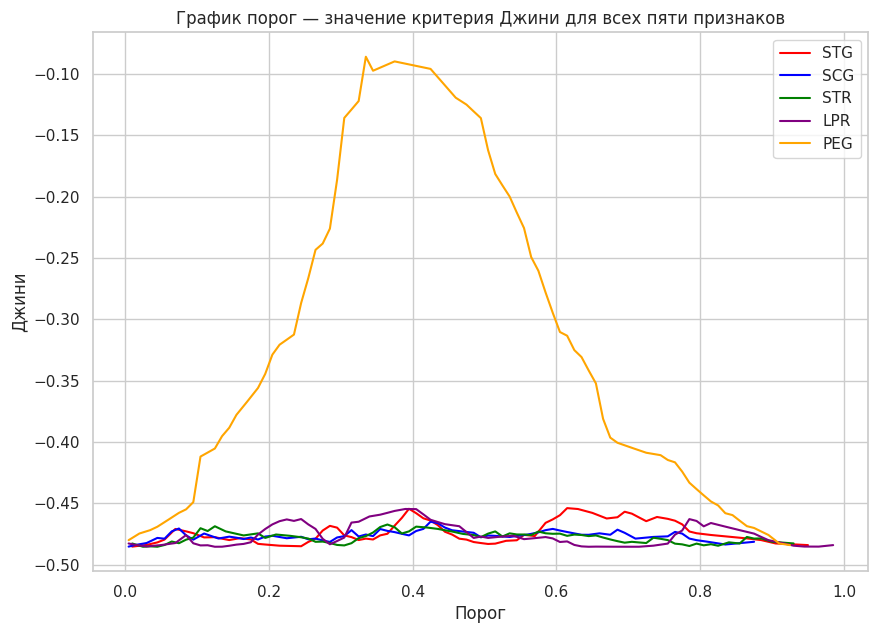

In [760]:
f = plt.figure(figsize=(10, 7))

colors = ['red', 'blue', 'green', 'purple', 'orange']

for i, column in enumerate(df.columns[:-1]):
    thresholds, ginis, threshold_best, gini_best = find_best_split(df[column], df['UNS'])

    sns.lineplot(x=thresholds, y=ginis, color=colors[i], label=column)


plt.title("График порог — значение критерия Джини для всех пяти признаков")
plt.ylabel("Джини")
plt.xlabel("Порог")
plt.show()

In [761]:
def scatter_feature(feature):
    f = plt.figure(figsize=(7, 5))
    plt.scatter(x = df[feature], y = df['UNS'])
    plt.title(f"График для признака {feature}")
    plt.ylabel("Класс")
    plt.xlabel("Значение признака")
    plt.show()

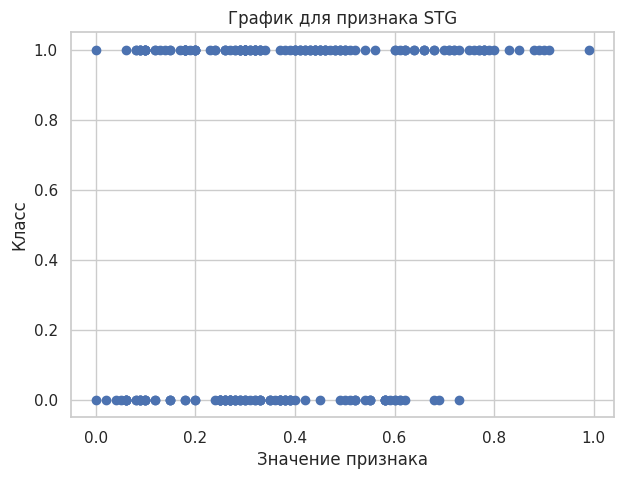

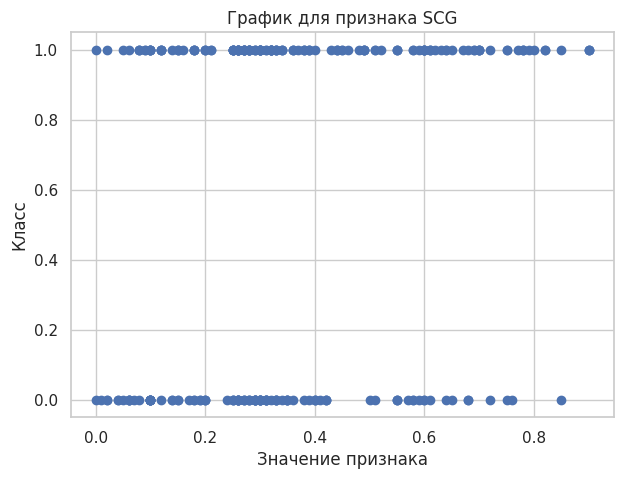

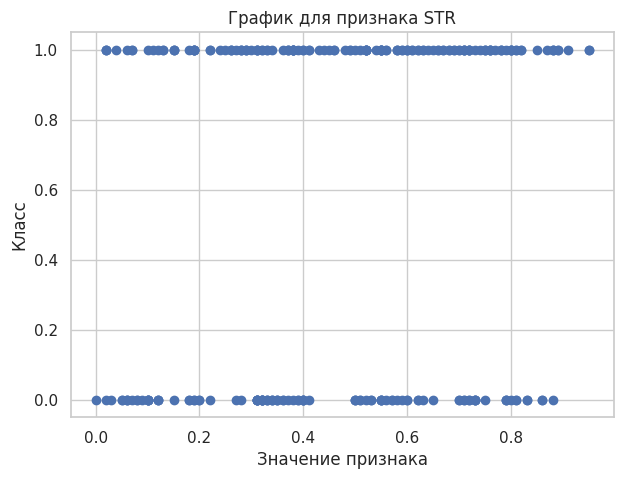

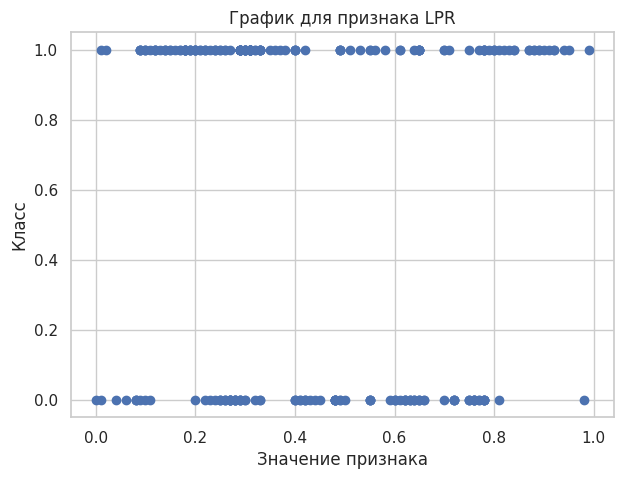

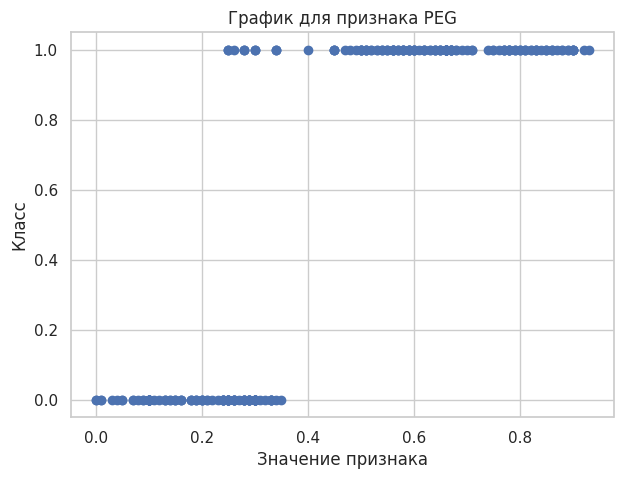

In [762]:
for column in df.columns[:-1]:
    scatter_feature(column)

__Задание 5. (0.5 балла)__

Исходя из кривых значений критерия Джини, по какому признаку нужно производить деление выборки на два поддерева? Согласуется ли этот результат с визуальной оценкой scatter-графиков? Как бы охарактеризовали вид кривой для "хороших" признаков, по которым выборка делится почти идеально? Чем отличаются кривые для признаков, по которым деление практически невозможно?

**Ответ:** Лучше всего делить по признаку PEG, во первых на кривой видно, что для него самые большие значения критерий Джинни, а во вторых у него хороший scatter-график, так как на нем видно, что почти все значений PEG <=0.4 принадлежат к классу 0, а > 0.4 к классу 1, за счет этого выборка делится почти иеально.

Думаю, кривые с "хорошими" признаками имеют резкий спад, а для плохих как можно больше походят на константу, при этом маленькую.
Деление хуже всего, как будто, будет по признаку STR, у него кривая более всего походит на константу и scatter-график указывает на плохое разделение

__Задание 6. (1.5 балла).__

Разберитесь с уже написанным кодом в классе DecisionTree модуля hw5code.py. Найдите ошибки в реализации метода \_fit_node. Напишите функцию \_predict_node.

 Построение дерева осуществляется согласно базовому жадному алгоритму, предложенному в [лекции](https://github.com/esokolov/ml-course-hse/blob/master/2020-fall/lecture-notes/lecture07-trees.pdf) в разделе «Построение дерева». Выбор лучшего разбиения необходимо производить по критерию Джини. Критерий останова: все объекты в листе относятся к одному классу или ни по одному признаку нельзя разбить выборку. Ответ в листе: наиболее часто встречающийся класс в листе. Для категориальных признаков выполняется преобразование, описанное в лекции в разделе «Учет категориальных признаков».

In [763]:
class DecisionTree:
    def __init__(self, feature_types, max_depth=None, min_samples_split=None, min_samples_leaf=None):
        if np.any(list(map(lambda x: x != "real" and x != "categorical", feature_types))):
            raise ValueError("There is unknown feature type")

        self._tree = {}
        self._feature_types = feature_types
        self._max_depth = max_depth
        self._min_samples_split = min_samples_split
        self._min_samples_leaf = min_samples_leaf

    def _fit_node(self, sub_X, sub_y, node, cur_depth):
        if np.all(sub_y == sub_y[0]):
            node["type"] = "terminal"
            node["class"] = [[sub_y[0]]]
            return

        feature_best, threshold_best, gini_best, split = None, None, None, None
        for feature in range(sub_X.shape[1]):
            feature_type = self._feature_types[feature]
            categories_map = {}

            if feature_type == "real":
                feature_vector = sub_X[:, feature]
            elif feature_type == "categorical":
                counts = Counter(sub_X[:, feature])
                clicks = Counter(sub_X[sub_y == 1, feature])
                ratio = {}
                for key, current_count in counts.items():
                    if key in clicks:
                        current_click = clicks[key]
                    else:
                        current_click = 0
                    ratio[key] = current_click / current_count
                sorted_categories = list(map(lambda x: x[0], sorted(ratio.items(), key=lambda x: x[1])))

                categories_map = dict(zip(sorted_categories, list(range(len(sorted_categories)))))

                feature_vector = np.array(list(map(lambda x: categories_map[x], sub_X[:, feature])))
            else:
                raise ValueError

            if len(feature_vector) == 1:
                continue

            if np.all(feature_vector == feature_vector[0]):
                continue

            _, _, threshold, gini = find_best_split(feature_vector, sub_y)
            if gini_best is None or gini > gini_best:
                feature_best = feature
                gini_best = gini
                split = feature_vector < threshold

                if feature_type == "real":
                    threshold_best = threshold
                elif feature_type == "categorical":
                    threshold_best = list(map(lambda x: x[0],
                                              filter(lambda x: x[1] < threshold, categories_map.items())))
                else:
                    raise ValueError

        if feature_best is None:
            node["type"] = "terminal"
            node["class"] = Counter(sub_y).most_common(1)
            return

        if self._max_depth and cur_depth == self._max_depth:
            node["type"] = "terminal"
            node["class"] = Counter(sub_y).most_common(1)
            return
        if self._min_samples_split and len(sub_X) < self._min_samples_split:
            node["type"] = "terminal"
            node["class"] = Counter(sub_y).most_common(1)
            return
        if self._min_samples_leaf and len(sub_X) == self._min_samples_leaf:
            node["type"] = "terminal"
            node["class"] = Counter(sub_y).most_common(1)
            return

        node["type"] = "nonterminal"

        node["feature_split"] = feature_best
        if self._feature_types[feature_best] == "real":
            node["threshold"] = threshold_best
        elif self._feature_types[feature_best] == "categorical":
            node["categories_split"] = threshold_best
        else:
            raise ValueError
        node["left_child"], node["right_child"] = {}, {}
        self._fit_node(sub_X[split], sub_y[split], node["left_child"], cur_depth + 1)
        self._fit_node(sub_X[np.logical_not(split)], sub_y[np.logical_not(split)], node["right_child"], cur_depth + 1)

    def _predict_node(self, x, node):
        # ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
        if node["type"] == "terminal":
            return node["class"][0][0]

        if self._feature_types[node["feature_split"]] == "real":
            if x[node["feature_split"]] < node["threshold"]:
                return self._predict_node(x, node["left_child"])
            else:
                return self._predict_node(x, node["right_child"])
        elif self._feature_types[node["feature_split"]] == "categorical":
            if x[node["feature_split"]] in node["categories_split"]:
                return self._predict_node(x, node["left_child"])
            else:
                return self._predict_node(x, node["right_child"])
        else:
            raise ValueError

    def fit(self, X, y):
        self._fit_node(X, y, self._tree, 0)

    def predict(self, X):
        predicted = []
        for x in X:
            predicted.append(self._predict_node(x, self._tree))
        return np.array(predicted)

    def get_params(self, deep=False):
        return {'feature_types': self._feature_types}


__Задание 7. (0.5 балла)__

Протестируйте свое решающее дерево на датасете [mushrooms](https://archive.ics.uci.edu/ml/datasets/Mushroom). Вам нужно скачать таблицу agaricus-lepiota.data (лежит на гитхабе вместе с заданием), прочитать ее с помощью pandas, применить к каждому столбцу LabelEncoder (из sklearn), чтобы преобразовать строковые имена категорий в натуральные числа. Первый столбец — это целевая переменная (e — edible, p — poisonous) Мы будем измерять качество с помощью accuracy, так что нам не очень важно, что будет классом 1, а что — классом 0. Обучите решающее дерево на половине случайно выбранных объектов (признаки в датасете категориальные) и сделайте предсказания для оставшейся половины. Вычислите accuracy.

У вас должно получиться значение accuracy, равное единице (или очень близкое к единице), и не очень глубокое дерево.

In [764]:
# from drive.MyDrive.hw5code import DecisionTree

In [765]:
### ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
agaricus_lepiota_df = pd.read_csv('/content/drive/MyDrive/mushroom/agaricus-lepiota.data')

In [766]:
agaricus_lepiota_df.head()

,p,x,s,n,t,p.1,f,c,n.1,k,...,s.2,w,w.1,p.2,w.2,o,p.3,k.1,s.3,u
0,e,x,s,y,t,a,f,c,b,k,...,s,w,w,p,w,o,p,n,n,g
1,e,b,s,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,n,m
2,p,x,y,w,t,p,f,c,n,n,...,s,w,w,p,w,o,p,k,s,u
3,e,x,s,g,f,n,f,w,b,k,...,s,w,w,p,w,o,e,n,a,g
4,e,x,y,y,t,a,f,c,b,n,...,s,w,w,p,w,o,p,k,n,g


In [767]:
from sklearn.preprocessing import LabelEncoder

In [768]:
le = LabelEncoder()
agaricus_lepiota_df['p'] = (agaricus_lepiota_df['p'] == 'p')*1
df_encoded = agaricus_lepiota_df.apply(le.fit_transform)
X = df_encoded.drop('p', axis = 1)
y = df_encoded['p']

In [769]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

In [770]:
X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

In [771]:
feature_types = np.full((X_train.shape[1]), 'categorical')
dt = DecisionTree(feature_types)

dt.fit(X_train, y_train)
y_pred_test = dt.predict(X_test)
print("Accuracy: ", accuracy_score(y_test, y_pred_test))

Accuracy:  1.0


__Задание 8. (бонус, 1 балл)__

Реализуйте в классе DecisionTree поддержку параметров max_depth, min_samples_split и min_samples_leaf по аналогии с DecisionTreeClassifier. Постройте графики зависимости качества предсказания в зависимости от этих параметров для набора данных tic-tac-toe (см. следующий пункт).

Посылка: https://contest.yandex.ru/contest/56884/run-report/102737089/

Ник: Tonya Klimchuk

In [772]:
url = 'https://github.com/esokolov/ml-course-hse/blob/master/2023-fall/homeworks-practice/homework-practice-05-trees/tic-tac-toe-endgame.csv?raw=true'
tic_tac_toe = pd.read_csv(url)
tic_tac_toe.head(3)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10
0,x,x,x,x,o,o,x,o,o,positive
1,x,x,x,x,o,o,o,x,o,positive
2,x,x,x,x,o,o,o,o,x,positive


In [773]:
le = LabelEncoder()
tic_tac_toe['V10'] = (tic_tac_toe['V10'] == 'positive')*1
df_encoded = tic_tac_toe.apply(le.fit_transform)
X = df_encoded.drop('V10', axis = 1)
y = df_encoded['V10']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

scores_depth = {}

feature_types = np.full((X.shape[1]), 'categorical')

for max_depth in np.arange(1, 25):

    dt = DecisionTree(feature_types, max_depth = max_depth)
    dt.fit(X_train, y_train)
    y_pred_test = dt.predict(X_test)
    scores_depth[max_depth] = accuracy_score(y_test, y_pred_test)


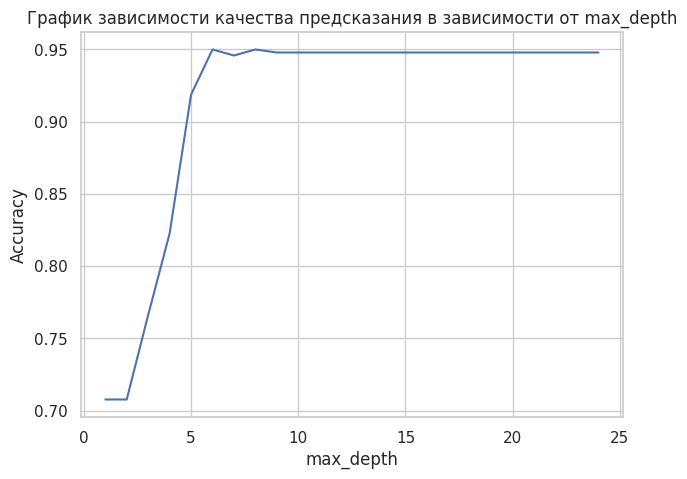

In [774]:
f = plt.figure(figsize=(7, 5))

sns.lineplot(data = scores_depth)

plt.title("График зависимости качества предсказания в зависимости от max_depth")
plt.ylabel("Accuracy")
plt.xlabel("max_depth")
plt.show()

In [775]:
scores_samples_split = {}
for min_samples_split in np.arange(1, 25):

    dt = DecisionTree(feature_types, min_samples_split = min_samples_split)
    dt.fit(X_train, y_train)
    y_pred_test = dt.predict(X_test)
    scores_samples_split[min_samples_split] = accuracy_score(y_test, y_pred_test)

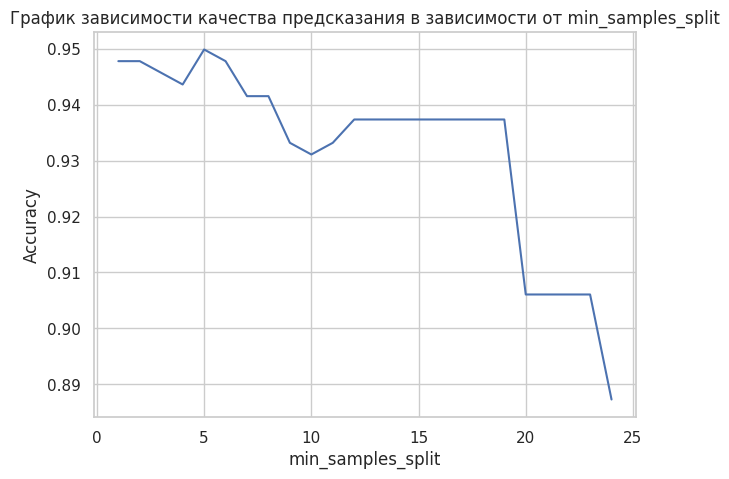

In [776]:
f = plt.figure(figsize=(7, 5))

sns.lineplot(data = scores_samples_split)

plt.title("График зависимости качества предсказания в зависимости от min_samples_split")
plt.ylabel("Accuracy")
plt.xlabel("min_samples_split")
plt.show()

In [777]:
scores_samples_leaf = {}
for min_samples_leaf in np.arange(1, 30):

    dt = DecisionTree(feature_types, min_samples_leaf = min_samples_leaf)
    dt.fit(X_train, y_train)
    y_pred_test = dt.predict(X_test)
    scores_samples_leaf[min_samples_leaf] = accuracy_score(y_test, y_pred_test)

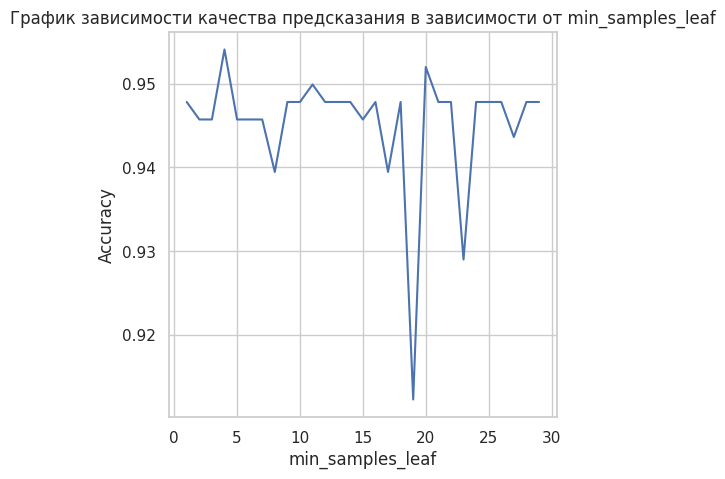

In [778]:
f = plt.figure(figsize=(5, 5))

sns.lineplot(data = scores_samples_leaf)

plt.title("График зависимости качества предсказания в зависимости от min_samples_leaf")
plt.ylabel("Accuracy")
plt.xlabel("min_samples_leaf")
plt.show()

__Задание 9. (2 балла)__

Загрузите следующие наборы данных (напомним, что pandas умеет загружать файлы по url, в нашем случае это файл \*.data), предварительно ознакомившись с описанием признаков и целевой переменной в каждом из них (она записаны в Data Folder, в файле *.names):
* [mushrooms](https://archive.ics.uci.edu/ml/datasets/Mushroom) (загрузили в предыдущем пункте, классы записаны в нулевом столбце)
* [tic-tac-toe](https://archive.ics.uci.edu/ml/datasets/Tic-Tac-Toe+Endgame) (классы записаны в последнем столбце, датасет лежит на гитхабе вместе с заданием)
* [cars](https://archive.ics.uci.edu/ml/datasets/Car+Evaluation) (классы записаны в последнем столбце, считаем что unacc, acc — это класс 0, good, vgood — класс 1)
* [nursery](https://archive.ics.uci.edu/ml/datasets/Nursery) (классы записаны в последнем столбце, считаем, что not_recom и recommend — класс 0, very_recom, priority, spec_prior — класс 1).

Закодируйте категориальные признаки, использовав LabelEncoder. С помощью cross_val_score (cv=10) оцените accuracy на каждом из этих наборов данных следующих алгоритмов:
* DecisionTree, считающий все признаки вещественными
* DecisionTree, считающий все признаки категориальными
* DecisionTree, считающий все признаки вещественными + one-hot-encoding всех признаков
* DecisionTreeClassifier из sklearn. Запишите результат в pd.DataFrame (по строкам — наборы данных, по столбцам — алгоритмы).

Рекомендации:
* Чтобы cross_val_score вычисляла точность, нужно передать scoring=make_scorer(accuracy_score), обе фукнции из sklearn.metrics.
* Если вам позволяет память (а она скорее всего позволяет), указывайте параметр sparse=False в OneHotEncoder (если вы, конечно, используете его). Иначе вам придется добиваться того, чтобы ваша реализация дерева умела работать с разреженными матрицами (что тоже, в целом, не очень сложно).

In [779]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer

____mushrooms:____ DecisionTree, считающий все признаки вещественными

In [780]:
results = {}

In [781]:
agaricus_lepiota_df = pd.read_csv('/content/drive/MyDrive/mushroom/agaricus-lepiota.data')

agaricus_lepiota_df['p'] = (agaricus_lepiota_df['p'] == 'p')*1
le = LabelEncoder()
df_encoded = agaricus_lepiota_df.apply(le.fit_transform)
X = np.array(df_encoded.drop('p', axis = 1))
y = np.array(df_encoded['p'])

feature_types = np.full((X.shape[1]), 'real')

dt = DecisionTree(feature_types)
accuracy_mushrooms_real = cross_val_score(dt, X, y, cv=10, scoring=make_scorer(accuracy_score))

print("Accuracy mushrooms все вещественные: ", np.mean(accuracy_mushrooms_real))
results['mushrooms'] = {
    'all real': np.mean(accuracy_mushrooms_real)
}


Accuracy mushrooms все вещественные:  0.9992610837438424


____mushrooms:____ DecisionTree, считающий все признаки категориальными

In [782]:
feature_types = np.full((X.shape[1]), 'categorical')

dt = DecisionTree(feature_types)
accuracy_mushrooms_categ = cross_val_score(dt, X, y, cv=10, scoring=make_scorer(accuracy_score))

print("Accuracy mushrooms все категориальные: ", np.mean(accuracy_mushrooms_categ))
results['mushrooms']['all categorical'] = np.mean(accuracy_mushrooms_categ)

Accuracy mushrooms все категориальные:  1.0


____mushrooms:____ DecisionTree, считающий все признаки вещественными + one-hot-encoding всех признаков

In [783]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [784]:
X = df_encoded.drop('p', axis = 1)
y = np.array(df_encoded['p'])

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(sparse=False), agaricus_lepiota_df.columns[1::])
])

X = column_transformer.fit_transform(X)

X = np.array(X)

feature_types = np.full((X.shape[1]), 'real')

dt = DecisionTree(feature_types)
accuracy_mushrooms_one_hot = cross_val_score(dt, X, y, cv=10, scoring=make_scorer(accuracy_score))

print("Accuracy mushrooms все вещественные + one-hot-encoding: ", np.mean(accuracy_mushrooms_one_hot))
results['mushrooms']['all real + one-hot'] = np.mean(accuracy_mushrooms_one_hot)


Accuracy mushrooms все вещественные + one-hot-encoding:  0.9996305418719211


____mushrooms:____ DecisionTreeClassifier из sklearn

In [785]:
X = np.array(df_encoded.drop('p', axis = 1))
y = np.array(df_encoded['p'])

dt = DecisionTreeClassifier()
accuracy_mushrooms_classif = cross_val_score(dt, X, y, cv=10, scoring=make_scorer(accuracy_score))

print("Accuracy mushrooms DecisionTreeClassifier: ", np.mean(accuracy_mushrooms_classif))
results['mushrooms']['DecisionTreeClassifier'] = np.mean(accuracy_mushrooms_classif)

Accuracy mushrooms DecisionTreeClassifier:  0.9582898587606566


____tic-tac-toe:____ DecisionTree, считающий все признаки вещественными

In [786]:
def get_result_for_df(df, target_name, p1_values, df_name, categorical): # оформим все в функцию
    # DecisionTree, считающий все признаки вещественными

    df[target_name] = (df[target_name].isin(p1_values))*1
    le = LabelEncoder()
    df_encoded = df.apply(le.fit_transform)
    X = np.array(df_encoded.drop(target_name, axis = 1))
    y = np.array(df_encoded[target_name])


    feature_types = np.full((X.shape[1]), 'real')

    dt = DecisionTree(feature_types)
    accuracy_all_real = cross_val_score(dt, X, y, cv=10, scoring=make_scorer(accuracy_score))

    print(f"Accuracy {df_name} все вещественные: ", np.mean(accuracy_all_real))
    results[df_name] = {
        'all real': np.mean(accuracy_all_real)
    }


    # DecisionTree, считающий все признаки категориальными
    feature_types = np.full((X.shape[1]), 'categorical')

    dt = DecisionTree(feature_types)
    accuracy_all_categorical = cross_val_score(dt, X, y, cv=10, scoring=make_scorer(accuracy_score))

    print(f"Accuracy {df_name} все категориальные: ", np.mean(accuracy_all_categorical))
    results[df_name]['all categorical'] = np.mean(accuracy_all_categorical)

    # DecisionTree, считающий все признаки вещественными + one-hot-encoding всех признаков

    X = df_encoded.drop(target_name, axis = 1)
    y = np.array(df_encoded[target_name])

    column_transformer = ColumnTransformer([
        ('ohe', OneHotEncoder(sparse=False), categorical)
    ])

    X = column_transformer.fit_transform(X)

    X = np.array(X)

    feature_types = np.full((X.shape[1]), 'real')

    dt = DecisionTree(feature_types)
    accuracy_one_hot = cross_val_score(dt, X, y, cv=10, scoring=make_scorer(accuracy_score))

    print(f"Accuracy {df_name} все вещественные + one-hot-encoding: ", np.mean(accuracy_one_hot))
    results[df_name]['all real + one-hot'] = np.mean(accuracy_one_hot)

    # DecisionTreeClassifier из sklearn
    X = np.array(df_encoded.drop(target_name, axis = 1))
    y = np.array(df_encoded[target_name])

    dt = DecisionTreeClassifier()
    accuracy_classifier = cross_val_score(dt, X, y, cv=10, scoring=make_scorer(accuracy_score))

    print(f"Accuracy {df_name} DecisionTreeClassifier: ", np.mean(accuracy_classifier))
    results[df_name]['DecisionTreeClassifier'] = np.mean(accuracy_classifier)

In [787]:
url = 'https://github.com/esokolov/ml-course-hse/blob/master/2023-fall/homeworks-practice/homework-practice-05-trees/tic-tac-toe-endgame.csv?raw=true'
tic_tac_toe = pd.read_csv(url)
tic_tac_toe.head(3)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10
0,x,x,x,x,o,o,x,o,o,positive
1,x,x,x,x,o,o,o,x,o,positive
2,x,x,x,x,o,o,o,o,x,positive


In [788]:
url = 'https://github.com/esokolov/ml-course-hse/blob/master/2023-fall/homeworks-practice/homework-practice-05-trees/tic-tac-toe-endgame.csv?raw=true'
tic_tac_toe = pd.read_csv(url)

categorical = tic_tac_toe.columns[:-1:]

get_result_for_df(tic_tac_toe, 'V10', ['positive'], 'tic_tac_toe', categorical)


Accuracy tic_tac_toe все вещественные:  0.4675328947368421
Accuracy tic_tac_toe все категориальные:  0.5414583333333333
Accuracy tic_tac_toe все вещественные + one-hot-encoding:  0.5435745614035088
Accuracy tic_tac_toe DecisionTreeClassifier:  0.7821052631578947


In [789]:
url = '/content/drive/MyDrive/car+evaluation/car.data'
cars = pd.read_csv(url)
cars.head(3)

,vhigh,vhigh.1,2,2.1,small,low,unacc
0,vhigh,vhigh,2,2,small,med,unacc
1,vhigh,vhigh,2,2,small,high,unacc
2,vhigh,vhigh,2,2,med,low,unacc


In [790]:
url = '/content/drive/MyDrive/car+evaluation/car.data'
cars = pd.read_csv(url)

categorical = cars.columns[:-1:]

get_result_for_df(cars, 'unacc', ['good', 'vgood'], 'cars', categorical)

Accuracy cars все вещественные:  0.9425998118026616
Accuracy cars все категориальные:  0.9675191558005108
Accuracy cars все вещественные + one-hot-encoding:  0.9217670385804544
Accuracy cars DecisionTreeClassifier:  0.9449522785320607


In [791]:
url = '/content/drive/MyDrive/nursery/nursery.data'
nursery = pd.read_csv(url)
nursery.head(3)

,usual,proper,complete,1,convenient,convenient.1,nonprob,recommended,recommend
0,usual,proper,complete,1,convenient,convenient,nonprob,priority,priority
1,usual,proper,complete,1,convenient,convenient,nonprob,not_recom,not_recom
2,usual,proper,complete,1,convenient,convenient,slightly_prob,recommended,recommend


In [792]:
url = '/content/drive/MyDrive/nursery/nursery.data'
nursery = pd.read_csv(url)

categorical = nursery.columns[:-1:]

get_result_for_df(nursery, 'recommend', ['very_recom', 'priority', 'spec_prior'], 'nursery', categorical)

Accuracy nursery все вещественные:  0.9998456790123458
Accuracy nursery все категориальные:  0.9999228395061728
Accuracy nursery все вещественные + one-hot-encoding:  0.9997685185185186
Accuracy nursery DecisionTreeClassifier:  0.9998456790123458


In [793]:
results_df = pd.DataFrame(results).T
results_df

,all real,all categorical,all real + one-hot,DecisionTreeClassifier
mushrooms,0.999261,1.000000,0.999631,0.958290
tic_tac_toe,0.467533,0.541458,0.543575,0.782105
cars,0.942600,0.967519,0.921767,0.944952
nursery,0.999846,0.999923,0.999769,0.999846


__Задание 10. (1 балла)__

Проанализируйте результаты эксперимента.
Одинаково ли для разных наборов данных ранжируются алгоритмы?
Порассуждайте, почему так происходит.

Обратите внимание на значение признаков в разных наборах данных.
Присутствует ли в результатах какая-то компонента случайности?
Можно ли повлиять на нее и улушить работу алгоритмов?

Посмотрим на значения в некоторых столбцах датасета tic_tac_toe

In [794]:
tic_tac_toe['V1'].value_counts()

x    418
o    335
b    205
Name: V1, dtype: int64

In [795]:
tic_tac_toe['V5'].value_counts()

x    458
o    340
b    160
Name: V5, dtype: int64

In [796]:
tic_tac_toe['V2'].value_counts()

x    378
o    330
b    250
Name: V2, dtype: int64

**Ответ:** Для tic-tac-toe лучшим выбором с точки зрения accuracy оказался DecisionTreeClassifier, в отличие от mushrooms, cars и nursery, где лучшим оказался DecisionTree, считающий все признаки категориальными как раз потому что все признаки и есть категориальные, как написано на сайте. Алгоритмы, считающие признаки вещественными( all real, all real + one-hot), работают хуже в сравнении с all categorical по той же причине, алгоритм может найти несуществующие зависимости между классами из-за кодирования их в близкие  числовые значения.


 Такие плохое результаты относительно остальных в tic-tac-toe может быть связано с неинформативностью признаков в датасете, например в датасете tic-tac-toe в столбце V1, V5 наверняка будут стоять x, так как он ходит первый и это самые частые выборы для первого хода, это можно увидеть в сравнении с клеткой V2, где доля 'x' и 'o' примерно одинакова - 378 и 330.


 Случайность присутсвует благодаря перемешке данных при разбивании на фолды во время кросс-валидации. Ее можно уменьшить, если увеличить количество фолдов, но вместе с этим увеличится и время работы




Вставьте что угодно, описывающее ваши впечатления от этого задания: